In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [2]:
import sys
sys.path.append('/content/gdrive/MyDrive/ACSE-9')

In [3]:
# Python ≥3.5 is required
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20 is required
import sklearn
assert sklearn.__version__ >= "0.20"

# TensorFlow ≥2.0 is required
import tensorflow as tf
from tensorflow import keras
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os

# To plot pretty figures
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

import pandas as pd
import time

In [4]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Found GPU at: /device:GPU:0
Thu Jul  8 14:09:18 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    34W / 250W |    347MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                            

### Loading in the Data

In [5]:
import joblib
pca_compress = joblib.load("/content/gdrive/MyDrive/ACSE-9/pod_coefficients_300.pkl") 
# change all the saving and loading to .pkl -> advantage of faster loading and storing, disadvantage of non-human readable form
# X_train_compressed = np.loadtxt('/content/gdrive/MyDrive/ACSE-9/X_train_pca_300.csv', delimiter=',') 
# X_train_1D = np.loadtxt('/content/gdrive/MyDrive/ACSE-9/X_train_1D_300.csv', delimiter=',')

In [6]:
# print(pca_compress.shape)
# print(X_train_compressed.shape)
# print(X_train_1D.shape)
#pca_compress_sub = pca_compress[:,0:200]

X_train_pca = pca_compress.T
print(X_train_pca.shape)

(300, 243)


In [7]:
print(X_train_pca[0:1])

[[-2.19869855e+02 -4.74973263e+01 -2.86669998e+01  1.50889400e+01
  -1.67679389e+01  1.36460612e+01 -2.44919404e+01  3.95229624e+00
   1.66106606e+01 -2.51733282e+00 -1.46871768e+01  5.84118181e+00
   9.92661008e-01  1.31269585e+01  8.93287069e-01  1.07828648e+01
   4.57485572e+00  2.46544636e+00 -5.56429784e+00  1.50778947e+01
   1.04316567e+01  1.48438342e+01  1.99045740e+01 -8.12533877e+00
  -5.19065515e+00 -3.22252854e+00  2.57334345e+01  2.26990887e+01
   2.31210165e+00 -1.96429933e+01 -1.76883152e+01  3.76853022e+01
  -6.43524884e+00  2.62944454e+00  3.97381485e+00 -1.66533094e+01
  -3.48730712e+01 -2.14147041e+00  7.26695018e+00 -2.14157542e+01
   1.11489499e+01 -6.49812062e+00 -1.98776587e+01  1.69664799e+01
   1.12298919e+01 -2.02249486e+01  1.76139955e+01 -4.99918034e+01
   2.61206900e+01 -1.91272168e+01  1.44488718e+01 -1.62129747e+01
  -9.54098494e+00 -6.80607012e+00 -1.84762006e+01  8.40315392e+00
   2.10678647e+01  1.22548599e+01  6.03393836e+01  1.38046878e+01
   6.79873

In [8]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_pca)*2 -1
np.allclose(X_train_pca, scaler.inverse_transform((X_train_scaled+1)/2))

True

# Create a TensorFlow Dataset and Split it into Batches

In [9]:
def concat_timesteps(X_train, ntimes, step):
    X_train_concat = []
    for i in range(len(X_train) - ntimes*step):
        X_train_concat.append(X_train[i:i+ntimes*step:step])
    return np.array(X_train_concat) 

In [10]:
ntimes = 9  # consecutive times for the GAN
step = 1 # step between times

#X_train_concat = concat_timesteps(X_train_pca, ntimes, step)
X_train_concat = concat_timesteps(X_train_scaled, ntimes, step)
print("X_train_concat: ", np.shape(X_train_concat))
#X_train_concat_flatten = X_train_concat.reshape(X_train_concat.shape[0], codings_size*ntimes )


X_train_4d = X_train_concat.reshape((X_train_concat.shape[0], ntimes, X_train_concat.shape[2], 1))  #(148706, 100, 81, 1)
print("X_train_4d: ", X_train_4d.shape)

X_train_concat:  (291, 9, 243)
X_train_4d:  (291, 9, 243, 1)


In [11]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


In [12]:
BATCH_SIZE = 128
#BATCH_SIZE = 256
#latent_space = 100
#latent_space = 150
latent_space = 243

# Create a tensorflow dataset and split it into batches
train_dataset = tf.data.Dataset.from_tensor_slices(X_train_4d)
# shuffles at random the elements of the dataset
train_dataset = train_dataset.shuffle(len(X_train_4d))
# combines the elements of the dataset into batches
train_dataset = train_dataset.batch(BATCH_SIZE)
for data in train_dataset:
    print(data)
    break


tf.Tensor(
[[[[-0.18168327]
   [-0.77428821]
   [-0.19198097]
   ...
   [-0.01359385]
   [-0.13968914]
   [ 0.63235523]]

  [[-0.2320531 ]
   [-0.77098839]
   [-0.15131154]
   ...
   [ 0.11941822]
   [-0.08052046]
   [-0.3549566 ]]

  [[-0.35219678]
   [-0.75540094]
   [-0.15115217]
   ...
   [-0.32579123]
   [-0.00193524]
   [ 0.28681904]]

  ...

  [[-0.43173361]
   [-0.72517777]
   [-0.08249894]
   ...
   [ 0.29405076]
   [-0.77175518]
   [ 0.12616042]]

  [[-0.34492078]
   [-0.72378071]
   [-0.06009163]
   ...
   [-0.58718906]
   [ 0.61578522]
   [ 0.05848296]]

  [[-0.29475977]
   [-0.71483001]
   [-0.04280882]
   ...
   [ 0.62874443]
   [-0.4879283 ]
   [-0.00939314]]]


 [[[-0.81566995]
   [-0.10013306]
   [ 0.98780487]
   ...
   [-0.20180269]
   [-0.06311702]
   [ 0.42388004]]

  [[-0.84410081]
   [-0.10210738]
   [ 0.93265466]
   ...
   [ 0.46062105]
   [ 0.16848159]
   [-0.41392749]]

  [[-0.81318755]
   [-0.07214823]
   [ 0.96200603]
   ...
   [-0.61272857]
   [-0.38265664]


In [13]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM

You are using a high-RAM runtime!


# Make Generator

In [14]:
# # nSnapshots = 300
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*5*1024, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     # reshaping to a 5x5 image
#     model.add(keras.layers.Reshape((2, 5, 1024)))
    
  
#     model.add(keras.layers.Conv2DTranspose(512, (3, 3), strides=(1, 2), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     #shaping to 5x10 image
#     model.add(keras.layers.Conv2DTranspose(256, (3, 3), strides=(2, 4), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())

#     #shaping to 100x81
#     model.add(keras.layers.Conv2DTranspose(1, (3, 9), strides=(2, 6), output_padding=(0, 0), use_bias=False, activation='tanh'))

#     return model

# # standard DCGAN implemenation
# def make_generator_model():
#   model = tf.keras.Sequential()
#   model.add(keras.layers.Dense(3*5*1024, use_bias=False, input_shape=(latent_space,)))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Reshape((3, 5, 1024)))
#   #assert model.output_shape == (None, 3, 60, 1024) # None is the batch size

#   model.add(keras.layers.Conv2DTranspose(512, (5,5), strides = (1,1), padding='same', use_bias=False))
#   #assert model.output_shape == (None, 3, 60, 512)
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(256, (5,5), strides = (3,2), padding='same', use_bias=False))
#   #assert model.output_shape == (None, 6, 120, 256)
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(1, (5,5), strides=(1,2), padding='same', use_bias=False, activation='tanh'))
  
#   return model
  
# # nSnapshots = 300_reduced
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*7*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     # reshaping to a 5x5 image
#     model.add(keras.layers.Reshape((2, 7, 256)))
    
  
#     model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 2), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     #shaping to 5x10 image
#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 3), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())

#     #shaping to 100x81
#     model.add(keras.layers.Conv2DTranspose(1, (3, 24), strides=(2, 3), output_padding=(0, 0), use_bias=False, activation='tanh'))

#     return model

# # nSnapshots = 454
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*5*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     # reshaping to a 5x5 image
#     model.add(keras.layers.Reshape((2, 5, 256)))
    
  
#     model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 2), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     #shaping to 5x10 image
#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 4), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())

#     #shaping to 100x81
#     model.add(keras.layers.Conv2DTranspose(1, (3, 14), strides=(2, 9), output_padding=(0, 0), use_bias=False, activation='tanh'))

#     return model

# # nSnapshots = 200
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*9*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     # reshaping to a 5x5 image
#     model.add(keras.layers.Reshape((2, 9, 256)))
    
  
#     model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 2), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     #shaping to 5x10 image
#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(2, 3), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())

#     #shaping to 100x81
#     model.add(keras.layers.Conv2DTranspose(1, (2, 4), strides=(2, 3), output_padding=(0, 0), use_bias=False, activation='tanh'))

#     return model

# # nSnapshots = 100
# def make_generator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Dense(2*3*256, use_bias=False, input_shape=(latent_space,)))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     # reshaping to a 5x5 image
#     model.add(keras.layers.Reshape((2, 3, 256)))
    
  
#     model.add(keras.layers.Conv2DTranspose(128, (3, 3), strides=(1, 2), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())
    
#     #shaping to 5x10 image
#     model.add(keras.layers.Conv2DTranspose(64, (3, 3), strides=(1, 3), padding='same', use_bias=False))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU())

#     #shaping to 100x81
#     model.add(keras.layers.Conv2DTranspose(1, (2, 13), strides=(2, 4), output_padding=(0, 0), use_bias=False, activation='tanh'))

#     return model

# # reduced
# def make_generator_model():
#   model = tf.keras.Sequential()
#   model.add(keras.layers.Dense(9*243*16, use_bias=False, input_shape=(latent_space,)))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Reshape((9, 243, 16)))

#   model.add(keras.layers.Conv2DTranspose(8, (1, 1), strides=(1, 1), padding='same', use_bias=False))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(4, (1, 1), strides=(1, 1), padding='same', use_bias=False))
#   model.add(keras.layers.BatchNormalization())
#   model.add(keras.layers.LeakyReLU())

#   model.add(keras.layers.Conv2DTranspose(1, (1, 1), strides=(1, 1), padding='same', output_padding=[0,0], use_bias=False, activation='tanh'))

#   return model

  # reduced trial
def make_generator_model():
  model = tf.keras.Sequential()
  model.add(keras.layers.Dense(3*81*64, use_bias=False, input_shape=(latent_space,)))
  model.add(keras.layers.BatchNormalization()) # normalise the inputs of each layer - maintains the mean activation close to 0 and std close to 1
  model.add(keras.layers.LeakyReLU()) #Leaky ReLU activation function helps with the gradient flow - alleviates problem of almost 0 gradients
  model.add(keras.layers.Dropout(0.2)) # Added dropout to generator - less prone to generating predictions that just mimic the noise

  model.add(keras.layers.Reshape((3, 81, 64)))

  model.add(keras.layers.Conv2DTranspose(32, (3, 2), strides=(3, 3), padding='same', use_bias=False)) #upsampling
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.LeakyReLU())
  model.add(keras.layers.Dropout(0.1))
  assert model.output_shape == (None, 9, 243, 32) #None is the batch size

  model.add(keras.layers.Conv2DTranspose(16, (1, 2), strides=(1, 1), padding='same', use_bias=False))
  model.add(keras.layers.BatchNormalization())
  model.add(keras.layers.LeakyReLU())
  model.add(keras.layers.Dropout(0.1))
  assert model.output_shape == (None, 9, 243, 16)

  model.add(keras.layers.Conv2DTranspose(1, (1, 1), strides=(1, 1), padding='same', output_padding=[0,0], use_bias=False, activation='tanh'))
  assert model.output_shape == (None, 9, 243, 1)

  return model

In [15]:
generator = make_generator_model()
generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 15552)             3779136   
_________________________________________________________________
batch_normalization (BatchNo (None, 15552)             62208     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 15552)             0         
_________________________________________________________________
dropout (Dropout)            (None, 15552)             0         
_________________________________________________________________
reshape (Reshape)            (None, 3, 81, 64)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 9, 243, 32)        12288     
_________________________________________________________________
batch_normalization_1 (Batch (None, 9, 243, 32)        1

### Create Random Input Noise

For a random noise input, we generate an output shown below:

(1, 243)
(1, 9, 243, 1)


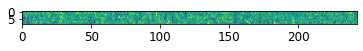

In [16]:
noise = tf.random.normal([1, latent_space])
print(noise.shape)
generated_image = generator(noise, training=False)
print(generated_image.shape)
plt.imshow(generated_image[0, :, :, 0])

### Make Discriminator

In [17]:
inp_shape = generated_image.shape[1:]

# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same',
#                                      input_shape=inp_shape))
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same'))
#     model.add(keras.layers.BatchNormalization())
#     model.add(keras.layers.LeakyReLU(0.2))

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

# reducing params
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(8, (1, 1), strides=(1, 1), padding='same',
                          input_shape=inp_shape))
    model.add(keras.layers.LeakyReLU()) # Leaky ReLU activation function helps with the gradient flow - alleviates problem of almost 0 gradients
    model.add(keras.layers.Dropout(0.2)) # decrease hyper learning distribution

    model.add(keras.layers.Conv2D(16, (1, 1), strides=(1, 1), padding='same')) # downsampling
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.2))

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1))

    return model

#     # reducing params
# def make_discriminator_model():
#     model = tf.keras.Sequential()
#     model.add(keras.layers.Conv2D(8, (2, 2), strides=(1, 1), padding='same',
#                           input_shape=inp_shape))
#     model.add(keras.layers.LeakyReLU())
#     model.add(keras.layers.Dropout(0.2))

#     model.add(keras.layers.Conv2D(16, (3, 3), strides=(1, 1), padding='same'))
#     model.add(keras.layers.LeakyReLU())
#     model.add(keras.layers.Dropout(0.2))

#     model.add(keras.layers.Flatten())
#     model.add(keras.layers.Dense(1))

#     return model

In [18]:
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 9, 243, 8)         16        
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 9, 243, 8)         0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 9, 243, 8)         0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 9, 243, 16)        144       
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 9, 243, 16)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 9, 243, 16)        0         
_________________________________________________________________
flatten (Flatten)            (None, 34992)            

In [19]:
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.00404427]], shape=(1, 1), dtype=float32)


### Create GAN by combining both Models

In [20]:
gan = keras.models.Sequential([generator, discriminator])

### Define Losses and Optimizers

In [21]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

In [22]:
# The discriminator and the generator optimizers are different since we will train two networks separately.
generator_optimizer = tf.keras.optimizers.Adam(2e-4, 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, 0.5)


In [23]:
# logs to follow losses on tensorboard
#current_time = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
generator_log_dir = '/content/gdrive/MyDrive/ACSE-9/logs/generator'
discriminator_log_dir = '/content/gdrive/MyDrive/ACSE-9/logs/discriminator'

generator_summary_writer = tf.summary.create_file_writer(generator_log_dir)
discriminator_summary_writer = tf.summary.create_file_writer(discriminator_log_dir)

# Define Training Loop

In [24]:
#EPOCHS = 5
#noise_dim = 81
num_examples_to_generate = 8

# You will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
seed = tf.random.normal([num_examples_to_generate, latent_space])
print(seed.shape)

(8, 243)


In [25]:
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])
    print(batch.shape)
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        print(generated_images.shape)
        fake_output = discriminator(generated_images, training=True)
        print(fake_output.shape)
        real_output = discriminator(batch, training=True)
        

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    discriminator_mean_loss(disc_loss)


In [26]:
def train(dataset, epochs):
    hist = []
    for epoch in range(epochs):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        for batch in dataset:
            train_step(batch)
            
        with generator_summary_writer.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with discriminator_summary_writer.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        #print("a:", discriminator.metrics_names[0])
        #print("b:", hist[-1][1])
        #print("discriminator", "{}: {:.6f}".format(discriminator.metrics_names[0], hist[-1][1]), end=' - ')
        #print("generator", "{}: {:.6f}".format(gan.metrics_names[0], hist[-1][0]), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))


        #Global variables are used below
        if epoch%100 == 0: 
        #     # Plot generated data
        #     X_generated = scaler.inverse_transform((generator.predict(seed).reshape(num_examples_to_generate*ntimes,16)+1)/2)
        #     X_generated = pca_compress.inverse_transform(X_generated)
        #     X_generated = X_generated.reshape(num_examples_to_generate, ntimes, len(groups)*nl*nc)
        #     fig, ax = plt.subplots(num_examples_to_generate*2,len(groups), figsize=[20,num_examples_to_generate*5])
        #     for j in range(num_examples_to_generate):
        #         for i, group in enumerate(groups):
        #             for k in range(0,10,10): 
        #                 ax.flatten()[i+2*j*len(groups)].plot(X_generated[j][:,i*nl*nc+4+10*k], '-')
        #         for i, group in enumerate(groups):
        #             im = ax.flatten()[i+(2*j+1)*len(groups)].imshow(X_generated[j].reshape(ntimes,len(groups),nl,nc)[4,i,:,:])
        #             fig.colorbar(im, ax=ax.flatten()[i+(2*j+1)*len(groups)])
        #     plt.show() 
                    
            #Save model
          #gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_arch_test2'+str(epoch)+'.h5')    
          
          #print loss
          print("generator loss: ", hist[-1][0])
          print("discriminator loss: ", hist[-1][-1])
          
          #plot loss
          print('Loss: ')
          fig, ax = plt.subplots(1,1, figsize=[20,10])
          ax.plot(hist)
          ax.legend(['loss_gen', 'loss_disc'])
          ax.set_yscale('log')
          ax.grid()
          plt.show()
            
    return hist

In [27]:
train_dataset

<BatchDataset shapes: (None, 9, 243, 1), types: tf.float64>

Epoch 1/15000
(128, 9, 243, 1)
(128, 9, 243, 1)
(128, 1)
(128, 9, 243, 1)
(128, 9, 243, 1)
(128, 1)
(35, 9, 243, 1)
(128, 9, 243, 1)
(128, 1)
2s
generator loss:  0.7467868
discriminator loss:  1.3657659
Loss: 


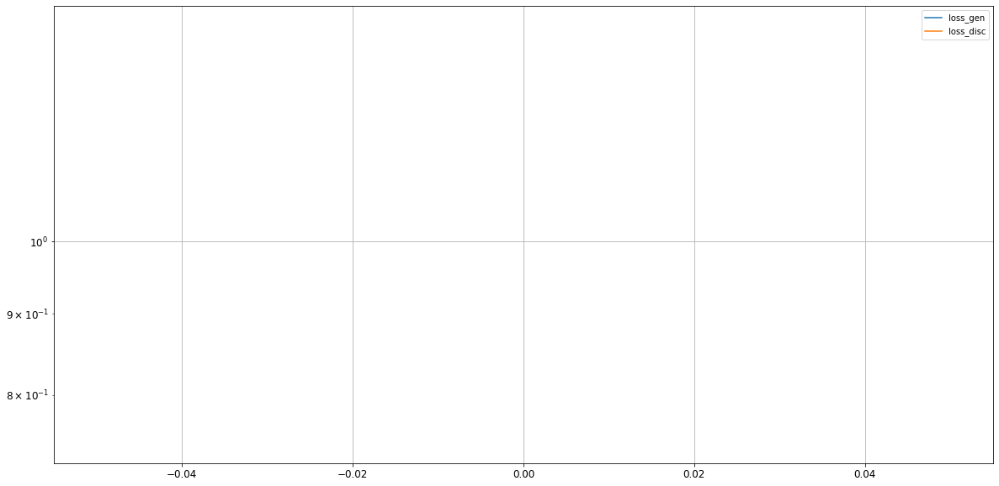

Epoch 2/15000
0s
Epoch 3/15000
0s
Epoch 4/15000
0s
Epoch 5/15000
0s
Epoch 6/15000
0s
Epoch 7/15000
0s
Epoch 8/15000
0s
Epoch 9/15000
0s
Epoch 10/15000
0s
Epoch 11/15000
0s
Epoch 12/15000
0s
Epoch 13/15000
0s
Epoch 14/15000
0s
Epoch 15/15000
0s
Epoch 16/15000
0s
Epoch 17/15000
0s
Epoch 18/15000
0s
Epoch 19/15000
0s
Epoch 20/15000
0s
Epoch 21/15000
0s
Epoch 22/15000
0s
Epoch 23/15000
0s
Epoch 24/15000
0s
Epoch 25/15000
0s
Epoch 26/15000
0s
Epoch 27/15000
0s
Epoch 28/15000
0s
Epoch 29/15000
0s
Epoch 30/15000
0s
Epoch 31/15000
0s
Epoch 32/15000
0s
Epoch 33/15000
0s
Epoch 34/15000
0s
Epoch 35/15000
0s
Epoch 36/15000
0s
Epoch 37/15000
0s
Epoch 38/15000
0s
Epoch 39/15000
0s
Epoch 40/15000
0s
Epoch 41/15000
0s
Epoch 42/15000
0s
Epoch 43/15000
0s
Epoch 44/15000
0s
Epoch 45/15000
0s
Epoch 46/15000
0s
Epoch 47/15000
0s
Epoch 48/15000
0s
Epoch 49/15000
0s
Epoch 50/15000
0s
Epoch 51/15000
0s
Epoch 52/15000
0s
Epoch 53/15000
0s
Epoch 54/15000
0s
Epoch 55/15000
0s
Epoch 56/15000
0s
Epoch 57/15000
0s


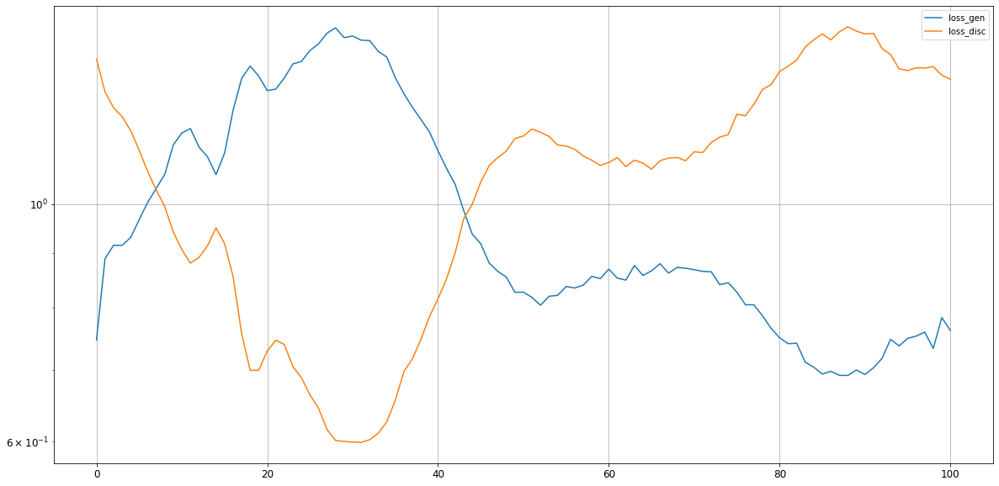

Epoch 102/15000
0s
Epoch 103/15000
0s
Epoch 104/15000
0s
Epoch 105/15000
0s
Epoch 106/15000
0s
Epoch 107/15000
0s
Epoch 108/15000
0s
Epoch 109/15000
0s
Epoch 110/15000
0s
Epoch 111/15000
0s
Epoch 112/15000
0s
Epoch 113/15000
0s
Epoch 114/15000
0s
Epoch 115/15000
0s
Epoch 116/15000
0s
Epoch 117/15000
0s
Epoch 118/15000
0s
Epoch 119/15000
0s
Epoch 120/15000
0s
Epoch 121/15000
0s
Epoch 122/15000
0s
Epoch 123/15000
0s
Epoch 124/15000
0s
Epoch 125/15000
0s
Epoch 126/15000
0s
Epoch 127/15000
0s
Epoch 128/15000
0s
Epoch 129/15000
0s
Epoch 130/15000
0s
Epoch 131/15000
0s
Epoch 132/15000
0s
Epoch 133/15000
0s
Epoch 134/15000
0s
Epoch 135/15000
0s
Epoch 136/15000
0s
Epoch 137/15000
0s
Epoch 138/15000
0s
Epoch 139/15000
0s
Epoch 140/15000
0s
Epoch 141/15000
0s
Epoch 142/15000
0s
Epoch 143/15000
0s
Epoch 144/15000
0s
Epoch 145/15000
0s
Epoch 146/15000
0s
Epoch 147/15000
0s
Epoch 148/15000
0s
Epoch 149/15000
0s
Epoch 150/15000
0s
Epoch 151/15000
0s
Epoch 152/15000
0s
Epoch 153/15000
0s
Epoch 154/15

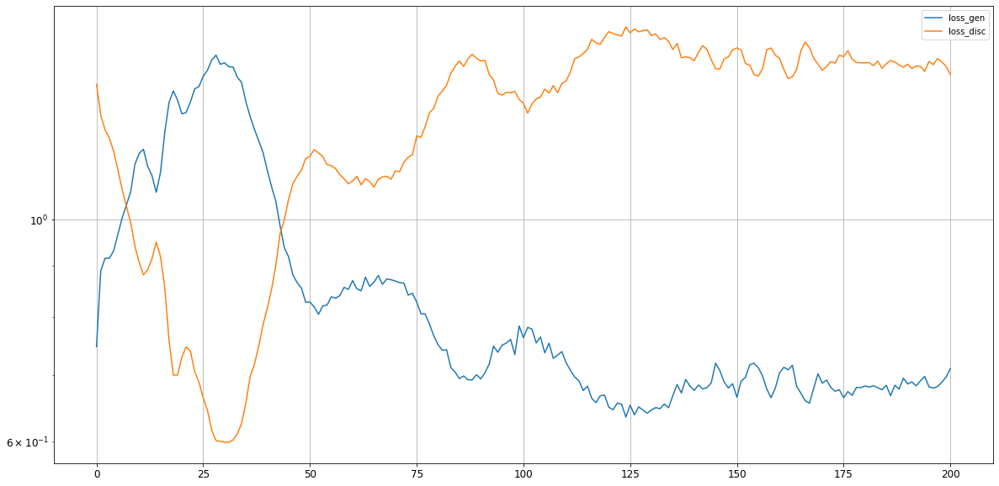

Epoch 202/15000
0s
Epoch 203/15000
0s
Epoch 204/15000
0s
Epoch 205/15000
0s
Epoch 206/15000
0s
Epoch 207/15000
0s
Epoch 208/15000
0s
Epoch 209/15000
0s
Epoch 210/15000
0s
Epoch 211/15000
0s
Epoch 212/15000
0s
Epoch 213/15000
0s
Epoch 214/15000
0s
Epoch 215/15000
0s
Epoch 216/15000
0s
Epoch 217/15000
0s
Epoch 218/15000
0s
Epoch 219/15000
0s
Epoch 220/15000
0s
Epoch 221/15000
0s
Epoch 222/15000
0s
Epoch 223/15000
0s
Epoch 224/15000
0s
Epoch 225/15000
0s
Epoch 226/15000
0s
Epoch 227/15000
0s
Epoch 228/15000
0s
Epoch 229/15000
0s
Epoch 230/15000
0s
Epoch 231/15000
0s
Epoch 232/15000
0s
Epoch 233/15000
0s
Epoch 234/15000
0s
Epoch 235/15000
0s
Epoch 236/15000
0s
Epoch 237/15000
0s
Epoch 238/15000
0s
Epoch 239/15000
0s
Epoch 240/15000
0s
Epoch 241/15000
0s
Epoch 242/15000
0s
Epoch 243/15000
0s
Epoch 244/15000
0s
Epoch 245/15000
0s
Epoch 246/15000
0s
Epoch 247/15000
0s
Epoch 248/15000
0s
Epoch 249/15000
0s
Epoch 250/15000
0s
Epoch 251/15000
0s
Epoch 252/15000
0s
Epoch 253/15000
0s
Epoch 254/15

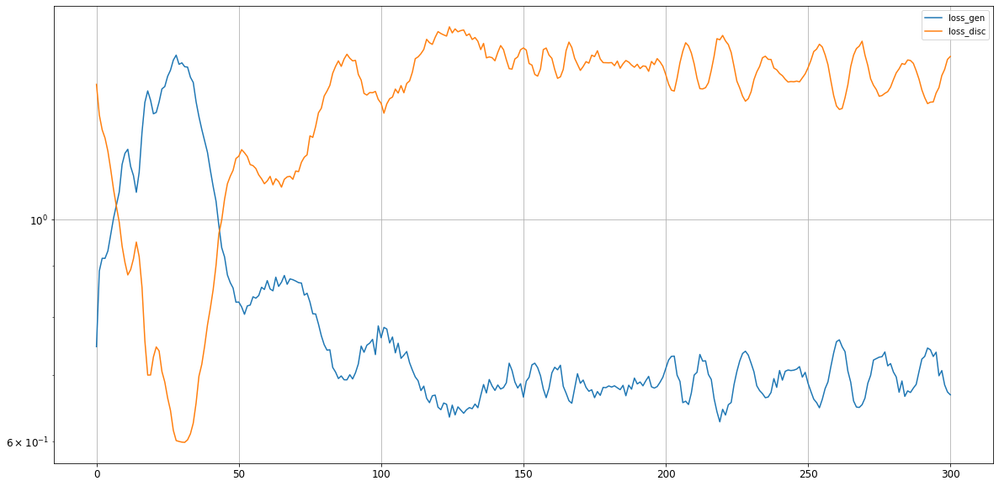

Epoch 302/15000
0s
Epoch 303/15000
0s
Epoch 304/15000
0s
Epoch 305/15000
0s
Epoch 306/15000
0s
Epoch 307/15000
0s
Epoch 308/15000
0s
Epoch 309/15000
0s
Epoch 310/15000
0s
Epoch 311/15000
0s
Epoch 312/15000
0s
Epoch 313/15000
0s
Epoch 314/15000
0s
Epoch 315/15000
0s
Epoch 316/15000
0s
Epoch 317/15000
0s
Epoch 318/15000
0s
Epoch 319/15000
0s
Epoch 320/15000
0s
Epoch 321/15000
0s
Epoch 322/15000
0s
Epoch 323/15000
0s
Epoch 324/15000
0s
Epoch 325/15000
0s
Epoch 326/15000
0s
Epoch 327/15000
0s
Epoch 328/15000
0s
Epoch 329/15000
0s
Epoch 330/15000
0s
Epoch 331/15000
0s
Epoch 332/15000
0s
Epoch 333/15000
0s
Epoch 334/15000
0s
Epoch 335/15000
0s
Epoch 336/15000
0s
Epoch 337/15000
0s
Epoch 338/15000
0s
Epoch 339/15000
0s
Epoch 340/15000
0s
Epoch 341/15000
0s
Epoch 342/15000
0s
Epoch 343/15000
0s
Epoch 344/15000
0s
Epoch 345/15000
0s
Epoch 346/15000
0s
Epoch 347/15000
0s
Epoch 348/15000
0s
Epoch 349/15000
0s
Epoch 350/15000
0s
Epoch 351/15000
0s
Epoch 352/15000
0s
Epoch 353/15000
0s
Epoch 354/15

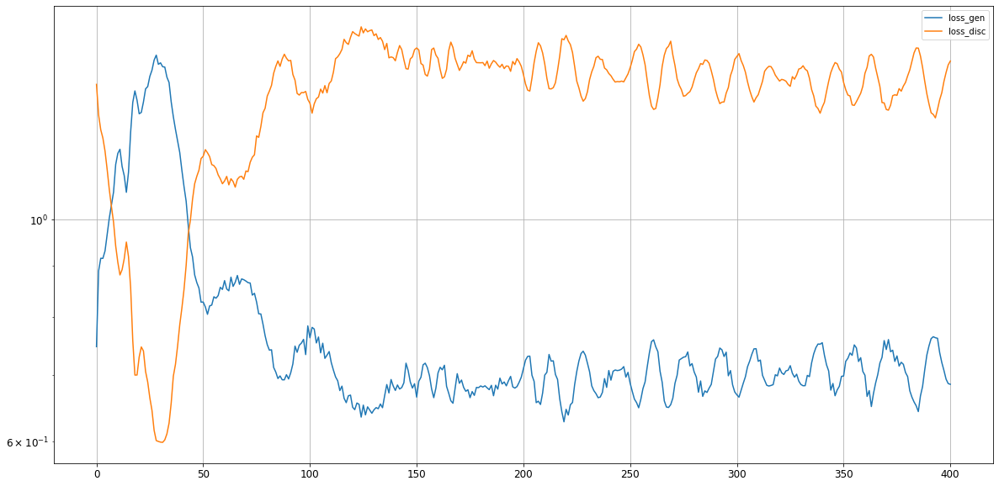

Epoch 402/15000
0s
Epoch 403/15000
0s
Epoch 404/15000
0s
Epoch 405/15000
0s
Epoch 406/15000
0s
Epoch 407/15000
0s
Epoch 408/15000
0s
Epoch 409/15000
0s
Epoch 410/15000
0s
Epoch 411/15000
0s
Epoch 412/15000
0s
Epoch 413/15000
0s
Epoch 414/15000
0s
Epoch 415/15000
0s
Epoch 416/15000
0s
Epoch 417/15000
0s
Epoch 418/15000
0s
Epoch 419/15000
0s
Epoch 420/15000
0s
Epoch 421/15000
0s
Epoch 422/15000
0s
Epoch 423/15000
0s
Epoch 424/15000
0s
Epoch 425/15000
0s
Epoch 426/15000
0s
Epoch 427/15000
0s
Epoch 428/15000
0s
Epoch 429/15000
0s
Epoch 430/15000
0s
Epoch 431/15000
0s
Epoch 432/15000
0s
Epoch 433/15000
0s
Epoch 434/15000
0s
Epoch 435/15000
0s
Epoch 436/15000
0s
Epoch 437/15000
0s
Epoch 438/15000
0s
Epoch 439/15000
0s
Epoch 440/15000
0s
Epoch 441/15000
0s
Epoch 442/15000
0s
Epoch 443/15000
0s
Epoch 444/15000
0s
Epoch 445/15000
0s
Epoch 446/15000
0s
Epoch 447/15000
0s
Epoch 448/15000
0s
Epoch 449/15000
0s
Epoch 450/15000
0s
Epoch 451/15000
0s
Epoch 452/15000
0s
Epoch 453/15000
0s
Epoch 454/15

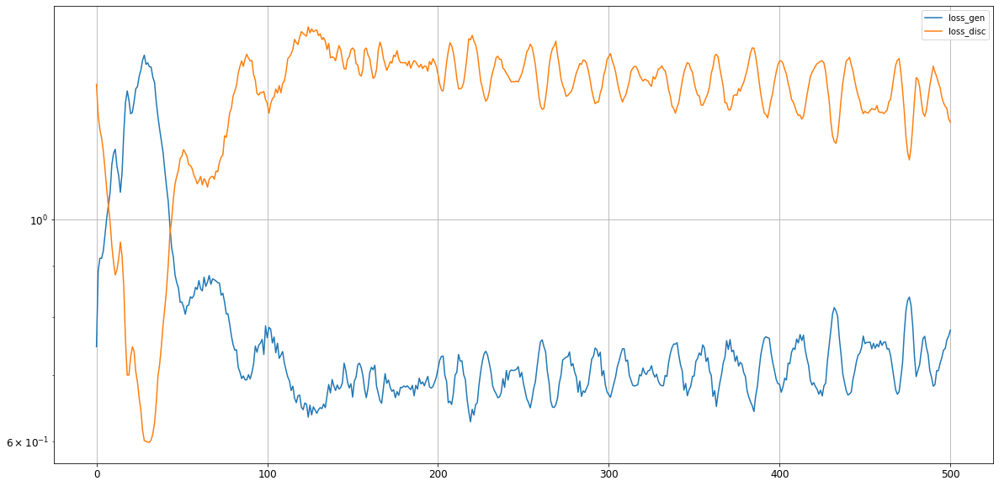

Epoch 502/15000
0s
Epoch 503/15000
0s
Epoch 504/15000
0s
Epoch 505/15000
0s
Epoch 506/15000
0s
Epoch 507/15000
0s
Epoch 508/15000
0s
Epoch 509/15000
0s
Epoch 510/15000
0s
Epoch 511/15000
0s
Epoch 512/15000
0s
Epoch 513/15000
0s
Epoch 514/15000
0s
Epoch 515/15000
0s
Epoch 516/15000
0s
Epoch 517/15000
0s
Epoch 518/15000
0s
Epoch 519/15000
0s
Epoch 520/15000
0s
Epoch 521/15000
0s
Epoch 522/15000
0s
Epoch 523/15000
0s
Epoch 524/15000
0s
Epoch 525/15000
0s
Epoch 526/15000
0s
Epoch 527/15000
0s
Epoch 528/15000
0s
Epoch 529/15000
0s
Epoch 530/15000
0s
Epoch 531/15000
0s
Epoch 532/15000
0s
Epoch 533/15000
0s
Epoch 534/15000
0s
Epoch 535/15000
0s
Epoch 536/15000
0s
Epoch 537/15000
0s
Epoch 538/15000
0s
Epoch 539/15000
0s
Epoch 540/15000
0s
Epoch 541/15000
0s
Epoch 542/15000
0s
Epoch 543/15000
0s
Epoch 544/15000
0s
Epoch 545/15000
0s
Epoch 546/15000
0s
Epoch 547/15000
0s
Epoch 548/15000
0s
Epoch 549/15000
0s
Epoch 550/15000
0s
Epoch 551/15000
0s
Epoch 552/15000
0s
Epoch 553/15000
0s
Epoch 554/15

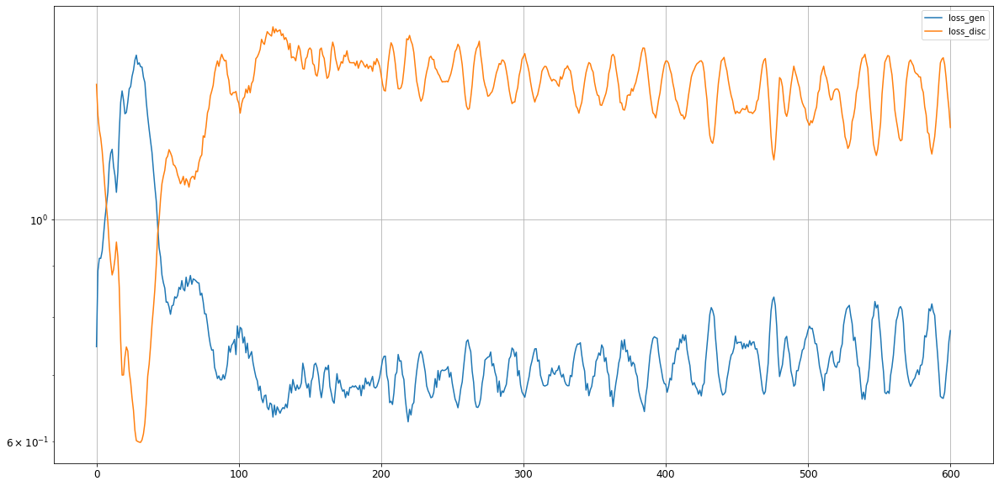

Epoch 602/15000
0s
Epoch 603/15000
0s
Epoch 604/15000
0s
Epoch 605/15000
0s
Epoch 606/15000
0s
Epoch 607/15000
0s
Epoch 608/15000
0s
Epoch 609/15000
0s
Epoch 610/15000
0s
Epoch 611/15000
0s
Epoch 612/15000
0s
Epoch 613/15000
0s
Epoch 614/15000
0s
Epoch 615/15000
0s
Epoch 616/15000
0s
Epoch 617/15000
0s
Epoch 618/15000
0s
Epoch 619/15000
0s
Epoch 620/15000
0s
Epoch 621/15000
0s
Epoch 622/15000
0s
Epoch 623/15000
0s
Epoch 624/15000
0s
Epoch 625/15000
0s
Epoch 626/15000
0s
Epoch 627/15000
0s
Epoch 628/15000
0s
Epoch 629/15000
0s
Epoch 630/15000
0s
Epoch 631/15000
0s
Epoch 632/15000
0s
Epoch 633/15000
0s
Epoch 634/15000
0s
Epoch 635/15000
0s
Epoch 636/15000
0s
Epoch 637/15000
0s
Epoch 638/15000
0s
Epoch 639/15000
0s
Epoch 640/15000
0s
Epoch 641/15000
0s
Epoch 642/15000
0s
Epoch 643/15000
0s
Epoch 644/15000
0s
Epoch 645/15000
0s
Epoch 646/15000
0s
Epoch 647/15000
0s
Epoch 648/15000
0s
Epoch 649/15000
0s
Epoch 650/15000
0s
Epoch 651/15000
0s
Epoch 652/15000
0s
Epoch 653/15000
0s
Epoch 654/15

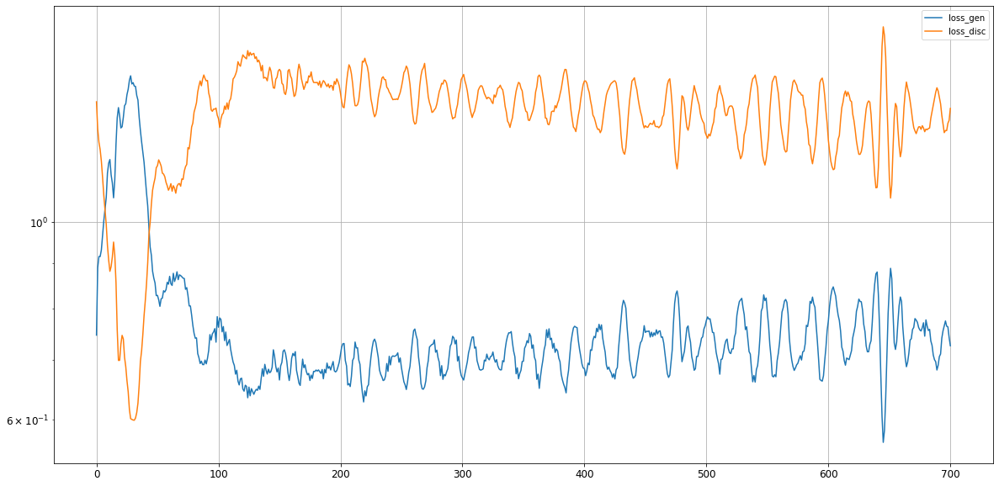

Epoch 702/15000
0s
Epoch 703/15000
0s
Epoch 704/15000
0s
Epoch 705/15000
0s
Epoch 706/15000
0s
Epoch 707/15000
0s
Epoch 708/15000
0s
Epoch 709/15000
0s
Epoch 710/15000
0s
Epoch 711/15000
0s
Epoch 712/15000
0s
Epoch 713/15000
0s
Epoch 714/15000
0s
Epoch 715/15000
0s
Epoch 716/15000
0s
Epoch 717/15000
0s
Epoch 718/15000
0s
Epoch 719/15000
0s
Epoch 720/15000
0s
Epoch 721/15000
0s
Epoch 722/15000
0s
Epoch 723/15000
0s
Epoch 724/15000
0s
Epoch 725/15000
0s
Epoch 726/15000
0s
Epoch 727/15000
0s
Epoch 728/15000
0s
Epoch 729/15000
0s
Epoch 730/15000
0s
Epoch 731/15000
0s
Epoch 732/15000
0s
Epoch 733/15000
0s
Epoch 734/15000
0s
Epoch 735/15000
0s
Epoch 736/15000
0s
Epoch 737/15000
0s
Epoch 738/15000
0s
Epoch 739/15000
0s
Epoch 740/15000
0s
Epoch 741/15000
0s
Epoch 742/15000
0s
Epoch 743/15000
0s
Epoch 744/15000
0s
Epoch 745/15000
0s
Epoch 746/15000
0s
Epoch 747/15000
0s
Epoch 748/15000
0s
Epoch 749/15000
0s
Epoch 750/15000
0s
Epoch 751/15000
0s
Epoch 752/15000
0s
Epoch 753/15000
0s
Epoch 754/15

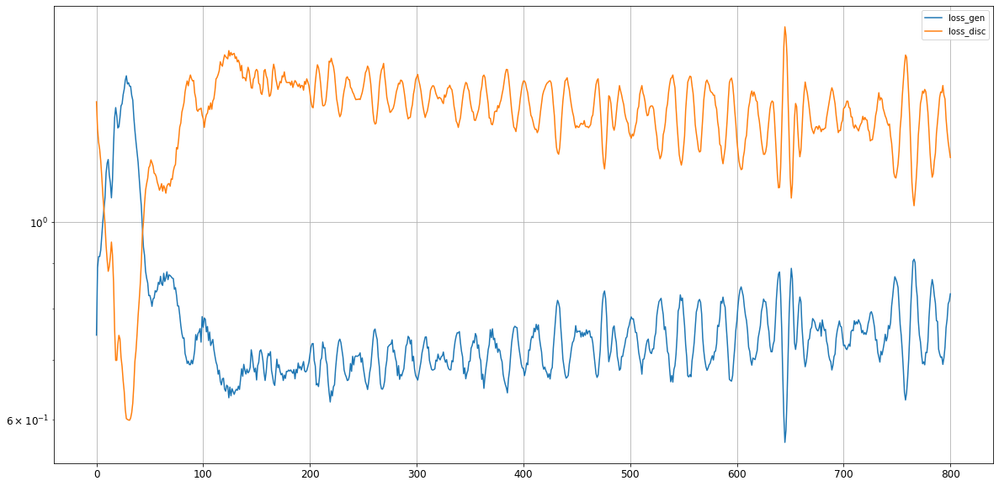

Epoch 802/15000
0s
Epoch 803/15000
0s
Epoch 804/15000
0s
Epoch 805/15000
0s
Epoch 806/15000
0s
Epoch 807/15000
0s
Epoch 808/15000
0s
Epoch 809/15000
0s
Epoch 810/15000
0s
Epoch 811/15000
0s
Epoch 812/15000
0s
Epoch 813/15000
0s
Epoch 814/15000
0s
Epoch 815/15000
0s
Epoch 816/15000
0s
Epoch 817/15000
0s
Epoch 818/15000
0s
Epoch 819/15000
0s
Epoch 820/15000
0s
Epoch 821/15000
0s
Epoch 822/15000
0s
Epoch 823/15000
0s
Epoch 824/15000
0s
Epoch 825/15000
0s
Epoch 826/15000
0s
Epoch 827/15000
0s
Epoch 828/15000
0s
Epoch 829/15000
0s
Epoch 830/15000
0s
Epoch 831/15000
0s
Epoch 832/15000
0s
Epoch 833/15000
0s
Epoch 834/15000
0s
Epoch 835/15000
0s
Epoch 836/15000
0s
Epoch 837/15000
0s
Epoch 838/15000
0s
Epoch 839/15000
0s
Epoch 840/15000
0s
Epoch 841/15000
0s
Epoch 842/15000
0s
Epoch 843/15000
0s
Epoch 844/15000
0s
Epoch 845/15000
0s
Epoch 846/15000
0s
Epoch 847/15000
0s
Epoch 848/15000
0s
Epoch 849/15000
0s
Epoch 850/15000
0s
Epoch 851/15000
0s
Epoch 852/15000
0s
Epoch 853/15000
0s
Epoch 854/15

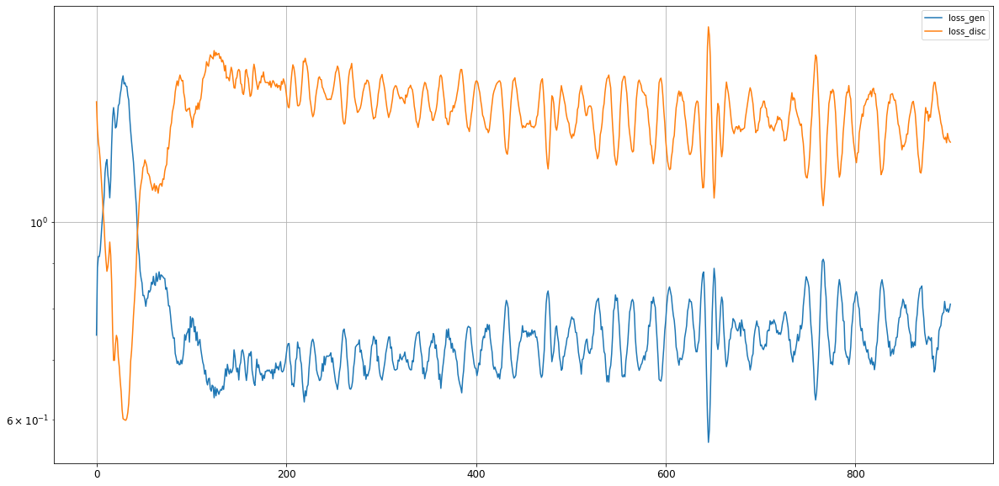

Epoch 902/15000
0s
Epoch 903/15000
0s
Epoch 904/15000
0s
Epoch 905/15000
0s
Epoch 906/15000
0s
Epoch 907/15000
0s
Epoch 908/15000
0s
Epoch 909/15000
0s
Epoch 910/15000
0s
Epoch 911/15000
0s
Epoch 912/15000
0s
Epoch 913/15000
0s
Epoch 914/15000
0s
Epoch 915/15000
0s
Epoch 916/15000
0s
Epoch 917/15000
0s
Epoch 918/15000
0s
Epoch 919/15000
0s
Epoch 920/15000
0s
Epoch 921/15000
0s
Epoch 922/15000
0s
Epoch 923/15000
0s
Epoch 924/15000
0s
Epoch 925/15000
0s
Epoch 926/15000
0s
Epoch 927/15000
0s
Epoch 928/15000
0s
Epoch 929/15000
0s
Epoch 930/15000
0s
Epoch 931/15000
0s
Epoch 932/15000
0s
Epoch 933/15000
0s
Epoch 934/15000
0s
Epoch 935/15000
0s
Epoch 936/15000
0s
Epoch 937/15000
0s
Epoch 938/15000
0s
Epoch 939/15000
0s
Epoch 940/15000
0s
Epoch 941/15000
0s
Epoch 942/15000
0s
Epoch 943/15000
0s
Epoch 944/15000
0s
Epoch 945/15000
0s
Epoch 946/15000
0s
Epoch 947/15000
0s
Epoch 948/15000
0s
Epoch 949/15000
0s
Epoch 950/15000
0s
Epoch 951/15000
0s
Epoch 952/15000
0s
Epoch 953/15000
0s
Epoch 954/15

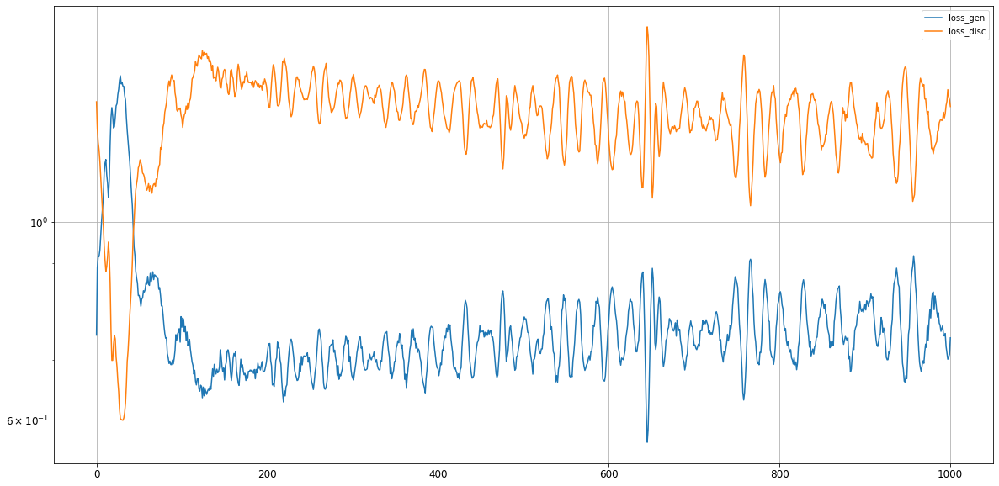

Epoch 1002/15000
0s
Epoch 1003/15000
0s
Epoch 1004/15000
0s
Epoch 1005/15000
0s
Epoch 1006/15000
0s
Epoch 1007/15000
0s
Epoch 1008/15000
0s
Epoch 1009/15000
0s
Epoch 1010/15000
0s
Epoch 1011/15000
0s
Epoch 1012/15000
0s
Epoch 1013/15000
0s
Epoch 1014/15000
0s
Epoch 1015/15000
0s
Epoch 1016/15000
0s
Epoch 1017/15000
0s
Epoch 1018/15000
0s
Epoch 1019/15000
0s
Epoch 1020/15000
0s
Epoch 1021/15000
0s
Epoch 1022/15000
0s
Epoch 1023/15000
0s
Epoch 1024/15000
0s
Epoch 1025/15000
0s
Epoch 1026/15000
0s
Epoch 1027/15000
0s
Epoch 1028/15000
0s
Epoch 1029/15000
0s
Epoch 1030/15000
0s
Epoch 1031/15000
0s
Epoch 1032/15000
0s
Epoch 1033/15000
0s
Epoch 1034/15000
0s
Epoch 1035/15000
0s
Epoch 1036/15000
0s
Epoch 1037/15000
0s
Epoch 1038/15000
0s
Epoch 1039/15000
0s
Epoch 1040/15000
0s
Epoch 1041/15000
0s
Epoch 1042/15000
0s
Epoch 1043/15000
0s
Epoch 1044/15000
0s
Epoch 1045/15000
0s
Epoch 1046/15000
0s
Epoch 1047/15000
0s
Epoch 1048/15000
0s
Epoch 1049/15000
0s
Epoch 1050/15000
0s
Epoch 1051/15000
0s


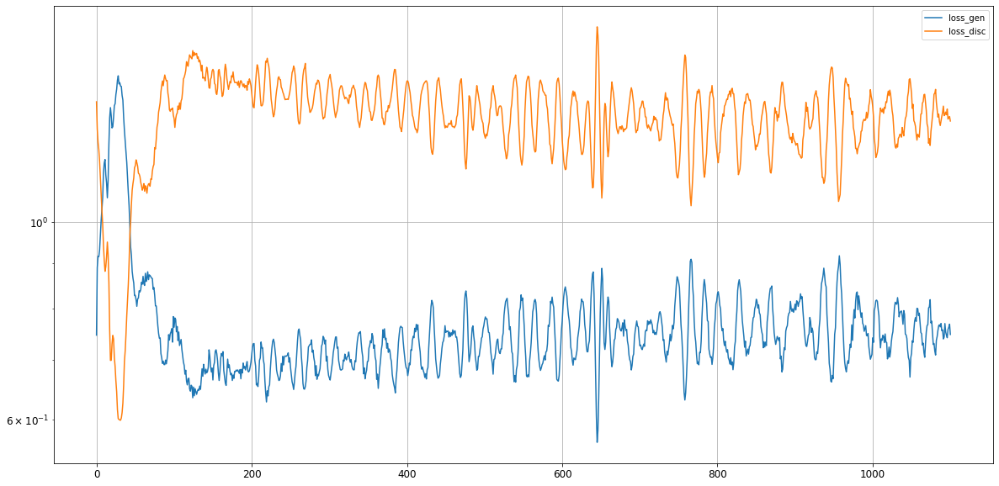

Epoch 1102/15000
0s
Epoch 1103/15000
0s
Epoch 1104/15000
0s
Epoch 1105/15000
0s
Epoch 1106/15000
0s
Epoch 1107/15000
0s
Epoch 1108/15000
0s
Epoch 1109/15000
0s
Epoch 1110/15000
0s
Epoch 1111/15000
0s
Epoch 1112/15000
0s
Epoch 1113/15000
0s
Epoch 1114/15000
0s
Epoch 1115/15000
0s
Epoch 1116/15000
0s
Epoch 1117/15000
0s
Epoch 1118/15000
0s
Epoch 1119/15000
0s
Epoch 1120/15000
0s
Epoch 1121/15000
0s
Epoch 1122/15000
0s
Epoch 1123/15000
0s
Epoch 1124/15000
0s
Epoch 1125/15000
0s
Epoch 1126/15000
0s
Epoch 1127/15000
0s
Epoch 1128/15000
0s
Epoch 1129/15000
0s
Epoch 1130/15000
0s
Epoch 1131/15000
0s
Epoch 1132/15000
0s
Epoch 1133/15000
0s
Epoch 1134/15000
0s
Epoch 1135/15000
0s
Epoch 1136/15000
0s
Epoch 1137/15000
0s
Epoch 1138/15000
0s
Epoch 1139/15000
0s
Epoch 1140/15000
0s
Epoch 1141/15000
0s
Epoch 1142/15000
0s
Epoch 1143/15000
0s
Epoch 1144/15000
0s
Epoch 1145/15000
0s
Epoch 1146/15000
0s
Epoch 1147/15000
0s
Epoch 1148/15000
0s
Epoch 1149/15000
0s
Epoch 1150/15000
0s
Epoch 1151/15000
0s


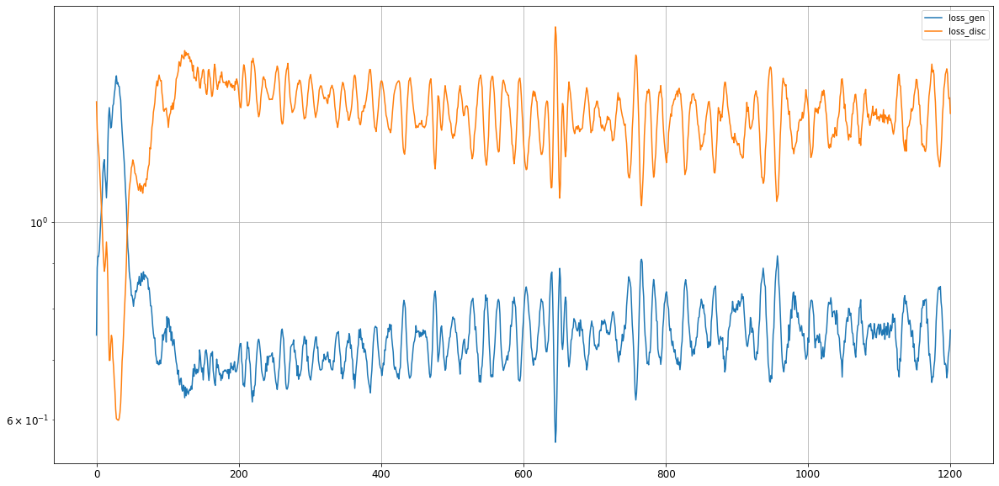

Epoch 1202/15000
0s
Epoch 1203/15000
0s
Epoch 1204/15000
0s
Epoch 1205/15000
0s
Epoch 1206/15000
0s
Epoch 1207/15000
0s
Epoch 1208/15000
0s
Epoch 1209/15000
0s
Epoch 1210/15000
0s
Epoch 1211/15000
0s
Epoch 1212/15000
0s
Epoch 1213/15000
0s
Epoch 1214/15000
0s
Epoch 1215/15000
0s
Epoch 1216/15000
0s
Epoch 1217/15000
0s
Epoch 1218/15000
0s
Epoch 1219/15000
0s
Epoch 1220/15000
0s
Epoch 1221/15000
0s
Epoch 1222/15000
0s
Epoch 1223/15000
0s
Epoch 1224/15000
0s
Epoch 1225/15000
0s
Epoch 1226/15000
0s
Epoch 1227/15000
0s
Epoch 1228/15000
0s
Epoch 1229/15000
0s
Epoch 1230/15000
0s
Epoch 1231/15000
0s
Epoch 1232/15000
0s
Epoch 1233/15000
0s
Epoch 1234/15000
0s
Epoch 1235/15000
0s
Epoch 1236/15000
0s
Epoch 1237/15000
0s
Epoch 1238/15000
0s
Epoch 1239/15000
0s
Epoch 1240/15000
0s
Epoch 1241/15000
0s
Epoch 1242/15000
0s
Epoch 1243/15000
0s
Epoch 1244/15000
0s
Epoch 1245/15000
0s
Epoch 1246/15000
0s
Epoch 1247/15000
0s
Epoch 1248/15000
0s
Epoch 1249/15000
0s
Epoch 1250/15000
0s
Epoch 1251/15000
0s


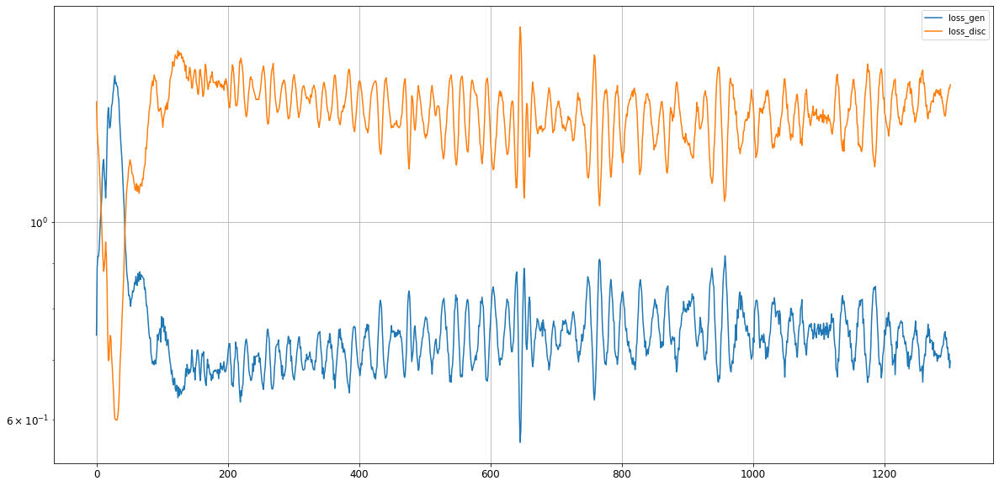

Epoch 1302/15000
0s
Epoch 1303/15000
0s
Epoch 1304/15000
0s
Epoch 1305/15000
0s
Epoch 1306/15000
0s
Epoch 1307/15000
0s
Epoch 1308/15000
0s
Epoch 1309/15000
0s
Epoch 1310/15000
0s
Epoch 1311/15000
0s
Epoch 1312/15000
0s
Epoch 1313/15000
0s
Epoch 1314/15000
0s
Epoch 1315/15000
0s
Epoch 1316/15000
0s
Epoch 1317/15000
0s
Epoch 1318/15000
0s
Epoch 1319/15000
0s
Epoch 1320/15000
0s
Epoch 1321/15000
0s
Epoch 1322/15000
0s
Epoch 1323/15000
0s
Epoch 1324/15000
0s
Epoch 1325/15000
0s
Epoch 1326/15000
0s
Epoch 1327/15000
0s
Epoch 1328/15000
0s
Epoch 1329/15000
0s
Epoch 1330/15000
0s
Epoch 1331/15000
0s
Epoch 1332/15000
0s
Epoch 1333/15000
0s
Epoch 1334/15000
0s
Epoch 1335/15000
0s
Epoch 1336/15000
0s
Epoch 1337/15000
0s
Epoch 1338/15000
0s
Epoch 1339/15000
0s
Epoch 1340/15000
0s
Epoch 1341/15000
0s
Epoch 1342/15000
0s
Epoch 1343/15000
0s
Epoch 1344/15000
0s
Epoch 1345/15000
0s
Epoch 1346/15000
0s
Epoch 1347/15000
0s
Epoch 1348/15000
0s
Epoch 1349/15000
0s
Epoch 1350/15000
0s
Epoch 1351/15000
0s


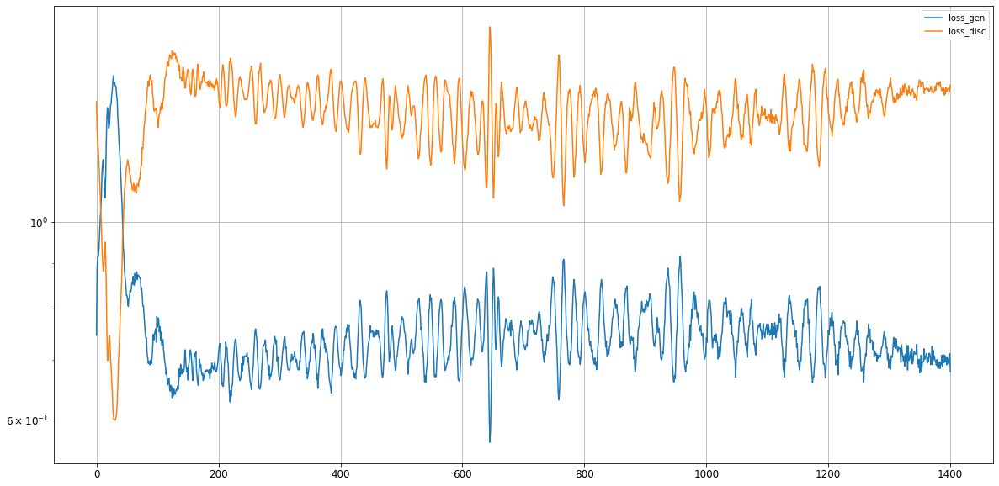

Epoch 1402/15000
0s
Epoch 1403/15000
0s
Epoch 1404/15000
0s
Epoch 1405/15000
0s
Epoch 1406/15000
0s
Epoch 1407/15000
0s
Epoch 1408/15000
0s
Epoch 1409/15000
0s
Epoch 1410/15000
0s
Epoch 1411/15000
0s
Epoch 1412/15000
0s
Epoch 1413/15000
0s
Epoch 1414/15000
0s
Epoch 1415/15000
0s
Epoch 1416/15000
0s
Epoch 1417/15000
0s
Epoch 1418/15000
0s
Epoch 1419/15000
0s
Epoch 1420/15000
0s
Epoch 1421/15000
0s
Epoch 1422/15000
0s
Epoch 1423/15000
0s
Epoch 1424/15000
0s
Epoch 1425/15000
0s
Epoch 1426/15000
0s
Epoch 1427/15000
0s
Epoch 1428/15000
0s
Epoch 1429/15000
0s
Epoch 1430/15000
0s
Epoch 1431/15000
0s
Epoch 1432/15000
0s
Epoch 1433/15000
0s
Epoch 1434/15000
0s
Epoch 1435/15000
0s
Epoch 1436/15000
0s
Epoch 1437/15000
0s
Epoch 1438/15000
0s
Epoch 1439/15000
0s
Epoch 1440/15000
0s
Epoch 1441/15000
0s
Epoch 1442/15000
0s
Epoch 1443/15000
0s
Epoch 1444/15000
0s
Epoch 1445/15000
0s
Epoch 1446/15000
0s
Epoch 1447/15000
0s
Epoch 1448/15000
0s
Epoch 1449/15000
0s
Epoch 1450/15000
0s
Epoch 1451/15000
0s


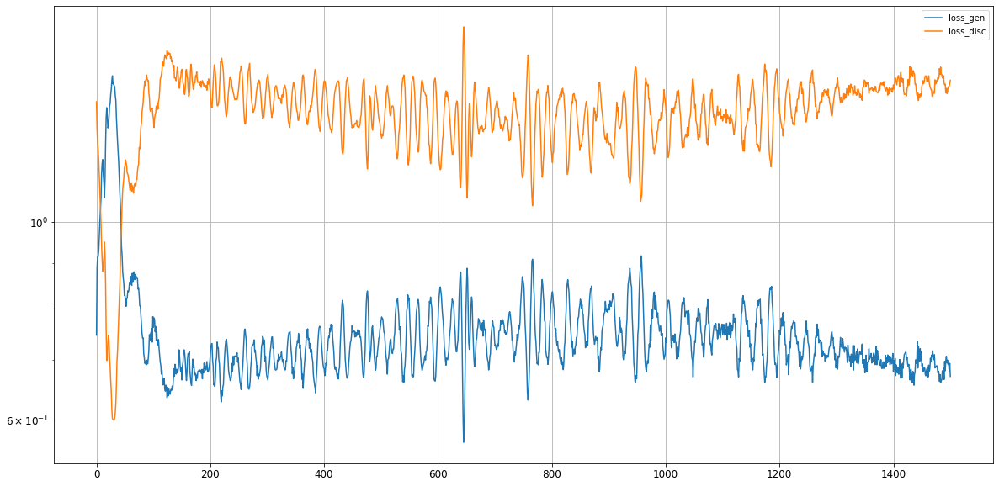

Epoch 1502/15000
0s
Epoch 1503/15000
0s
Epoch 1504/15000
0s
Epoch 1505/15000
0s
Epoch 1506/15000
0s
Epoch 1507/15000
0s
Epoch 1508/15000
0s
Epoch 1509/15000
0s
Epoch 1510/15000
0s
Epoch 1511/15000
0s
Epoch 1512/15000
0s
Epoch 1513/15000
0s
Epoch 1514/15000
0s
Epoch 1515/15000
0s
Epoch 1516/15000
0s
Epoch 1517/15000
0s
Epoch 1518/15000
0s
Epoch 1519/15000
0s
Epoch 1520/15000
0s
Epoch 1521/15000
0s
Epoch 1522/15000
0s
Epoch 1523/15000
0s
Epoch 1524/15000
0s
Epoch 1525/15000
0s
Epoch 1526/15000
0s
Epoch 1527/15000
0s
Epoch 1528/15000
0s
Epoch 1529/15000
0s
Epoch 1530/15000
0s
Epoch 1531/15000
0s
Epoch 1532/15000
0s
Epoch 1533/15000
0s
Epoch 1534/15000
0s
Epoch 1535/15000
0s
Epoch 1536/15000
0s
Epoch 1537/15000
0s
Epoch 1538/15000
0s
Epoch 1539/15000
0s
Epoch 1540/15000
0s
Epoch 1541/15000
0s
Epoch 1542/15000
0s
Epoch 1543/15000
0s
Epoch 1544/15000
0s
Epoch 1545/15000
0s
Epoch 1546/15000
0s
Epoch 1547/15000
0s
Epoch 1548/15000
0s
Epoch 1549/15000
0s
Epoch 1550/15000
0s
Epoch 1551/15000
0s


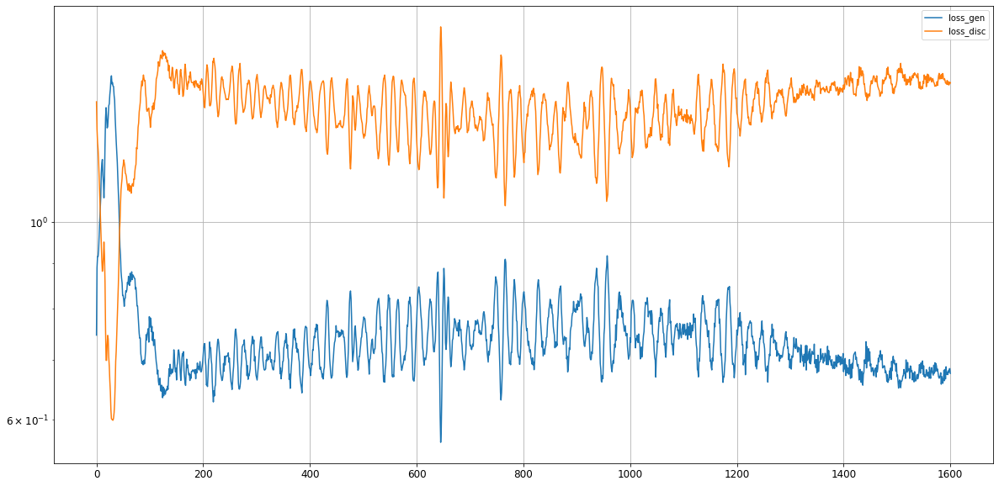

Epoch 1602/15000
0s
Epoch 1603/15000
0s
Epoch 1604/15000
0s
Epoch 1605/15000
0s
Epoch 1606/15000
0s
Epoch 1607/15000
0s
Epoch 1608/15000
0s
Epoch 1609/15000
0s
Epoch 1610/15000
0s
Epoch 1611/15000
0s
Epoch 1612/15000
0s
Epoch 1613/15000
0s
Epoch 1614/15000
0s
Epoch 1615/15000
0s
Epoch 1616/15000
0s
Epoch 1617/15000
0s
Epoch 1618/15000
0s
Epoch 1619/15000
0s
Epoch 1620/15000
0s
Epoch 1621/15000
0s
Epoch 1622/15000
0s
Epoch 1623/15000
0s
Epoch 1624/15000
0s
Epoch 1625/15000
0s
Epoch 1626/15000
0s
Epoch 1627/15000
0s
Epoch 1628/15000
0s
Epoch 1629/15000
0s
Epoch 1630/15000
0s
Epoch 1631/15000
0s
Epoch 1632/15000
0s
Epoch 1633/15000
0s
Epoch 1634/15000
0s
Epoch 1635/15000
0s
Epoch 1636/15000
0s
Epoch 1637/15000
0s
Epoch 1638/15000
0s
Epoch 1639/15000
0s
Epoch 1640/15000
0s
Epoch 1641/15000
0s
Epoch 1642/15000
0s
Epoch 1643/15000
0s
Epoch 1644/15000
0s
Epoch 1645/15000
0s
Epoch 1646/15000
0s
Epoch 1647/15000
0s
Epoch 1648/15000
0s
Epoch 1649/15000
0s
Epoch 1650/15000
0s
Epoch 1651/15000
0s


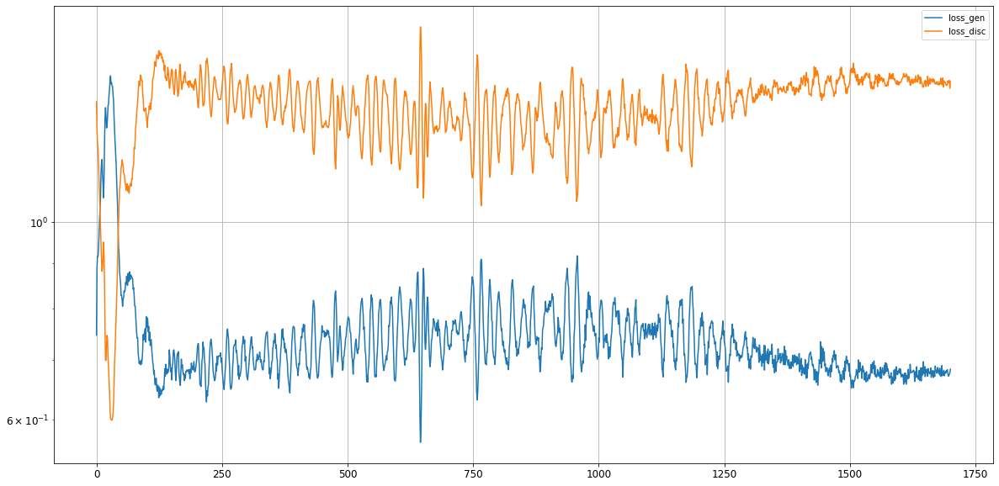

Epoch 1702/15000
0s
Epoch 1703/15000
0s
Epoch 1704/15000
0s
Epoch 1705/15000
0s
Epoch 1706/15000
0s
Epoch 1707/15000
0s
Epoch 1708/15000
0s
Epoch 1709/15000
0s
Epoch 1710/15000
0s
Epoch 1711/15000
0s
Epoch 1712/15000
0s
Epoch 1713/15000
0s
Epoch 1714/15000
0s
Epoch 1715/15000
0s
Epoch 1716/15000
0s
Epoch 1717/15000
0s
Epoch 1718/15000
0s
Epoch 1719/15000
0s
Epoch 1720/15000
0s
Epoch 1721/15000
0s
Epoch 1722/15000
0s
Epoch 1723/15000
0s
Epoch 1724/15000
0s
Epoch 1725/15000
0s
Epoch 1726/15000
0s
Epoch 1727/15000
0s
Epoch 1728/15000
0s
Epoch 1729/15000
0s
Epoch 1730/15000
0s
Epoch 1731/15000
0s
Epoch 1732/15000
0s
Epoch 1733/15000
0s
Epoch 1734/15000
0s
Epoch 1735/15000
0s
Epoch 1736/15000
0s
Epoch 1737/15000
0s
Epoch 1738/15000
0s
Epoch 1739/15000
0s
Epoch 1740/15000
0s
Epoch 1741/15000
0s
Epoch 1742/15000
0s
Epoch 1743/15000
0s
Epoch 1744/15000
0s
Epoch 1745/15000
0s
Epoch 1746/15000
0s
Epoch 1747/15000
0s
Epoch 1748/15000
0s
Epoch 1749/15000
0s
Epoch 1750/15000
0s
Epoch 1751/15000
0s


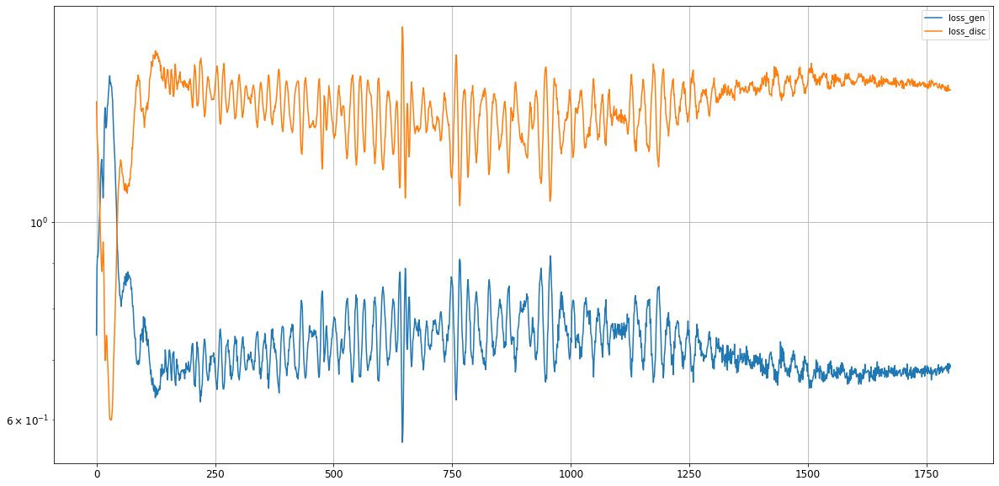

Epoch 1802/15000
0s
Epoch 1803/15000
0s
Epoch 1804/15000
0s
Epoch 1805/15000
0s
Epoch 1806/15000
0s
Epoch 1807/15000
0s
Epoch 1808/15000
0s
Epoch 1809/15000
0s
Epoch 1810/15000
0s
Epoch 1811/15000
0s
Epoch 1812/15000
0s
Epoch 1813/15000
0s
Epoch 1814/15000
0s
Epoch 1815/15000
0s
Epoch 1816/15000
0s
Epoch 1817/15000
0s
Epoch 1818/15000
0s
Epoch 1819/15000
0s
Epoch 1820/15000
0s
Epoch 1821/15000
0s
Epoch 1822/15000
0s
Epoch 1823/15000
0s
Epoch 1824/15000
0s
Epoch 1825/15000
0s
Epoch 1826/15000
0s
Epoch 1827/15000
0s
Epoch 1828/15000
0s
Epoch 1829/15000
0s
Epoch 1830/15000
0s
Epoch 1831/15000
0s
Epoch 1832/15000
0s
Epoch 1833/15000
0s
Epoch 1834/15000
0s
Epoch 1835/15000
0s
Epoch 1836/15000
0s
Epoch 1837/15000
0s
Epoch 1838/15000
0s
Epoch 1839/15000
0s
Epoch 1840/15000
0s
Epoch 1841/15000
0s
Epoch 1842/15000
0s
Epoch 1843/15000
0s
Epoch 1844/15000
0s
Epoch 1845/15000
0s
Epoch 1846/15000
0s
Epoch 1847/15000
0s
Epoch 1848/15000
0s
Epoch 1849/15000
0s
Epoch 1850/15000
0s
Epoch 1851/15000
0s


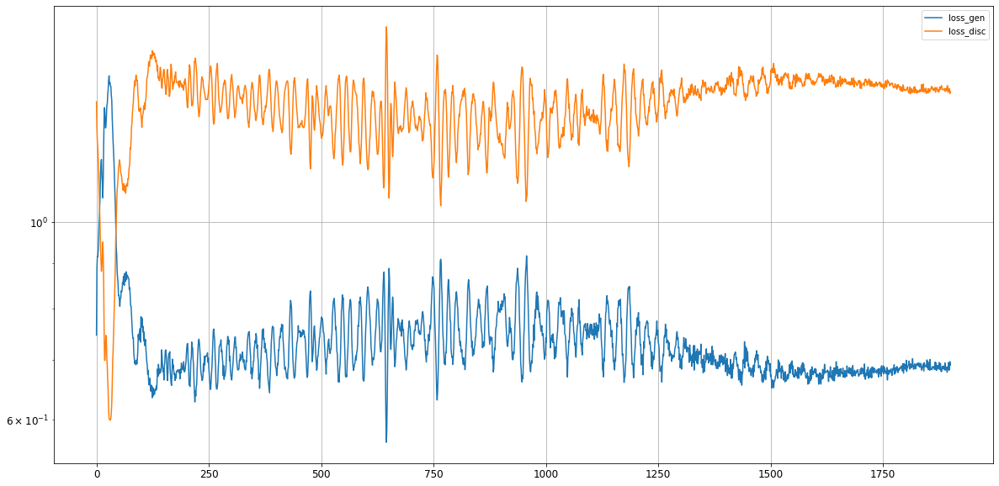

Epoch 1902/15000
0s
Epoch 1903/15000
0s
Epoch 1904/15000
0s
Epoch 1905/15000
0s
Epoch 1906/15000
0s
Epoch 1907/15000
0s
Epoch 1908/15000
0s
Epoch 1909/15000
0s
Epoch 1910/15000
0s
Epoch 1911/15000
0s
Epoch 1912/15000
0s
Epoch 1913/15000
0s
Epoch 1914/15000
0s
Epoch 1915/15000
0s
Epoch 1916/15000
0s
Epoch 1917/15000
0s
Epoch 1918/15000
0s
Epoch 1919/15000
0s
Epoch 1920/15000
0s
Epoch 1921/15000
0s
Epoch 1922/15000
0s
Epoch 1923/15000
0s
Epoch 1924/15000
0s
Epoch 1925/15000
0s
Epoch 1926/15000
0s
Epoch 1927/15000
0s
Epoch 1928/15000
0s
Epoch 1929/15000
0s
Epoch 1930/15000
0s
Epoch 1931/15000
0s
Epoch 1932/15000
0s
Epoch 1933/15000
0s
Epoch 1934/15000
0s
Epoch 1935/15000
0s
Epoch 1936/15000
0s
Epoch 1937/15000
0s
Epoch 1938/15000
0s
Epoch 1939/15000
0s
Epoch 1940/15000
0s
Epoch 1941/15000
0s
Epoch 1942/15000
0s
Epoch 1943/15000
0s
Epoch 1944/15000
0s
Epoch 1945/15000
0s
Epoch 1946/15000
0s
Epoch 1947/15000
0s
Epoch 1948/15000
0s
Epoch 1949/15000
0s
Epoch 1950/15000
0s
Epoch 1951/15000
0s


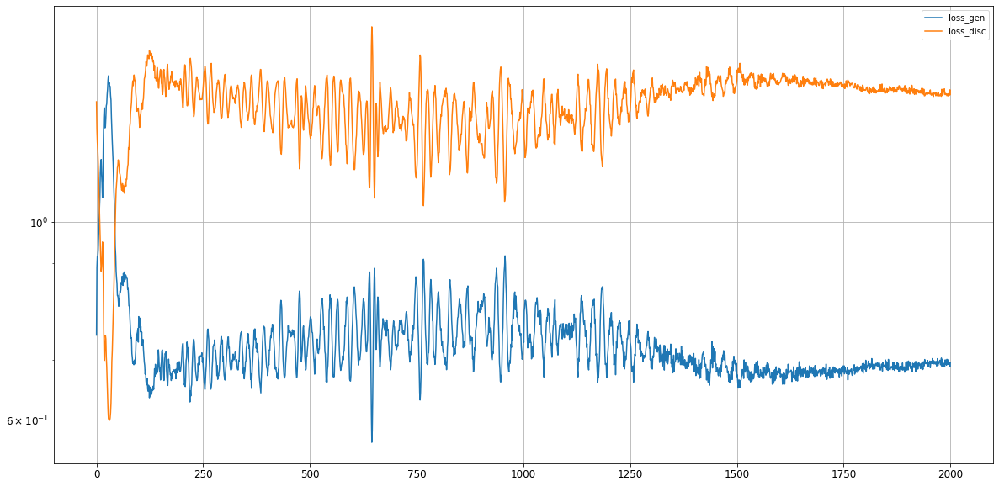

Epoch 2002/15000
0s
Epoch 2003/15000
0s
Epoch 2004/15000
0s
Epoch 2005/15000
0s
Epoch 2006/15000
0s
Epoch 2007/15000
0s
Epoch 2008/15000
0s
Epoch 2009/15000
0s
Epoch 2010/15000
0s
Epoch 2011/15000
0s
Epoch 2012/15000
0s
Epoch 2013/15000
0s
Epoch 2014/15000
0s
Epoch 2015/15000
0s
Epoch 2016/15000
0s
Epoch 2017/15000
0s
Epoch 2018/15000
0s
Epoch 2019/15000
0s
Epoch 2020/15000
0s
Epoch 2021/15000
0s
Epoch 2022/15000
0s
Epoch 2023/15000
0s
Epoch 2024/15000
0s
Epoch 2025/15000
0s
Epoch 2026/15000
0s
Epoch 2027/15000
0s
Epoch 2028/15000
0s
Epoch 2029/15000
0s
Epoch 2030/15000
0s
Epoch 2031/15000
0s
Epoch 2032/15000
0s
Epoch 2033/15000
0s
Epoch 2034/15000
0s
Epoch 2035/15000
0s
Epoch 2036/15000
0s
Epoch 2037/15000
0s
Epoch 2038/15000
0s
Epoch 2039/15000
0s
Epoch 2040/15000
0s
Epoch 2041/15000
0s
Epoch 2042/15000
0s
Epoch 2043/15000
0s
Epoch 2044/15000
0s
Epoch 2045/15000
0s
Epoch 2046/15000
0s
Epoch 2047/15000
0s
Epoch 2048/15000
0s
Epoch 2049/15000
0s
Epoch 2050/15000
0s
Epoch 2051/15000
0s


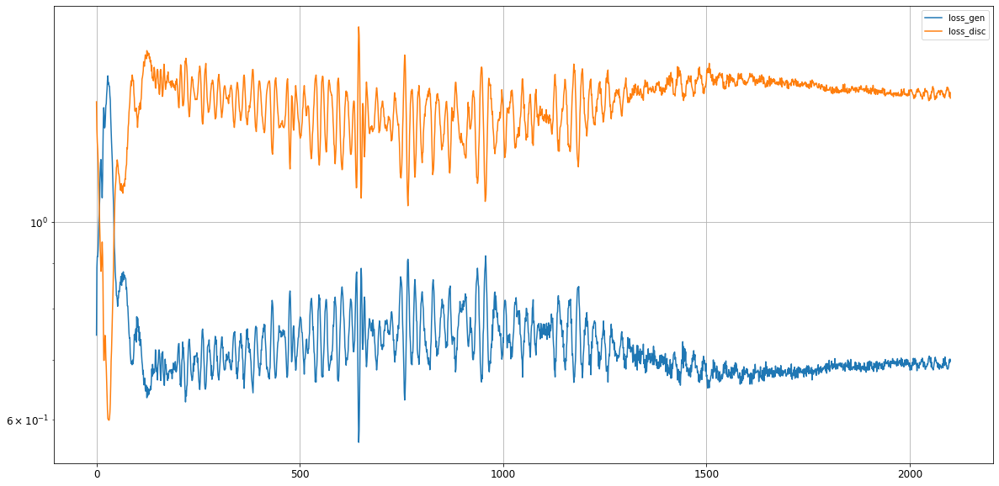

Epoch 2102/15000
0s
Epoch 2103/15000
0s
Epoch 2104/15000
0s
Epoch 2105/15000
0s
Epoch 2106/15000
0s
Epoch 2107/15000
0s
Epoch 2108/15000
0s
Epoch 2109/15000
0s
Epoch 2110/15000
0s
Epoch 2111/15000
0s
Epoch 2112/15000
0s
Epoch 2113/15000
0s
Epoch 2114/15000
0s
Epoch 2115/15000
0s
Epoch 2116/15000
0s
Epoch 2117/15000
0s
Epoch 2118/15000
0s
Epoch 2119/15000
0s
Epoch 2120/15000
0s
Epoch 2121/15000
0s
Epoch 2122/15000
0s
Epoch 2123/15000
0s
Epoch 2124/15000
0s
Epoch 2125/15000
0s
Epoch 2126/15000
0s
Epoch 2127/15000
0s
Epoch 2128/15000
0s
Epoch 2129/15000
0s
Epoch 2130/15000
0s
Epoch 2131/15000
0s
Epoch 2132/15000
0s
Epoch 2133/15000
0s
Epoch 2134/15000
0s
Epoch 2135/15000
0s
Epoch 2136/15000
0s
Epoch 2137/15000
0s
Epoch 2138/15000
0s
Epoch 2139/15000
0s
Epoch 2140/15000
0s
Epoch 2141/15000
0s
Epoch 2142/15000
0s
Epoch 2143/15000
0s
Epoch 2144/15000
0s
Epoch 2145/15000
0s
Epoch 2146/15000
0s
Epoch 2147/15000
0s
Epoch 2148/15000
0s
Epoch 2149/15000
0s
Epoch 2150/15000
0s
Epoch 2151/15000
0s


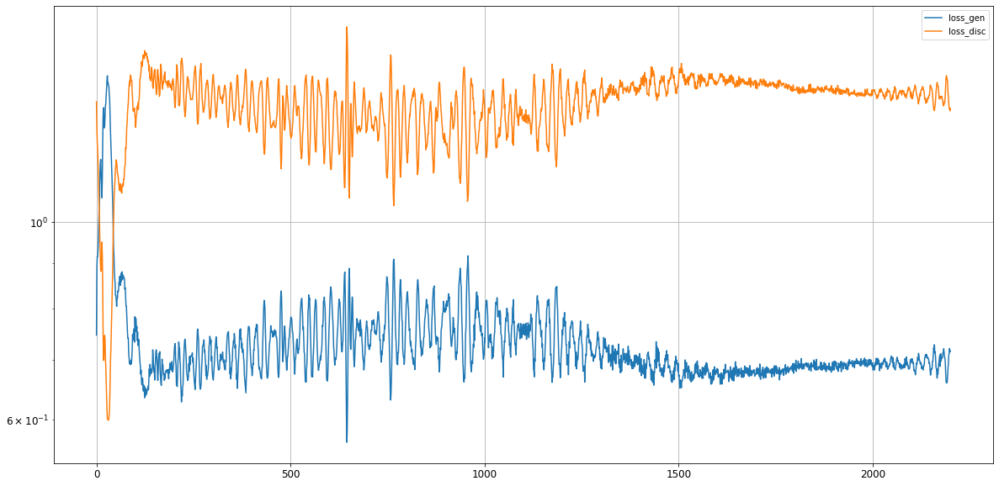

Epoch 2202/15000
0s
Epoch 2203/15000
0s
Epoch 2204/15000
0s
Epoch 2205/15000
0s
Epoch 2206/15000
0s
Epoch 2207/15000
0s
Epoch 2208/15000
0s
Epoch 2209/15000
0s
Epoch 2210/15000
0s
Epoch 2211/15000
0s
Epoch 2212/15000
0s
Epoch 2213/15000
0s
Epoch 2214/15000
0s
Epoch 2215/15000
0s
Epoch 2216/15000
0s
Epoch 2217/15000
0s
Epoch 2218/15000
0s
Epoch 2219/15000
0s
Epoch 2220/15000
0s
Epoch 2221/15000
0s
Epoch 2222/15000
0s
Epoch 2223/15000
0s
Epoch 2224/15000
0s
Epoch 2225/15000
0s
Epoch 2226/15000
0s
Epoch 2227/15000
0s
Epoch 2228/15000
0s
Epoch 2229/15000
0s
Epoch 2230/15000
0s
Epoch 2231/15000
0s
Epoch 2232/15000
0s
Epoch 2233/15000
0s
Epoch 2234/15000
0s
Epoch 2235/15000
0s
Epoch 2236/15000
0s
Epoch 2237/15000
0s
Epoch 2238/15000
0s
Epoch 2239/15000
0s
Epoch 2240/15000
0s
Epoch 2241/15000
0s
Epoch 2242/15000
0s
Epoch 2243/15000
0s
Epoch 2244/15000
0s
Epoch 2245/15000
0s
Epoch 2246/15000
0s
Epoch 2247/15000
0s
Epoch 2248/15000
0s
Epoch 2249/15000
0s
Epoch 2250/15000
0s
Epoch 2251/15000
0s


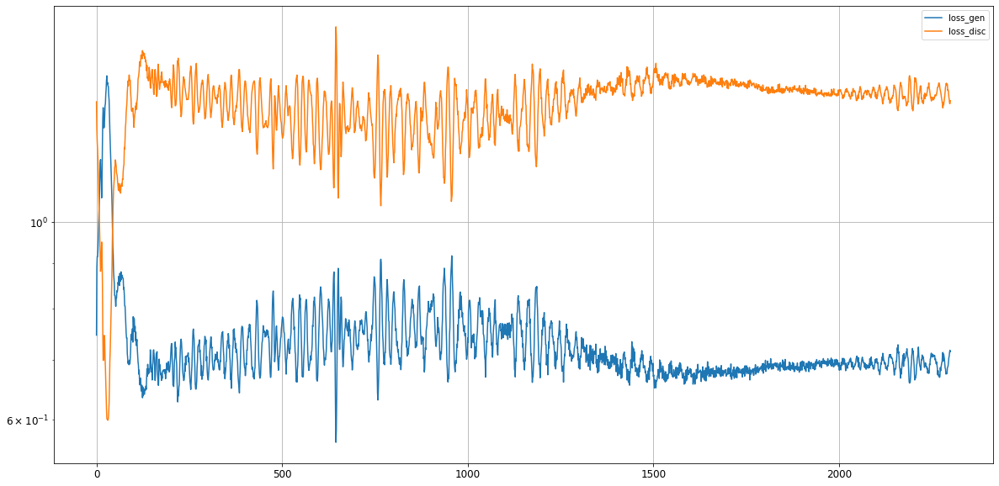

Epoch 2302/15000
0s
Epoch 2303/15000
0s
Epoch 2304/15000
0s
Epoch 2305/15000
0s
Epoch 2306/15000
0s
Epoch 2307/15000
0s
Epoch 2308/15000
0s
Epoch 2309/15000
0s
Epoch 2310/15000
0s
Epoch 2311/15000
0s
Epoch 2312/15000
0s
Epoch 2313/15000
0s
Epoch 2314/15000
0s
Epoch 2315/15000
0s
Epoch 2316/15000
0s
Epoch 2317/15000
0s
Epoch 2318/15000
0s
Epoch 2319/15000
0s
Epoch 2320/15000
0s
Epoch 2321/15000
0s
Epoch 2322/15000
0s
Epoch 2323/15000
0s
Epoch 2324/15000
0s
Epoch 2325/15000
0s
Epoch 2326/15000
0s
Epoch 2327/15000
0s
Epoch 2328/15000
0s
Epoch 2329/15000
0s
Epoch 2330/15000
0s
Epoch 2331/15000
0s
Epoch 2332/15000
0s
Epoch 2333/15000
0s
Epoch 2334/15000
0s
Epoch 2335/15000
0s
Epoch 2336/15000
0s
Epoch 2337/15000
0s
Epoch 2338/15000
0s
Epoch 2339/15000
0s
Epoch 2340/15000
0s
Epoch 2341/15000
0s
Epoch 2342/15000
0s
Epoch 2343/15000
0s
Epoch 2344/15000
0s
Epoch 2345/15000
0s
Epoch 2346/15000
0s
Epoch 2347/15000
0s
Epoch 2348/15000
0s
Epoch 2349/15000
0s
Epoch 2350/15000
0s
Epoch 2351/15000
0s


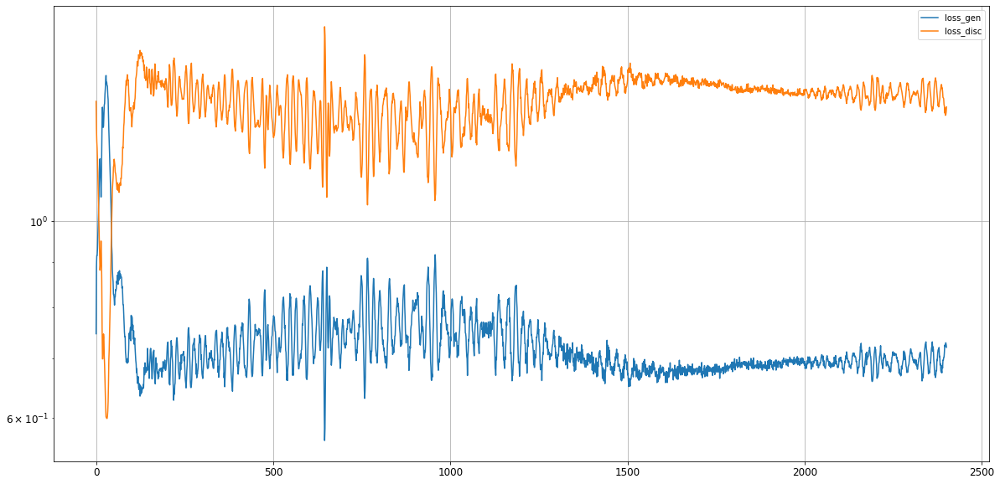

Epoch 2402/15000
0s
Epoch 2403/15000
0s
Epoch 2404/15000
0s
Epoch 2405/15000
0s
Epoch 2406/15000
0s
Epoch 2407/15000
0s
Epoch 2408/15000
0s
Epoch 2409/15000
0s
Epoch 2410/15000
0s
Epoch 2411/15000
0s
Epoch 2412/15000
0s
Epoch 2413/15000
0s
Epoch 2414/15000
0s
Epoch 2415/15000
0s
Epoch 2416/15000
0s
Epoch 2417/15000
0s
Epoch 2418/15000
0s
Epoch 2419/15000
0s
Epoch 2420/15000
0s
Epoch 2421/15000
0s
Epoch 2422/15000
0s
Epoch 2423/15000
0s
Epoch 2424/15000
0s
Epoch 2425/15000
0s
Epoch 2426/15000
0s
Epoch 2427/15000
0s
Epoch 2428/15000
0s
Epoch 2429/15000
0s
Epoch 2430/15000
0s
Epoch 2431/15000
0s
Epoch 2432/15000
0s
Epoch 2433/15000
0s
Epoch 2434/15000
0s
Epoch 2435/15000
0s
Epoch 2436/15000
0s
Epoch 2437/15000
0s
Epoch 2438/15000
0s
Epoch 2439/15000
0s
Epoch 2440/15000
0s
Epoch 2441/15000
0s
Epoch 2442/15000
0s
Epoch 2443/15000
0s
Epoch 2444/15000
0s
Epoch 2445/15000
0s
Epoch 2446/15000
0s
Epoch 2447/15000
0s
Epoch 2448/15000
0s
Epoch 2449/15000
0s
Epoch 2450/15000
0s
Epoch 2451/15000
0s


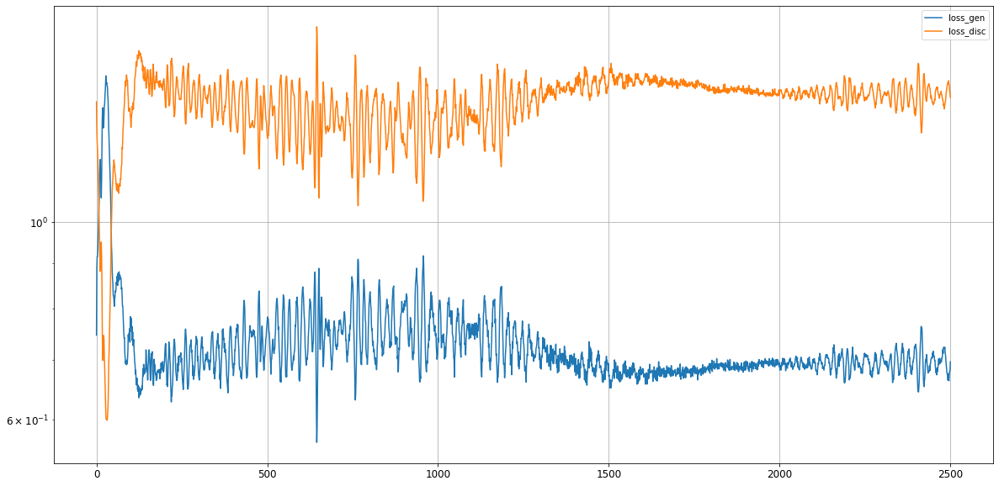

Epoch 2502/15000
0s
Epoch 2503/15000
0s
Epoch 2504/15000
0s
Epoch 2505/15000
0s
Epoch 2506/15000
0s
Epoch 2507/15000
0s
Epoch 2508/15000
0s
Epoch 2509/15000
0s
Epoch 2510/15000
0s
Epoch 2511/15000
0s
Epoch 2512/15000
0s
Epoch 2513/15000
0s
Epoch 2514/15000
0s
Epoch 2515/15000
0s
Epoch 2516/15000
0s
Epoch 2517/15000
0s
Epoch 2518/15000
0s
Epoch 2519/15000
0s
Epoch 2520/15000
0s
Epoch 2521/15000
0s
Epoch 2522/15000
0s
Epoch 2523/15000
0s
Epoch 2524/15000
0s
Epoch 2525/15000
0s
Epoch 2526/15000
0s
Epoch 2527/15000
0s
Epoch 2528/15000
0s
Epoch 2529/15000
0s
Epoch 2530/15000
0s
Epoch 2531/15000
0s
Epoch 2532/15000
0s
Epoch 2533/15000
0s
Epoch 2534/15000
0s
Epoch 2535/15000
0s
Epoch 2536/15000
0s
Epoch 2537/15000
0s
Epoch 2538/15000
0s
Epoch 2539/15000
0s
Epoch 2540/15000
0s
Epoch 2541/15000
0s
Epoch 2542/15000
0s
Epoch 2543/15000
0s
Epoch 2544/15000
0s
Epoch 2545/15000
0s
Epoch 2546/15000
0s
Epoch 2547/15000
0s
Epoch 2548/15000
0s
Epoch 2549/15000
0s
Epoch 2550/15000
0s
Epoch 2551/15000
0s


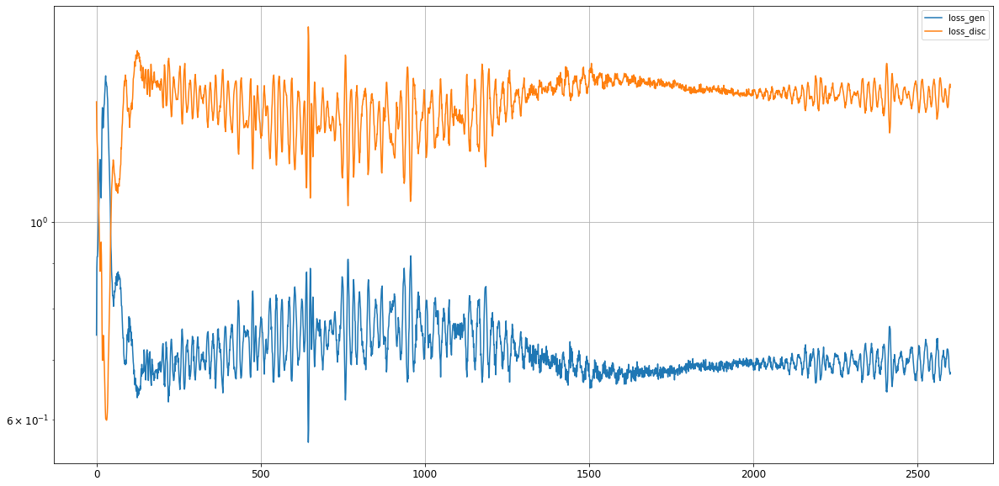

Epoch 2602/15000
0s
Epoch 2603/15000
0s
Epoch 2604/15000
0s
Epoch 2605/15000
0s
Epoch 2606/15000
0s
Epoch 2607/15000
0s
Epoch 2608/15000
0s
Epoch 2609/15000
0s
Epoch 2610/15000
0s
Epoch 2611/15000
0s
Epoch 2612/15000
0s
Epoch 2613/15000
0s
Epoch 2614/15000
0s
Epoch 2615/15000
0s
Epoch 2616/15000
0s
Epoch 2617/15000
0s
Epoch 2618/15000
0s
Epoch 2619/15000
0s
Epoch 2620/15000
0s
Epoch 2621/15000
0s
Epoch 2622/15000
0s
Epoch 2623/15000
0s
Epoch 2624/15000
0s
Epoch 2625/15000
0s
Epoch 2626/15000
0s
Epoch 2627/15000
0s
Epoch 2628/15000
0s
Epoch 2629/15000
0s
Epoch 2630/15000
0s
Epoch 2631/15000
0s
Epoch 2632/15000
0s
Epoch 2633/15000
0s
Epoch 2634/15000
0s
Epoch 2635/15000
0s
Epoch 2636/15000
0s
Epoch 2637/15000
0s
Epoch 2638/15000
0s
Epoch 2639/15000
0s
Epoch 2640/15000
0s
Epoch 2641/15000
0s
Epoch 2642/15000
0s
Epoch 2643/15000
0s
Epoch 2644/15000
0s
Epoch 2645/15000
0s
Epoch 2646/15000
0s
Epoch 2647/15000
0s
Epoch 2648/15000
0s
Epoch 2649/15000
0s
Epoch 2650/15000
0s
Epoch 2651/15000
0s


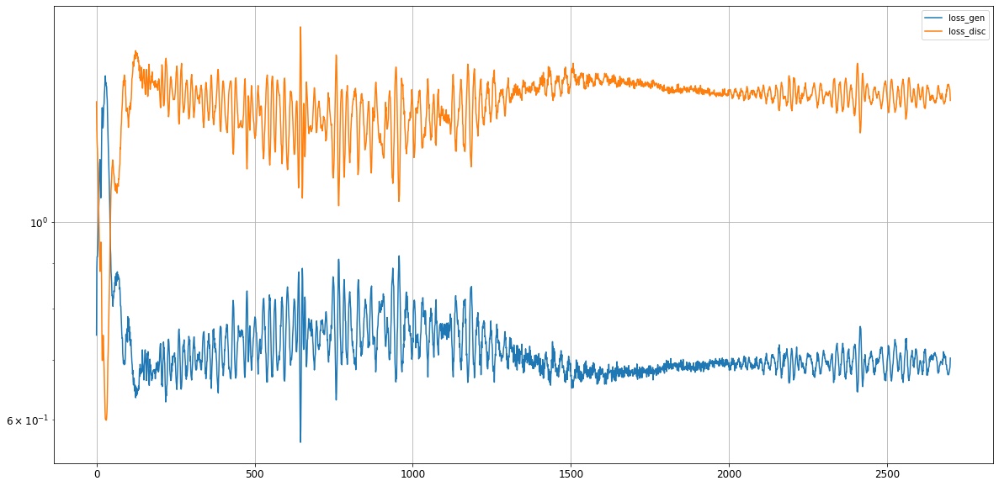

Epoch 2702/15000
0s
Epoch 2703/15000
0s
Epoch 2704/15000
0s
Epoch 2705/15000
0s
Epoch 2706/15000
0s
Epoch 2707/15000
0s
Epoch 2708/15000
0s
Epoch 2709/15000
0s
Epoch 2710/15000
0s
Epoch 2711/15000
0s
Epoch 2712/15000
0s
Epoch 2713/15000
0s
Epoch 2714/15000
0s
Epoch 2715/15000
0s
Epoch 2716/15000
0s
Epoch 2717/15000
0s
Epoch 2718/15000
0s
Epoch 2719/15000
0s
Epoch 2720/15000
0s
Epoch 2721/15000
0s
Epoch 2722/15000
0s
Epoch 2723/15000
0s
Epoch 2724/15000
0s
Epoch 2725/15000
0s
Epoch 2726/15000
0s
Epoch 2727/15000
0s
Epoch 2728/15000
0s
Epoch 2729/15000
0s
Epoch 2730/15000
0s
Epoch 2731/15000
0s
Epoch 2732/15000
0s
Epoch 2733/15000
0s
Epoch 2734/15000
0s
Epoch 2735/15000
0s
Epoch 2736/15000
0s
Epoch 2737/15000
0s
Epoch 2738/15000
0s
Epoch 2739/15000
0s
Epoch 2740/15000
0s
Epoch 2741/15000
0s
Epoch 2742/15000
0s
Epoch 2743/15000
0s
Epoch 2744/15000
0s
Epoch 2745/15000
0s
Epoch 2746/15000
0s
Epoch 2747/15000
0s
Epoch 2748/15000
0s
Epoch 2749/15000
0s
Epoch 2750/15000
0s
Epoch 2751/15000
0s


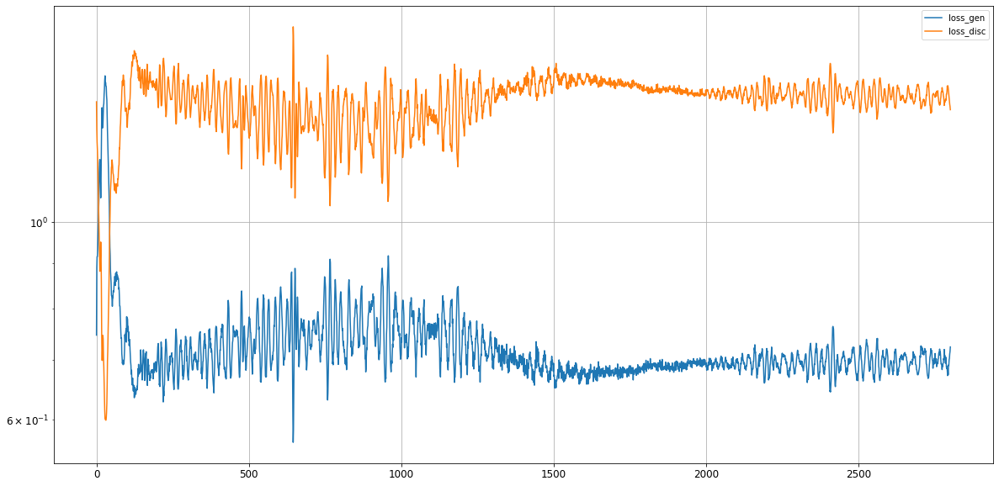

Epoch 2802/15000
0s
Epoch 2803/15000
0s
Epoch 2804/15000
0s
Epoch 2805/15000
0s
Epoch 2806/15000
0s
Epoch 2807/15000
0s
Epoch 2808/15000
0s
Epoch 2809/15000
0s
Epoch 2810/15000
0s
Epoch 2811/15000
0s
Epoch 2812/15000
0s
Epoch 2813/15000
0s
Epoch 2814/15000
0s
Epoch 2815/15000
0s
Epoch 2816/15000
0s
Epoch 2817/15000
0s
Epoch 2818/15000
0s
Epoch 2819/15000
0s
Epoch 2820/15000
0s
Epoch 2821/15000
0s
Epoch 2822/15000
0s
Epoch 2823/15000
0s
Epoch 2824/15000
0s
Epoch 2825/15000
0s
Epoch 2826/15000
0s
Epoch 2827/15000
0s
Epoch 2828/15000
0s
Epoch 2829/15000
0s
Epoch 2830/15000
0s
Epoch 2831/15000
0s
Epoch 2832/15000
0s
Epoch 2833/15000
0s
Epoch 2834/15000
0s
Epoch 2835/15000
0s
Epoch 2836/15000
0s
Epoch 2837/15000
0s
Epoch 2838/15000
0s
Epoch 2839/15000
0s
Epoch 2840/15000
0s
Epoch 2841/15000
0s
Epoch 2842/15000
0s
Epoch 2843/15000
0s
Epoch 2844/15000
0s
Epoch 2845/15000
0s
Epoch 2846/15000
0s
Epoch 2847/15000
0s
Epoch 2848/15000
0s
Epoch 2849/15000
0s
Epoch 2850/15000
0s
Epoch 2851/15000
0s


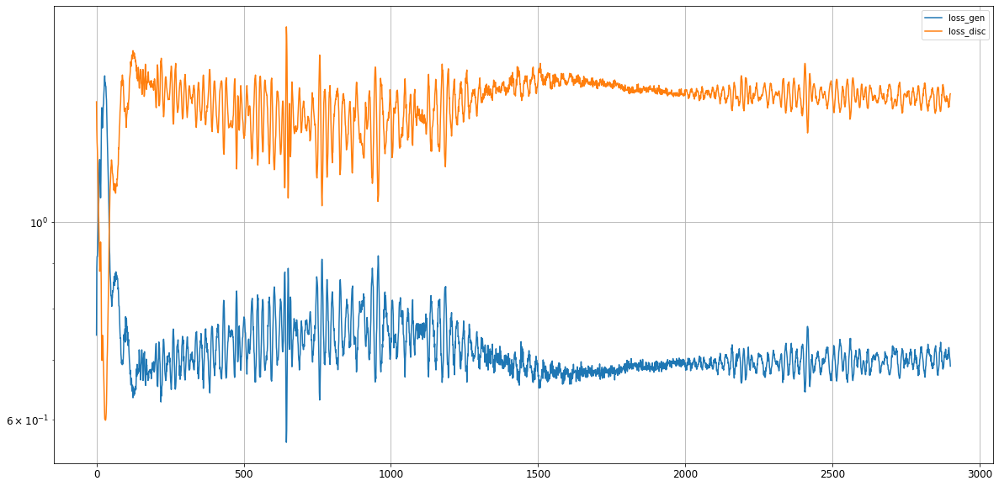

Epoch 2902/15000
0s
Epoch 2903/15000
0s
Epoch 2904/15000
0s
Epoch 2905/15000
0s
Epoch 2906/15000
0s
Epoch 2907/15000
0s
Epoch 2908/15000
0s
Epoch 2909/15000
0s
Epoch 2910/15000
0s
Epoch 2911/15000
0s
Epoch 2912/15000
0s
Epoch 2913/15000
0s
Epoch 2914/15000
0s
Epoch 2915/15000
0s
Epoch 2916/15000
0s
Epoch 2917/15000
0s
Epoch 2918/15000
0s
Epoch 2919/15000
0s
Epoch 2920/15000
0s
Epoch 2921/15000
0s
Epoch 2922/15000
0s
Epoch 2923/15000
0s
Epoch 2924/15000
0s
Epoch 2925/15000
0s
Epoch 2926/15000
0s
Epoch 2927/15000
0s
Epoch 2928/15000
0s
Epoch 2929/15000
0s
Epoch 2930/15000
0s
Epoch 2931/15000
0s
Epoch 2932/15000
0s
Epoch 2933/15000
0s
Epoch 2934/15000
0s
Epoch 2935/15000
0s
Epoch 2936/15000
0s
Epoch 2937/15000
0s
Epoch 2938/15000
0s
Epoch 2939/15000
0s
Epoch 2940/15000
0s
Epoch 2941/15000
0s
Epoch 2942/15000
0s
Epoch 2943/15000
0s
Epoch 2944/15000
0s
Epoch 2945/15000
0s
Epoch 2946/15000
0s
Epoch 2947/15000
0s
Epoch 2948/15000
0s
Epoch 2949/15000
0s
Epoch 2950/15000
0s
Epoch 2951/15000
0s


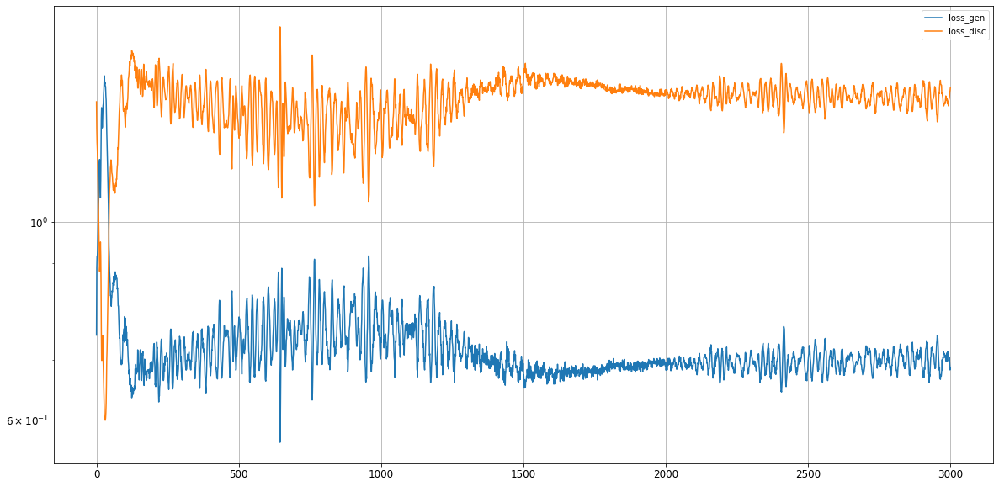

Epoch 3002/15000
0s
Epoch 3003/15000
0s
Epoch 3004/15000
0s
Epoch 3005/15000
0s
Epoch 3006/15000
0s
Epoch 3007/15000
0s
Epoch 3008/15000
0s
Epoch 3009/15000
0s
Epoch 3010/15000
0s
Epoch 3011/15000
0s
Epoch 3012/15000
0s
Epoch 3013/15000
0s
Epoch 3014/15000
0s
Epoch 3015/15000
0s
Epoch 3016/15000
0s
Epoch 3017/15000
0s
Epoch 3018/15000
0s
Epoch 3019/15000
0s
Epoch 3020/15000
0s
Epoch 3021/15000
0s
Epoch 3022/15000
0s
Epoch 3023/15000
0s
Epoch 3024/15000
0s
Epoch 3025/15000
0s
Epoch 3026/15000
0s
Epoch 3027/15000
0s
Epoch 3028/15000
0s
Epoch 3029/15000
0s
Epoch 3030/15000
0s
Epoch 3031/15000
0s
Epoch 3032/15000
0s
Epoch 3033/15000
0s
Epoch 3034/15000
0s
Epoch 3035/15000
0s
Epoch 3036/15000
0s
Epoch 3037/15000
0s
Epoch 3038/15000
0s
Epoch 3039/15000
0s
Epoch 3040/15000
0s
Epoch 3041/15000
0s
Epoch 3042/15000
0s
Epoch 3043/15000
0s
Epoch 3044/15000
0s
Epoch 3045/15000
0s
Epoch 3046/15000
0s
Epoch 3047/15000
0s
Epoch 3048/15000
0s
Epoch 3049/15000
0s
Epoch 3050/15000
0s
Epoch 3051/15000
0s


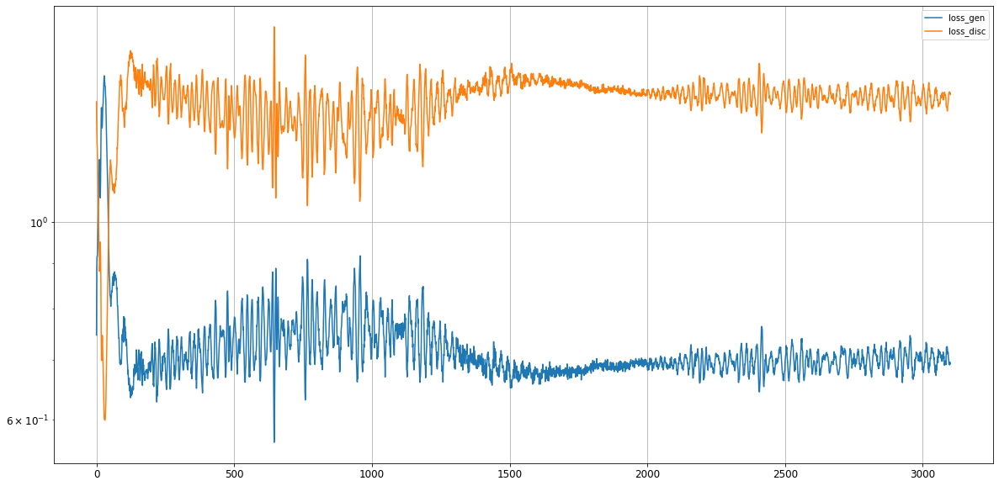

Epoch 3102/15000
0s
Epoch 3103/15000
0s
Epoch 3104/15000
0s
Epoch 3105/15000
0s
Epoch 3106/15000
0s
Epoch 3107/15000
0s
Epoch 3108/15000
0s
Epoch 3109/15000
0s
Epoch 3110/15000
0s
Epoch 3111/15000
0s
Epoch 3112/15000
0s
Epoch 3113/15000
0s
Epoch 3114/15000
0s
Epoch 3115/15000
0s
Epoch 3116/15000
0s
Epoch 3117/15000
0s
Epoch 3118/15000
0s
Epoch 3119/15000
0s
Epoch 3120/15000
0s
Epoch 3121/15000
0s
Epoch 3122/15000
0s
Epoch 3123/15000
0s
Epoch 3124/15000
0s
Epoch 3125/15000
0s
Epoch 3126/15000
0s
Epoch 3127/15000
0s
Epoch 3128/15000
0s
Epoch 3129/15000
0s
Epoch 3130/15000
0s
Epoch 3131/15000
0s
Epoch 3132/15000
0s
Epoch 3133/15000
0s
Epoch 3134/15000
0s
Epoch 3135/15000
0s
Epoch 3136/15000
0s
Epoch 3137/15000
0s
Epoch 3138/15000
0s
Epoch 3139/15000
0s
Epoch 3140/15000
0s
Epoch 3141/15000
0s
Epoch 3142/15000
0s
Epoch 3143/15000
0s
Epoch 3144/15000
0s
Epoch 3145/15000
0s
Epoch 3146/15000
0s
Epoch 3147/15000
0s
Epoch 3148/15000
0s
Epoch 3149/15000
0s
Epoch 3150/15000
0s
Epoch 3151/15000
0s


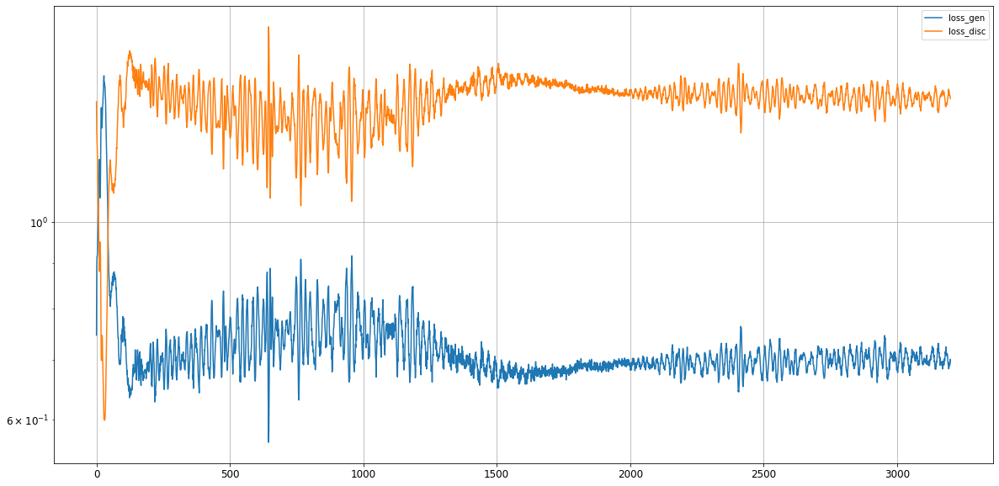

Epoch 3202/15000
0s
Epoch 3203/15000
0s
Epoch 3204/15000
0s
Epoch 3205/15000
0s
Epoch 3206/15000
0s
Epoch 3207/15000
0s
Epoch 3208/15000
0s
Epoch 3209/15000
0s
Epoch 3210/15000
0s
Epoch 3211/15000
0s
Epoch 3212/15000
0s
Epoch 3213/15000
0s
Epoch 3214/15000
0s
Epoch 3215/15000
0s
Epoch 3216/15000
0s
Epoch 3217/15000
0s
Epoch 3218/15000
0s
Epoch 3219/15000
0s
Epoch 3220/15000
0s
Epoch 3221/15000
0s
Epoch 3222/15000
0s
Epoch 3223/15000
0s
Epoch 3224/15000
0s
Epoch 3225/15000
0s
Epoch 3226/15000
0s
Epoch 3227/15000
0s
Epoch 3228/15000
0s
Epoch 3229/15000
0s
Epoch 3230/15000
0s
Epoch 3231/15000
0s
Epoch 3232/15000
0s
Epoch 3233/15000
0s
Epoch 3234/15000
0s
Epoch 3235/15000
0s
Epoch 3236/15000
0s
Epoch 3237/15000
0s
Epoch 3238/15000
0s
Epoch 3239/15000
0s
Epoch 3240/15000
0s
Epoch 3241/15000
0s
Epoch 3242/15000
0s
Epoch 3243/15000
0s
Epoch 3244/15000
0s
Epoch 3245/15000
0s
Epoch 3246/15000
0s
Epoch 3247/15000
0s
Epoch 3248/15000
0s
Epoch 3249/15000
0s
Epoch 3250/15000
0s
Epoch 3251/15000
0s


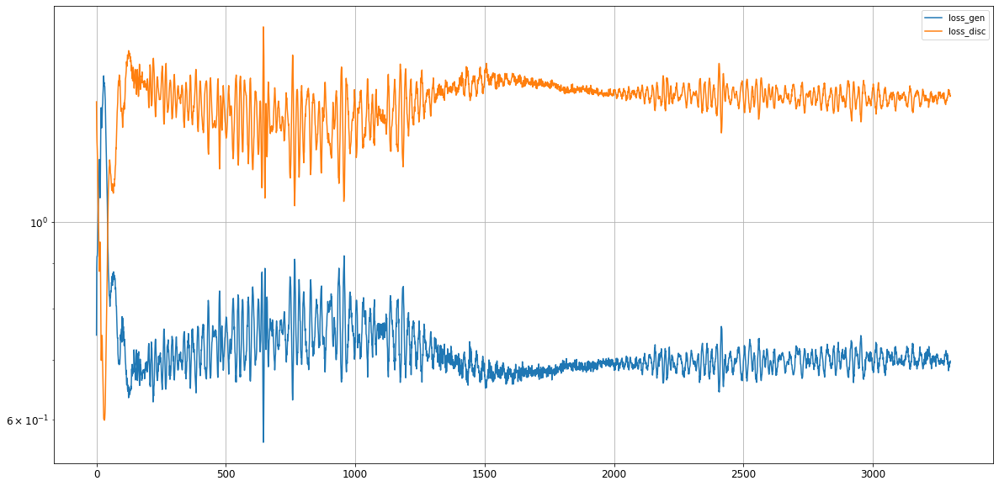

Epoch 3302/15000
0s
Epoch 3303/15000
0s
Epoch 3304/15000
0s
Epoch 3305/15000
0s
Epoch 3306/15000
0s
Epoch 3307/15000
0s
Epoch 3308/15000
0s
Epoch 3309/15000
0s
Epoch 3310/15000
0s
Epoch 3311/15000
0s
Epoch 3312/15000
0s
Epoch 3313/15000
0s
Epoch 3314/15000
0s
Epoch 3315/15000
0s
Epoch 3316/15000
0s
Epoch 3317/15000
0s
Epoch 3318/15000
0s
Epoch 3319/15000
0s
Epoch 3320/15000
0s
Epoch 3321/15000
0s
Epoch 3322/15000
0s
Epoch 3323/15000
0s
Epoch 3324/15000
0s
Epoch 3325/15000
0s
Epoch 3326/15000
0s
Epoch 3327/15000
0s
Epoch 3328/15000
0s
Epoch 3329/15000
0s
Epoch 3330/15000
0s
Epoch 3331/15000
0s
Epoch 3332/15000
0s
Epoch 3333/15000
0s
Epoch 3334/15000
0s
Epoch 3335/15000
0s
Epoch 3336/15000
0s
Epoch 3337/15000
0s
Epoch 3338/15000
0s
Epoch 3339/15000
0s
Epoch 3340/15000
0s
Epoch 3341/15000
0s
Epoch 3342/15000
0s
Epoch 3343/15000
0s
Epoch 3344/15000
0s
Epoch 3345/15000
0s
Epoch 3346/15000
0s
Epoch 3347/15000
0s
Epoch 3348/15000
0s
Epoch 3349/15000
0s
Epoch 3350/15000
0s
Epoch 3351/15000
0s


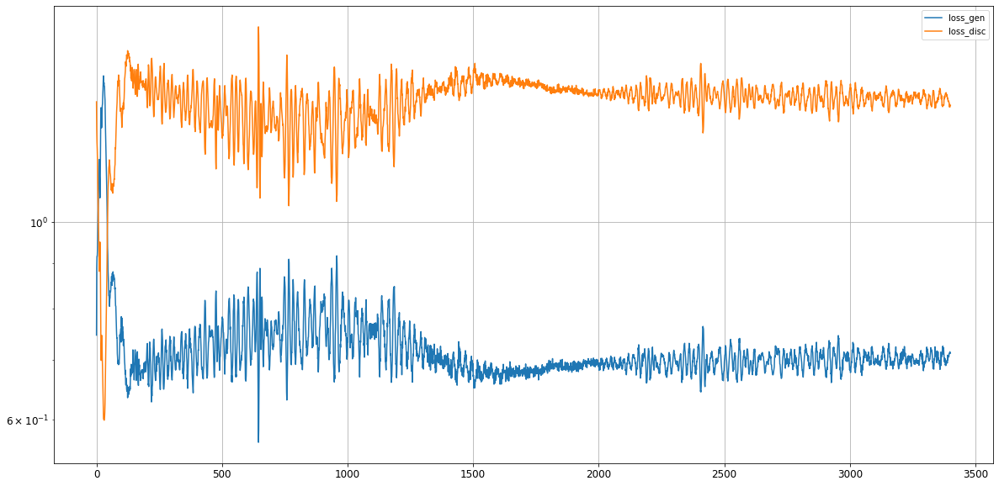

Epoch 3402/15000
0s
Epoch 3403/15000
0s
Epoch 3404/15000
0s
Epoch 3405/15000
0s
Epoch 3406/15000
0s
Epoch 3407/15000
0s
Epoch 3408/15000
0s
Epoch 3409/15000
0s
Epoch 3410/15000
0s
Epoch 3411/15000
0s
Epoch 3412/15000
0s
Epoch 3413/15000
0s
Epoch 3414/15000
0s
Epoch 3415/15000
0s
Epoch 3416/15000
0s
Epoch 3417/15000
0s
Epoch 3418/15000
0s
Epoch 3419/15000
0s
Epoch 3420/15000
0s
Epoch 3421/15000
0s
Epoch 3422/15000
0s
Epoch 3423/15000
0s
Epoch 3424/15000
0s
Epoch 3425/15000
0s
Epoch 3426/15000
0s
Epoch 3427/15000
0s
Epoch 3428/15000
0s
Epoch 3429/15000
0s
Epoch 3430/15000
0s
Epoch 3431/15000
0s
Epoch 3432/15000
0s
Epoch 3433/15000
0s
Epoch 3434/15000
0s
Epoch 3435/15000
0s
Epoch 3436/15000
0s
Epoch 3437/15000
0s
Epoch 3438/15000
0s
Epoch 3439/15000
0s
Epoch 3440/15000
0s
Epoch 3441/15000
0s
Epoch 3442/15000
0s
Epoch 3443/15000
0s
Epoch 3444/15000
0s
Epoch 3445/15000
0s
Epoch 3446/15000
0s
Epoch 3447/15000
0s
Epoch 3448/15000
0s
Epoch 3449/15000
0s
Epoch 3450/15000
0s
Epoch 3451/15000
0s


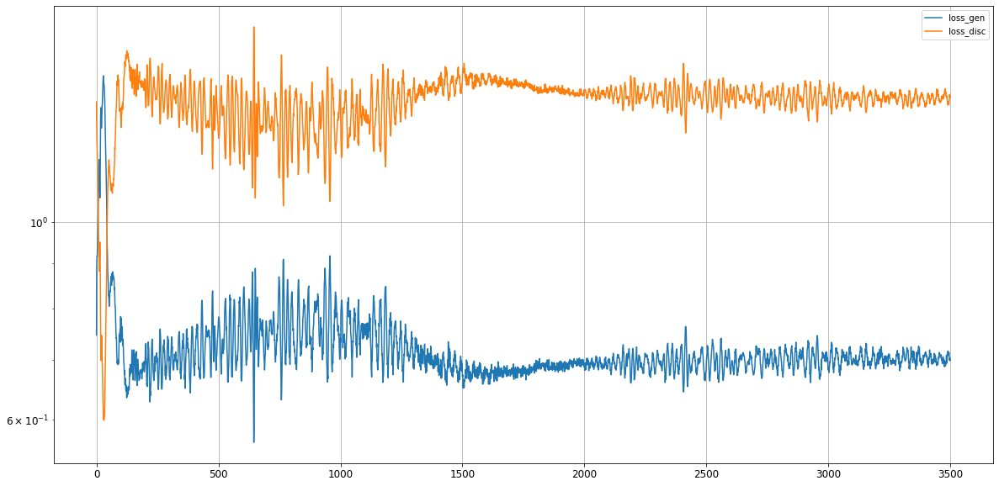

Epoch 3502/15000
0s
Epoch 3503/15000
0s
Epoch 3504/15000
0s
Epoch 3505/15000
0s
Epoch 3506/15000
0s
Epoch 3507/15000
0s
Epoch 3508/15000
0s
Epoch 3509/15000
0s
Epoch 3510/15000
0s
Epoch 3511/15000
0s
Epoch 3512/15000
0s
Epoch 3513/15000
0s
Epoch 3514/15000
0s
Epoch 3515/15000
0s
Epoch 3516/15000
0s
Epoch 3517/15000
0s
Epoch 3518/15000
0s
Epoch 3519/15000
0s
Epoch 3520/15000
0s
Epoch 3521/15000
0s
Epoch 3522/15000
0s
Epoch 3523/15000
0s
Epoch 3524/15000
0s
Epoch 3525/15000
0s
Epoch 3526/15000
0s
Epoch 3527/15000
0s
Epoch 3528/15000
0s
Epoch 3529/15000
0s
Epoch 3530/15000
0s
Epoch 3531/15000
0s
Epoch 3532/15000
0s
Epoch 3533/15000
0s
Epoch 3534/15000
0s
Epoch 3535/15000
0s
Epoch 3536/15000
0s
Epoch 3537/15000
0s
Epoch 3538/15000
0s
Epoch 3539/15000
0s
Epoch 3540/15000
0s
Epoch 3541/15000
0s
Epoch 3542/15000
0s
Epoch 3543/15000
0s
Epoch 3544/15000
0s
Epoch 3545/15000
0s
Epoch 3546/15000
0s
Epoch 3547/15000
0s
Epoch 3548/15000
0s
Epoch 3549/15000
0s
Epoch 3550/15000
0s
Epoch 3551/15000
0s


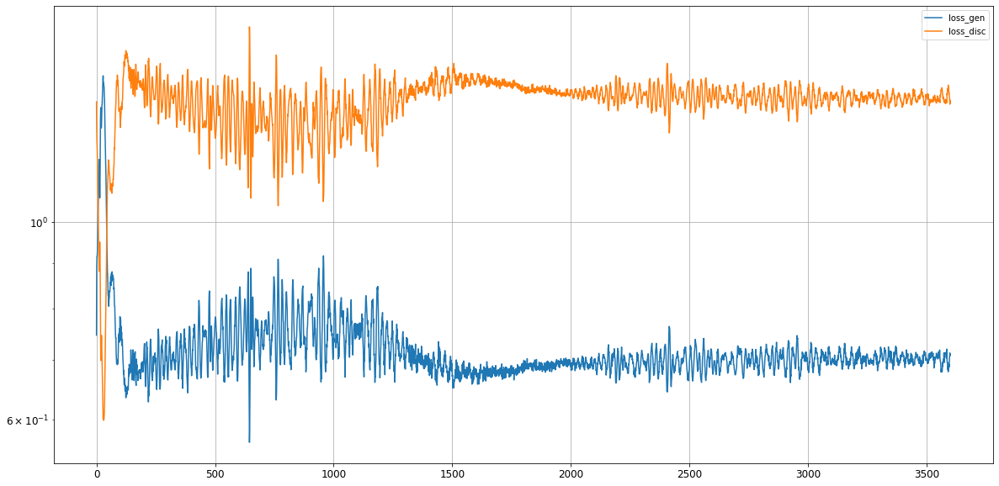

Epoch 3602/15000
0s
Epoch 3603/15000
0s
Epoch 3604/15000
0s
Epoch 3605/15000
0s
Epoch 3606/15000
0s
Epoch 3607/15000
0s
Epoch 3608/15000
0s
Epoch 3609/15000
0s
Epoch 3610/15000
0s
Epoch 3611/15000
0s
Epoch 3612/15000
0s
Epoch 3613/15000
0s
Epoch 3614/15000
0s
Epoch 3615/15000
0s
Epoch 3616/15000
0s
Epoch 3617/15000
0s
Epoch 3618/15000
0s
Epoch 3619/15000
0s
Epoch 3620/15000
0s
Epoch 3621/15000
0s
Epoch 3622/15000
0s
Epoch 3623/15000
0s
Epoch 3624/15000
0s
Epoch 3625/15000
0s
Epoch 3626/15000
0s
Epoch 3627/15000
0s
Epoch 3628/15000
0s
Epoch 3629/15000
0s
Epoch 3630/15000
0s
Epoch 3631/15000
0s
Epoch 3632/15000
0s
Epoch 3633/15000
0s
Epoch 3634/15000
0s
Epoch 3635/15000
0s
Epoch 3636/15000
0s
Epoch 3637/15000
0s
Epoch 3638/15000
0s
Epoch 3639/15000
0s
Epoch 3640/15000
0s
Epoch 3641/15000
0s
Epoch 3642/15000
0s
Epoch 3643/15000
0s
Epoch 3644/15000
0s
Epoch 3645/15000
0s
Epoch 3646/15000
0s
Epoch 3647/15000
0s
Epoch 3648/15000
0s
Epoch 3649/15000
0s
Epoch 3650/15000
0s
Epoch 3651/15000
0s


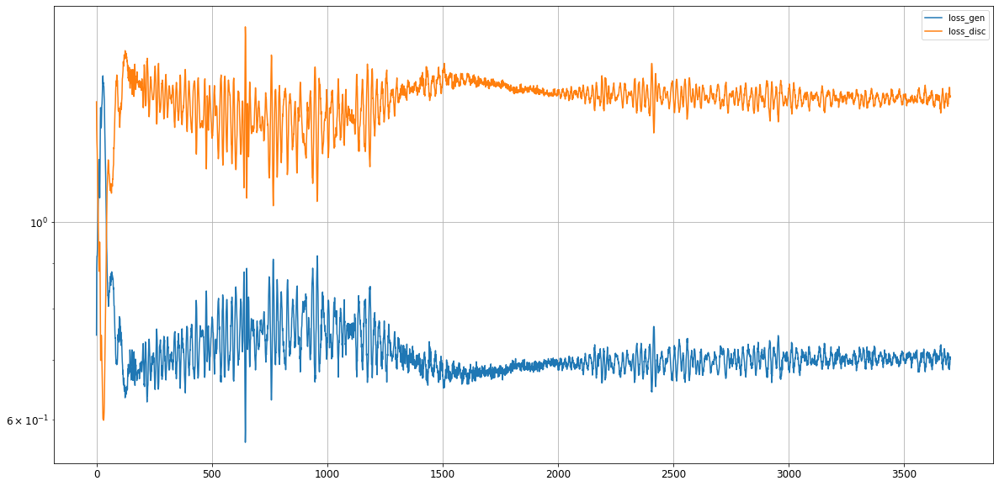

Epoch 3702/15000
0s
Epoch 3703/15000
0s
Epoch 3704/15000
0s
Epoch 3705/15000
0s
Epoch 3706/15000
0s
Epoch 3707/15000
0s
Epoch 3708/15000
0s
Epoch 3709/15000
0s
Epoch 3710/15000
0s
Epoch 3711/15000
0s
Epoch 3712/15000
0s
Epoch 3713/15000
0s
Epoch 3714/15000
0s
Epoch 3715/15000
0s
Epoch 3716/15000
0s
Epoch 3717/15000
0s
Epoch 3718/15000
0s
Epoch 3719/15000
0s
Epoch 3720/15000
0s
Epoch 3721/15000
0s
Epoch 3722/15000
0s
Epoch 3723/15000
0s
Epoch 3724/15000
0s
Epoch 3725/15000
0s
Epoch 3726/15000
0s
Epoch 3727/15000
0s
Epoch 3728/15000
0s
Epoch 3729/15000
0s
Epoch 3730/15000
0s
Epoch 3731/15000
0s
Epoch 3732/15000
0s
Epoch 3733/15000
0s
Epoch 3734/15000
0s
Epoch 3735/15000
0s
Epoch 3736/15000
0s
Epoch 3737/15000
0s
Epoch 3738/15000
0s
Epoch 3739/15000
0s
Epoch 3740/15000
0s
Epoch 3741/15000
0s
Epoch 3742/15000
0s
Epoch 3743/15000
0s
Epoch 3744/15000
0s
Epoch 3745/15000
0s
Epoch 3746/15000
0s
Epoch 3747/15000
0s
Epoch 3748/15000
0s
Epoch 3749/15000
0s
Epoch 3750/15000
0s
Epoch 3751/15000
0s


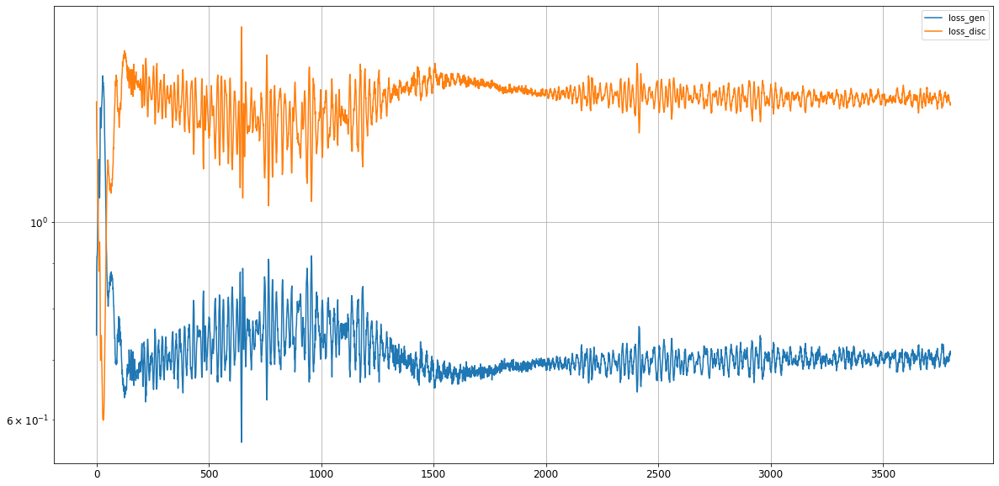

Epoch 3802/15000
0s
Epoch 3803/15000
0s
Epoch 3804/15000
0s
Epoch 3805/15000
0s
Epoch 3806/15000
0s
Epoch 3807/15000
0s
Epoch 3808/15000
0s
Epoch 3809/15000
0s
Epoch 3810/15000
0s
Epoch 3811/15000
0s
Epoch 3812/15000
0s
Epoch 3813/15000
0s
Epoch 3814/15000
0s
Epoch 3815/15000
0s
Epoch 3816/15000
0s
Epoch 3817/15000
0s
Epoch 3818/15000
0s
Epoch 3819/15000
0s
Epoch 3820/15000
0s
Epoch 3821/15000
0s
Epoch 3822/15000
0s
Epoch 3823/15000
0s
Epoch 3824/15000
0s
Epoch 3825/15000
0s
Epoch 3826/15000
0s
Epoch 3827/15000
0s
Epoch 3828/15000
0s
Epoch 3829/15000
0s
Epoch 3830/15000
0s
Epoch 3831/15000
0s
Epoch 3832/15000
0s
Epoch 3833/15000
0s
Epoch 3834/15000
0s
Epoch 3835/15000
0s
Epoch 3836/15000
0s
Epoch 3837/15000
0s
Epoch 3838/15000
0s
Epoch 3839/15000
0s
Epoch 3840/15000
0s
Epoch 3841/15000
0s
Epoch 3842/15000
0s
Epoch 3843/15000
0s
Epoch 3844/15000
0s
Epoch 3845/15000
0s
Epoch 3846/15000
0s
Epoch 3847/15000
0s
Epoch 3848/15000
0s
Epoch 3849/15000
0s
Epoch 3850/15000
0s
Epoch 3851/15000
0s


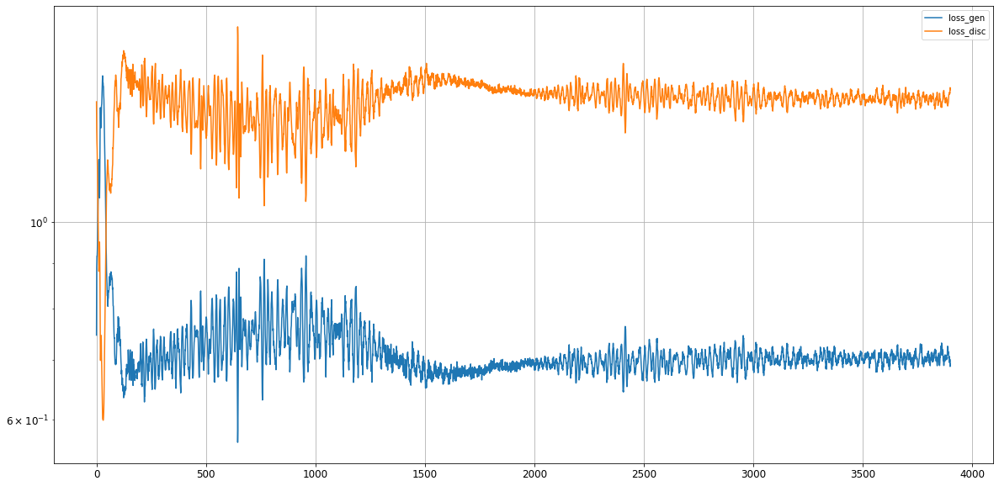

Epoch 3902/15000
0s
Epoch 3903/15000
0s
Epoch 3904/15000
0s
Epoch 3905/15000
0s
Epoch 3906/15000
0s
Epoch 3907/15000
0s
Epoch 3908/15000
0s
Epoch 3909/15000
0s
Epoch 3910/15000
0s
Epoch 3911/15000
0s
Epoch 3912/15000
0s
Epoch 3913/15000
0s
Epoch 3914/15000
0s
Epoch 3915/15000
0s
Epoch 3916/15000
0s
Epoch 3917/15000
0s
Epoch 3918/15000
0s
Epoch 3919/15000
0s
Epoch 3920/15000
0s
Epoch 3921/15000
0s
Epoch 3922/15000
0s
Epoch 3923/15000
0s
Epoch 3924/15000
0s
Epoch 3925/15000
0s
Epoch 3926/15000
0s
Epoch 3927/15000
0s
Epoch 3928/15000
0s
Epoch 3929/15000
0s
Epoch 3930/15000
0s
Epoch 3931/15000
0s
Epoch 3932/15000
0s
Epoch 3933/15000
0s
Epoch 3934/15000
0s
Epoch 3935/15000
0s
Epoch 3936/15000
0s
Epoch 3937/15000
0s
Epoch 3938/15000
0s
Epoch 3939/15000
0s
Epoch 3940/15000
0s
Epoch 3941/15000
0s
Epoch 3942/15000
0s
Epoch 3943/15000
0s
Epoch 3944/15000
0s
Epoch 3945/15000
0s
Epoch 3946/15000
0s
Epoch 3947/15000
0s
Epoch 3948/15000
0s
Epoch 3949/15000
0s
Epoch 3950/15000
0s
Epoch 3951/15000
0s


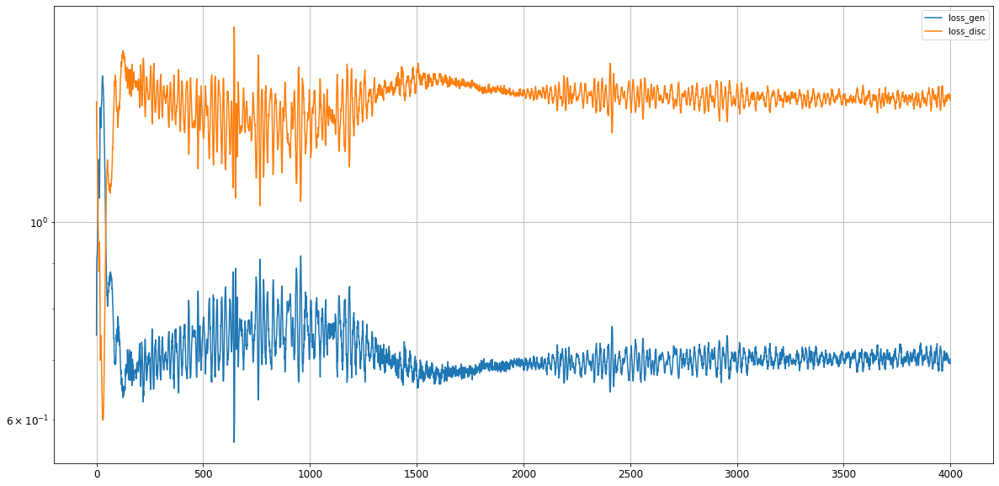

Epoch 4002/15000
0s
Epoch 4003/15000
0s
Epoch 4004/15000
0s
Epoch 4005/15000
0s
Epoch 4006/15000
0s
Epoch 4007/15000
0s
Epoch 4008/15000
0s
Epoch 4009/15000
0s
Epoch 4010/15000
0s
Epoch 4011/15000
0s
Epoch 4012/15000
0s
Epoch 4013/15000
0s
Epoch 4014/15000
0s
Epoch 4015/15000
0s
Epoch 4016/15000
0s
Epoch 4017/15000
0s
Epoch 4018/15000
0s
Epoch 4019/15000
0s
Epoch 4020/15000
0s
Epoch 4021/15000
0s
Epoch 4022/15000
0s
Epoch 4023/15000
0s
Epoch 4024/15000
0s
Epoch 4025/15000
0s
Epoch 4026/15000
0s
Epoch 4027/15000
0s
Epoch 4028/15000
0s
Epoch 4029/15000
0s
Epoch 4030/15000
0s
Epoch 4031/15000
0s
Epoch 4032/15000
0s
Epoch 4033/15000
0s
Epoch 4034/15000
0s
Epoch 4035/15000
0s
Epoch 4036/15000
0s
Epoch 4037/15000
0s
Epoch 4038/15000
0s
Epoch 4039/15000
0s
Epoch 4040/15000
0s
Epoch 4041/15000
0s
Epoch 4042/15000
0s
Epoch 4043/15000
0s
Epoch 4044/15000
0s
Epoch 4045/15000
0s
Epoch 4046/15000
0s
Epoch 4047/15000
0s
Epoch 4048/15000
0s
Epoch 4049/15000
0s
Epoch 4050/15000
0s
Epoch 4051/15000
0s


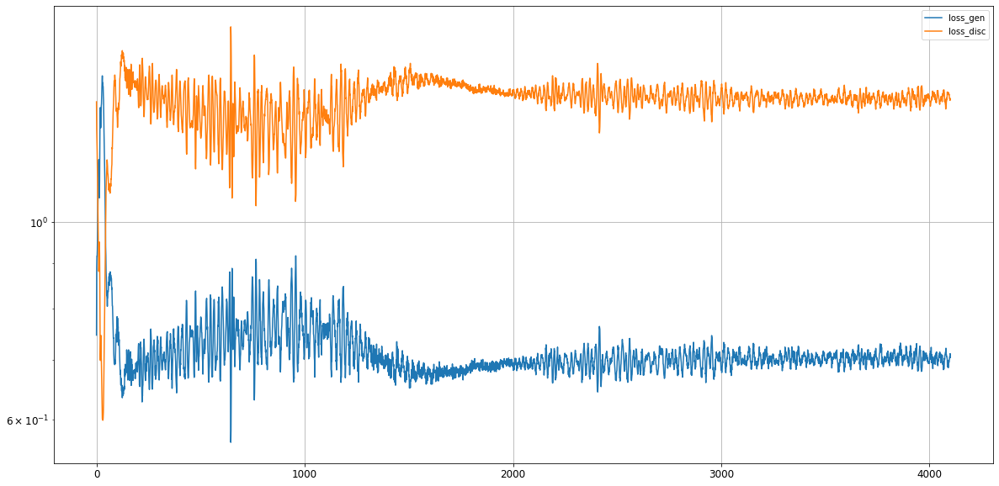

Epoch 4102/15000
0s
Epoch 4103/15000
0s
Epoch 4104/15000
0s
Epoch 4105/15000
0s
Epoch 4106/15000
0s
Epoch 4107/15000
0s
Epoch 4108/15000
0s
Epoch 4109/15000
0s
Epoch 4110/15000
0s
Epoch 4111/15000
0s
Epoch 4112/15000
0s
Epoch 4113/15000
0s
Epoch 4114/15000
0s
Epoch 4115/15000
0s
Epoch 4116/15000
0s
Epoch 4117/15000
0s
Epoch 4118/15000
0s
Epoch 4119/15000
0s
Epoch 4120/15000
0s
Epoch 4121/15000
0s
Epoch 4122/15000
0s
Epoch 4123/15000
0s
Epoch 4124/15000
0s
Epoch 4125/15000
0s
Epoch 4126/15000
0s
Epoch 4127/15000
0s
Epoch 4128/15000
0s
Epoch 4129/15000
0s
Epoch 4130/15000
0s
Epoch 4131/15000
0s
Epoch 4132/15000
0s
Epoch 4133/15000
0s
Epoch 4134/15000
0s
Epoch 4135/15000
0s
Epoch 4136/15000
0s
Epoch 4137/15000
0s
Epoch 4138/15000
0s
Epoch 4139/15000
0s
Epoch 4140/15000
0s
Epoch 4141/15000
0s
Epoch 4142/15000
0s
Epoch 4143/15000
0s
Epoch 4144/15000
0s
Epoch 4145/15000
0s
Epoch 4146/15000
0s
Epoch 4147/15000
0s
Epoch 4148/15000
0s
Epoch 4149/15000
0s
Epoch 4150/15000
0s
Epoch 4151/15000
0s


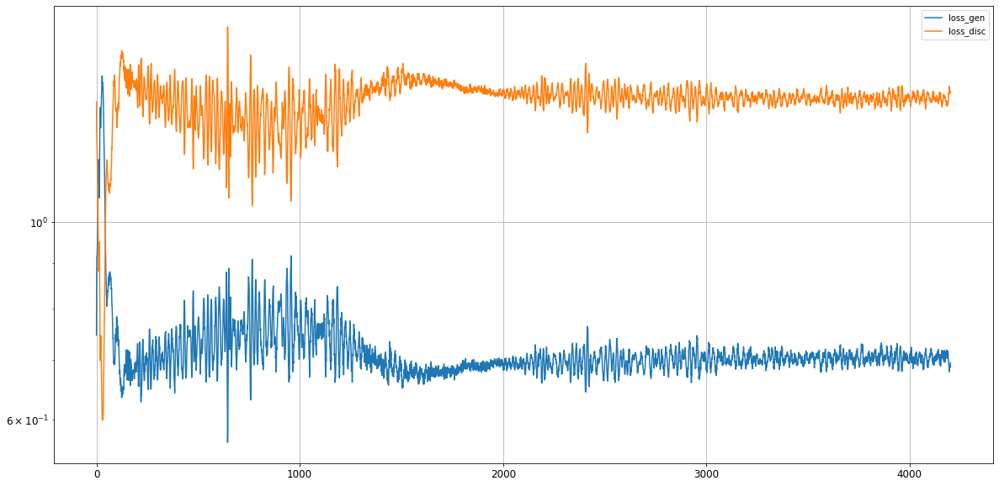

Epoch 4202/15000
0s
Epoch 4203/15000
0s
Epoch 4204/15000
0s
Epoch 4205/15000
0s
Epoch 4206/15000
0s
Epoch 4207/15000
0s
Epoch 4208/15000
0s
Epoch 4209/15000
0s
Epoch 4210/15000
0s
Epoch 4211/15000
0s
Epoch 4212/15000
0s
Epoch 4213/15000
0s
Epoch 4214/15000
0s
Epoch 4215/15000
0s
Epoch 4216/15000
0s
Epoch 4217/15000
0s
Epoch 4218/15000
0s
Epoch 4219/15000
0s
Epoch 4220/15000
0s
Epoch 4221/15000
0s
Epoch 4222/15000
0s
Epoch 4223/15000
0s
Epoch 4224/15000
0s
Epoch 4225/15000
0s
Epoch 4226/15000
0s
Epoch 4227/15000
0s
Epoch 4228/15000
0s
Epoch 4229/15000
0s
Epoch 4230/15000
0s
Epoch 4231/15000
0s
Epoch 4232/15000
0s
Epoch 4233/15000
0s
Epoch 4234/15000
0s
Epoch 4235/15000
0s
Epoch 4236/15000
0s
Epoch 4237/15000
0s
Epoch 4238/15000
0s
Epoch 4239/15000
0s
Epoch 4240/15000
0s
Epoch 4241/15000
0s
Epoch 4242/15000
0s
Epoch 4243/15000
0s
Epoch 4244/15000
0s
Epoch 4245/15000
0s
Epoch 4246/15000
0s
Epoch 4247/15000
0s
Epoch 4248/15000
0s
Epoch 4249/15000
0s
Epoch 4250/15000
0s
Epoch 4251/15000
0s


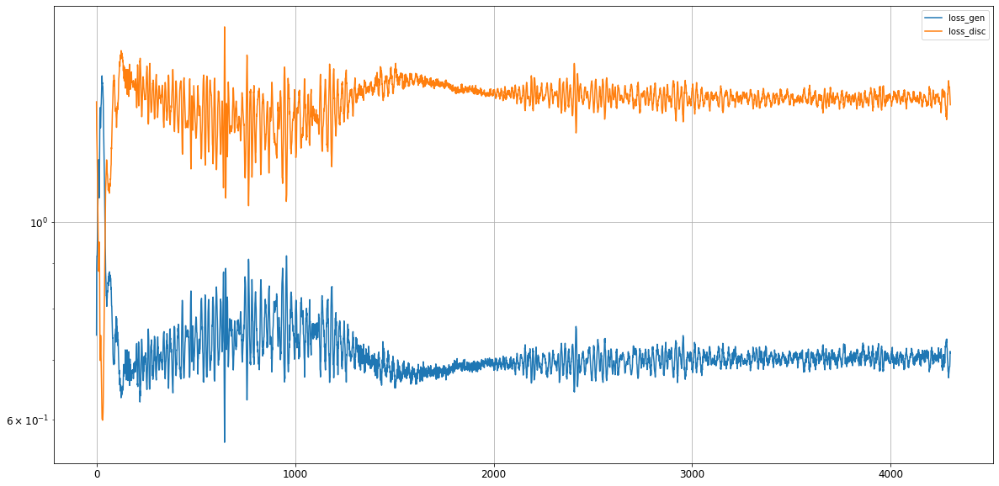

Epoch 4302/15000
0s
Epoch 4303/15000
0s
Epoch 4304/15000
0s
Epoch 4305/15000
0s
Epoch 4306/15000
0s
Epoch 4307/15000
0s
Epoch 4308/15000
0s
Epoch 4309/15000
0s
Epoch 4310/15000
0s
Epoch 4311/15000
0s
Epoch 4312/15000
0s
Epoch 4313/15000
0s
Epoch 4314/15000
0s
Epoch 4315/15000
0s
Epoch 4316/15000
0s
Epoch 4317/15000
0s
Epoch 4318/15000
0s
Epoch 4319/15000
0s
Epoch 4320/15000
0s
Epoch 4321/15000
0s
Epoch 4322/15000
0s
Epoch 4323/15000
0s
Epoch 4324/15000
0s
Epoch 4325/15000
0s
Epoch 4326/15000
0s
Epoch 4327/15000
0s
Epoch 4328/15000
0s
Epoch 4329/15000
0s
Epoch 4330/15000
0s
Epoch 4331/15000
0s
Epoch 4332/15000
0s
Epoch 4333/15000
0s
Epoch 4334/15000
0s
Epoch 4335/15000
0s
Epoch 4336/15000
0s
Epoch 4337/15000
0s
Epoch 4338/15000
0s
Epoch 4339/15000
0s
Epoch 4340/15000
0s
Epoch 4341/15000
0s
Epoch 4342/15000
0s
Epoch 4343/15000
0s
Epoch 4344/15000
0s
Epoch 4345/15000
0s
Epoch 4346/15000
0s
Epoch 4347/15000
0s
Epoch 4348/15000
0s
Epoch 4349/15000
0s
Epoch 4350/15000
0s
Epoch 4351/15000
0s


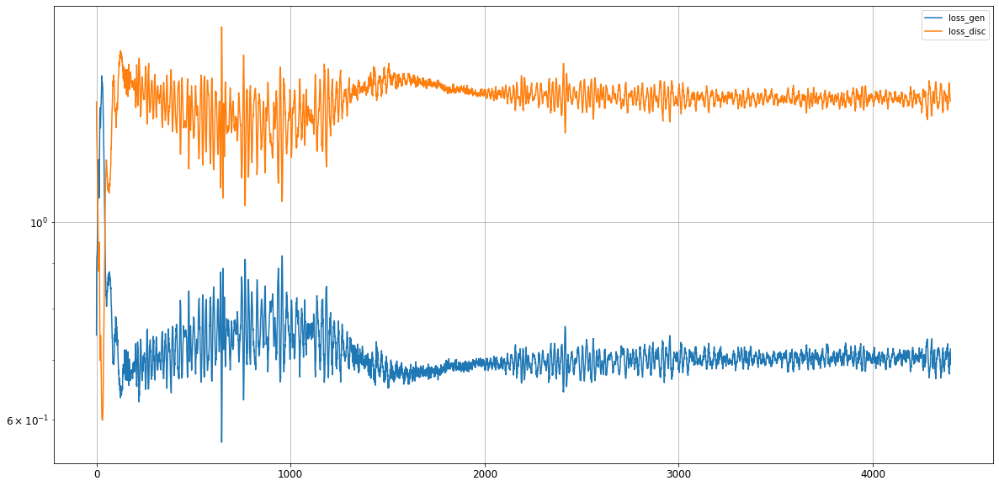

Epoch 4402/15000
0s
Epoch 4403/15000
0s
Epoch 4404/15000
0s
Epoch 4405/15000
0s
Epoch 4406/15000
0s
Epoch 4407/15000
0s
Epoch 4408/15000
0s
Epoch 4409/15000
0s
Epoch 4410/15000
0s
Epoch 4411/15000
0s
Epoch 4412/15000
0s
Epoch 4413/15000
0s
Epoch 4414/15000
0s
Epoch 4415/15000
0s
Epoch 4416/15000
0s
Epoch 4417/15000
0s
Epoch 4418/15000
0s
Epoch 4419/15000
0s
Epoch 4420/15000
0s
Epoch 4421/15000
0s
Epoch 4422/15000
0s
Epoch 4423/15000
0s
Epoch 4424/15000
0s
Epoch 4425/15000
0s
Epoch 4426/15000
0s
Epoch 4427/15000
0s
Epoch 4428/15000
0s
Epoch 4429/15000
0s
Epoch 4430/15000
0s
Epoch 4431/15000
0s
Epoch 4432/15000
0s
Epoch 4433/15000
0s
Epoch 4434/15000
0s
Epoch 4435/15000
0s
Epoch 4436/15000
0s
Epoch 4437/15000
0s
Epoch 4438/15000
0s
Epoch 4439/15000
0s
Epoch 4440/15000
0s
Epoch 4441/15000
0s
Epoch 4442/15000
0s
Epoch 4443/15000
0s
Epoch 4444/15000
0s
Epoch 4445/15000
0s
Epoch 4446/15000
0s
Epoch 4447/15000
0s
Epoch 4448/15000
0s
Epoch 4449/15000
0s
Epoch 4450/15000
0s
Epoch 4451/15000
0s


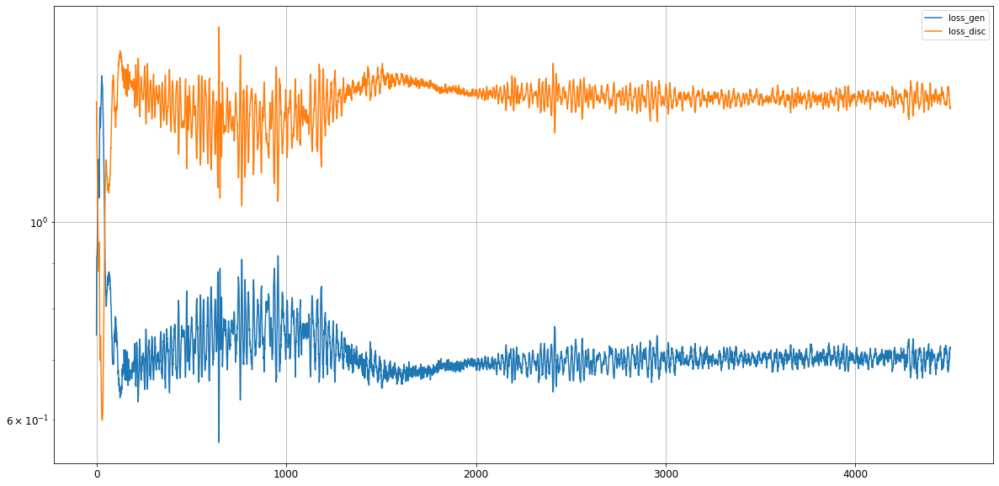

Epoch 4502/15000
0s
Epoch 4503/15000
0s
Epoch 4504/15000
0s
Epoch 4505/15000
0s
Epoch 4506/15000
0s
Epoch 4507/15000
0s
Epoch 4508/15000
0s
Epoch 4509/15000
0s
Epoch 4510/15000
0s
Epoch 4511/15000
0s
Epoch 4512/15000
0s
Epoch 4513/15000
0s
Epoch 4514/15000
0s
Epoch 4515/15000
0s
Epoch 4516/15000
0s
Epoch 4517/15000
0s
Epoch 4518/15000
0s
Epoch 4519/15000
0s
Epoch 4520/15000
0s
Epoch 4521/15000
0s
Epoch 4522/15000
0s
Epoch 4523/15000
0s
Epoch 4524/15000
0s
Epoch 4525/15000
0s
Epoch 4526/15000
0s
Epoch 4527/15000
0s
Epoch 4528/15000
0s
Epoch 4529/15000
0s
Epoch 4530/15000
0s
Epoch 4531/15000
0s
Epoch 4532/15000
0s
Epoch 4533/15000
0s
Epoch 4534/15000
0s
Epoch 4535/15000
0s
Epoch 4536/15000
0s
Epoch 4537/15000
0s
Epoch 4538/15000
0s
Epoch 4539/15000
0s
Epoch 4540/15000
0s
Epoch 4541/15000
0s
Epoch 4542/15000
0s
Epoch 4543/15000
0s
Epoch 4544/15000
0s
Epoch 4545/15000
0s
Epoch 4546/15000
0s
Epoch 4547/15000
0s
Epoch 4548/15000
0s
Epoch 4549/15000
0s
Epoch 4550/15000
0s
Epoch 4551/15000
0s


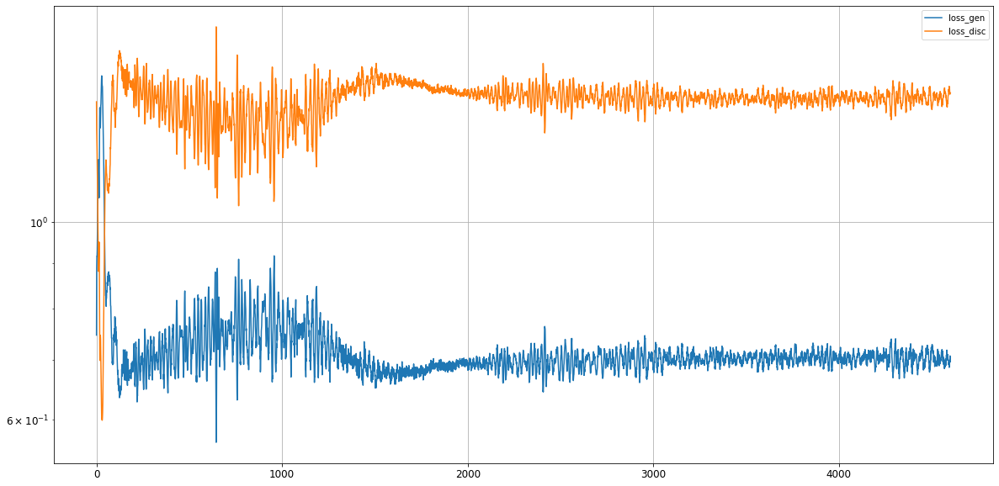

Epoch 4602/15000
0s
Epoch 4603/15000
0s
Epoch 4604/15000
0s
Epoch 4605/15000
0s
Epoch 4606/15000
0s
Epoch 4607/15000
0s
Epoch 4608/15000
0s
Epoch 4609/15000
0s
Epoch 4610/15000
0s
Epoch 4611/15000
0s
Epoch 4612/15000
0s
Epoch 4613/15000
0s
Epoch 4614/15000
0s
Epoch 4615/15000
0s
Epoch 4616/15000
0s
Epoch 4617/15000
0s
Epoch 4618/15000
0s
Epoch 4619/15000
0s
Epoch 4620/15000
0s
Epoch 4621/15000
0s
Epoch 4622/15000
0s
Epoch 4623/15000
0s
Epoch 4624/15000
0s
Epoch 4625/15000
0s
Epoch 4626/15000
0s
Epoch 4627/15000
0s
Epoch 4628/15000
0s
Epoch 4629/15000
0s
Epoch 4630/15000
0s
Epoch 4631/15000
0s
Epoch 4632/15000
0s
Epoch 4633/15000
0s
Epoch 4634/15000
0s
Epoch 4635/15000
0s
Epoch 4636/15000
0s
Epoch 4637/15000
0s
Epoch 4638/15000
0s
Epoch 4639/15000
0s
Epoch 4640/15000
0s
Epoch 4641/15000
0s
Epoch 4642/15000
0s
Epoch 4643/15000
0s
Epoch 4644/15000
0s
Epoch 4645/15000
0s
Epoch 4646/15000
0s
Epoch 4647/15000
0s
Epoch 4648/15000
0s
Epoch 4649/15000
0s
Epoch 4650/15000
0s
Epoch 4651/15000
0s


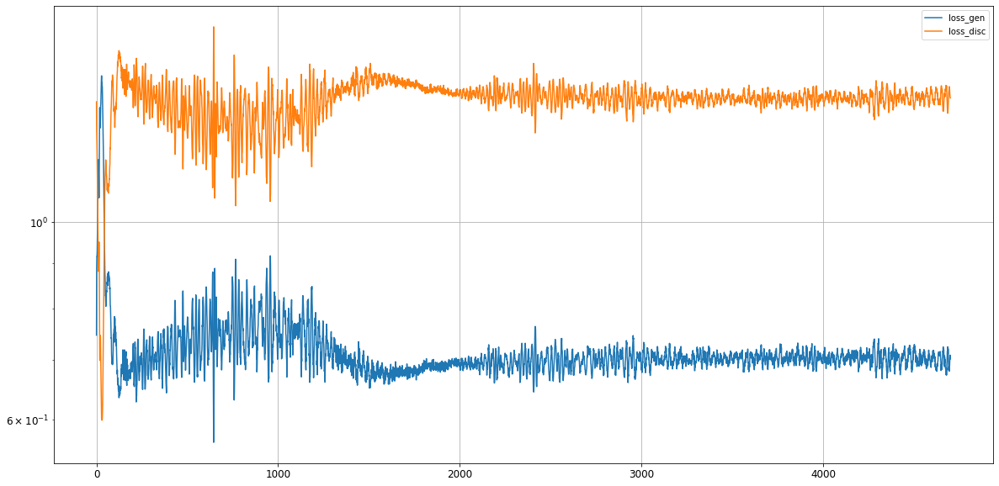

Epoch 4702/15000
0s
Epoch 4703/15000
0s
Epoch 4704/15000
0s
Epoch 4705/15000
0s
Epoch 4706/15000
0s
Epoch 4707/15000
0s
Epoch 4708/15000
0s
Epoch 4709/15000
0s
Epoch 4710/15000
0s
Epoch 4711/15000
0s
Epoch 4712/15000
0s
Epoch 4713/15000
0s
Epoch 4714/15000
0s
Epoch 4715/15000
0s
Epoch 4716/15000
0s
Epoch 4717/15000
0s
Epoch 4718/15000
0s
Epoch 4719/15000
0s
Epoch 4720/15000
0s
Epoch 4721/15000
0s
Epoch 4722/15000
0s
Epoch 4723/15000
0s
Epoch 4724/15000
0s
Epoch 4725/15000
0s
Epoch 4726/15000
0s
Epoch 4727/15000
0s
Epoch 4728/15000
0s
Epoch 4729/15000
0s
Epoch 4730/15000
0s
Epoch 4731/15000
0s
Epoch 4732/15000
0s
Epoch 4733/15000
0s
Epoch 4734/15000
0s
Epoch 4735/15000
0s
Epoch 4736/15000
0s
Epoch 4737/15000
0s
Epoch 4738/15000
0s
Epoch 4739/15000
0s
Epoch 4740/15000
0s
Epoch 4741/15000
0s
Epoch 4742/15000
0s
Epoch 4743/15000
0s
Epoch 4744/15000
0s
Epoch 4745/15000
0s
Epoch 4746/15000
0s
Epoch 4747/15000
0s
Epoch 4748/15000
0s
Epoch 4749/15000
0s
Epoch 4750/15000
0s
Epoch 4751/15000
0s


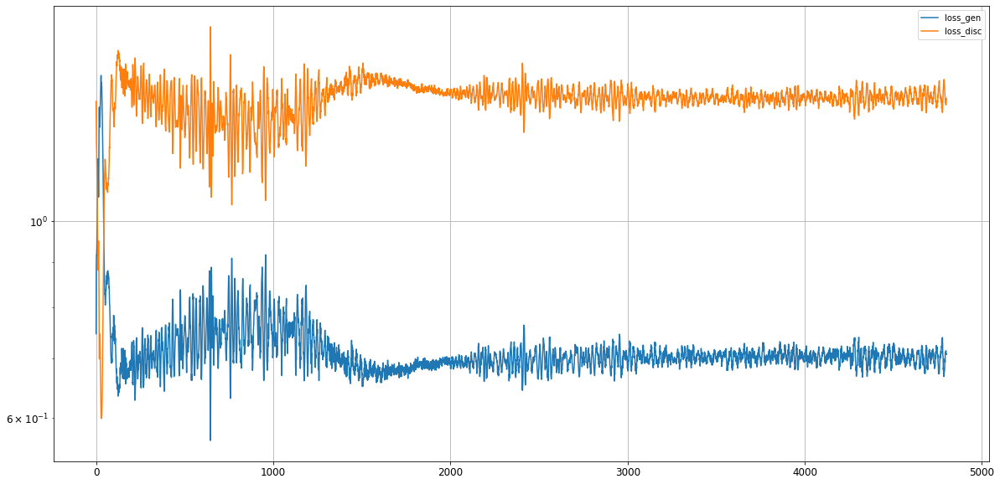

Epoch 4802/15000
0s
Epoch 4803/15000
0s
Epoch 4804/15000
0s
Epoch 4805/15000
0s
Epoch 4806/15000
0s
Epoch 4807/15000
0s
Epoch 4808/15000
0s
Epoch 4809/15000
0s
Epoch 4810/15000
0s
Epoch 4811/15000
0s
Epoch 4812/15000
0s
Epoch 4813/15000
0s
Epoch 4814/15000
0s
Epoch 4815/15000
0s
Epoch 4816/15000
0s
Epoch 4817/15000
0s
Epoch 4818/15000
0s
Epoch 4819/15000
0s
Epoch 4820/15000
0s
Epoch 4821/15000
0s
Epoch 4822/15000
0s
Epoch 4823/15000
0s
Epoch 4824/15000
0s
Epoch 4825/15000
0s
Epoch 4826/15000
0s
Epoch 4827/15000
0s
Epoch 4828/15000
0s
Epoch 4829/15000
0s
Epoch 4830/15000
0s
Epoch 4831/15000
0s
Epoch 4832/15000
0s
Epoch 4833/15000
0s
Epoch 4834/15000
0s
Epoch 4835/15000
0s
Epoch 4836/15000
0s
Epoch 4837/15000
0s
Epoch 4838/15000
0s
Epoch 4839/15000
0s
Epoch 4840/15000
0s
Epoch 4841/15000
0s
Epoch 4842/15000
0s
Epoch 4843/15000
0s
Epoch 4844/15000
0s
Epoch 4845/15000
0s
Epoch 4846/15000
0s
Epoch 4847/15000
0s
Epoch 4848/15000
0s
Epoch 4849/15000
0s
Epoch 4850/15000
0s
Epoch 4851/15000
0s


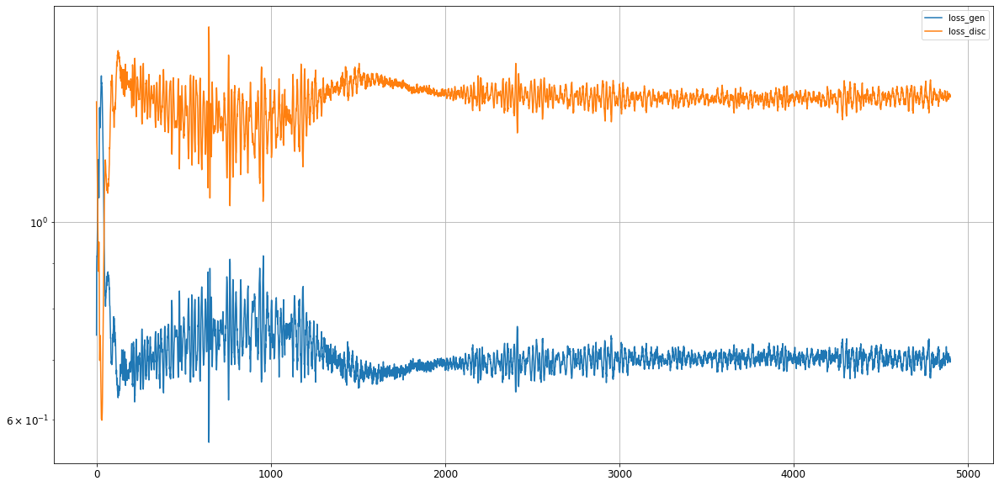

Epoch 4902/15000
0s
Epoch 4903/15000
0s
Epoch 4904/15000
0s
Epoch 4905/15000
0s
Epoch 4906/15000
0s
Epoch 4907/15000
0s
Epoch 4908/15000
0s
Epoch 4909/15000
0s
Epoch 4910/15000
0s
Epoch 4911/15000
0s
Epoch 4912/15000
0s
Epoch 4913/15000
0s
Epoch 4914/15000
0s
Epoch 4915/15000
0s
Epoch 4916/15000
0s
Epoch 4917/15000
0s
Epoch 4918/15000
0s
Epoch 4919/15000
0s
Epoch 4920/15000
0s
Epoch 4921/15000
0s
Epoch 4922/15000
0s
Epoch 4923/15000
0s
Epoch 4924/15000
0s
Epoch 4925/15000
0s
Epoch 4926/15000
0s
Epoch 4927/15000
0s
Epoch 4928/15000
0s
Epoch 4929/15000
0s
Epoch 4930/15000
0s
Epoch 4931/15000
0s
Epoch 4932/15000
0s
Epoch 4933/15000
0s
Epoch 4934/15000
0s
Epoch 4935/15000
0s
Epoch 4936/15000
0s
Epoch 4937/15000
0s
Epoch 4938/15000
0s
Epoch 4939/15000
0s
Epoch 4940/15000
0s
Epoch 4941/15000
0s
Epoch 4942/15000
0s
Epoch 4943/15000
0s
Epoch 4944/15000
0s
Epoch 4945/15000
0s
Epoch 4946/15000
0s
Epoch 4947/15000
0s
Epoch 4948/15000
0s
Epoch 4949/15000
0s
Epoch 4950/15000
0s
Epoch 4951/15000
0s


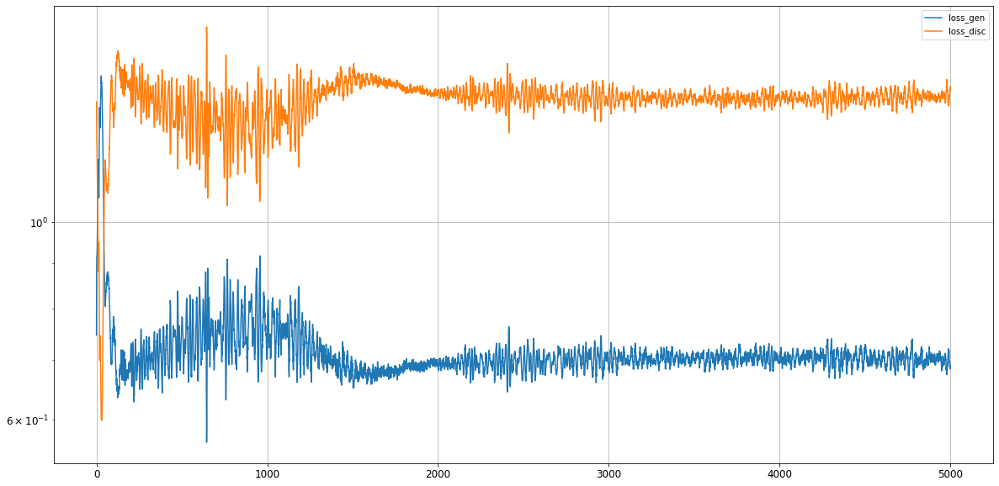

Epoch 5002/15000
0s
Epoch 5003/15000
0s
Epoch 5004/15000
0s
Epoch 5005/15000
0s
Epoch 5006/15000
0s
Epoch 5007/15000
0s
Epoch 5008/15000
0s
Epoch 5009/15000
0s
Epoch 5010/15000
0s
Epoch 5011/15000
0s
Epoch 5012/15000
0s
Epoch 5013/15000
0s
Epoch 5014/15000
0s
Epoch 5015/15000
0s
Epoch 5016/15000
0s
Epoch 5017/15000
0s
Epoch 5018/15000
0s
Epoch 5019/15000
0s
Epoch 5020/15000
0s
Epoch 5021/15000
0s
Epoch 5022/15000
0s
Epoch 5023/15000
0s
Epoch 5024/15000
0s
Epoch 5025/15000
0s
Epoch 5026/15000
0s
Epoch 5027/15000
0s
Epoch 5028/15000
0s
Epoch 5029/15000
0s
Epoch 5030/15000
0s
Epoch 5031/15000
0s
Epoch 5032/15000
0s
Epoch 5033/15000
0s
Epoch 5034/15000
0s
Epoch 5035/15000
0s
Epoch 5036/15000
0s
Epoch 5037/15000
0s
Epoch 5038/15000
0s
Epoch 5039/15000
0s
Epoch 5040/15000
0s
Epoch 5041/15000
0s
Epoch 5042/15000
0s
Epoch 5043/15000
0s
Epoch 5044/15000
0s
Epoch 5045/15000
0s
Epoch 5046/15000
0s
Epoch 5047/15000
0s
Epoch 5048/15000
0s
Epoch 5049/15000
0s
Epoch 5050/15000
0s
Epoch 5051/15000
0s


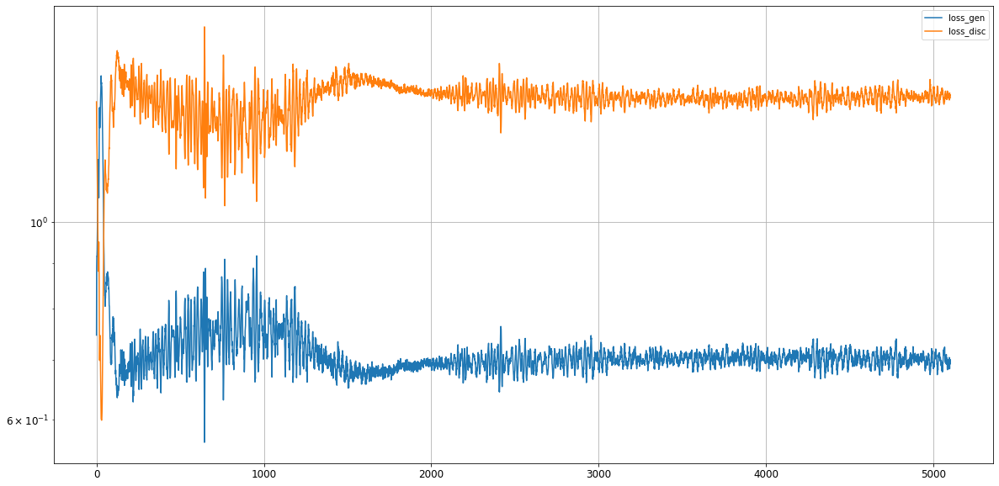

Epoch 5102/15000
0s
Epoch 5103/15000
0s
Epoch 5104/15000
0s
Epoch 5105/15000
0s
Epoch 5106/15000
0s
Epoch 5107/15000
0s
Epoch 5108/15000
0s
Epoch 5109/15000
0s
Epoch 5110/15000
0s
Epoch 5111/15000
0s
Epoch 5112/15000
0s
Epoch 5113/15000
0s
Epoch 5114/15000
0s
Epoch 5115/15000
0s
Epoch 5116/15000
0s
Epoch 5117/15000
0s
Epoch 5118/15000
0s
Epoch 5119/15000
0s
Epoch 5120/15000
0s
Epoch 5121/15000
0s
Epoch 5122/15000
0s
Epoch 5123/15000
0s
Epoch 5124/15000
0s
Epoch 5125/15000
0s
Epoch 5126/15000
0s
Epoch 5127/15000
0s
Epoch 5128/15000
0s
Epoch 5129/15000
0s
Epoch 5130/15000
0s
Epoch 5131/15000
0s
Epoch 5132/15000
0s
Epoch 5133/15000
0s
Epoch 5134/15000
0s
Epoch 5135/15000
0s
Epoch 5136/15000
0s
Epoch 5137/15000
0s
Epoch 5138/15000
0s
Epoch 5139/15000
0s
Epoch 5140/15000
0s
Epoch 5141/15000
0s
Epoch 5142/15000
0s
Epoch 5143/15000
0s
Epoch 5144/15000
0s
Epoch 5145/15000
0s
Epoch 5146/15000
0s
Epoch 5147/15000
0s
Epoch 5148/15000
0s
Epoch 5149/15000
0s
Epoch 5150/15000
0s
Epoch 5151/15000
0s


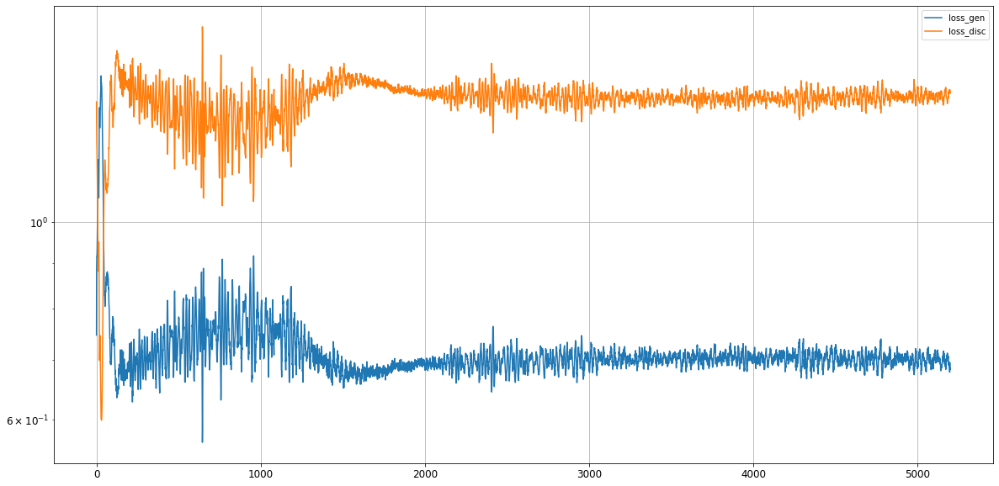

Epoch 5202/15000
0s
Epoch 5203/15000
0s
Epoch 5204/15000
0s
Epoch 5205/15000
0s
Epoch 5206/15000
0s
Epoch 5207/15000
0s
Epoch 5208/15000
0s
Epoch 5209/15000
0s
Epoch 5210/15000
0s
Epoch 5211/15000
0s
Epoch 5212/15000
0s
Epoch 5213/15000
0s
Epoch 5214/15000
0s
Epoch 5215/15000
0s
Epoch 5216/15000
0s
Epoch 5217/15000
0s
Epoch 5218/15000
0s
Epoch 5219/15000
0s
Epoch 5220/15000
0s
Epoch 5221/15000
0s
Epoch 5222/15000
0s
Epoch 5223/15000
0s
Epoch 5224/15000
0s
Epoch 5225/15000
0s
Epoch 5226/15000
0s
Epoch 5227/15000
0s
Epoch 5228/15000
0s
Epoch 5229/15000
0s
Epoch 5230/15000
0s
Epoch 5231/15000
0s
Epoch 5232/15000
0s
Epoch 5233/15000
0s
Epoch 5234/15000
0s
Epoch 5235/15000
0s
Epoch 5236/15000
0s
Epoch 5237/15000
0s
Epoch 5238/15000
0s
Epoch 5239/15000
0s
Epoch 5240/15000
0s
Epoch 5241/15000
0s
Epoch 5242/15000
0s
Epoch 5243/15000
0s
Epoch 5244/15000
0s
Epoch 5245/15000
0s
Epoch 5246/15000
0s
Epoch 5247/15000
0s
Epoch 5248/15000
0s
Epoch 5249/15000
0s
Epoch 5250/15000
0s
Epoch 5251/15000
0s


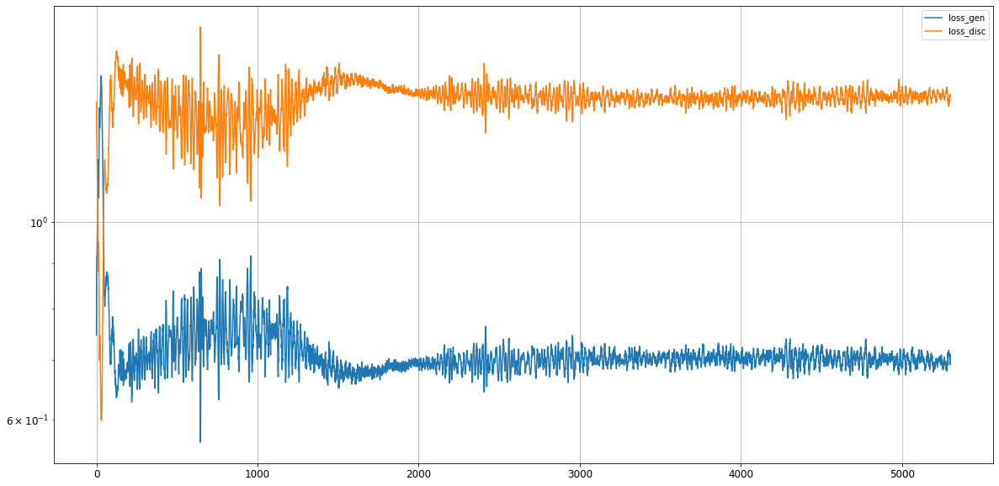

Epoch 5302/15000
0s
Epoch 5303/15000
0s
Epoch 5304/15000
0s
Epoch 5305/15000
0s
Epoch 5306/15000
0s
Epoch 5307/15000
0s
Epoch 5308/15000
0s
Epoch 5309/15000
0s
Epoch 5310/15000
0s
Epoch 5311/15000
0s
Epoch 5312/15000
0s
Epoch 5313/15000
0s
Epoch 5314/15000
0s
Epoch 5315/15000
0s
Epoch 5316/15000
0s
Epoch 5317/15000
0s
Epoch 5318/15000
0s
Epoch 5319/15000
0s
Epoch 5320/15000
0s
Epoch 5321/15000
0s
Epoch 5322/15000
0s
Epoch 5323/15000
0s
Epoch 5324/15000
0s
Epoch 5325/15000
0s
Epoch 5326/15000
0s
Epoch 5327/15000
0s
Epoch 5328/15000
0s
Epoch 5329/15000
0s
Epoch 5330/15000
0s
Epoch 5331/15000
0s
Epoch 5332/15000
0s
Epoch 5333/15000
0s
Epoch 5334/15000
0s
Epoch 5335/15000
0s
Epoch 5336/15000
0s
Epoch 5337/15000
0s
Epoch 5338/15000
0s
Epoch 5339/15000
0s
Epoch 5340/15000
0s
Epoch 5341/15000
0s
Epoch 5342/15000
0s
Epoch 5343/15000
0s
Epoch 5344/15000
0s
Epoch 5345/15000
0s
Epoch 5346/15000
0s
Epoch 5347/15000
0s
Epoch 5348/15000
0s
Epoch 5349/15000
0s
Epoch 5350/15000
0s
Epoch 5351/15000
0s


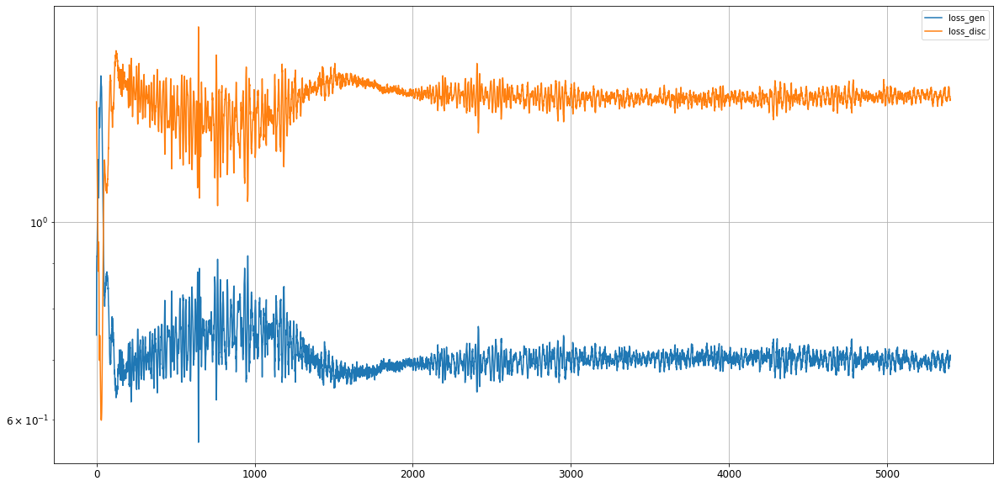

Epoch 5402/15000
0s
Epoch 5403/15000
0s
Epoch 5404/15000
0s
Epoch 5405/15000
0s
Epoch 5406/15000
0s
Epoch 5407/15000
0s
Epoch 5408/15000
0s
Epoch 5409/15000
0s
Epoch 5410/15000
0s
Epoch 5411/15000
0s
Epoch 5412/15000
0s
Epoch 5413/15000
0s
Epoch 5414/15000
0s
Epoch 5415/15000
0s
Epoch 5416/15000
0s
Epoch 5417/15000
0s
Epoch 5418/15000
0s
Epoch 5419/15000
0s
Epoch 5420/15000
0s
Epoch 5421/15000
0s
Epoch 5422/15000
0s
Epoch 5423/15000
0s
Epoch 5424/15000
0s
Epoch 5425/15000
0s
Epoch 5426/15000
0s
Epoch 5427/15000
0s
Epoch 5428/15000
0s
Epoch 5429/15000
0s
Epoch 5430/15000
0s
Epoch 5431/15000
0s
Epoch 5432/15000
0s
Epoch 5433/15000
0s
Epoch 5434/15000
0s
Epoch 5435/15000
0s
Epoch 5436/15000
0s
Epoch 5437/15000
0s
Epoch 5438/15000
0s
Epoch 5439/15000
0s
Epoch 5440/15000
0s
Epoch 5441/15000
0s
Epoch 5442/15000
0s
Epoch 5443/15000
0s
Epoch 5444/15000
0s
Epoch 5445/15000
0s
Epoch 5446/15000
0s
Epoch 5447/15000
0s
Epoch 5448/15000
0s
Epoch 5449/15000
0s
Epoch 5450/15000
0s
Epoch 5451/15000
0s


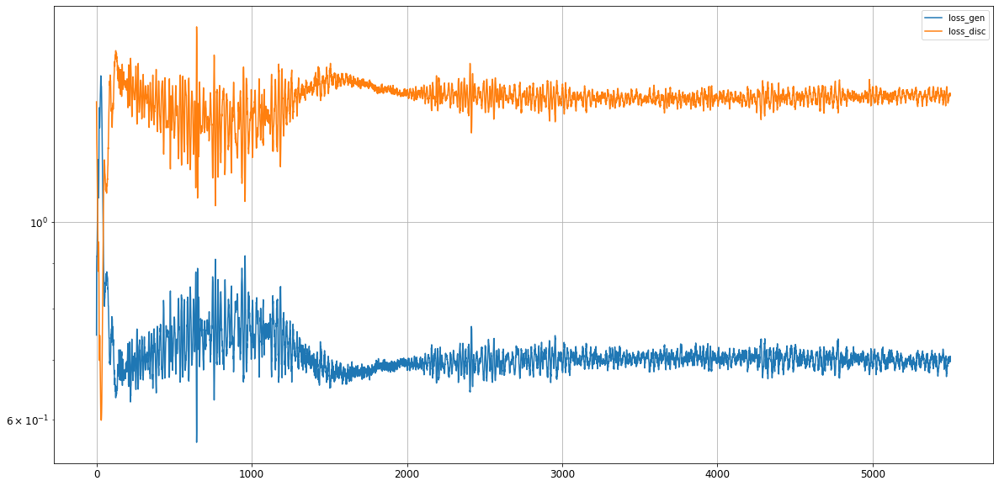

Epoch 5502/15000
0s
Epoch 5503/15000
0s
Epoch 5504/15000
0s
Epoch 5505/15000
0s
Epoch 5506/15000
0s
Epoch 5507/15000
0s
Epoch 5508/15000
0s
Epoch 5509/15000
0s
Epoch 5510/15000
0s
Epoch 5511/15000
0s
Epoch 5512/15000
0s
Epoch 5513/15000
0s
Epoch 5514/15000
0s
Epoch 5515/15000
0s
Epoch 5516/15000
0s
Epoch 5517/15000
0s
Epoch 5518/15000
0s
Epoch 5519/15000
0s
Epoch 5520/15000
0s
Epoch 5521/15000
0s
Epoch 5522/15000
0s
Epoch 5523/15000
0s
Epoch 5524/15000
0s
Epoch 5525/15000
0s
Epoch 5526/15000
0s
Epoch 5527/15000
0s
Epoch 5528/15000
0s
Epoch 5529/15000
0s
Epoch 5530/15000
0s
Epoch 5531/15000
0s
Epoch 5532/15000
0s
Epoch 5533/15000
0s
Epoch 5534/15000
0s
Epoch 5535/15000
0s
Epoch 5536/15000
0s
Epoch 5537/15000
0s
Epoch 5538/15000
0s
Epoch 5539/15000
0s
Epoch 5540/15000
0s
Epoch 5541/15000
0s
Epoch 5542/15000
0s
Epoch 5543/15000
0s
Epoch 5544/15000
0s
Epoch 5545/15000
0s
Epoch 5546/15000
0s
Epoch 5547/15000
0s
Epoch 5548/15000
0s
Epoch 5549/15000
0s
Epoch 5550/15000
0s
Epoch 5551/15000
0s


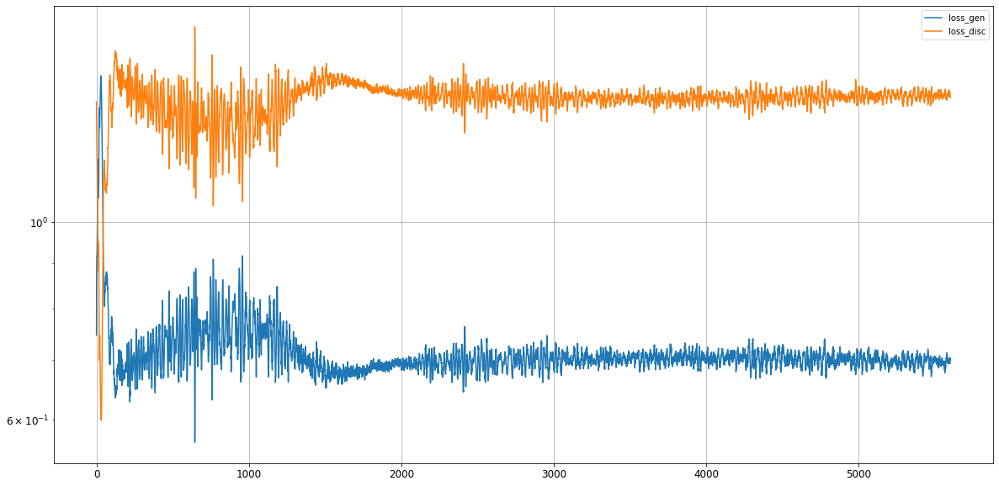

Epoch 5602/15000
0s
Epoch 5603/15000
0s
Epoch 5604/15000
0s
Epoch 5605/15000
0s
Epoch 5606/15000
0s
Epoch 5607/15000
0s
Epoch 5608/15000
0s
Epoch 5609/15000
0s
Epoch 5610/15000
0s
Epoch 5611/15000
0s
Epoch 5612/15000
0s
Epoch 5613/15000
0s
Epoch 5614/15000
0s
Epoch 5615/15000
0s
Epoch 5616/15000
0s
Epoch 5617/15000
0s
Epoch 5618/15000
0s
Epoch 5619/15000
0s
Epoch 5620/15000
0s
Epoch 5621/15000
0s
Epoch 5622/15000
0s
Epoch 5623/15000
0s
Epoch 5624/15000
0s
Epoch 5625/15000
0s
Epoch 5626/15000
0s
Epoch 5627/15000
0s
Epoch 5628/15000
0s
Epoch 5629/15000
0s
Epoch 5630/15000
0s
Epoch 5631/15000
0s
Epoch 5632/15000
0s
Epoch 5633/15000
0s
Epoch 5634/15000
0s
Epoch 5635/15000
0s
Epoch 5636/15000
0s
Epoch 5637/15000
0s
Epoch 5638/15000
0s
Epoch 5639/15000
0s
Epoch 5640/15000
0s
Epoch 5641/15000
0s
Epoch 5642/15000
0s
Epoch 5643/15000
0s
Epoch 5644/15000
0s
Epoch 5645/15000
0s
Epoch 5646/15000
0s
Epoch 5647/15000
0s
Epoch 5648/15000
0s
Epoch 5649/15000
0s
Epoch 5650/15000
0s
Epoch 5651/15000
0s


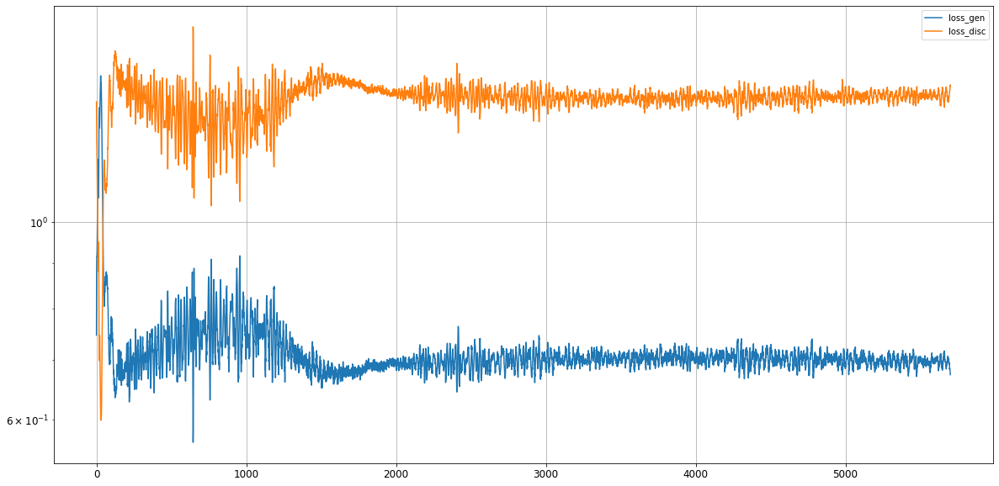

Epoch 5702/15000
0s
Epoch 5703/15000
0s
Epoch 5704/15000
0s
Epoch 5705/15000
0s
Epoch 5706/15000
0s
Epoch 5707/15000
0s
Epoch 5708/15000
0s
Epoch 5709/15000
0s
Epoch 5710/15000
0s
Epoch 5711/15000
0s
Epoch 5712/15000
0s
Epoch 5713/15000
0s
Epoch 5714/15000
0s
Epoch 5715/15000
0s
Epoch 5716/15000
0s
Epoch 5717/15000
0s
Epoch 5718/15000
0s
Epoch 5719/15000
0s
Epoch 5720/15000
0s
Epoch 5721/15000
0s
Epoch 5722/15000
0s
Epoch 5723/15000
0s
Epoch 5724/15000
0s
Epoch 5725/15000
0s
Epoch 5726/15000
0s
Epoch 5727/15000
0s
Epoch 5728/15000
0s
Epoch 5729/15000
0s
Epoch 5730/15000
0s
Epoch 5731/15000
0s
Epoch 5732/15000
0s
Epoch 5733/15000
0s
Epoch 5734/15000
0s
Epoch 5735/15000
0s
Epoch 5736/15000
0s
Epoch 5737/15000
0s
Epoch 5738/15000
0s
Epoch 5739/15000
0s
Epoch 5740/15000
0s
Epoch 5741/15000
0s
Epoch 5742/15000
0s
Epoch 5743/15000
0s
Epoch 5744/15000
0s
Epoch 5745/15000
0s
Epoch 5746/15000
0s
Epoch 5747/15000
0s
Epoch 5748/15000
0s
Epoch 5749/15000
0s
Epoch 5750/15000
0s
Epoch 5751/15000
0s


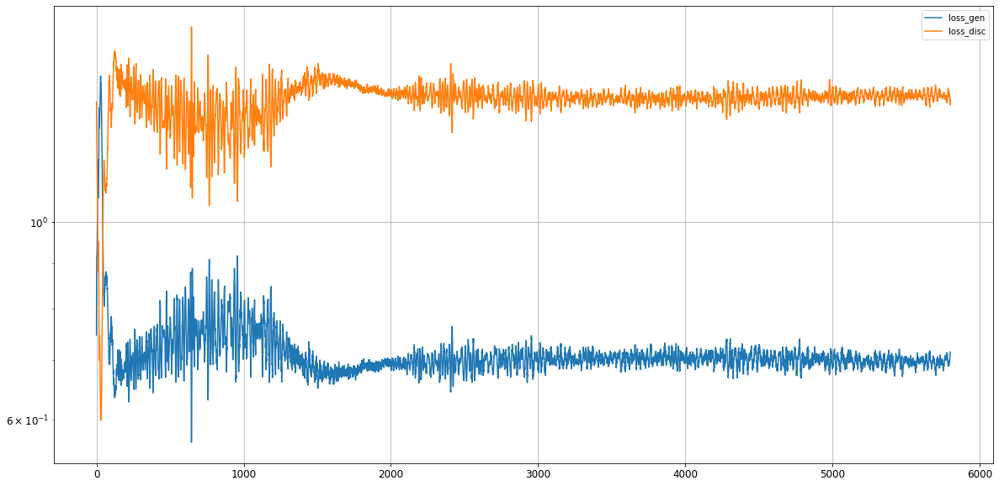

Epoch 5802/15000
0s
Epoch 5803/15000
0s
Epoch 5804/15000
0s
Epoch 5805/15000
0s
Epoch 5806/15000
0s
Epoch 5807/15000
0s
Epoch 5808/15000
0s
Epoch 5809/15000
0s
Epoch 5810/15000
0s
Epoch 5811/15000
0s
Epoch 5812/15000
0s
Epoch 5813/15000
0s
Epoch 5814/15000
0s
Epoch 5815/15000
0s
Epoch 5816/15000
0s
Epoch 5817/15000
0s
Epoch 5818/15000
0s
Epoch 5819/15000
0s
Epoch 5820/15000
0s
Epoch 5821/15000
0s
Epoch 5822/15000
0s
Epoch 5823/15000
0s
Epoch 5824/15000
0s
Epoch 5825/15000
0s
Epoch 5826/15000
0s
Epoch 5827/15000
0s
Epoch 5828/15000
0s
Epoch 5829/15000
0s
Epoch 5830/15000
0s
Epoch 5831/15000
0s
Epoch 5832/15000
0s
Epoch 5833/15000
0s
Epoch 5834/15000
0s
Epoch 5835/15000
0s
Epoch 5836/15000
0s
Epoch 5837/15000
0s
Epoch 5838/15000
0s
Epoch 5839/15000
0s
Epoch 5840/15000
0s
Epoch 5841/15000
0s
Epoch 5842/15000
0s
Epoch 5843/15000
0s
Epoch 5844/15000
0s
Epoch 5845/15000
0s
Epoch 5846/15000
0s
Epoch 5847/15000
0s
Epoch 5848/15000
0s
Epoch 5849/15000
0s
Epoch 5850/15000
0s
Epoch 5851/15000
0s


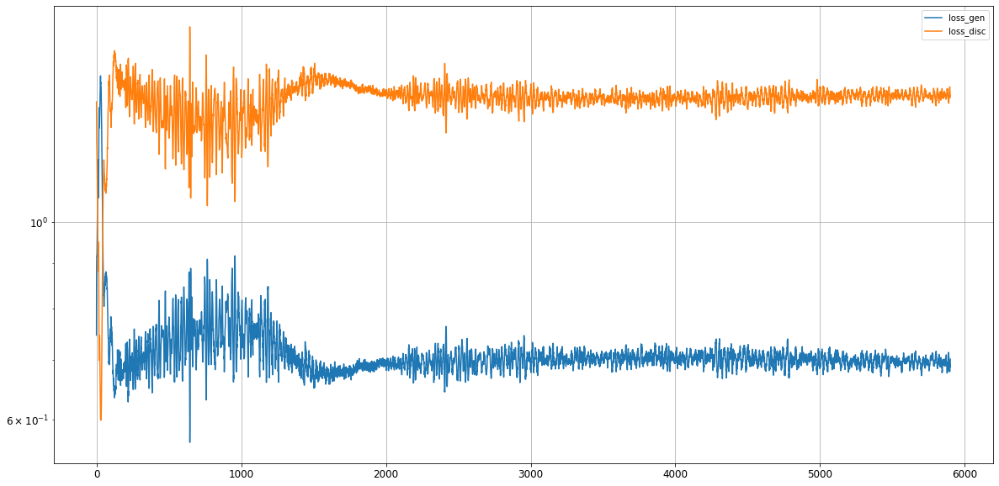

Epoch 5902/15000
0s
Epoch 5903/15000
0s
Epoch 5904/15000
0s
Epoch 5905/15000
0s
Epoch 5906/15000
0s
Epoch 5907/15000
0s
Epoch 5908/15000
0s
Epoch 5909/15000
0s
Epoch 5910/15000
0s
Epoch 5911/15000
0s
Epoch 5912/15000
0s
Epoch 5913/15000
0s
Epoch 5914/15000
0s
Epoch 5915/15000
0s
Epoch 5916/15000
0s
Epoch 5917/15000
0s
Epoch 5918/15000
0s
Epoch 5919/15000
0s
Epoch 5920/15000
0s
Epoch 5921/15000
0s
Epoch 5922/15000
0s
Epoch 5923/15000
0s
Epoch 5924/15000
0s
Epoch 5925/15000
0s
Epoch 5926/15000
0s
Epoch 5927/15000
0s
Epoch 5928/15000
0s
Epoch 5929/15000
0s
Epoch 5930/15000
0s
Epoch 5931/15000
0s
Epoch 5932/15000
0s
Epoch 5933/15000
0s
Epoch 5934/15000
0s
Epoch 5935/15000
0s
Epoch 5936/15000
0s
Epoch 5937/15000
0s
Epoch 5938/15000
0s
Epoch 5939/15000
0s
Epoch 5940/15000
0s
Epoch 5941/15000
0s
Epoch 5942/15000
0s
Epoch 5943/15000
0s
Epoch 5944/15000
0s
Epoch 5945/15000
0s
Epoch 5946/15000
0s
Epoch 5947/15000
0s
Epoch 5948/15000
0s
Epoch 5949/15000
0s
Epoch 5950/15000
0s
Epoch 5951/15000
0s


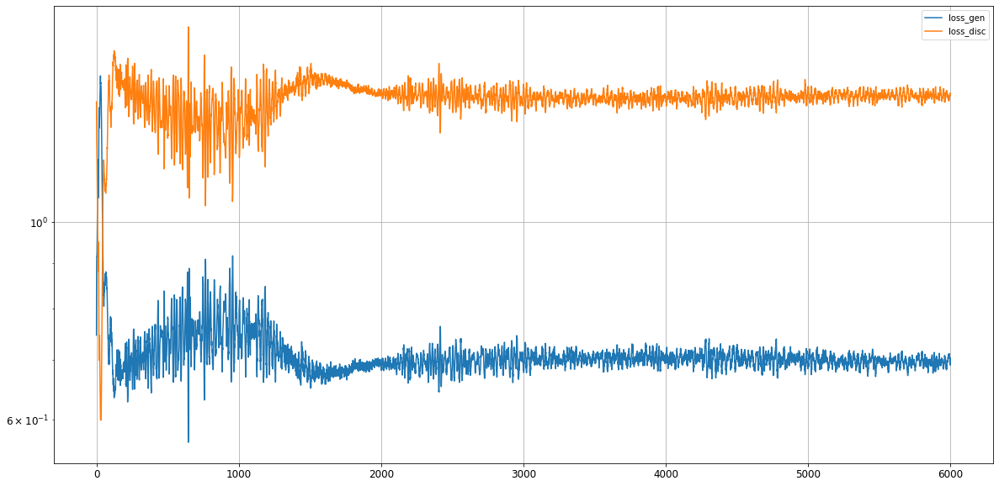

Epoch 6002/15000
0s
Epoch 6003/15000
0s
Epoch 6004/15000
0s
Epoch 6005/15000
0s
Epoch 6006/15000
0s
Epoch 6007/15000
0s
Epoch 6008/15000
0s
Epoch 6009/15000
0s
Epoch 6010/15000
0s
Epoch 6011/15000
0s
Epoch 6012/15000
0s
Epoch 6013/15000
0s
Epoch 6014/15000
0s
Epoch 6015/15000
0s
Epoch 6016/15000
0s
Epoch 6017/15000
0s
Epoch 6018/15000
0s
Epoch 6019/15000
0s
Epoch 6020/15000
0s
Epoch 6021/15000
0s
Epoch 6022/15000
0s
Epoch 6023/15000
0s
Epoch 6024/15000
0s
Epoch 6025/15000
0s
Epoch 6026/15000
0s
Epoch 6027/15000
0s
Epoch 6028/15000
0s
Epoch 6029/15000
0s
Epoch 6030/15000
0s
Epoch 6031/15000
0s
Epoch 6032/15000
0s
Epoch 6033/15000
0s
Epoch 6034/15000
0s
Epoch 6035/15000
0s
Epoch 6036/15000
0s
Epoch 6037/15000
0s
Epoch 6038/15000
0s
Epoch 6039/15000
0s
Epoch 6040/15000
0s
Epoch 6041/15000
0s
Epoch 6042/15000
0s
Epoch 6043/15000
0s
Epoch 6044/15000
0s
Epoch 6045/15000
0s
Epoch 6046/15000
0s
Epoch 6047/15000
0s
Epoch 6048/15000
0s
Epoch 6049/15000
0s
Epoch 6050/15000
0s
Epoch 6051/15000
0s


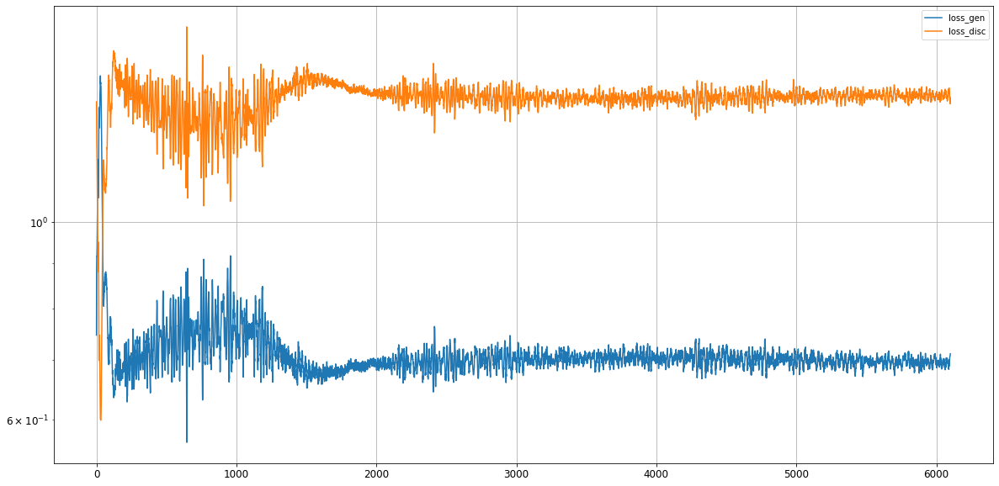

Epoch 6102/15000
0s
Epoch 6103/15000
0s
Epoch 6104/15000
0s
Epoch 6105/15000
0s
Epoch 6106/15000
0s
Epoch 6107/15000
0s
Epoch 6108/15000
0s
Epoch 6109/15000
0s
Epoch 6110/15000
0s
Epoch 6111/15000
0s
Epoch 6112/15000
0s
Epoch 6113/15000
0s
Epoch 6114/15000
0s
Epoch 6115/15000
0s
Epoch 6116/15000
0s
Epoch 6117/15000
0s
Epoch 6118/15000
0s
Epoch 6119/15000
0s
Epoch 6120/15000
0s
Epoch 6121/15000
0s
Epoch 6122/15000
0s
Epoch 6123/15000
0s
Epoch 6124/15000
0s
Epoch 6125/15000
0s
Epoch 6126/15000
0s
Epoch 6127/15000
0s
Epoch 6128/15000
0s
Epoch 6129/15000
0s
Epoch 6130/15000
0s
Epoch 6131/15000
0s
Epoch 6132/15000
0s
Epoch 6133/15000
0s
Epoch 6134/15000
0s
Epoch 6135/15000
0s
Epoch 6136/15000
0s
Epoch 6137/15000
0s
Epoch 6138/15000
0s
Epoch 6139/15000
0s
Epoch 6140/15000
0s
Epoch 6141/15000
0s
Epoch 6142/15000
0s
Epoch 6143/15000
0s
Epoch 6144/15000
0s
Epoch 6145/15000
0s
Epoch 6146/15000
0s
Epoch 6147/15000
0s
Epoch 6148/15000
0s
Epoch 6149/15000
0s
Epoch 6150/15000
0s
Epoch 6151/15000
0s


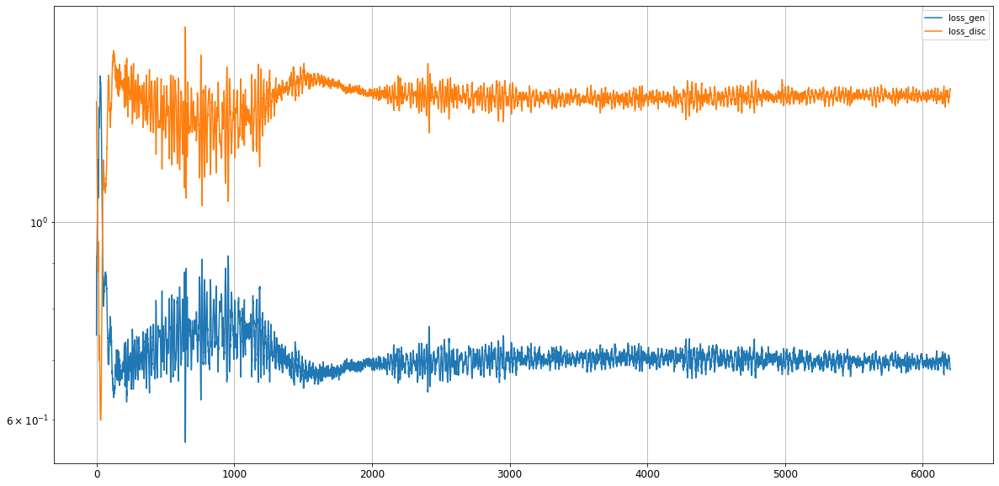

Epoch 6202/15000
0s
Epoch 6203/15000
0s
Epoch 6204/15000
0s
Epoch 6205/15000
0s
Epoch 6206/15000
0s
Epoch 6207/15000
0s
Epoch 6208/15000
0s
Epoch 6209/15000
0s
Epoch 6210/15000
0s
Epoch 6211/15000
0s
Epoch 6212/15000
0s
Epoch 6213/15000
0s
Epoch 6214/15000
0s
Epoch 6215/15000
0s
Epoch 6216/15000
0s
Epoch 6217/15000
0s
Epoch 6218/15000
0s
Epoch 6219/15000
0s
Epoch 6220/15000
0s
Epoch 6221/15000
0s
Epoch 6222/15000
0s
Epoch 6223/15000
0s
Epoch 6224/15000
0s
Epoch 6225/15000
0s
Epoch 6226/15000
0s
Epoch 6227/15000
0s
Epoch 6228/15000
0s
Epoch 6229/15000
0s
Epoch 6230/15000
0s
Epoch 6231/15000
0s
Epoch 6232/15000
0s
Epoch 6233/15000
0s
Epoch 6234/15000
0s
Epoch 6235/15000
0s
Epoch 6236/15000
0s
Epoch 6237/15000
0s
Epoch 6238/15000
0s
Epoch 6239/15000
0s
Epoch 6240/15000
0s
Epoch 6241/15000
0s
Epoch 6242/15000
0s
Epoch 6243/15000
0s
Epoch 6244/15000
0s
Epoch 6245/15000
0s
Epoch 6246/15000
0s
Epoch 6247/15000
0s
Epoch 6248/15000
0s
Epoch 6249/15000
0s
Epoch 6250/15000
0s
Epoch 6251/15000
0s


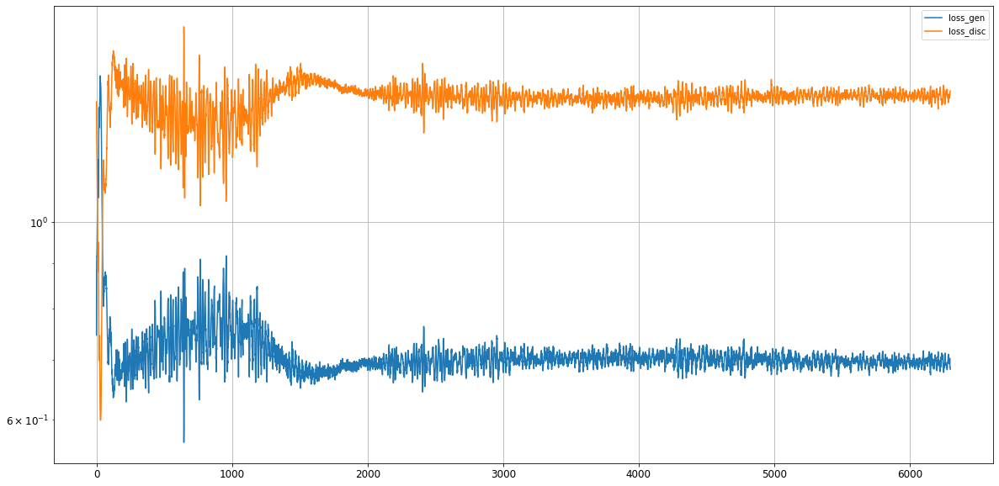

Epoch 6302/15000
0s
Epoch 6303/15000
0s
Epoch 6304/15000
0s
Epoch 6305/15000
0s
Epoch 6306/15000
0s
Epoch 6307/15000
0s
Epoch 6308/15000
0s
Epoch 6309/15000
0s
Epoch 6310/15000
0s
Epoch 6311/15000
0s
Epoch 6312/15000
0s
Epoch 6313/15000
0s
Epoch 6314/15000
0s
Epoch 6315/15000
0s
Epoch 6316/15000
0s
Epoch 6317/15000
0s
Epoch 6318/15000
0s
Epoch 6319/15000
0s
Epoch 6320/15000
0s
Epoch 6321/15000
0s
Epoch 6322/15000
0s
Epoch 6323/15000
0s
Epoch 6324/15000
0s
Epoch 6325/15000
0s
Epoch 6326/15000
0s
Epoch 6327/15000
0s
Epoch 6328/15000
0s
Epoch 6329/15000
0s
Epoch 6330/15000
0s
Epoch 6331/15000
0s
Epoch 6332/15000
0s
Epoch 6333/15000
0s
Epoch 6334/15000
0s
Epoch 6335/15000
0s
Epoch 6336/15000
0s
Epoch 6337/15000
0s
Epoch 6338/15000
0s
Epoch 6339/15000
0s
Epoch 6340/15000
0s
Epoch 6341/15000
0s
Epoch 6342/15000
0s
Epoch 6343/15000
0s
Epoch 6344/15000
0s
Epoch 6345/15000
0s
Epoch 6346/15000
0s
Epoch 6347/15000
0s
Epoch 6348/15000
0s
Epoch 6349/15000
0s
Epoch 6350/15000
0s
Epoch 6351/15000
0s


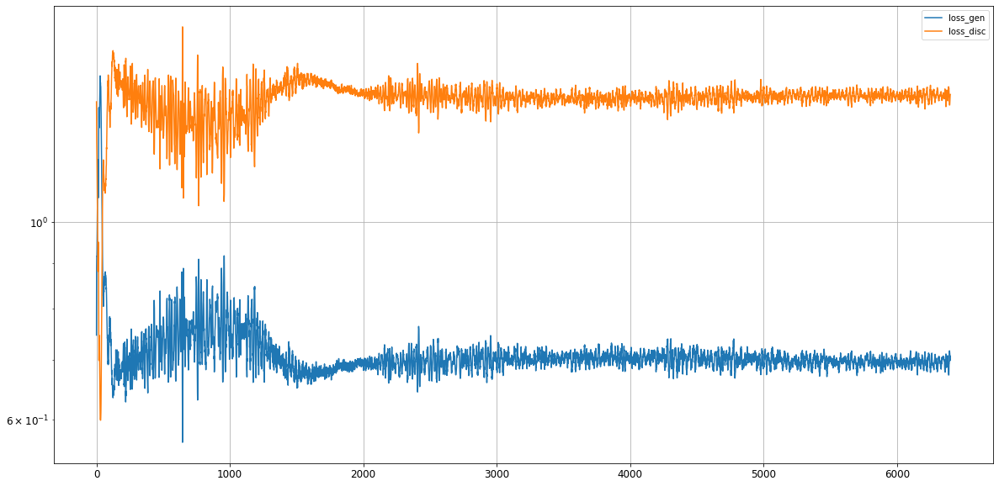

Epoch 6402/15000
0s
Epoch 6403/15000
0s
Epoch 6404/15000
0s
Epoch 6405/15000
0s
Epoch 6406/15000
0s
Epoch 6407/15000
0s
Epoch 6408/15000
0s
Epoch 6409/15000
0s
Epoch 6410/15000
0s
Epoch 6411/15000
0s
Epoch 6412/15000
0s
Epoch 6413/15000
0s
Epoch 6414/15000
0s
Epoch 6415/15000
0s
Epoch 6416/15000
0s
Epoch 6417/15000
0s
Epoch 6418/15000
0s
Epoch 6419/15000
0s
Epoch 6420/15000
0s
Epoch 6421/15000
0s
Epoch 6422/15000
0s
Epoch 6423/15000
0s
Epoch 6424/15000
0s
Epoch 6425/15000
0s
Epoch 6426/15000
0s
Epoch 6427/15000
0s
Epoch 6428/15000
0s
Epoch 6429/15000
0s
Epoch 6430/15000
0s
Epoch 6431/15000
0s
Epoch 6432/15000
0s
Epoch 6433/15000
0s
Epoch 6434/15000
0s
Epoch 6435/15000
0s
Epoch 6436/15000
0s
Epoch 6437/15000
0s
Epoch 6438/15000
0s
Epoch 6439/15000
0s
Epoch 6440/15000
0s
Epoch 6441/15000
0s
Epoch 6442/15000
0s
Epoch 6443/15000
0s
Epoch 6444/15000
0s
Epoch 6445/15000
0s
Epoch 6446/15000
0s
Epoch 6447/15000
0s
Epoch 6448/15000
0s
Epoch 6449/15000
0s
Epoch 6450/15000
0s
Epoch 6451/15000
0s


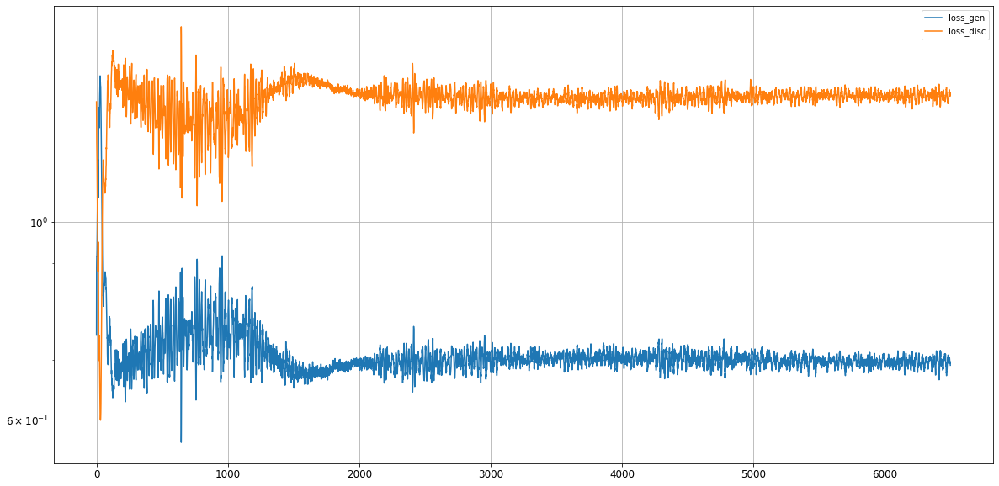

Epoch 6502/15000
0s
Epoch 6503/15000
0s
Epoch 6504/15000
0s
Epoch 6505/15000
0s
Epoch 6506/15000
0s
Epoch 6507/15000
0s
Epoch 6508/15000
0s
Epoch 6509/15000
0s
Epoch 6510/15000
0s
Epoch 6511/15000
0s
Epoch 6512/15000
0s
Epoch 6513/15000
0s
Epoch 6514/15000
0s
Epoch 6515/15000
0s
Epoch 6516/15000
0s
Epoch 6517/15000
0s
Epoch 6518/15000
0s
Epoch 6519/15000
0s
Epoch 6520/15000
0s
Epoch 6521/15000
0s
Epoch 6522/15000
0s
Epoch 6523/15000
0s
Epoch 6524/15000
0s
Epoch 6525/15000
0s
Epoch 6526/15000
0s
Epoch 6527/15000
0s
Epoch 6528/15000
0s
Epoch 6529/15000
0s
Epoch 6530/15000
0s
Epoch 6531/15000
0s
Epoch 6532/15000
0s
Epoch 6533/15000
0s
Epoch 6534/15000
0s
Epoch 6535/15000
0s
Epoch 6536/15000
0s
Epoch 6537/15000
0s
Epoch 6538/15000
0s
Epoch 6539/15000
0s
Epoch 6540/15000
0s
Epoch 6541/15000
0s
Epoch 6542/15000
0s
Epoch 6543/15000
0s
Epoch 6544/15000
0s
Epoch 6545/15000
0s
Epoch 6546/15000
0s
Epoch 6547/15000
0s
Epoch 6548/15000
0s
Epoch 6549/15000
0s
Epoch 6550/15000
0s
Epoch 6551/15000
0s


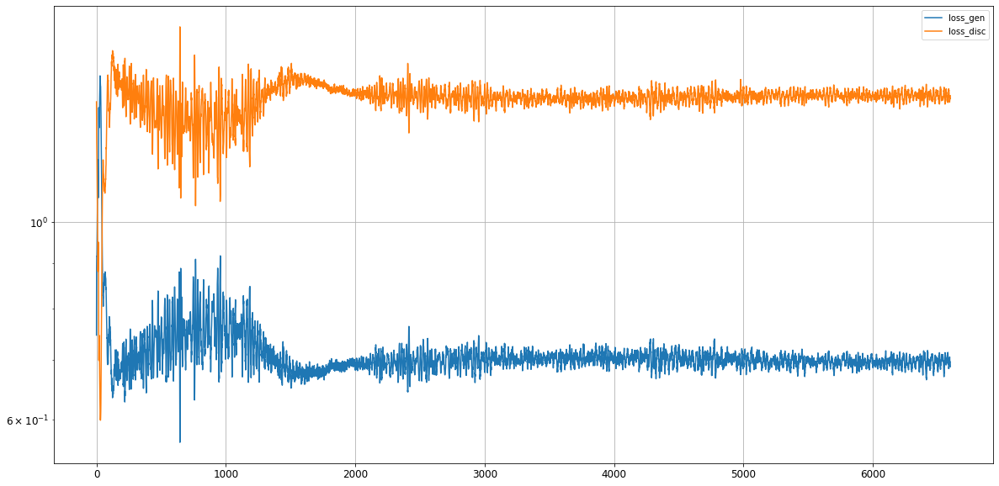

Epoch 6602/15000
0s
Epoch 6603/15000
0s
Epoch 6604/15000
0s
Epoch 6605/15000
0s
Epoch 6606/15000
0s
Epoch 6607/15000
0s
Epoch 6608/15000
0s
Epoch 6609/15000
0s
Epoch 6610/15000
0s
Epoch 6611/15000
0s
Epoch 6612/15000
0s
Epoch 6613/15000
0s
Epoch 6614/15000
0s
Epoch 6615/15000
0s
Epoch 6616/15000
0s
Epoch 6617/15000
0s
Epoch 6618/15000
0s
Epoch 6619/15000
0s
Epoch 6620/15000
0s
Epoch 6621/15000
0s
Epoch 6622/15000
0s
Epoch 6623/15000
0s
Epoch 6624/15000
0s
Epoch 6625/15000
0s
Epoch 6626/15000
0s
Epoch 6627/15000
0s
Epoch 6628/15000
0s
Epoch 6629/15000
0s
Epoch 6630/15000
0s
Epoch 6631/15000
0s
Epoch 6632/15000
0s
Epoch 6633/15000
0s
Epoch 6634/15000
0s
Epoch 6635/15000
0s
Epoch 6636/15000
0s
Epoch 6637/15000
0s
Epoch 6638/15000
0s
Epoch 6639/15000
0s
Epoch 6640/15000
0s
Epoch 6641/15000
0s
Epoch 6642/15000
0s
Epoch 6643/15000
0s
Epoch 6644/15000
0s
Epoch 6645/15000
0s
Epoch 6646/15000
0s
Epoch 6647/15000
0s
Epoch 6648/15000
0s
Epoch 6649/15000
0s
Epoch 6650/15000
0s
Epoch 6651/15000
0s


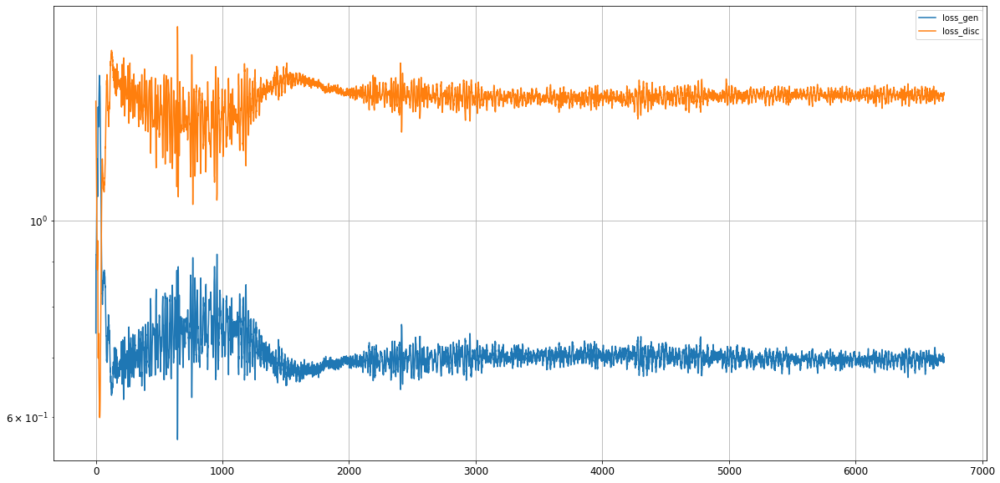

Epoch 6702/15000
0s
Epoch 6703/15000
0s
Epoch 6704/15000
0s
Epoch 6705/15000
0s
Epoch 6706/15000
0s
Epoch 6707/15000
0s
Epoch 6708/15000
0s
Epoch 6709/15000
0s
Epoch 6710/15000
0s
Epoch 6711/15000
0s
Epoch 6712/15000
0s
Epoch 6713/15000
0s
Epoch 6714/15000
0s
Epoch 6715/15000
0s
Epoch 6716/15000
0s
Epoch 6717/15000
0s
Epoch 6718/15000
0s
Epoch 6719/15000
0s
Epoch 6720/15000
0s
Epoch 6721/15000
0s
Epoch 6722/15000
0s
Epoch 6723/15000
0s
Epoch 6724/15000
0s
Epoch 6725/15000
0s
Epoch 6726/15000
0s
Epoch 6727/15000
0s
Epoch 6728/15000
0s
Epoch 6729/15000
0s
Epoch 6730/15000
0s
Epoch 6731/15000
0s
Epoch 6732/15000
0s
Epoch 6733/15000
0s
Epoch 6734/15000
0s
Epoch 6735/15000
0s
Epoch 6736/15000
0s
Epoch 6737/15000
0s
Epoch 6738/15000
0s
Epoch 6739/15000
0s
Epoch 6740/15000
0s
Epoch 6741/15000
0s
Epoch 6742/15000
0s
Epoch 6743/15000
0s
Epoch 6744/15000
0s
Epoch 6745/15000
0s
Epoch 6746/15000
0s
Epoch 6747/15000
0s
Epoch 6748/15000
0s
Epoch 6749/15000
0s
Epoch 6750/15000
0s
Epoch 6751/15000
0s


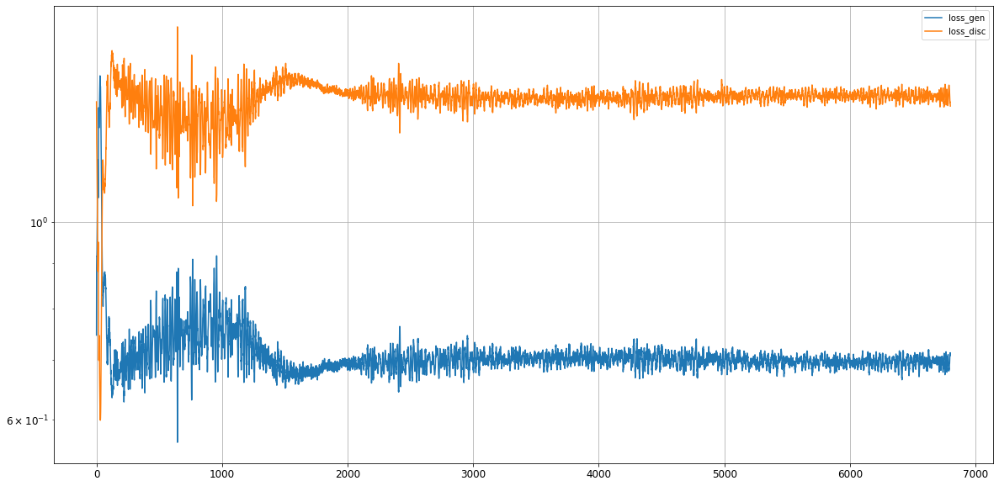

Epoch 6802/15000
0s
Epoch 6803/15000
0s
Epoch 6804/15000
0s
Epoch 6805/15000
0s
Epoch 6806/15000
0s
Epoch 6807/15000
0s
Epoch 6808/15000
0s
Epoch 6809/15000
0s
Epoch 6810/15000
0s
Epoch 6811/15000
0s
Epoch 6812/15000
0s
Epoch 6813/15000
0s
Epoch 6814/15000
0s
Epoch 6815/15000
0s
Epoch 6816/15000
0s
Epoch 6817/15000
0s
Epoch 6818/15000
0s
Epoch 6819/15000
0s
Epoch 6820/15000
0s
Epoch 6821/15000
0s
Epoch 6822/15000
0s
Epoch 6823/15000
0s
Epoch 6824/15000
0s
Epoch 6825/15000
0s
Epoch 6826/15000
0s
Epoch 6827/15000
0s
Epoch 6828/15000
0s
Epoch 6829/15000
0s
Epoch 6830/15000
0s
Epoch 6831/15000
0s
Epoch 6832/15000
0s
Epoch 6833/15000
0s
Epoch 6834/15000
0s
Epoch 6835/15000
0s
Epoch 6836/15000
0s
Epoch 6837/15000
0s
Epoch 6838/15000
0s
Epoch 6839/15000
0s
Epoch 6840/15000
0s
Epoch 6841/15000
0s
Epoch 6842/15000
0s
Epoch 6843/15000
0s
Epoch 6844/15000
0s
Epoch 6845/15000
0s
Epoch 6846/15000
0s
Epoch 6847/15000
0s
Epoch 6848/15000
0s
Epoch 6849/15000
0s
Epoch 6850/15000
0s
Epoch 6851/15000
0s


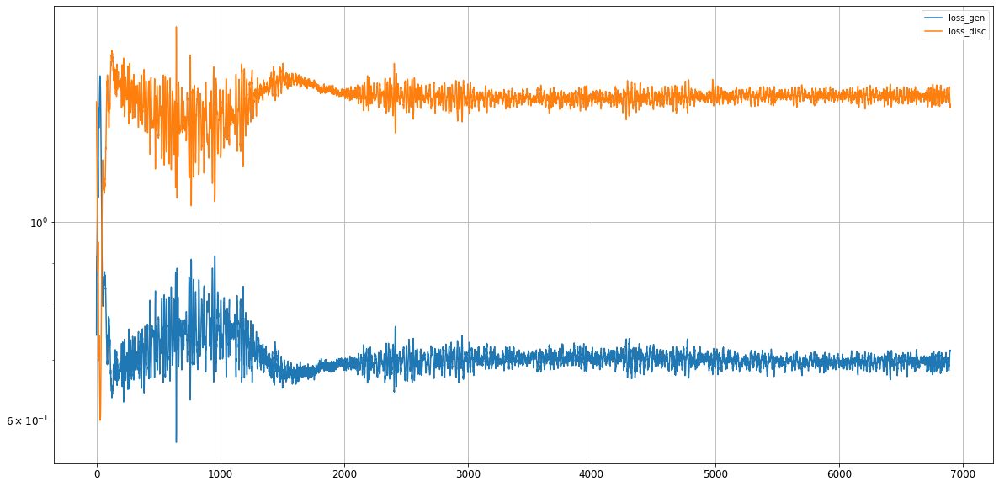

Epoch 6902/15000
0s
Epoch 6903/15000
0s
Epoch 6904/15000
0s
Epoch 6905/15000
0s
Epoch 6906/15000
0s
Epoch 6907/15000
0s
Epoch 6908/15000
0s
Epoch 6909/15000
0s
Epoch 6910/15000
0s
Epoch 6911/15000
0s
Epoch 6912/15000
0s
Epoch 6913/15000
0s
Epoch 6914/15000
0s
Epoch 6915/15000
0s
Epoch 6916/15000
0s
Epoch 6917/15000
0s
Epoch 6918/15000
0s
Epoch 6919/15000
0s
Epoch 6920/15000
0s
Epoch 6921/15000
0s
Epoch 6922/15000
0s
Epoch 6923/15000
0s
Epoch 6924/15000
0s
Epoch 6925/15000
0s
Epoch 6926/15000
0s
Epoch 6927/15000
0s
Epoch 6928/15000
0s
Epoch 6929/15000
0s
Epoch 6930/15000
0s
Epoch 6931/15000
0s
Epoch 6932/15000
0s
Epoch 6933/15000
0s
Epoch 6934/15000
0s
Epoch 6935/15000
0s
Epoch 6936/15000
0s
Epoch 6937/15000
0s
Epoch 6938/15000
0s
Epoch 6939/15000
0s
Epoch 6940/15000
0s
Epoch 6941/15000
0s
Epoch 6942/15000
0s
Epoch 6943/15000
0s
Epoch 6944/15000
0s
Epoch 6945/15000
0s
Epoch 6946/15000
0s
Epoch 6947/15000
0s
Epoch 6948/15000
0s
Epoch 6949/15000
0s
Epoch 6950/15000
0s
Epoch 6951/15000
0s


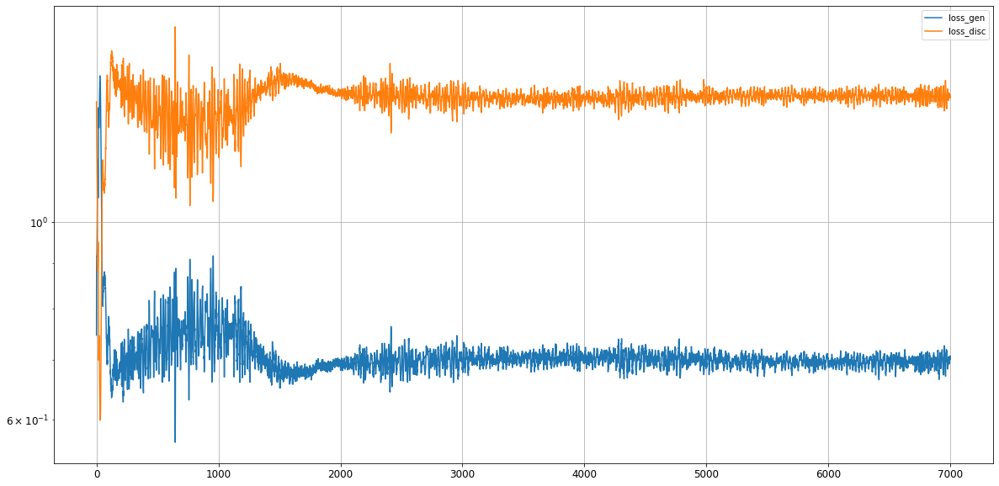

Epoch 7002/15000
0s
Epoch 7003/15000
0s
Epoch 7004/15000
0s
Epoch 7005/15000
0s
Epoch 7006/15000
0s
Epoch 7007/15000
0s
Epoch 7008/15000
0s
Epoch 7009/15000
0s
Epoch 7010/15000
0s
Epoch 7011/15000
0s
Epoch 7012/15000
0s
Epoch 7013/15000
0s
Epoch 7014/15000
0s
Epoch 7015/15000
0s
Epoch 7016/15000
0s
Epoch 7017/15000
0s
Epoch 7018/15000
0s
Epoch 7019/15000
0s
Epoch 7020/15000
0s
Epoch 7021/15000
0s
Epoch 7022/15000
0s
Epoch 7023/15000
0s
Epoch 7024/15000
0s
Epoch 7025/15000
0s
Epoch 7026/15000
0s
Epoch 7027/15000
0s
Epoch 7028/15000
0s
Epoch 7029/15000
0s
Epoch 7030/15000
0s
Epoch 7031/15000
0s
Epoch 7032/15000
0s
Epoch 7033/15000
0s
Epoch 7034/15000
0s
Epoch 7035/15000
0s
Epoch 7036/15000
0s
Epoch 7037/15000
0s
Epoch 7038/15000
0s
Epoch 7039/15000
0s
Epoch 7040/15000
0s
Epoch 7041/15000
0s
Epoch 7042/15000
0s
Epoch 7043/15000
0s
Epoch 7044/15000
0s
Epoch 7045/15000
0s
Epoch 7046/15000
0s
Epoch 7047/15000
0s
Epoch 7048/15000
0s
Epoch 7049/15000
0s
Epoch 7050/15000
0s
Epoch 7051/15000
0s


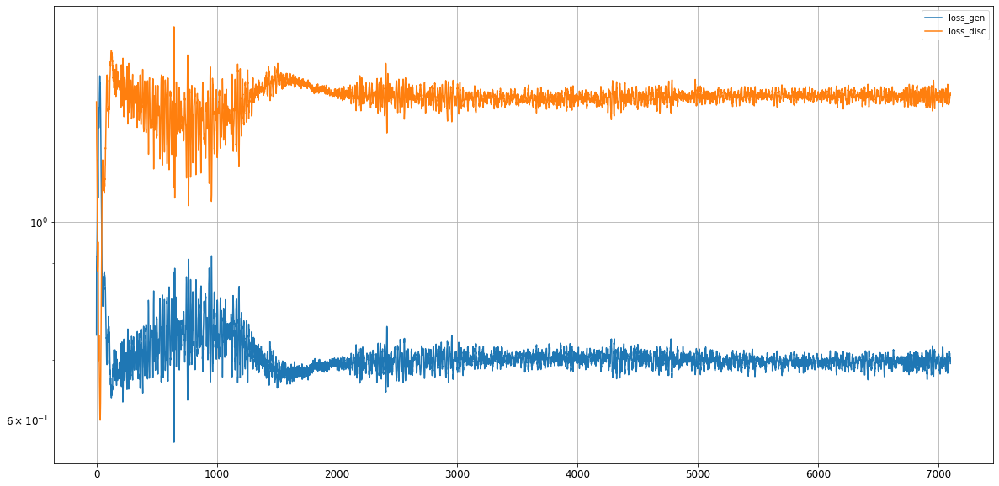

Epoch 7102/15000
0s
Epoch 7103/15000
0s
Epoch 7104/15000
0s
Epoch 7105/15000
0s
Epoch 7106/15000
0s
Epoch 7107/15000
0s
Epoch 7108/15000
0s
Epoch 7109/15000
0s
Epoch 7110/15000
0s
Epoch 7111/15000
0s
Epoch 7112/15000
0s
Epoch 7113/15000
0s
Epoch 7114/15000
0s
Epoch 7115/15000
0s
Epoch 7116/15000
0s
Epoch 7117/15000
0s
Epoch 7118/15000
0s
Epoch 7119/15000
0s
Epoch 7120/15000
0s
Epoch 7121/15000
0s
Epoch 7122/15000
0s
Epoch 7123/15000
0s
Epoch 7124/15000
0s
Epoch 7125/15000
0s
Epoch 7126/15000
0s
Epoch 7127/15000
0s
Epoch 7128/15000
0s
Epoch 7129/15000
0s
Epoch 7130/15000
0s
Epoch 7131/15000
0s
Epoch 7132/15000
0s
Epoch 7133/15000
0s
Epoch 7134/15000
0s
Epoch 7135/15000
0s
Epoch 7136/15000
0s
Epoch 7137/15000
0s
Epoch 7138/15000
0s
Epoch 7139/15000
0s
Epoch 7140/15000
0s
Epoch 7141/15000
0s
Epoch 7142/15000
0s
Epoch 7143/15000
0s
Epoch 7144/15000
0s
Epoch 7145/15000
0s
Epoch 7146/15000
0s
Epoch 7147/15000
0s
Epoch 7148/15000
0s
Epoch 7149/15000
0s
Epoch 7150/15000
0s
Epoch 7151/15000
0s


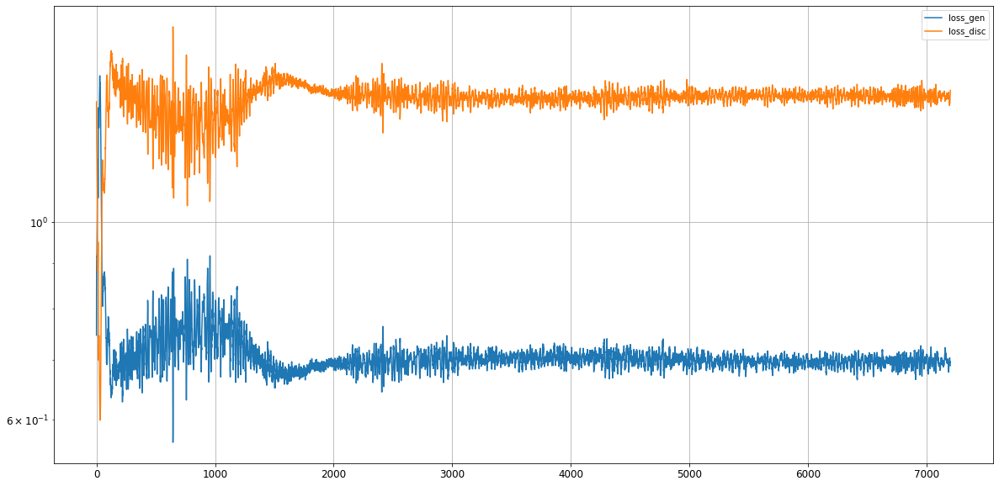

Epoch 7202/15000
0s
Epoch 7203/15000
0s
Epoch 7204/15000
0s
Epoch 7205/15000
0s
Epoch 7206/15000
0s
Epoch 7207/15000
0s
Epoch 7208/15000
0s
Epoch 7209/15000
0s
Epoch 7210/15000
0s
Epoch 7211/15000
0s
Epoch 7212/15000
0s
Epoch 7213/15000
0s
Epoch 7214/15000
0s
Epoch 7215/15000
0s
Epoch 7216/15000
0s
Epoch 7217/15000
0s
Epoch 7218/15000
0s
Epoch 7219/15000
0s
Epoch 7220/15000
0s
Epoch 7221/15000
0s
Epoch 7222/15000
0s
Epoch 7223/15000
0s
Epoch 7224/15000
0s
Epoch 7225/15000
0s
Epoch 7226/15000
0s
Epoch 7227/15000
0s
Epoch 7228/15000
0s
Epoch 7229/15000
0s
Epoch 7230/15000
0s
Epoch 7231/15000
0s
Epoch 7232/15000
0s
Epoch 7233/15000
0s
Epoch 7234/15000
0s
Epoch 7235/15000
0s
Epoch 7236/15000
0s
Epoch 7237/15000
0s
Epoch 7238/15000
0s
Epoch 7239/15000
0s
Epoch 7240/15000
0s
Epoch 7241/15000
0s
Epoch 7242/15000
0s
Epoch 7243/15000
0s
Epoch 7244/15000
0s
Epoch 7245/15000
0s
Epoch 7246/15000
0s
Epoch 7247/15000
0s
Epoch 7248/15000
0s
Epoch 7249/15000
0s
Epoch 7250/15000
0s
Epoch 7251/15000
0s


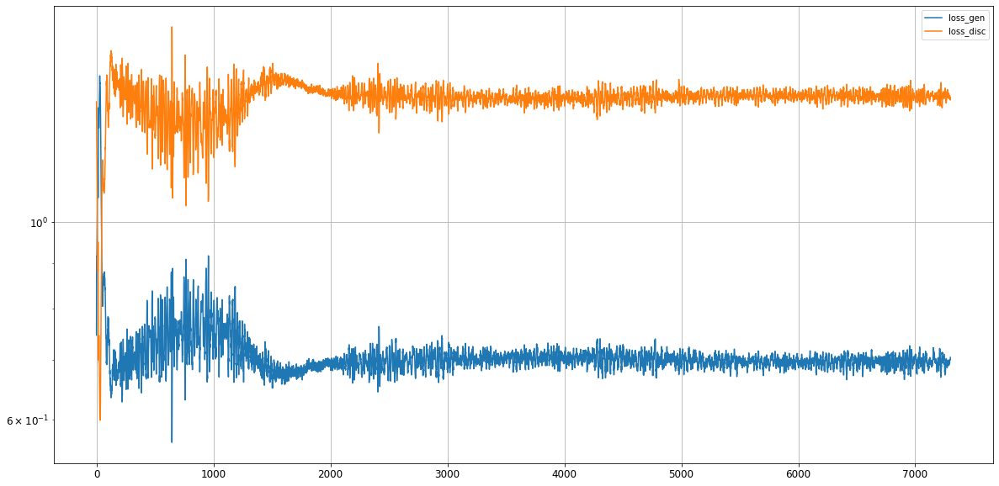

Epoch 7302/15000
0s
Epoch 7303/15000
0s
Epoch 7304/15000
0s
Epoch 7305/15000
0s
Epoch 7306/15000
0s
Epoch 7307/15000
0s
Epoch 7308/15000
0s
Epoch 7309/15000
0s
Epoch 7310/15000
0s
Epoch 7311/15000
0s
Epoch 7312/15000
0s
Epoch 7313/15000
0s
Epoch 7314/15000
0s
Epoch 7315/15000
0s
Epoch 7316/15000
0s
Epoch 7317/15000
0s
Epoch 7318/15000
0s
Epoch 7319/15000
0s
Epoch 7320/15000
0s
Epoch 7321/15000
0s
Epoch 7322/15000
0s
Epoch 7323/15000
0s
Epoch 7324/15000
0s
Epoch 7325/15000
0s
Epoch 7326/15000
0s
Epoch 7327/15000
0s
Epoch 7328/15000
0s
Epoch 7329/15000
0s
Epoch 7330/15000
0s
Epoch 7331/15000
0s
Epoch 7332/15000
0s
Epoch 7333/15000
0s
Epoch 7334/15000
0s
Epoch 7335/15000
0s
Epoch 7336/15000
0s
Epoch 7337/15000
0s
Epoch 7338/15000
0s
Epoch 7339/15000
0s
Epoch 7340/15000
0s
Epoch 7341/15000
0s
Epoch 7342/15000
0s
Epoch 7343/15000
0s
Epoch 7344/15000
0s
Epoch 7345/15000
0s
Epoch 7346/15000
0s
Epoch 7347/15000
0s
Epoch 7348/15000
0s
Epoch 7349/15000
0s
Epoch 7350/15000
0s
Epoch 7351/15000
0s


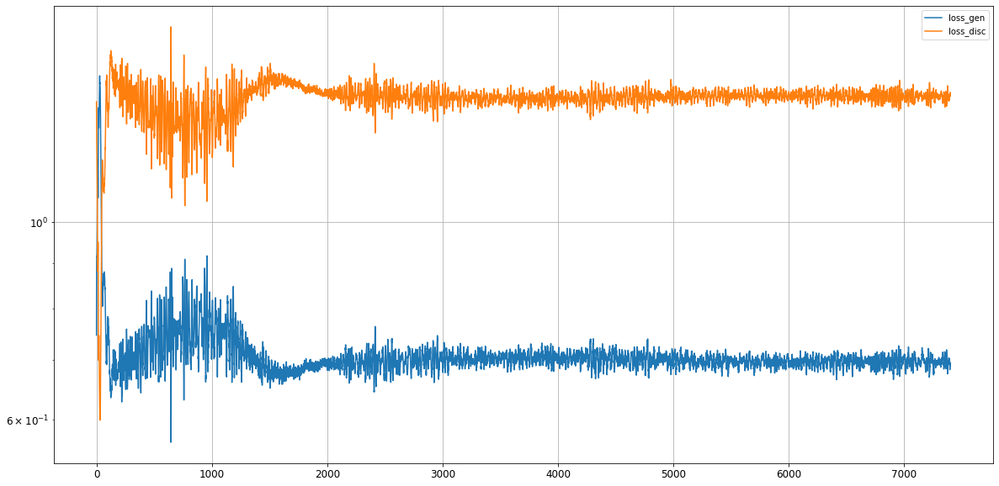

Epoch 7402/15000
0s
Epoch 7403/15000
0s
Epoch 7404/15000
0s
Epoch 7405/15000
0s
Epoch 7406/15000
0s
Epoch 7407/15000
0s
Epoch 7408/15000
0s
Epoch 7409/15000
0s
Epoch 7410/15000
0s
Epoch 7411/15000
0s
Epoch 7412/15000
0s
Epoch 7413/15000
0s
Epoch 7414/15000
0s
Epoch 7415/15000
0s
Epoch 7416/15000
0s
Epoch 7417/15000
0s
Epoch 7418/15000
0s
Epoch 7419/15000
0s
Epoch 7420/15000
0s
Epoch 7421/15000
0s
Epoch 7422/15000
0s
Epoch 7423/15000
0s
Epoch 7424/15000
0s
Epoch 7425/15000
0s
Epoch 7426/15000
0s
Epoch 7427/15000
0s
Epoch 7428/15000
0s
Epoch 7429/15000
0s
Epoch 7430/15000
0s
Epoch 7431/15000
0s
Epoch 7432/15000
0s
Epoch 7433/15000
0s
Epoch 7434/15000
0s
Epoch 7435/15000
0s
Epoch 7436/15000
0s
Epoch 7437/15000
0s
Epoch 7438/15000
0s
Epoch 7439/15000
0s
Epoch 7440/15000
0s
Epoch 7441/15000
0s
Epoch 7442/15000
0s
Epoch 7443/15000
0s
Epoch 7444/15000
0s
Epoch 7445/15000
0s
Epoch 7446/15000
0s
Epoch 7447/15000
0s
Epoch 7448/15000
0s
Epoch 7449/15000
0s
Epoch 7450/15000
0s
Epoch 7451/15000
0s


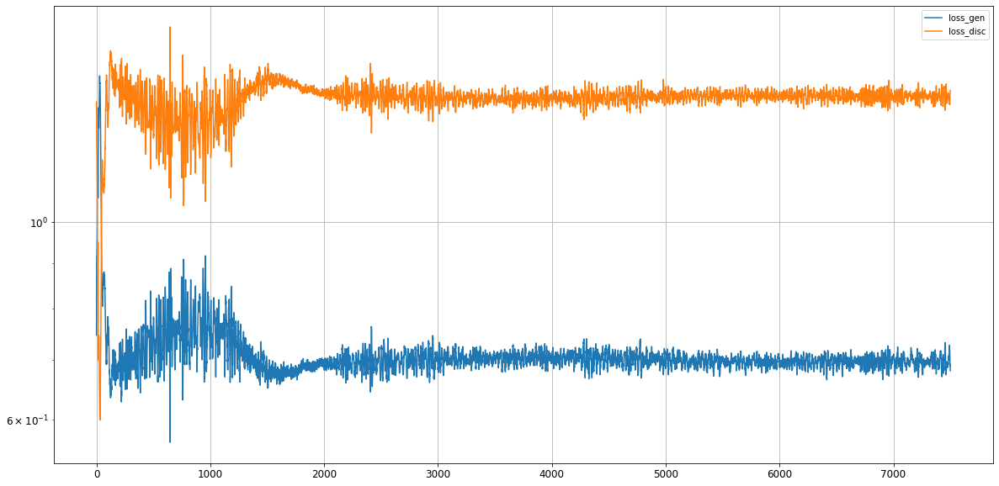

Epoch 7502/15000
0s
Epoch 7503/15000
0s
Epoch 7504/15000
0s
Epoch 7505/15000
0s
Epoch 7506/15000
0s
Epoch 7507/15000
0s
Epoch 7508/15000
0s
Epoch 7509/15000
0s
Epoch 7510/15000
0s
Epoch 7511/15000
0s
Epoch 7512/15000
0s
Epoch 7513/15000
0s
Epoch 7514/15000
0s
Epoch 7515/15000
0s
Epoch 7516/15000
0s
Epoch 7517/15000
0s
Epoch 7518/15000
0s
Epoch 7519/15000
0s
Epoch 7520/15000
0s
Epoch 7521/15000
0s
Epoch 7522/15000
0s
Epoch 7523/15000
0s
Epoch 7524/15000
0s
Epoch 7525/15000
0s
Epoch 7526/15000
0s
Epoch 7527/15000
0s
Epoch 7528/15000
0s
Epoch 7529/15000
0s
Epoch 7530/15000
0s
Epoch 7531/15000
0s
Epoch 7532/15000
0s
Epoch 7533/15000
0s
Epoch 7534/15000
0s
Epoch 7535/15000
0s
Epoch 7536/15000
0s
Epoch 7537/15000
0s
Epoch 7538/15000
0s
Epoch 7539/15000
0s
Epoch 7540/15000
0s
Epoch 7541/15000
0s
Epoch 7542/15000
0s
Epoch 7543/15000
0s
Epoch 7544/15000
0s
Epoch 7545/15000
0s
Epoch 7546/15000
0s
Epoch 7547/15000
0s
Epoch 7548/15000
0s
Epoch 7549/15000
0s
Epoch 7550/15000
0s
Epoch 7551/15000
0s


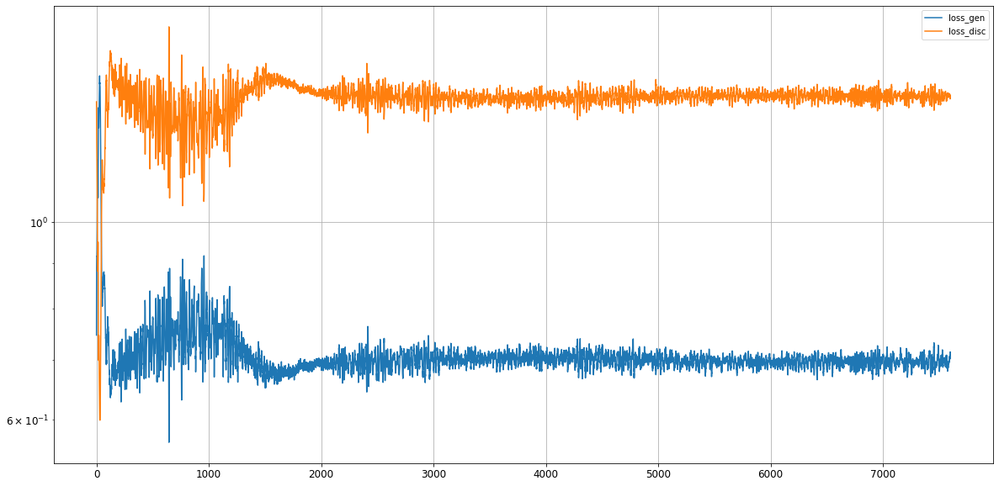

Epoch 7602/15000
0s
Epoch 7603/15000
0s
Epoch 7604/15000
0s
Epoch 7605/15000
0s
Epoch 7606/15000
0s
Epoch 7607/15000
0s
Epoch 7608/15000
0s
Epoch 7609/15000
0s
Epoch 7610/15000
0s
Epoch 7611/15000
0s
Epoch 7612/15000
0s
Epoch 7613/15000
0s
Epoch 7614/15000
0s
Epoch 7615/15000
0s
Epoch 7616/15000
0s
Epoch 7617/15000
0s
Epoch 7618/15000
0s
Epoch 7619/15000
0s
Epoch 7620/15000
0s
Epoch 7621/15000
0s
Epoch 7622/15000
0s
Epoch 7623/15000
0s
Epoch 7624/15000
0s
Epoch 7625/15000
0s
Epoch 7626/15000
0s
Epoch 7627/15000
0s
Epoch 7628/15000
0s
Epoch 7629/15000
0s
Epoch 7630/15000
0s
Epoch 7631/15000
0s
Epoch 7632/15000
0s
Epoch 7633/15000
0s
Epoch 7634/15000
0s
Epoch 7635/15000
0s
Epoch 7636/15000
0s
Epoch 7637/15000
0s
Epoch 7638/15000
0s
Epoch 7639/15000
0s
Epoch 7640/15000
0s
Epoch 7641/15000
0s
Epoch 7642/15000
0s
Epoch 7643/15000
0s
Epoch 7644/15000
0s
Epoch 7645/15000
0s
Epoch 7646/15000
0s
Epoch 7647/15000
0s
Epoch 7648/15000
0s
Epoch 7649/15000
0s
Epoch 7650/15000
0s
Epoch 7651/15000
0s


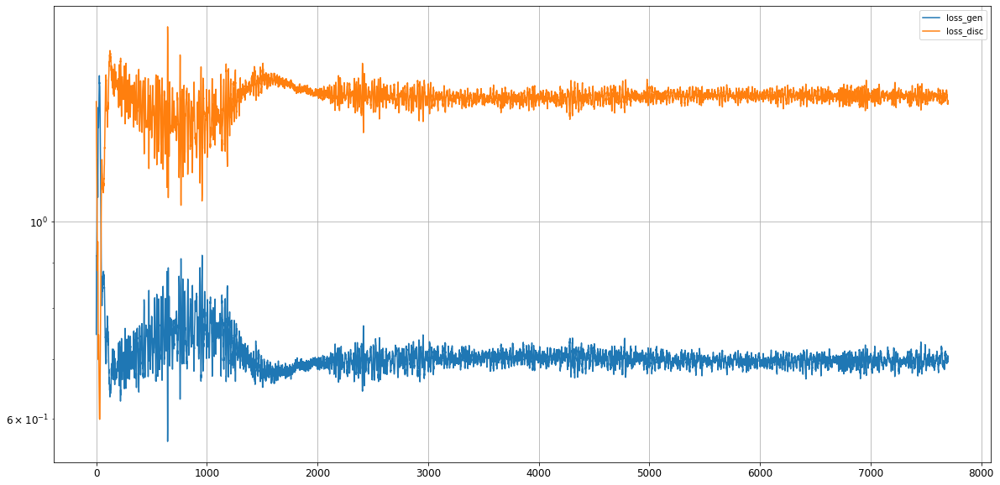

Epoch 7702/15000
0s
Epoch 7703/15000
0s
Epoch 7704/15000
0s
Epoch 7705/15000
0s
Epoch 7706/15000
0s
Epoch 7707/15000
0s
Epoch 7708/15000
0s
Epoch 7709/15000
0s
Epoch 7710/15000
0s
Epoch 7711/15000
0s
Epoch 7712/15000
0s
Epoch 7713/15000
0s
Epoch 7714/15000
0s
Epoch 7715/15000
0s
Epoch 7716/15000
0s
Epoch 7717/15000
0s
Epoch 7718/15000
0s
Epoch 7719/15000
0s
Epoch 7720/15000
0s
Epoch 7721/15000
0s
Epoch 7722/15000
0s
Epoch 7723/15000
0s
Epoch 7724/15000
0s
Epoch 7725/15000
0s
Epoch 7726/15000
0s
Epoch 7727/15000
0s
Epoch 7728/15000
0s
Epoch 7729/15000
0s
Epoch 7730/15000
0s
Epoch 7731/15000
0s
Epoch 7732/15000
0s
Epoch 7733/15000
0s
Epoch 7734/15000
0s
Epoch 7735/15000
0s
Epoch 7736/15000
0s
Epoch 7737/15000
0s
Epoch 7738/15000
0s
Epoch 7739/15000
0s
Epoch 7740/15000
0s
Epoch 7741/15000
0s
Epoch 7742/15000
0s
Epoch 7743/15000
0s
Epoch 7744/15000
0s
Epoch 7745/15000
0s
Epoch 7746/15000
0s
Epoch 7747/15000
0s
Epoch 7748/15000
0s
Epoch 7749/15000
0s
Epoch 7750/15000
0s
Epoch 7751/15000
0s


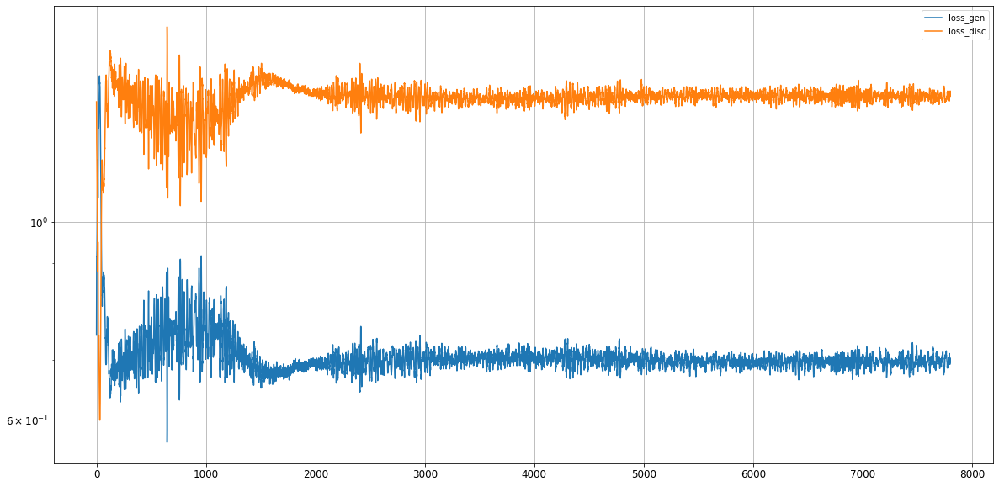

Epoch 7802/15000
0s
Epoch 7803/15000
0s
Epoch 7804/15000
0s
Epoch 7805/15000
0s
Epoch 7806/15000
0s
Epoch 7807/15000
0s
Epoch 7808/15000
0s
Epoch 7809/15000
0s
Epoch 7810/15000
0s
Epoch 7811/15000
0s
Epoch 7812/15000
0s
Epoch 7813/15000
0s
Epoch 7814/15000
0s
Epoch 7815/15000
0s
Epoch 7816/15000
0s
Epoch 7817/15000
0s
Epoch 7818/15000
0s
Epoch 7819/15000
0s
Epoch 7820/15000
0s
Epoch 7821/15000
0s
Epoch 7822/15000
0s
Epoch 7823/15000
0s
Epoch 7824/15000
0s
Epoch 7825/15000
0s
Epoch 7826/15000
0s
Epoch 7827/15000
0s
Epoch 7828/15000
0s
Epoch 7829/15000
0s
Epoch 7830/15000
0s
Epoch 7831/15000
0s
Epoch 7832/15000
0s
Epoch 7833/15000
0s
Epoch 7834/15000
0s
Epoch 7835/15000
0s
Epoch 7836/15000
0s
Epoch 7837/15000
0s
Epoch 7838/15000
0s
Epoch 7839/15000
0s
Epoch 7840/15000
0s
Epoch 7841/15000
0s
Epoch 7842/15000
0s
Epoch 7843/15000
0s
Epoch 7844/15000
0s
Epoch 7845/15000
0s
Epoch 7846/15000
0s
Epoch 7847/15000
0s
Epoch 7848/15000
0s
Epoch 7849/15000
0s
Epoch 7850/15000
0s
Epoch 7851/15000
0s


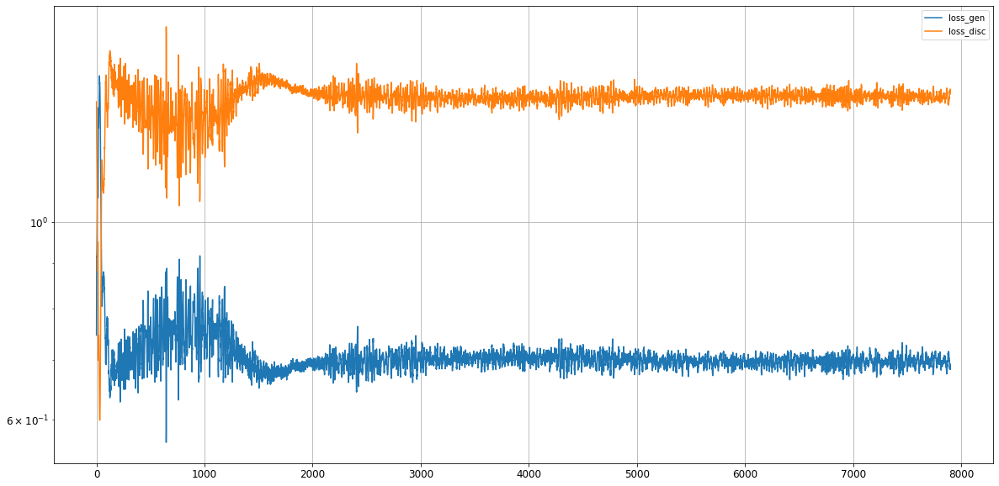

Epoch 7902/15000
0s
Epoch 7903/15000
0s
Epoch 7904/15000
0s
Epoch 7905/15000
0s
Epoch 7906/15000
0s
Epoch 7907/15000
0s
Epoch 7908/15000
0s
Epoch 7909/15000
0s
Epoch 7910/15000
0s
Epoch 7911/15000
0s
Epoch 7912/15000
0s
Epoch 7913/15000
0s
Epoch 7914/15000
0s
Epoch 7915/15000
0s
Epoch 7916/15000
0s
Epoch 7917/15000
0s
Epoch 7918/15000
0s
Epoch 7919/15000
0s
Epoch 7920/15000
0s
Epoch 7921/15000
0s
Epoch 7922/15000
0s
Epoch 7923/15000
0s
Epoch 7924/15000
0s
Epoch 7925/15000
0s
Epoch 7926/15000
0s
Epoch 7927/15000
0s
Epoch 7928/15000
0s
Epoch 7929/15000
0s
Epoch 7930/15000
0s
Epoch 7931/15000
0s
Epoch 7932/15000
0s
Epoch 7933/15000
0s
Epoch 7934/15000
0s
Epoch 7935/15000
0s
Epoch 7936/15000
0s
Epoch 7937/15000
0s
Epoch 7938/15000
0s
Epoch 7939/15000
0s
Epoch 7940/15000
0s
Epoch 7941/15000
0s
Epoch 7942/15000
0s
Epoch 7943/15000
0s
Epoch 7944/15000
0s
Epoch 7945/15000
0s
Epoch 7946/15000
0s
Epoch 7947/15000
0s
Epoch 7948/15000
0s
Epoch 7949/15000
0s
Epoch 7950/15000
0s
Epoch 7951/15000
0s


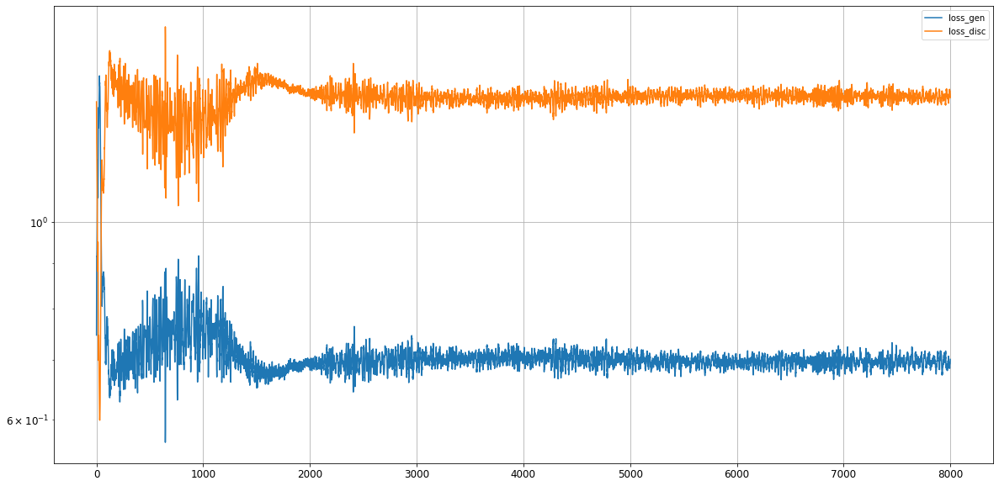

Epoch 8002/15000
0s
Epoch 8003/15000
0s
Epoch 8004/15000
0s
Epoch 8005/15000
0s
Epoch 8006/15000
0s
Epoch 8007/15000
0s
Epoch 8008/15000
0s
Epoch 8009/15000
0s
Epoch 8010/15000
0s
Epoch 8011/15000
0s
Epoch 8012/15000
0s
Epoch 8013/15000
0s
Epoch 8014/15000
0s
Epoch 8015/15000
0s
Epoch 8016/15000
0s
Epoch 8017/15000
0s
Epoch 8018/15000
0s
Epoch 8019/15000
0s
Epoch 8020/15000
0s
Epoch 8021/15000
0s
Epoch 8022/15000
0s
Epoch 8023/15000
0s
Epoch 8024/15000
0s
Epoch 8025/15000
0s
Epoch 8026/15000
0s
Epoch 8027/15000
0s
Epoch 8028/15000
0s
Epoch 8029/15000
0s
Epoch 8030/15000
0s
Epoch 8031/15000
0s
Epoch 8032/15000
0s
Epoch 8033/15000
0s
Epoch 8034/15000
0s
Epoch 8035/15000
0s
Epoch 8036/15000
0s
Epoch 8037/15000
0s
Epoch 8038/15000
0s
Epoch 8039/15000
0s
Epoch 8040/15000
0s
Epoch 8041/15000
0s
Epoch 8042/15000
0s
Epoch 8043/15000
0s
Epoch 8044/15000
0s
Epoch 8045/15000
0s
Epoch 8046/15000
0s
Epoch 8047/15000
0s
Epoch 8048/15000
0s
Epoch 8049/15000
0s
Epoch 8050/15000
0s
Epoch 8051/15000
0s


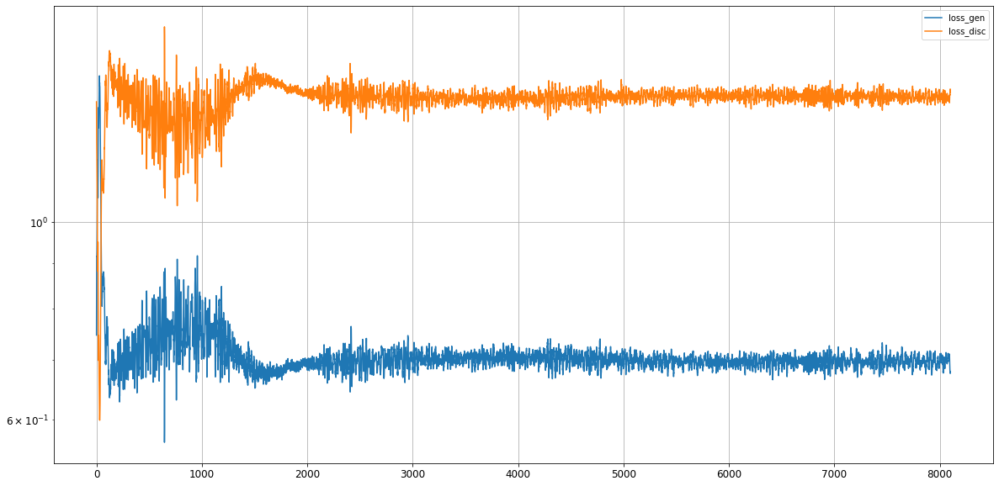

Epoch 8102/15000
0s
Epoch 8103/15000
0s
Epoch 8104/15000
0s
Epoch 8105/15000
0s
Epoch 8106/15000
0s
Epoch 8107/15000
0s
Epoch 8108/15000
0s
Epoch 8109/15000
0s
Epoch 8110/15000
0s
Epoch 8111/15000
0s
Epoch 8112/15000
0s
Epoch 8113/15000
0s
Epoch 8114/15000
0s
Epoch 8115/15000
0s
Epoch 8116/15000
0s
Epoch 8117/15000
0s
Epoch 8118/15000
0s
Epoch 8119/15000
0s
Epoch 8120/15000
0s
Epoch 8121/15000
0s
Epoch 8122/15000
0s
Epoch 8123/15000
0s
Epoch 8124/15000
0s
Epoch 8125/15000
0s
Epoch 8126/15000
0s
Epoch 8127/15000
0s
Epoch 8128/15000
0s
Epoch 8129/15000
0s
Epoch 8130/15000
0s
Epoch 8131/15000
0s
Epoch 8132/15000
0s
Epoch 8133/15000
0s
Epoch 8134/15000
0s
Epoch 8135/15000
0s
Epoch 8136/15000
0s
Epoch 8137/15000
0s
Epoch 8138/15000
0s
Epoch 8139/15000
0s
Epoch 8140/15000
0s
Epoch 8141/15000
0s
Epoch 8142/15000
0s
Epoch 8143/15000
0s
Epoch 8144/15000
0s
Epoch 8145/15000
0s
Epoch 8146/15000
0s
Epoch 8147/15000
0s
Epoch 8148/15000
0s
Epoch 8149/15000
0s
Epoch 8150/15000
0s
Epoch 8151/15000
0s


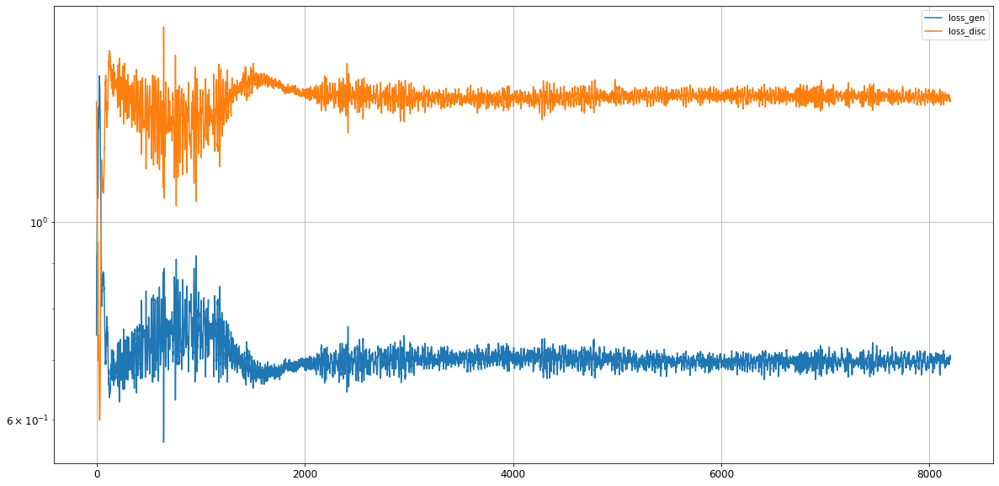

Epoch 8202/15000
0s
Epoch 8203/15000
0s
Epoch 8204/15000
0s
Epoch 8205/15000
0s
Epoch 8206/15000
0s
Epoch 8207/15000
0s
Epoch 8208/15000
0s
Epoch 8209/15000
0s
Epoch 8210/15000
0s
Epoch 8211/15000
0s
Epoch 8212/15000
0s
Epoch 8213/15000
0s
Epoch 8214/15000
0s
Epoch 8215/15000
0s
Epoch 8216/15000
0s
Epoch 8217/15000
0s
Epoch 8218/15000
0s
Epoch 8219/15000
0s
Epoch 8220/15000
0s
Epoch 8221/15000
0s
Epoch 8222/15000
0s
Epoch 8223/15000
0s
Epoch 8224/15000
0s
Epoch 8225/15000
0s
Epoch 8226/15000
0s
Epoch 8227/15000
0s
Epoch 8228/15000
0s
Epoch 8229/15000
0s
Epoch 8230/15000
0s
Epoch 8231/15000
0s
Epoch 8232/15000
0s
Epoch 8233/15000
0s
Epoch 8234/15000
0s
Epoch 8235/15000
0s
Epoch 8236/15000
0s
Epoch 8237/15000
0s
Epoch 8238/15000
0s
Epoch 8239/15000
0s
Epoch 8240/15000
0s
Epoch 8241/15000
0s
Epoch 8242/15000
0s
Epoch 8243/15000
0s
Epoch 8244/15000
0s
Epoch 8245/15000
0s
Epoch 8246/15000
0s
Epoch 8247/15000
0s
Epoch 8248/15000
0s
Epoch 8249/15000
0s
Epoch 8250/15000
0s
Epoch 8251/15000
0s


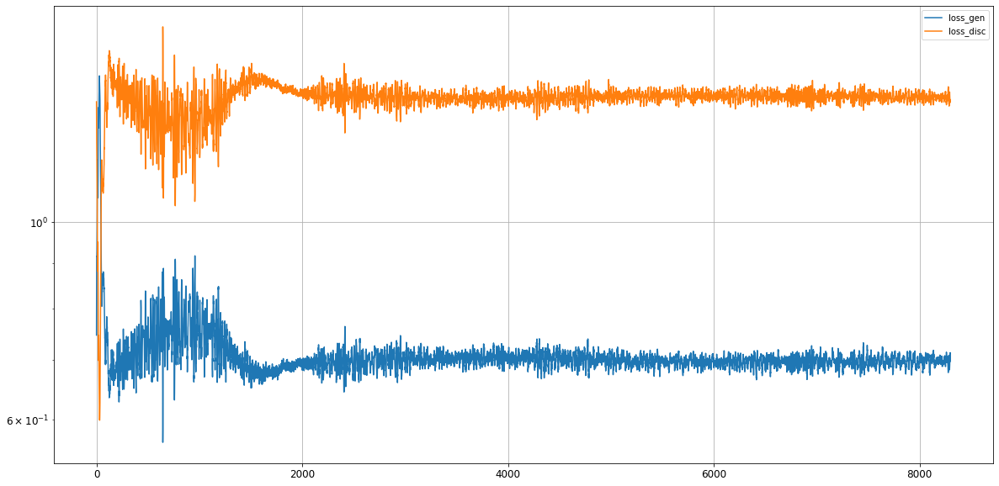

Epoch 8302/15000
0s
Epoch 8303/15000
0s
Epoch 8304/15000
0s
Epoch 8305/15000
0s
Epoch 8306/15000
0s
Epoch 8307/15000
0s
Epoch 8308/15000
0s
Epoch 8309/15000
0s
Epoch 8310/15000
0s
Epoch 8311/15000
0s
Epoch 8312/15000
0s
Epoch 8313/15000
0s
Epoch 8314/15000
0s
Epoch 8315/15000
0s
Epoch 8316/15000
0s
Epoch 8317/15000
0s
Epoch 8318/15000
0s
Epoch 8319/15000
0s
Epoch 8320/15000
0s
Epoch 8321/15000
0s
Epoch 8322/15000
0s
Epoch 8323/15000
0s
Epoch 8324/15000
0s
Epoch 8325/15000
0s
Epoch 8326/15000
0s
Epoch 8327/15000
0s
Epoch 8328/15000
0s
Epoch 8329/15000
0s
Epoch 8330/15000
0s
Epoch 8331/15000
0s
Epoch 8332/15000
0s
Epoch 8333/15000
0s
Epoch 8334/15000
0s
Epoch 8335/15000
0s
Epoch 8336/15000
0s
Epoch 8337/15000
0s
Epoch 8338/15000
0s
Epoch 8339/15000
0s
Epoch 8340/15000
0s
Epoch 8341/15000
0s
Epoch 8342/15000
0s
Epoch 8343/15000
0s
Epoch 8344/15000
0s
Epoch 8345/15000
0s
Epoch 8346/15000
0s
Epoch 8347/15000
0s
Epoch 8348/15000
0s
Epoch 8349/15000
0s
Epoch 8350/15000
0s
Epoch 8351/15000
0s


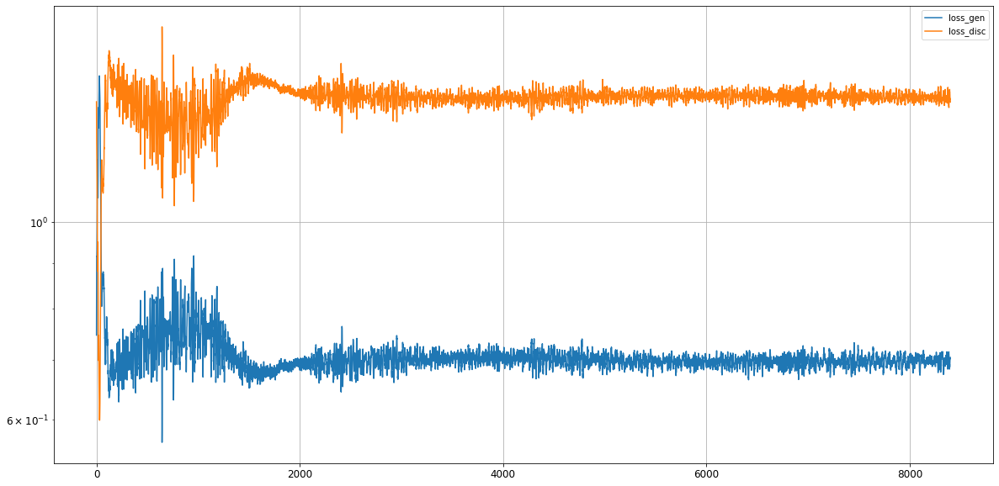

Epoch 8402/15000
0s
Epoch 8403/15000
0s
Epoch 8404/15000
0s
Epoch 8405/15000
0s
Epoch 8406/15000
0s
Epoch 8407/15000
0s
Epoch 8408/15000
0s
Epoch 8409/15000
0s
Epoch 8410/15000
0s
Epoch 8411/15000
0s
Epoch 8412/15000
0s
Epoch 8413/15000
0s
Epoch 8414/15000
0s
Epoch 8415/15000
0s
Epoch 8416/15000
0s
Epoch 8417/15000
0s
Epoch 8418/15000
0s
Epoch 8419/15000
0s
Epoch 8420/15000
0s
Epoch 8421/15000
0s
Epoch 8422/15000
0s
Epoch 8423/15000
0s
Epoch 8424/15000
0s
Epoch 8425/15000
0s
Epoch 8426/15000
0s
Epoch 8427/15000
0s
Epoch 8428/15000
0s
Epoch 8429/15000
0s
Epoch 8430/15000
0s
Epoch 8431/15000
0s
Epoch 8432/15000
0s
Epoch 8433/15000
0s
Epoch 8434/15000
0s
Epoch 8435/15000
0s
Epoch 8436/15000
0s
Epoch 8437/15000
0s
Epoch 8438/15000
0s
Epoch 8439/15000
0s
Epoch 8440/15000
0s
Epoch 8441/15000
0s
Epoch 8442/15000
0s
Epoch 8443/15000
0s
Epoch 8444/15000
0s
Epoch 8445/15000
0s
Epoch 8446/15000
0s
Epoch 8447/15000
0s
Epoch 8448/15000
0s
Epoch 8449/15000
0s
Epoch 8450/15000
0s
Epoch 8451/15000
0s


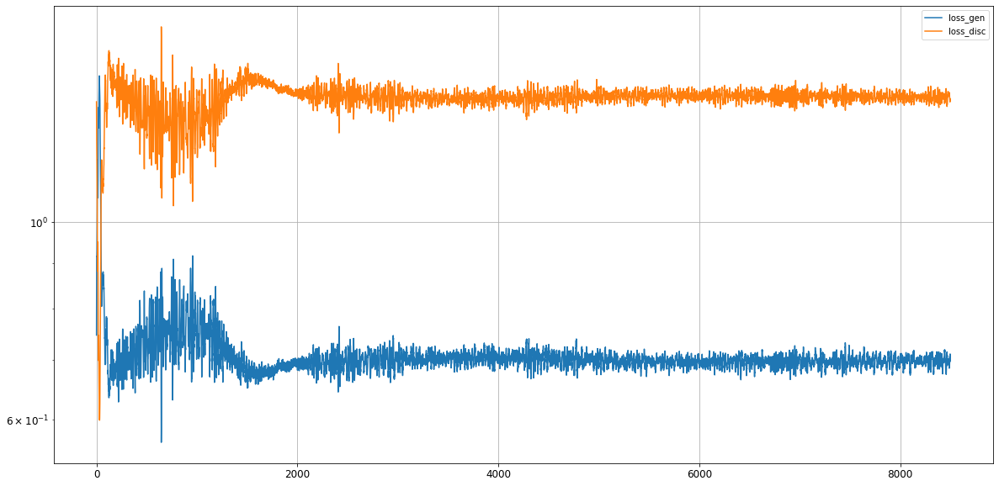

Epoch 8502/15000
0s
Epoch 8503/15000
0s
Epoch 8504/15000
0s
Epoch 8505/15000
0s
Epoch 8506/15000
0s
Epoch 8507/15000
0s
Epoch 8508/15000
0s
Epoch 8509/15000
0s
Epoch 8510/15000
0s
Epoch 8511/15000
0s
Epoch 8512/15000
0s
Epoch 8513/15000
0s
Epoch 8514/15000
0s
Epoch 8515/15000
0s
Epoch 8516/15000
0s
Epoch 8517/15000
0s
Epoch 8518/15000
0s
Epoch 8519/15000
0s
Epoch 8520/15000
0s
Epoch 8521/15000
0s
Epoch 8522/15000
0s
Epoch 8523/15000
0s
Epoch 8524/15000
0s
Epoch 8525/15000
0s
Epoch 8526/15000
0s
Epoch 8527/15000
0s
Epoch 8528/15000
0s
Epoch 8529/15000
0s
Epoch 8530/15000
0s
Epoch 8531/15000
0s
Epoch 8532/15000
0s
Epoch 8533/15000
0s
Epoch 8534/15000
0s
Epoch 8535/15000
0s
Epoch 8536/15000
0s
Epoch 8537/15000
0s
Epoch 8538/15000
0s
Epoch 8539/15000
0s
Epoch 8540/15000
0s
Epoch 8541/15000
0s
Epoch 8542/15000
0s
Epoch 8543/15000
0s
Epoch 8544/15000
0s
Epoch 8545/15000
0s
Epoch 8546/15000
0s
Epoch 8547/15000
0s
Epoch 8548/15000
0s
Epoch 8549/15000
0s
Epoch 8550/15000
0s
Epoch 8551/15000
0s


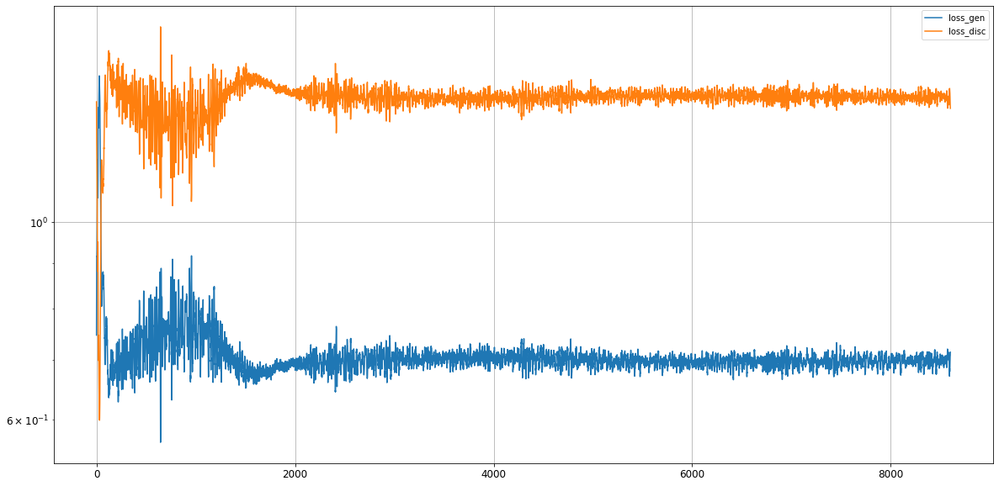

Epoch 8602/15000
0s
Epoch 8603/15000
0s
Epoch 8604/15000
0s
Epoch 8605/15000
0s
Epoch 8606/15000
0s
Epoch 8607/15000
0s
Epoch 8608/15000
0s
Epoch 8609/15000
0s
Epoch 8610/15000
0s
Epoch 8611/15000
0s
Epoch 8612/15000
0s
Epoch 8613/15000
0s
Epoch 8614/15000
0s
Epoch 8615/15000
0s
Epoch 8616/15000
0s
Epoch 8617/15000
0s
Epoch 8618/15000
0s
Epoch 8619/15000
0s
Epoch 8620/15000
0s
Epoch 8621/15000
0s
Epoch 8622/15000
0s
Epoch 8623/15000
0s
Epoch 8624/15000
0s
Epoch 8625/15000
0s
Epoch 8626/15000
0s
Epoch 8627/15000
0s
Epoch 8628/15000
0s
Epoch 8629/15000
0s
Epoch 8630/15000
0s
Epoch 8631/15000
0s
Epoch 8632/15000
0s
Epoch 8633/15000
0s
Epoch 8634/15000
0s
Epoch 8635/15000
0s
Epoch 8636/15000
0s
Epoch 8637/15000
0s
Epoch 8638/15000
0s
Epoch 8639/15000
0s
Epoch 8640/15000
0s
Epoch 8641/15000
0s
Epoch 8642/15000
0s
Epoch 8643/15000
0s
Epoch 8644/15000
0s
Epoch 8645/15000
0s
Epoch 8646/15000
0s
Epoch 8647/15000
0s
Epoch 8648/15000
0s
Epoch 8649/15000
0s
Epoch 8650/15000
0s
Epoch 8651/15000
0s


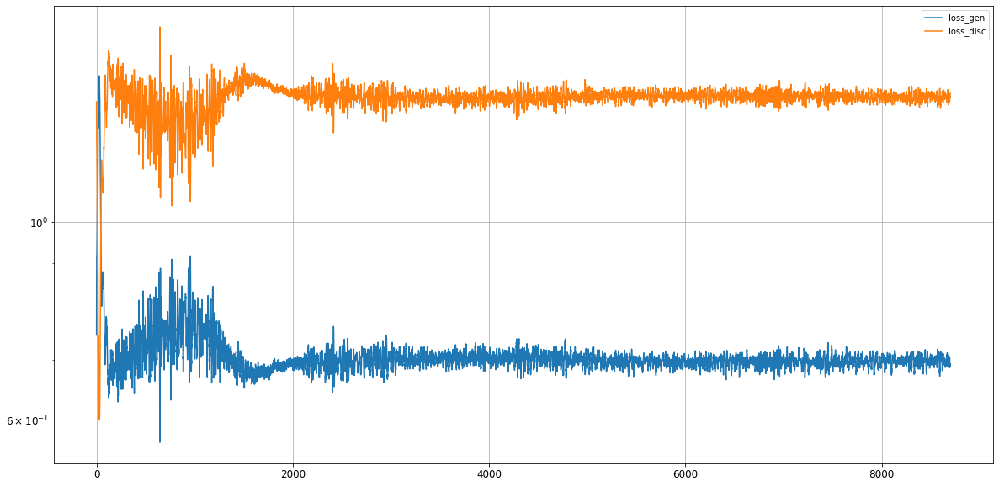

Epoch 8702/15000
0s
Epoch 8703/15000
0s
Epoch 8704/15000
0s
Epoch 8705/15000
0s
Epoch 8706/15000
0s
Epoch 8707/15000
0s
Epoch 8708/15000
0s
Epoch 8709/15000
0s
Epoch 8710/15000
0s
Epoch 8711/15000
0s
Epoch 8712/15000
0s
Epoch 8713/15000
0s
Epoch 8714/15000
0s
Epoch 8715/15000
0s
Epoch 8716/15000
0s
Epoch 8717/15000
0s
Epoch 8718/15000
0s
Epoch 8719/15000
0s
Epoch 8720/15000
0s
Epoch 8721/15000
0s
Epoch 8722/15000
0s
Epoch 8723/15000
0s
Epoch 8724/15000
0s
Epoch 8725/15000
0s
Epoch 8726/15000
0s
Epoch 8727/15000
0s
Epoch 8728/15000
0s
Epoch 8729/15000
0s
Epoch 8730/15000
0s
Epoch 8731/15000
0s
Epoch 8732/15000
0s
Epoch 8733/15000
0s
Epoch 8734/15000
0s
Epoch 8735/15000
0s
Epoch 8736/15000
0s
Epoch 8737/15000
0s
Epoch 8738/15000
0s
Epoch 8739/15000
0s
Epoch 8740/15000
0s
Epoch 8741/15000
0s
Epoch 8742/15000
0s
Epoch 8743/15000
0s
Epoch 8744/15000
0s
Epoch 8745/15000
0s
Epoch 8746/15000
0s
Epoch 8747/15000
0s
Epoch 8748/15000
0s
Epoch 8749/15000
0s
Epoch 8750/15000
0s
Epoch 8751/15000
0s


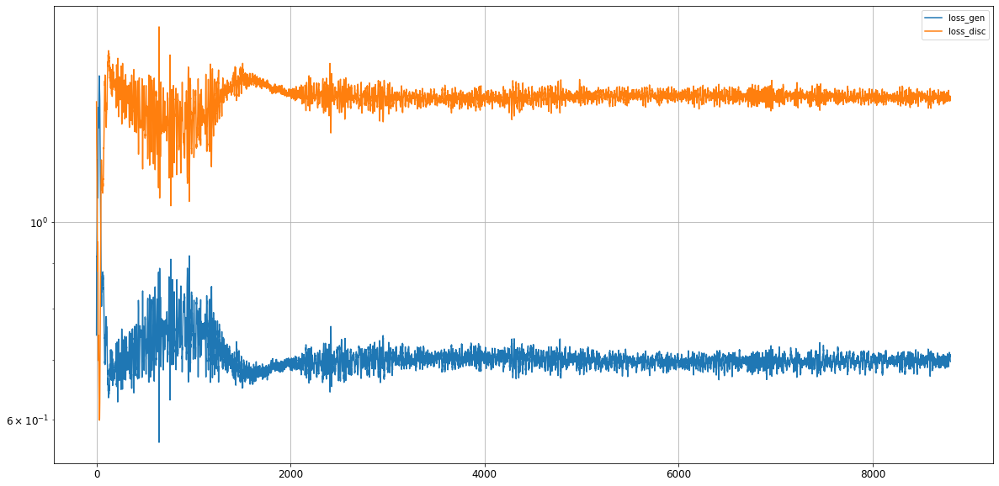

Epoch 8802/15000
0s
Epoch 8803/15000
0s
Epoch 8804/15000
0s
Epoch 8805/15000
0s
Epoch 8806/15000
0s
Epoch 8807/15000
0s
Epoch 8808/15000
0s
Epoch 8809/15000
0s
Epoch 8810/15000
0s
Epoch 8811/15000
0s
Epoch 8812/15000
0s
Epoch 8813/15000
0s
Epoch 8814/15000
0s
Epoch 8815/15000
0s
Epoch 8816/15000
0s
Epoch 8817/15000
0s
Epoch 8818/15000
0s
Epoch 8819/15000
0s
Epoch 8820/15000
0s
Epoch 8821/15000
0s
Epoch 8822/15000
0s
Epoch 8823/15000
0s
Epoch 8824/15000
0s
Epoch 8825/15000
0s
Epoch 8826/15000
0s
Epoch 8827/15000
0s
Epoch 8828/15000
0s
Epoch 8829/15000
0s
Epoch 8830/15000
0s
Epoch 8831/15000
0s
Epoch 8832/15000
0s
Epoch 8833/15000
0s
Epoch 8834/15000
0s
Epoch 8835/15000
0s
Epoch 8836/15000
0s
Epoch 8837/15000
0s
Epoch 8838/15000
0s
Epoch 8839/15000
0s
Epoch 8840/15000
0s
Epoch 8841/15000
0s
Epoch 8842/15000
0s
Epoch 8843/15000
0s
Epoch 8844/15000
0s
Epoch 8845/15000
0s
Epoch 8846/15000
0s
Epoch 8847/15000
0s
Epoch 8848/15000
0s
Epoch 8849/15000
0s
Epoch 8850/15000
0s
Epoch 8851/15000
0s


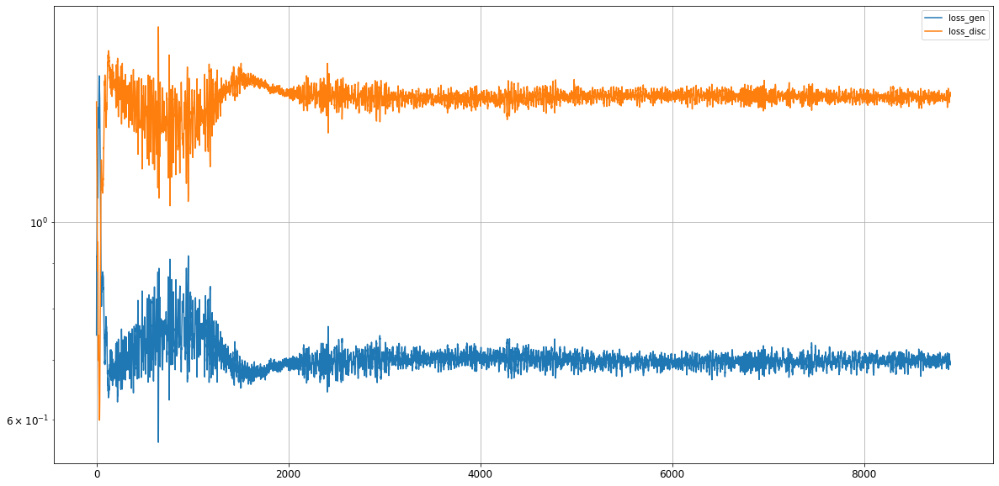

Epoch 8902/15000
0s
Epoch 8903/15000
0s
Epoch 8904/15000
0s
Epoch 8905/15000
0s
Epoch 8906/15000
0s
Epoch 8907/15000
0s
Epoch 8908/15000
0s
Epoch 8909/15000
0s
Epoch 8910/15000
0s
Epoch 8911/15000
0s
Epoch 8912/15000
0s
Epoch 8913/15000
0s
Epoch 8914/15000
0s
Epoch 8915/15000
0s
Epoch 8916/15000
0s
Epoch 8917/15000
0s
Epoch 8918/15000
0s
Epoch 8919/15000
0s
Epoch 8920/15000
0s
Epoch 8921/15000
0s
Epoch 8922/15000
0s
Epoch 8923/15000
0s
Epoch 8924/15000
0s
Epoch 8925/15000
0s
Epoch 8926/15000
0s
Epoch 8927/15000
0s
Epoch 8928/15000
0s
Epoch 8929/15000
0s
Epoch 8930/15000
0s
Epoch 8931/15000
0s
Epoch 8932/15000
0s
Epoch 8933/15000
0s
Epoch 8934/15000
0s
Epoch 8935/15000
0s
Epoch 8936/15000
0s
Epoch 8937/15000
0s
Epoch 8938/15000
0s
Epoch 8939/15000
0s
Epoch 8940/15000
0s
Epoch 8941/15000
0s
Epoch 8942/15000
0s
Epoch 8943/15000
0s
Epoch 8944/15000
0s
Epoch 8945/15000
0s
Epoch 8946/15000
0s
Epoch 8947/15000
0s
Epoch 8948/15000
0s
Epoch 8949/15000
0s
Epoch 8950/15000
0s
Epoch 8951/15000
0s


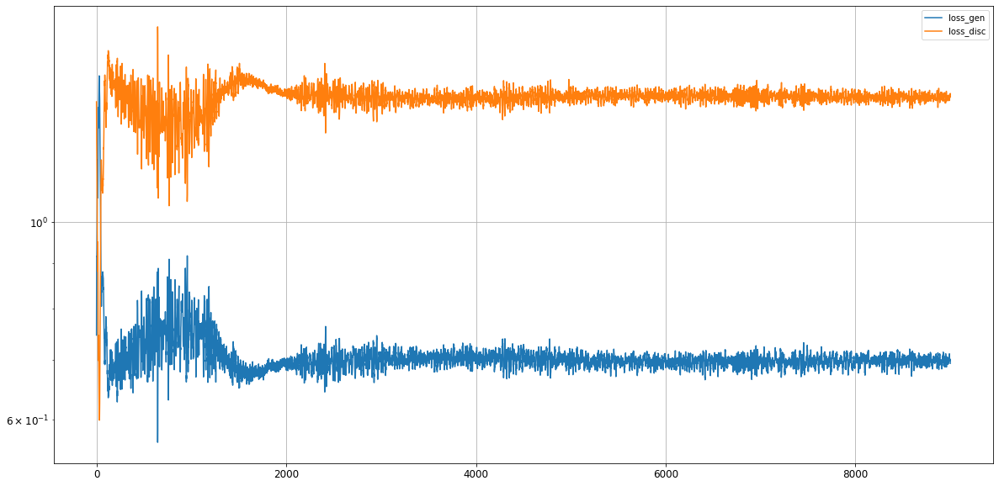

Epoch 9002/15000
0s
Epoch 9003/15000
0s
Epoch 9004/15000
0s
Epoch 9005/15000
0s
Epoch 9006/15000
0s
Epoch 9007/15000
0s
Epoch 9008/15000
0s
Epoch 9009/15000
0s
Epoch 9010/15000
0s
Epoch 9011/15000
0s
Epoch 9012/15000
0s
Epoch 9013/15000
0s
Epoch 9014/15000
0s
Epoch 9015/15000
0s
Epoch 9016/15000
0s
Epoch 9017/15000
0s
Epoch 9018/15000
0s
Epoch 9019/15000
0s
Epoch 9020/15000
0s
Epoch 9021/15000
0s
Epoch 9022/15000
0s
Epoch 9023/15000
0s
Epoch 9024/15000
0s
Epoch 9025/15000
0s
Epoch 9026/15000
0s
Epoch 9027/15000
0s
Epoch 9028/15000
0s
Epoch 9029/15000
0s
Epoch 9030/15000
0s
Epoch 9031/15000
0s
Epoch 9032/15000
0s
Epoch 9033/15000
0s
Epoch 9034/15000
0s
Epoch 9035/15000
0s
Epoch 9036/15000
0s
Epoch 9037/15000
0s
Epoch 9038/15000
0s
Epoch 9039/15000
0s
Epoch 9040/15000
0s
Epoch 9041/15000
0s
Epoch 9042/15000
0s
Epoch 9043/15000
0s
Epoch 9044/15000
0s
Epoch 9045/15000
0s
Epoch 9046/15000
0s
Epoch 9047/15000
0s
Epoch 9048/15000
0s
Epoch 9049/15000
0s
Epoch 9050/15000
0s
Epoch 9051/15000
0s


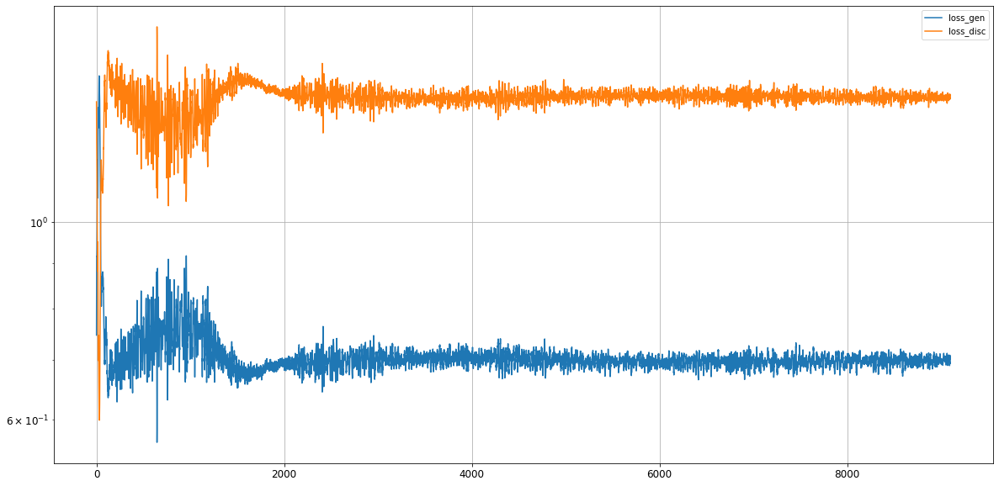

Epoch 9102/15000
0s
Epoch 9103/15000
0s
Epoch 9104/15000
0s
Epoch 9105/15000
0s
Epoch 9106/15000
0s
Epoch 9107/15000
0s
Epoch 9108/15000
0s
Epoch 9109/15000
0s
Epoch 9110/15000
0s
Epoch 9111/15000
0s
Epoch 9112/15000
0s
Epoch 9113/15000
0s
Epoch 9114/15000
0s
Epoch 9115/15000
0s
Epoch 9116/15000
0s
Epoch 9117/15000
0s
Epoch 9118/15000
0s
Epoch 9119/15000
0s
Epoch 9120/15000
0s
Epoch 9121/15000
0s
Epoch 9122/15000
0s
Epoch 9123/15000
0s
Epoch 9124/15000
0s
Epoch 9125/15000
0s
Epoch 9126/15000
0s
Epoch 9127/15000
0s
Epoch 9128/15000
0s
Epoch 9129/15000
0s
Epoch 9130/15000
0s
Epoch 9131/15000
0s
Epoch 9132/15000
0s
Epoch 9133/15000
0s
Epoch 9134/15000
0s
Epoch 9135/15000
0s
Epoch 9136/15000
0s
Epoch 9137/15000
0s
Epoch 9138/15000
0s
Epoch 9139/15000
0s
Epoch 9140/15000
0s
Epoch 9141/15000
0s
Epoch 9142/15000
0s
Epoch 9143/15000
0s
Epoch 9144/15000
0s
Epoch 9145/15000
0s
Epoch 9146/15000
0s
Epoch 9147/15000
0s
Epoch 9148/15000
0s
Epoch 9149/15000
0s
Epoch 9150/15000
0s
Epoch 9151/15000
0s


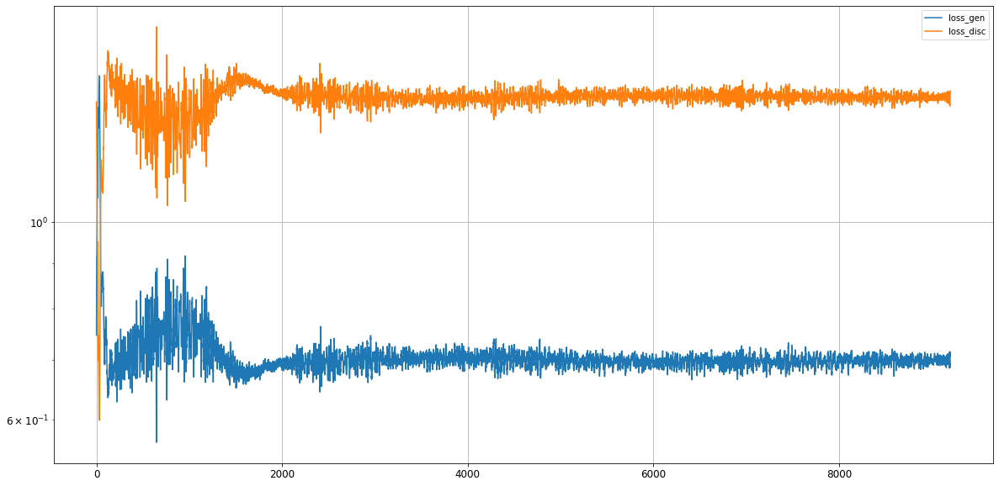

Epoch 9202/15000
0s
Epoch 9203/15000
0s
Epoch 9204/15000
0s
Epoch 9205/15000
0s
Epoch 9206/15000
0s
Epoch 9207/15000
0s
Epoch 9208/15000
0s
Epoch 9209/15000
0s
Epoch 9210/15000
0s
Epoch 9211/15000
0s
Epoch 9212/15000
0s
Epoch 9213/15000
0s
Epoch 9214/15000
0s
Epoch 9215/15000
0s
Epoch 9216/15000
0s
Epoch 9217/15000
0s
Epoch 9218/15000
0s
Epoch 9219/15000
0s
Epoch 9220/15000
0s
Epoch 9221/15000
0s
Epoch 9222/15000
0s
Epoch 9223/15000
0s
Epoch 9224/15000
0s
Epoch 9225/15000
0s
Epoch 9226/15000
0s
Epoch 9227/15000
0s
Epoch 9228/15000
0s
Epoch 9229/15000
0s
Epoch 9230/15000
0s
Epoch 9231/15000
0s
Epoch 9232/15000
0s
Epoch 9233/15000
0s
Epoch 9234/15000
0s
Epoch 9235/15000
0s
Epoch 9236/15000
0s
Epoch 9237/15000
0s
Epoch 9238/15000
0s
Epoch 9239/15000
0s
Epoch 9240/15000
0s
Epoch 9241/15000
0s
Epoch 9242/15000
0s
Epoch 9243/15000
0s
Epoch 9244/15000
0s
Epoch 9245/15000
0s
Epoch 9246/15000
0s
Epoch 9247/15000
0s
Epoch 9248/15000
0s
Epoch 9249/15000
0s
Epoch 9250/15000
0s
Epoch 9251/15000
0s


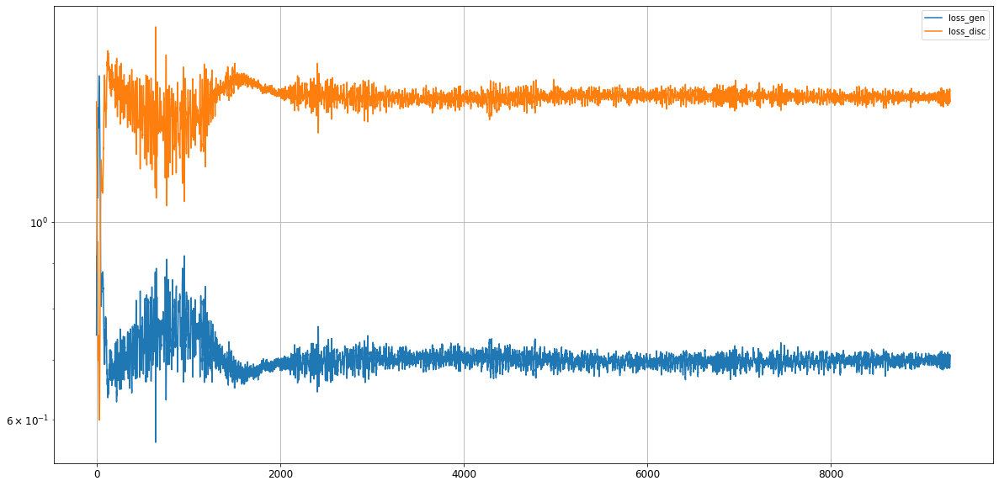

Epoch 9302/15000
0s
Epoch 9303/15000
0s
Epoch 9304/15000
0s
Epoch 9305/15000
0s
Epoch 9306/15000
0s
Epoch 9307/15000
0s
Epoch 9308/15000
0s
Epoch 9309/15000
0s
Epoch 9310/15000
0s
Epoch 9311/15000
0s
Epoch 9312/15000
0s
Epoch 9313/15000
0s
Epoch 9314/15000
0s
Epoch 9315/15000
0s
Epoch 9316/15000
0s
Epoch 9317/15000
0s
Epoch 9318/15000
0s
Epoch 9319/15000
0s
Epoch 9320/15000
0s
Epoch 9321/15000
0s
Epoch 9322/15000
0s
Epoch 9323/15000
0s
Epoch 9324/15000
0s
Epoch 9325/15000
0s
Epoch 9326/15000
0s
Epoch 9327/15000
0s
Epoch 9328/15000
0s
Epoch 9329/15000
0s
Epoch 9330/15000
0s
Epoch 9331/15000
0s
Epoch 9332/15000
0s
Epoch 9333/15000
0s
Epoch 9334/15000
0s
Epoch 9335/15000
0s
Epoch 9336/15000
0s
Epoch 9337/15000
0s
Epoch 9338/15000
0s
Epoch 9339/15000
0s
Epoch 9340/15000
0s
Epoch 9341/15000
0s
Epoch 9342/15000
0s
Epoch 9343/15000
0s
Epoch 9344/15000
0s
Epoch 9345/15000
0s
Epoch 9346/15000
0s
Epoch 9347/15000
0s
Epoch 9348/15000
0s
Epoch 9349/15000
0s
Epoch 9350/15000
0s
Epoch 9351/15000
0s


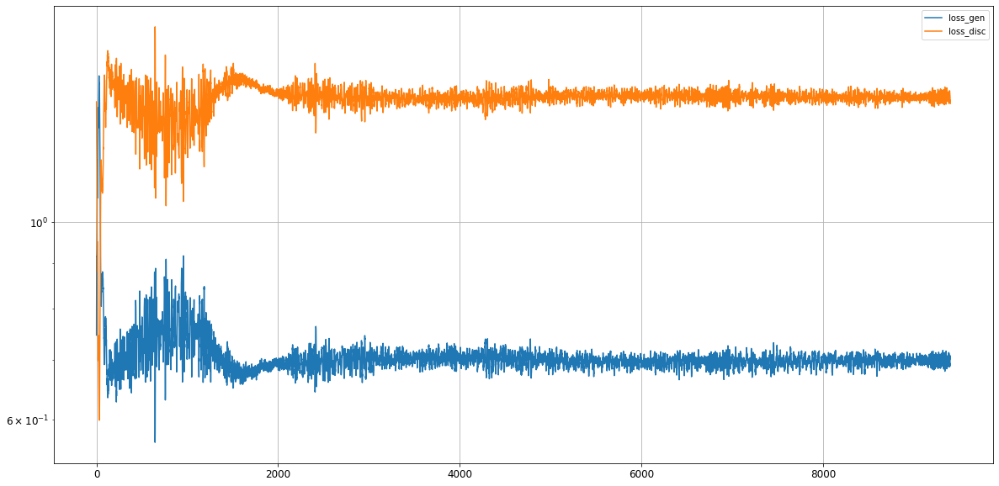

Epoch 9402/15000
0s
Epoch 9403/15000
0s
Epoch 9404/15000
0s
Epoch 9405/15000
0s
Epoch 9406/15000
0s
Epoch 9407/15000
0s
Epoch 9408/15000
0s
Epoch 9409/15000
0s
Epoch 9410/15000
0s
Epoch 9411/15000
0s
Epoch 9412/15000
0s
Epoch 9413/15000
0s
Epoch 9414/15000
0s
Epoch 9415/15000
0s
Epoch 9416/15000
0s
Epoch 9417/15000
0s
Epoch 9418/15000
0s
Epoch 9419/15000
0s
Epoch 9420/15000
0s
Epoch 9421/15000
0s
Epoch 9422/15000
0s
Epoch 9423/15000
0s
Epoch 9424/15000
0s
Epoch 9425/15000
0s
Epoch 9426/15000
0s
Epoch 9427/15000
0s
Epoch 9428/15000
0s
Epoch 9429/15000
0s
Epoch 9430/15000
0s
Epoch 9431/15000
0s
Epoch 9432/15000
0s
Epoch 9433/15000
0s
Epoch 9434/15000
0s
Epoch 9435/15000
0s
Epoch 9436/15000
0s
Epoch 9437/15000
0s
Epoch 9438/15000
0s
Epoch 9439/15000
0s
Epoch 9440/15000
0s
Epoch 9441/15000
0s
Epoch 9442/15000
0s
Epoch 9443/15000
0s
Epoch 9444/15000
0s
Epoch 9445/15000
0s
Epoch 9446/15000
0s
Epoch 9447/15000
0s
Epoch 9448/15000
0s
Epoch 9449/15000
0s
Epoch 9450/15000
0s
Epoch 9451/15000
0s


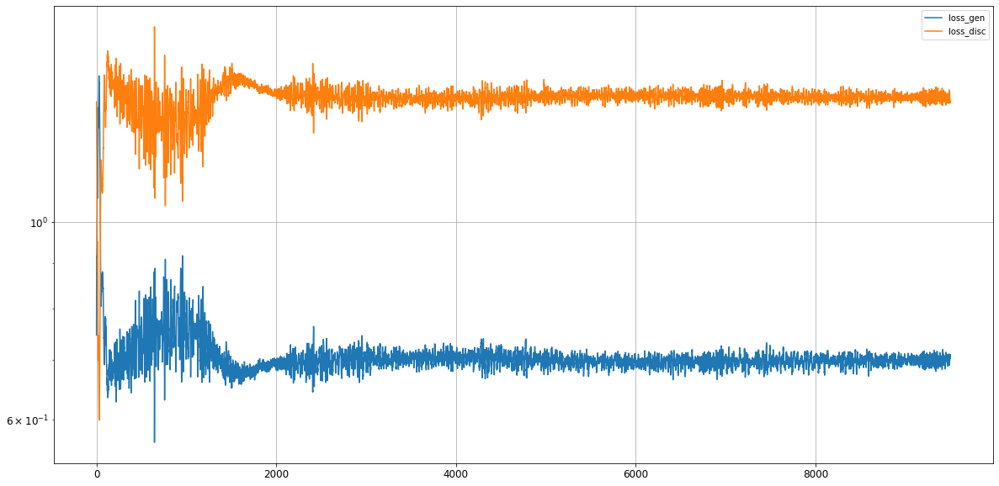

Epoch 9502/15000
0s
Epoch 9503/15000
0s
Epoch 9504/15000
0s
Epoch 9505/15000
0s
Epoch 9506/15000
0s
Epoch 9507/15000
0s
Epoch 9508/15000
0s
Epoch 9509/15000
0s
Epoch 9510/15000
0s
Epoch 9511/15000
0s
Epoch 9512/15000
0s
Epoch 9513/15000
0s
Epoch 9514/15000
0s
Epoch 9515/15000
0s
Epoch 9516/15000
0s
Epoch 9517/15000
0s
Epoch 9518/15000
0s
Epoch 9519/15000
0s
Epoch 9520/15000
0s
Epoch 9521/15000
0s
Epoch 9522/15000
0s
Epoch 9523/15000
0s
Epoch 9524/15000
0s
Epoch 9525/15000
0s
Epoch 9526/15000
0s
Epoch 9527/15000
0s
Epoch 9528/15000
0s
Epoch 9529/15000
0s
Epoch 9530/15000
0s
Epoch 9531/15000
0s
Epoch 9532/15000
0s
Epoch 9533/15000
0s
Epoch 9534/15000
0s
Epoch 9535/15000
0s
Epoch 9536/15000
0s
Epoch 9537/15000
0s
Epoch 9538/15000
0s
Epoch 9539/15000
0s
Epoch 9540/15000
0s
Epoch 9541/15000
0s
Epoch 9542/15000
0s
Epoch 9543/15000
0s
Epoch 9544/15000
0s
Epoch 9545/15000
0s
Epoch 9546/15000
0s
Epoch 9547/15000
0s
Epoch 9548/15000
0s
Epoch 9549/15000
0s
Epoch 9550/15000
0s
Epoch 9551/15000
0s


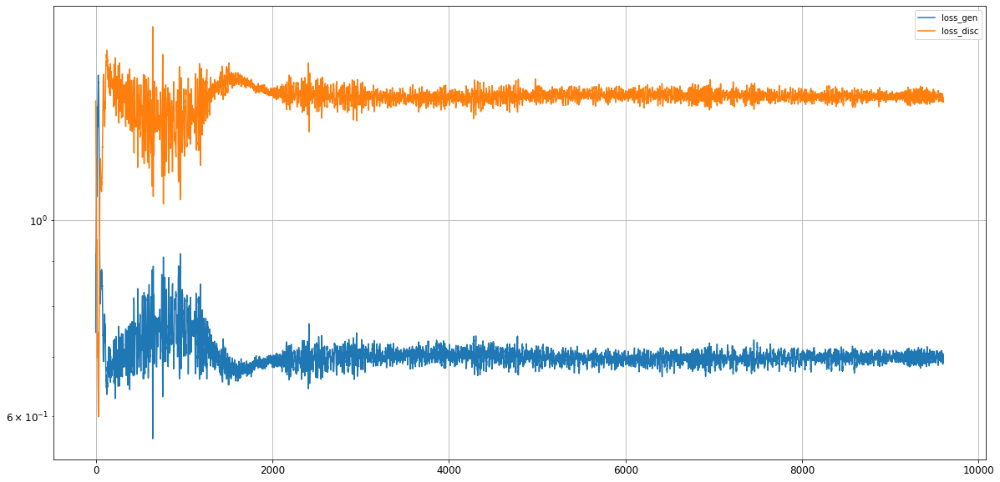

Epoch 9602/15000
0s
Epoch 9603/15000
0s
Epoch 9604/15000
0s
Epoch 9605/15000
0s
Epoch 9606/15000
0s
Epoch 9607/15000
0s
Epoch 9608/15000
0s
Epoch 9609/15000
0s
Epoch 9610/15000
0s
Epoch 9611/15000
0s
Epoch 9612/15000
0s
Epoch 9613/15000
0s
Epoch 9614/15000
0s
Epoch 9615/15000
0s
Epoch 9616/15000
0s
Epoch 9617/15000
0s
Epoch 9618/15000
0s
Epoch 9619/15000
0s
Epoch 9620/15000
0s
Epoch 9621/15000
0s
Epoch 9622/15000
0s
Epoch 9623/15000
0s
Epoch 9624/15000
0s
Epoch 9625/15000
0s
Epoch 9626/15000
0s
Epoch 9627/15000
0s
Epoch 9628/15000
0s
Epoch 9629/15000
0s
Epoch 9630/15000
0s
Epoch 9631/15000
0s
Epoch 9632/15000
0s
Epoch 9633/15000
0s
Epoch 9634/15000
0s
Epoch 9635/15000
0s
Epoch 9636/15000
0s
Epoch 9637/15000
0s
Epoch 9638/15000
0s
Epoch 9639/15000
0s
Epoch 9640/15000
0s
Epoch 9641/15000
0s
Epoch 9642/15000
0s
Epoch 9643/15000
0s
Epoch 9644/15000
0s
Epoch 9645/15000
0s
Epoch 9646/15000
0s
Epoch 9647/15000
0s
Epoch 9648/15000
0s
Epoch 9649/15000
0s
Epoch 9650/15000
0s
Epoch 9651/15000
0s


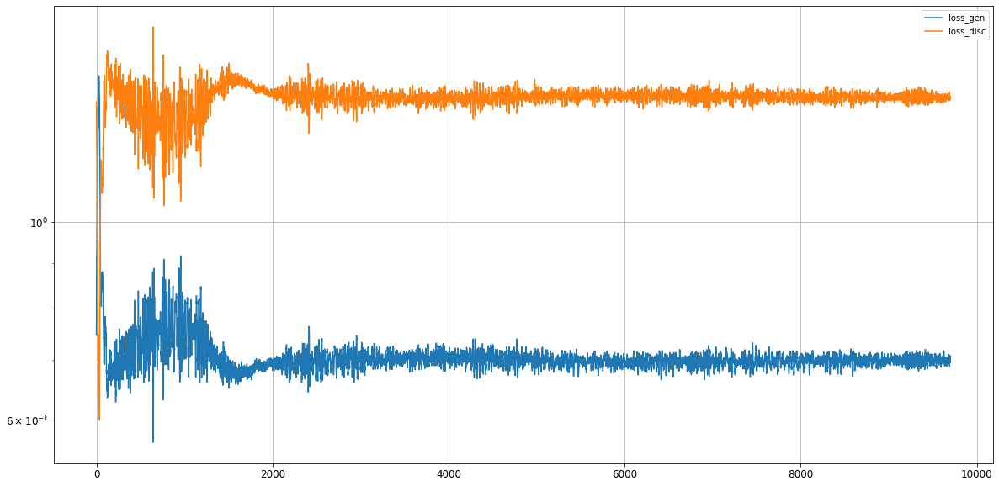

Epoch 9702/15000
0s
Epoch 9703/15000
0s
Epoch 9704/15000
0s
Epoch 9705/15000
0s
Epoch 9706/15000
0s
Epoch 9707/15000
0s
Epoch 9708/15000
0s
Epoch 9709/15000
0s
Epoch 9710/15000
0s
Epoch 9711/15000
0s
Epoch 9712/15000
0s
Epoch 9713/15000
0s
Epoch 9714/15000
0s
Epoch 9715/15000
0s
Epoch 9716/15000
0s
Epoch 9717/15000
0s
Epoch 9718/15000
0s
Epoch 9719/15000
0s
Epoch 9720/15000
0s
Epoch 9721/15000
0s
Epoch 9722/15000
0s
Epoch 9723/15000
0s
Epoch 9724/15000
0s
Epoch 9725/15000
0s
Epoch 9726/15000
0s
Epoch 9727/15000
0s
Epoch 9728/15000
0s
Epoch 9729/15000
0s
Epoch 9730/15000
0s
Epoch 9731/15000
0s
Epoch 9732/15000
0s
Epoch 9733/15000
0s
Epoch 9734/15000
0s
Epoch 9735/15000
0s
Epoch 9736/15000
0s
Epoch 9737/15000
0s
Epoch 9738/15000
0s
Epoch 9739/15000
0s
Epoch 9740/15000
0s
Epoch 9741/15000
0s
Epoch 9742/15000
0s
Epoch 9743/15000
0s
Epoch 9744/15000
0s
Epoch 9745/15000
0s
Epoch 9746/15000
0s
Epoch 9747/15000
0s
Epoch 9748/15000
0s
Epoch 9749/15000
0s
Epoch 9750/15000
0s
Epoch 9751/15000
0s


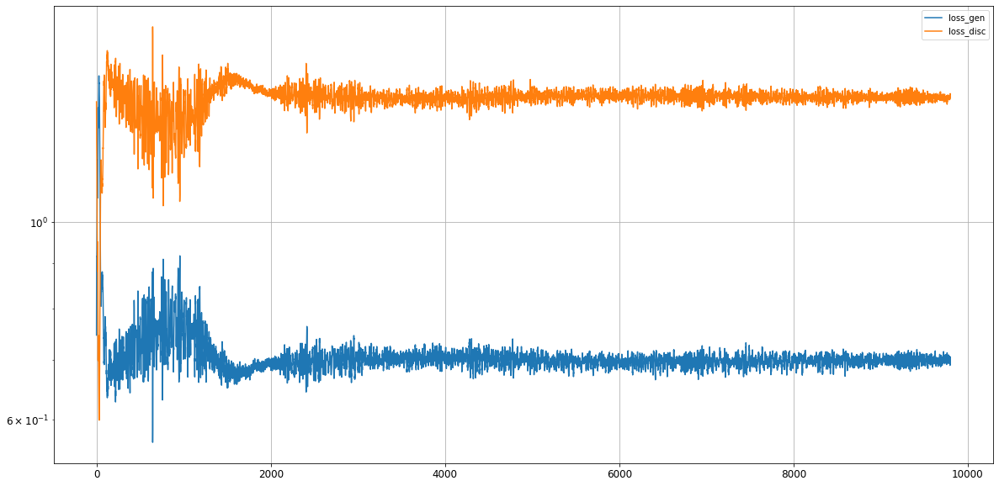

Epoch 9802/15000
0s
Epoch 9803/15000
0s
Epoch 9804/15000
0s
Epoch 9805/15000
0s
Epoch 9806/15000
0s
Epoch 9807/15000
0s
Epoch 9808/15000
0s
Epoch 9809/15000
0s
Epoch 9810/15000
0s
Epoch 9811/15000
0s
Epoch 9812/15000
0s
Epoch 9813/15000
0s
Epoch 9814/15000
0s
Epoch 9815/15000
0s
Epoch 9816/15000
0s
Epoch 9817/15000
0s
Epoch 9818/15000
0s
Epoch 9819/15000
0s
Epoch 9820/15000
0s
Epoch 9821/15000
0s
Epoch 9822/15000
0s
Epoch 9823/15000
0s
Epoch 9824/15000
0s
Epoch 9825/15000
0s
Epoch 9826/15000
0s
Epoch 9827/15000
0s
Epoch 9828/15000
0s
Epoch 9829/15000
0s
Epoch 9830/15000
0s
Epoch 9831/15000
0s
Epoch 9832/15000
0s
Epoch 9833/15000
0s
Epoch 9834/15000
0s
Epoch 9835/15000
0s
Epoch 9836/15000
0s
Epoch 9837/15000
0s
Epoch 9838/15000
0s
Epoch 9839/15000
0s
Epoch 9840/15000
0s
Epoch 9841/15000
0s
Epoch 9842/15000
0s
Epoch 9843/15000
0s
Epoch 9844/15000
0s
Epoch 9845/15000
0s
Epoch 9846/15000
0s
Epoch 9847/15000
0s
Epoch 9848/15000
0s
Epoch 9849/15000
0s
Epoch 9850/15000
0s
Epoch 9851/15000
0s


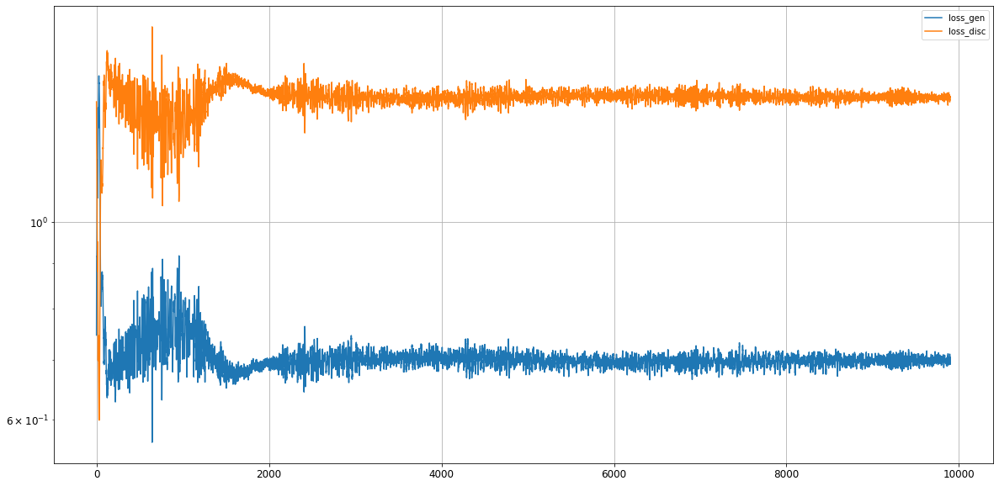

Epoch 9902/15000
0s
Epoch 9903/15000
0s
Epoch 9904/15000
0s
Epoch 9905/15000
0s
Epoch 9906/15000
0s
Epoch 9907/15000
0s
Epoch 9908/15000
0s
Epoch 9909/15000
0s
Epoch 9910/15000
0s
Epoch 9911/15000
0s
Epoch 9912/15000
0s
Epoch 9913/15000
0s
Epoch 9914/15000
0s
Epoch 9915/15000
0s
Epoch 9916/15000
0s
Epoch 9917/15000
0s
Epoch 9918/15000
0s
Epoch 9919/15000
0s
Epoch 9920/15000
0s
Epoch 9921/15000
0s
Epoch 9922/15000
0s
Epoch 9923/15000
0s
Epoch 9924/15000
0s
Epoch 9925/15000
0s
Epoch 9926/15000
0s
Epoch 9927/15000
0s
Epoch 9928/15000
0s
Epoch 9929/15000
0s
Epoch 9930/15000
0s
Epoch 9931/15000
0s
Epoch 9932/15000
0s
Epoch 9933/15000
0s
Epoch 9934/15000
0s
Epoch 9935/15000
0s
Epoch 9936/15000
0s
Epoch 9937/15000
0s
Epoch 9938/15000
0s
Epoch 9939/15000
0s
Epoch 9940/15000
0s
Epoch 9941/15000
0s
Epoch 9942/15000
0s
Epoch 9943/15000
0s
Epoch 9944/15000
0s
Epoch 9945/15000
0s
Epoch 9946/15000
0s
Epoch 9947/15000
0s
Epoch 9948/15000
0s
Epoch 9949/15000
0s
Epoch 9950/15000
0s
Epoch 9951/15000
0s


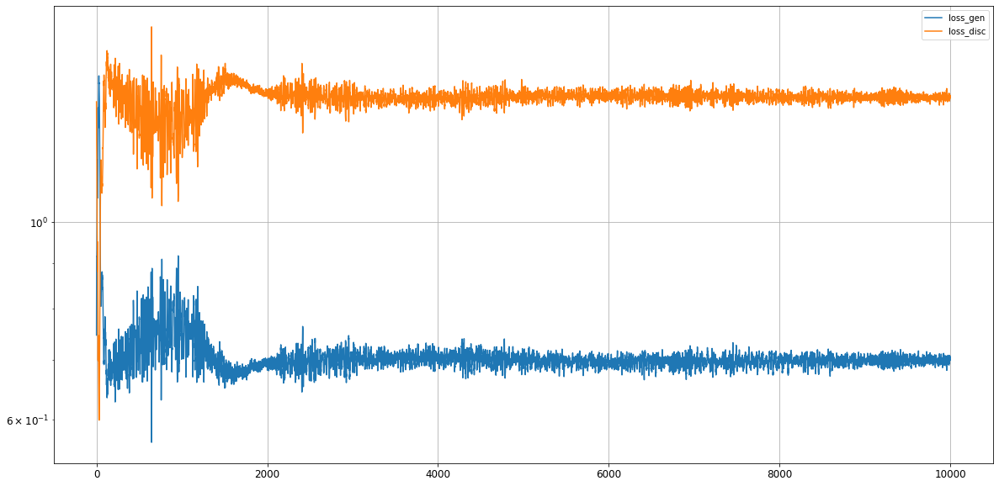

Epoch 10002/15000
0s
Epoch 10003/15000
0s
Epoch 10004/15000
0s
Epoch 10005/15000
0s
Epoch 10006/15000
0s
Epoch 10007/15000
0s
Epoch 10008/15000
0s
Epoch 10009/15000
0s
Epoch 10010/15000
0s
Epoch 10011/15000
0s
Epoch 10012/15000
0s
Epoch 10013/15000
0s
Epoch 10014/15000
0s
Epoch 10015/15000
0s
Epoch 10016/15000
0s
Epoch 10017/15000
0s
Epoch 10018/15000
0s
Epoch 10019/15000
0s
Epoch 10020/15000
0s
Epoch 10021/15000
0s
Epoch 10022/15000
0s
Epoch 10023/15000
0s
Epoch 10024/15000
0s
Epoch 10025/15000
0s
Epoch 10026/15000
0s
Epoch 10027/15000
0s
Epoch 10028/15000
0s
Epoch 10029/15000
0s
Epoch 10030/15000
0s
Epoch 10031/15000
0s
Epoch 10032/15000
0s
Epoch 10033/15000
0s
Epoch 10034/15000
0s
Epoch 10035/15000
0s
Epoch 10036/15000
0s
Epoch 10037/15000
0s
Epoch 10038/15000
0s
Epoch 10039/15000
0s
Epoch 10040/15000
0s
Epoch 10041/15000
0s
Epoch 10042/15000
0s
Epoch 10043/15000
0s
Epoch 10044/15000
0s
Epoch 10045/15000
0s
Epoch 10046/15000
0s
Epoch 10047/15000
0s
Epoch 10048/15000
0s
Epoch 10049/1

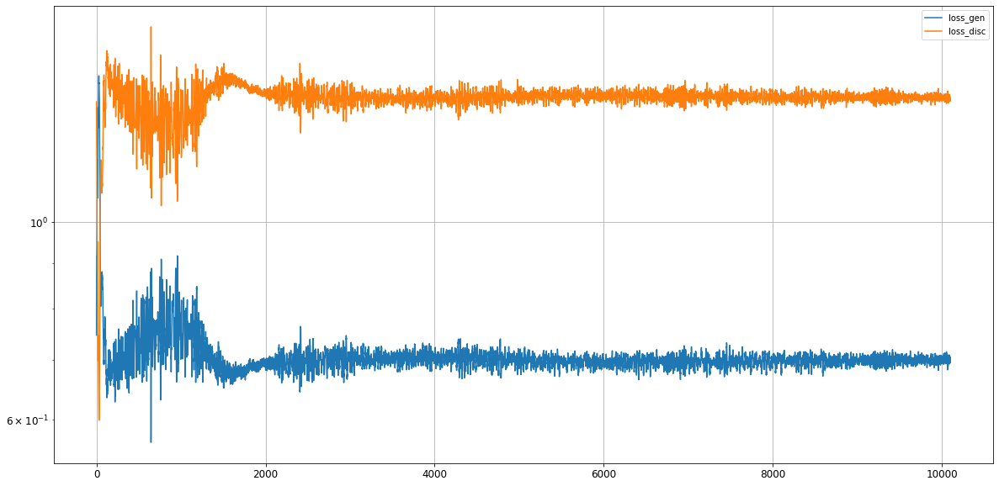

Epoch 10102/15000
0s
Epoch 10103/15000
0s
Epoch 10104/15000
0s
Epoch 10105/15000
0s
Epoch 10106/15000
0s
Epoch 10107/15000
0s
Epoch 10108/15000
0s
Epoch 10109/15000
0s
Epoch 10110/15000
0s
Epoch 10111/15000
0s
Epoch 10112/15000
0s
Epoch 10113/15000
0s
Epoch 10114/15000
0s
Epoch 10115/15000
0s
Epoch 10116/15000
0s
Epoch 10117/15000
0s
Epoch 10118/15000
0s
Epoch 10119/15000
0s
Epoch 10120/15000
0s
Epoch 10121/15000
0s
Epoch 10122/15000
0s
Epoch 10123/15000
0s
Epoch 10124/15000
0s
Epoch 10125/15000
0s
Epoch 10126/15000
0s
Epoch 10127/15000
0s
Epoch 10128/15000
0s
Epoch 10129/15000
0s
Epoch 10130/15000
0s
Epoch 10131/15000
0s
Epoch 10132/15000
0s
Epoch 10133/15000
0s
Epoch 10134/15000
0s
Epoch 10135/15000
0s
Epoch 10136/15000
0s
Epoch 10137/15000
0s
Epoch 10138/15000
0s
Epoch 10139/15000
0s
Epoch 10140/15000
0s
Epoch 10141/15000
0s
Epoch 10142/15000
0s
Epoch 10143/15000
0s
Epoch 10144/15000
0s
Epoch 10145/15000
0s
Epoch 10146/15000
0s
Epoch 10147/15000
0s
Epoch 10148/15000
0s
Epoch 10149/1

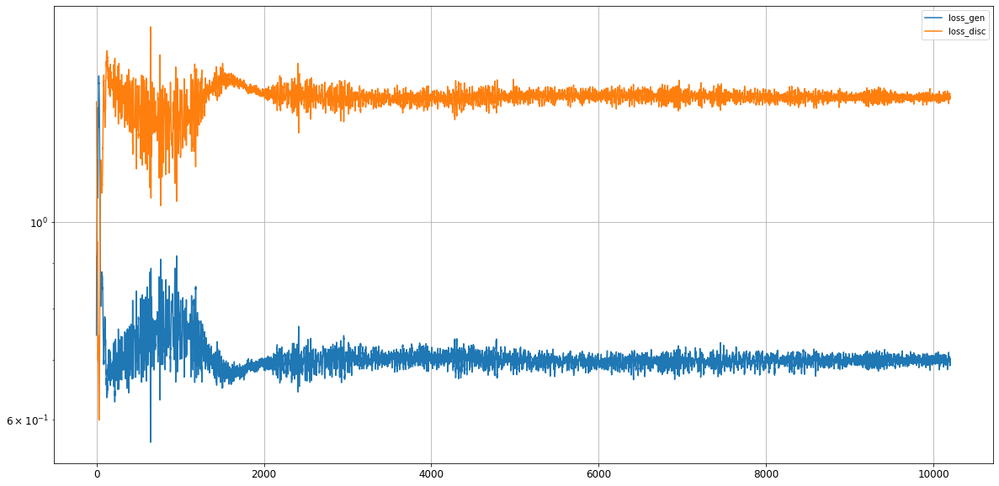

Epoch 10202/15000
0s
Epoch 10203/15000
0s
Epoch 10204/15000
0s
Epoch 10205/15000
0s
Epoch 10206/15000
0s
Epoch 10207/15000
0s
Epoch 10208/15000
0s
Epoch 10209/15000
0s
Epoch 10210/15000
0s
Epoch 10211/15000
0s
Epoch 10212/15000
0s
Epoch 10213/15000
0s
Epoch 10214/15000
0s
Epoch 10215/15000
0s
Epoch 10216/15000
0s
Epoch 10217/15000
0s
Epoch 10218/15000
0s
Epoch 10219/15000
0s
Epoch 10220/15000
0s
Epoch 10221/15000
0s
Epoch 10222/15000
0s
Epoch 10223/15000
0s
Epoch 10224/15000
0s
Epoch 10225/15000
0s
Epoch 10226/15000
0s
Epoch 10227/15000
0s
Epoch 10228/15000
0s
Epoch 10229/15000
0s
Epoch 10230/15000
0s
Epoch 10231/15000
0s
Epoch 10232/15000
0s
Epoch 10233/15000
0s
Epoch 10234/15000
0s
Epoch 10235/15000
0s
Epoch 10236/15000
0s
Epoch 10237/15000
0s
Epoch 10238/15000
0s
Epoch 10239/15000
0s
Epoch 10240/15000
0s
Epoch 10241/15000
0s
Epoch 10242/15000
0s
Epoch 10243/15000
0s
Epoch 10244/15000
0s
Epoch 10245/15000
0s
Epoch 10246/15000
0s
Epoch 10247/15000
0s
Epoch 10248/15000
0s
Epoch 10249/1

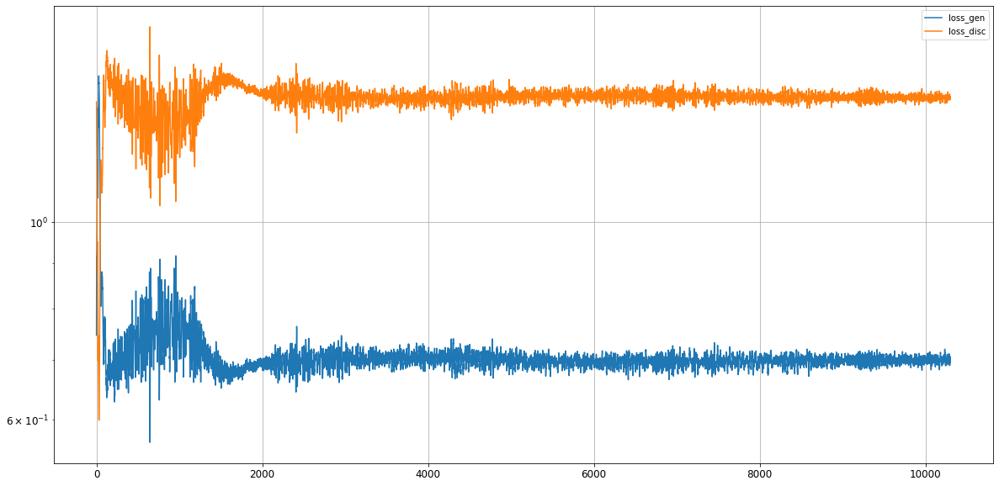

Epoch 10302/15000
0s
Epoch 10303/15000
0s
Epoch 10304/15000
0s
Epoch 10305/15000
0s
Epoch 10306/15000
0s
Epoch 10307/15000
0s
Epoch 10308/15000
0s
Epoch 10309/15000
0s
Epoch 10310/15000
0s
Epoch 10311/15000
0s
Epoch 10312/15000
0s
Epoch 10313/15000
0s
Epoch 10314/15000
0s
Epoch 10315/15000
0s
Epoch 10316/15000
0s
Epoch 10317/15000
0s
Epoch 10318/15000
0s
Epoch 10319/15000
0s
Epoch 10320/15000
0s
Epoch 10321/15000
0s
Epoch 10322/15000
0s
Epoch 10323/15000
0s
Epoch 10324/15000
0s
Epoch 10325/15000
0s
Epoch 10326/15000
0s
Epoch 10327/15000
0s
Epoch 10328/15000
0s
Epoch 10329/15000
0s
Epoch 10330/15000
0s
Epoch 10331/15000
0s
Epoch 10332/15000
0s
Epoch 10333/15000
0s
Epoch 10334/15000
0s
Epoch 10335/15000
0s
Epoch 10336/15000
0s
Epoch 10337/15000
0s
Epoch 10338/15000
0s
Epoch 10339/15000
0s
Epoch 10340/15000
0s
Epoch 10341/15000
0s
Epoch 10342/15000
0s
Epoch 10343/15000
0s
Epoch 10344/15000
0s
Epoch 10345/15000
0s
Epoch 10346/15000
0s
Epoch 10347/15000
0s
Epoch 10348/15000
0s
Epoch 10349/1

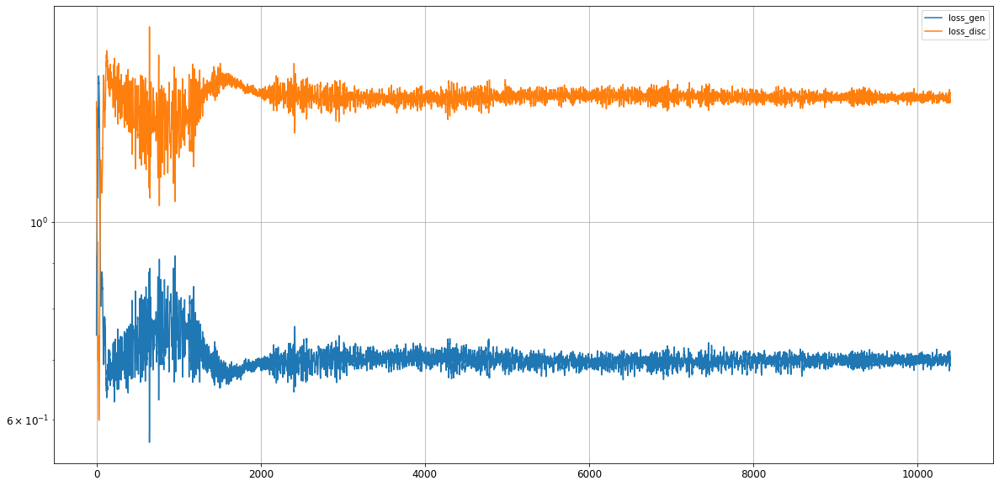

Epoch 10402/15000
0s
Epoch 10403/15000
0s
Epoch 10404/15000
0s
Epoch 10405/15000
0s
Epoch 10406/15000
0s
Epoch 10407/15000
0s
Epoch 10408/15000
0s
Epoch 10409/15000
0s
Epoch 10410/15000
0s
Epoch 10411/15000
0s
Epoch 10412/15000
0s
Epoch 10413/15000
0s
Epoch 10414/15000
0s
Epoch 10415/15000
0s
Epoch 10416/15000
0s
Epoch 10417/15000
0s
Epoch 10418/15000
0s
Epoch 10419/15000
0s
Epoch 10420/15000
0s
Epoch 10421/15000
0s
Epoch 10422/15000
0s
Epoch 10423/15000
0s
Epoch 10424/15000
0s
Epoch 10425/15000
0s
Epoch 10426/15000
0s
Epoch 10427/15000
0s
Epoch 10428/15000
0s
Epoch 10429/15000
0s
Epoch 10430/15000
0s
Epoch 10431/15000
0s
Epoch 10432/15000
0s
Epoch 10433/15000
0s
Epoch 10434/15000
0s
Epoch 10435/15000
0s
Epoch 10436/15000
0s
Epoch 10437/15000
0s
Epoch 10438/15000
0s
Epoch 10439/15000
0s
Epoch 10440/15000
0s
Epoch 10441/15000
0s
Epoch 10442/15000
0s
Epoch 10443/15000
0s
Epoch 10444/15000
0s
Epoch 10445/15000
0s
Epoch 10446/15000
0s
Epoch 10447/15000
0s
Epoch 10448/15000
0s
Epoch 10449/1

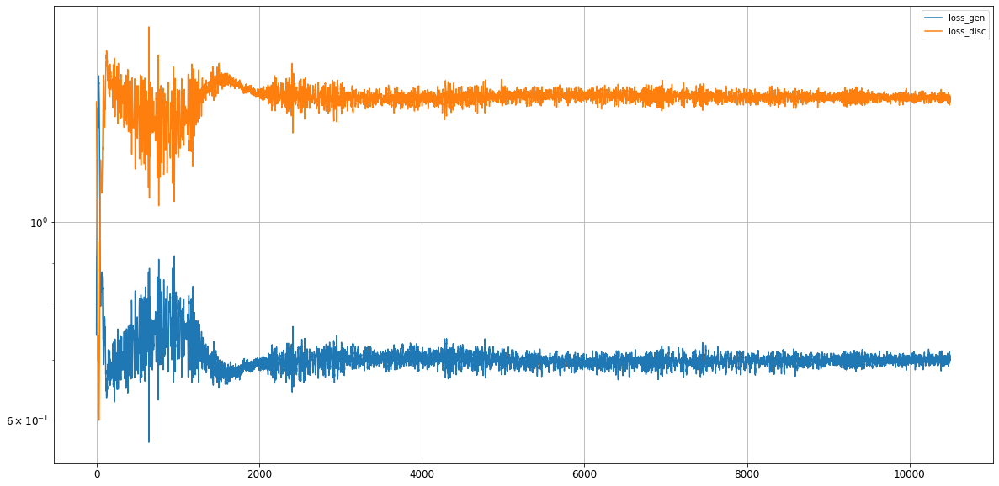

Epoch 10502/15000
0s
Epoch 10503/15000
0s
Epoch 10504/15000
0s
Epoch 10505/15000
0s
Epoch 10506/15000
0s
Epoch 10507/15000
0s
Epoch 10508/15000
0s
Epoch 10509/15000
0s
Epoch 10510/15000
0s
Epoch 10511/15000
0s
Epoch 10512/15000
0s
Epoch 10513/15000
0s
Epoch 10514/15000
0s
Epoch 10515/15000
0s
Epoch 10516/15000
0s
Epoch 10517/15000
0s
Epoch 10518/15000
0s
Epoch 10519/15000
0s
Epoch 10520/15000
0s
Epoch 10521/15000
0s
Epoch 10522/15000
0s
Epoch 10523/15000
0s
Epoch 10524/15000
0s
Epoch 10525/15000
0s
Epoch 10526/15000
0s
Epoch 10527/15000
0s
Epoch 10528/15000
0s
Epoch 10529/15000
0s
Epoch 10530/15000
0s
Epoch 10531/15000
0s
Epoch 10532/15000
0s
Epoch 10533/15000
0s
Epoch 10534/15000
0s
Epoch 10535/15000
0s
Epoch 10536/15000
0s
Epoch 10537/15000
0s
Epoch 10538/15000
0s
Epoch 10539/15000
0s
Epoch 10540/15000
0s
Epoch 10541/15000
0s
Epoch 10542/15000
0s
Epoch 10543/15000
0s
Epoch 10544/15000
0s
Epoch 10545/15000
0s
Epoch 10546/15000
0s
Epoch 10547/15000
0s
Epoch 10548/15000
0s
Epoch 10549/1

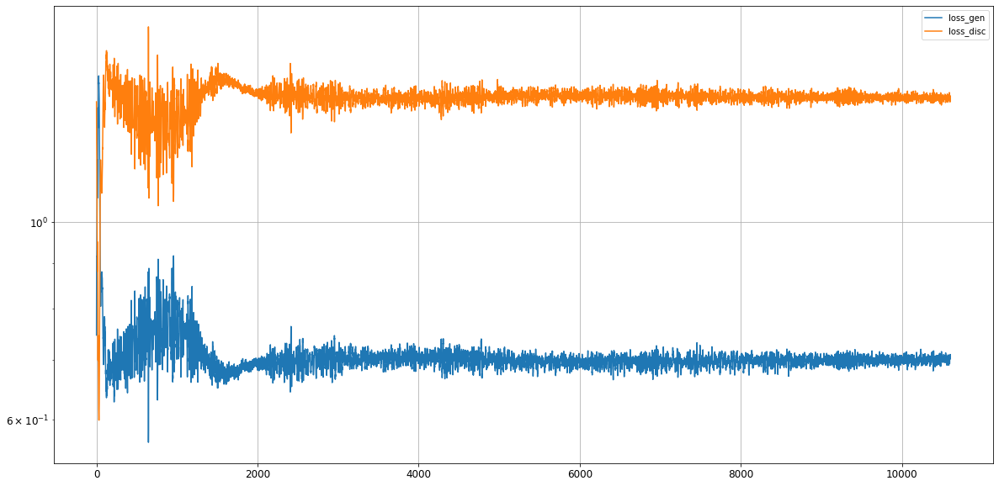

Epoch 10602/15000
0s
Epoch 10603/15000
0s
Epoch 10604/15000
0s
Epoch 10605/15000
0s
Epoch 10606/15000
0s
Epoch 10607/15000
0s
Epoch 10608/15000
0s
Epoch 10609/15000
0s
Epoch 10610/15000
0s
Epoch 10611/15000
0s
Epoch 10612/15000
0s
Epoch 10613/15000
0s
Epoch 10614/15000
0s
Epoch 10615/15000
0s
Epoch 10616/15000
0s
Epoch 10617/15000
0s
Epoch 10618/15000
0s
Epoch 10619/15000
0s
Epoch 10620/15000
0s
Epoch 10621/15000
0s
Epoch 10622/15000
0s
Epoch 10623/15000
0s
Epoch 10624/15000
0s
Epoch 10625/15000
0s
Epoch 10626/15000
0s
Epoch 10627/15000
0s
Epoch 10628/15000
0s
Epoch 10629/15000
0s
Epoch 10630/15000
0s
Epoch 10631/15000
0s
Epoch 10632/15000
0s
Epoch 10633/15000
0s
Epoch 10634/15000
0s
Epoch 10635/15000
0s
Epoch 10636/15000
0s
Epoch 10637/15000
0s
Epoch 10638/15000
0s
Epoch 10639/15000
0s
Epoch 10640/15000
0s
Epoch 10641/15000
0s
Epoch 10642/15000
0s
Epoch 10643/15000
0s
Epoch 10644/15000
0s
Epoch 10645/15000
0s
Epoch 10646/15000
0s
Epoch 10647/15000
0s
Epoch 10648/15000
0s
Epoch 10649/1

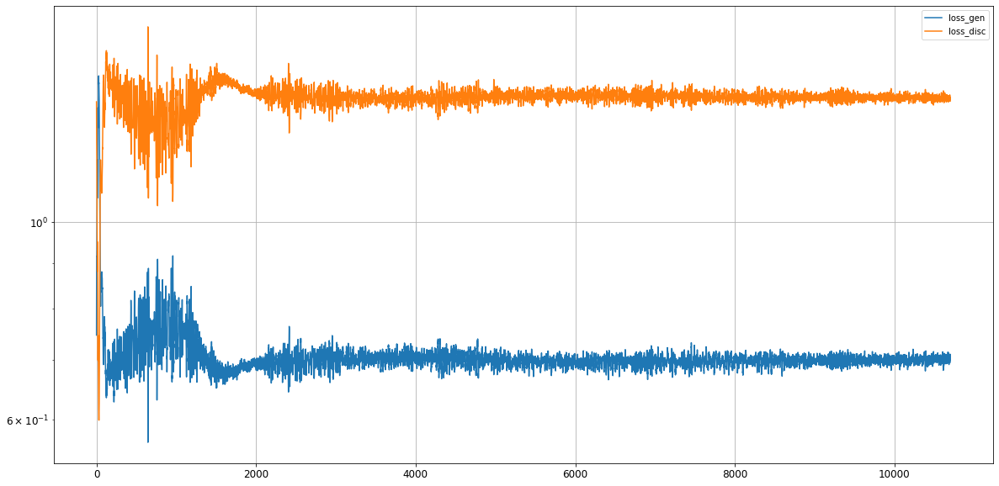

Epoch 10702/15000
0s
Epoch 10703/15000
0s
Epoch 10704/15000
0s
Epoch 10705/15000
0s
Epoch 10706/15000
0s
Epoch 10707/15000
0s
Epoch 10708/15000
0s
Epoch 10709/15000
0s
Epoch 10710/15000
0s
Epoch 10711/15000
0s
Epoch 10712/15000
0s
Epoch 10713/15000
0s
Epoch 10714/15000
0s
Epoch 10715/15000
0s
Epoch 10716/15000
0s
Epoch 10717/15000
0s
Epoch 10718/15000
0s
Epoch 10719/15000
0s
Epoch 10720/15000
0s
Epoch 10721/15000
0s
Epoch 10722/15000
0s
Epoch 10723/15000
0s
Epoch 10724/15000
0s
Epoch 10725/15000
0s
Epoch 10726/15000
0s
Epoch 10727/15000
0s
Epoch 10728/15000
0s
Epoch 10729/15000
0s
Epoch 10730/15000
0s
Epoch 10731/15000
0s
Epoch 10732/15000
0s
Epoch 10733/15000
0s
Epoch 10734/15000
0s
Epoch 10735/15000
0s
Epoch 10736/15000
0s
Epoch 10737/15000
0s
Epoch 10738/15000
0s
Epoch 10739/15000
0s
Epoch 10740/15000
0s
Epoch 10741/15000
0s
Epoch 10742/15000
0s
Epoch 10743/15000
0s
Epoch 10744/15000
0s
Epoch 10745/15000
0s
Epoch 10746/15000
0s
Epoch 10747/15000
0s
Epoch 10748/15000
0s
Epoch 10749/1

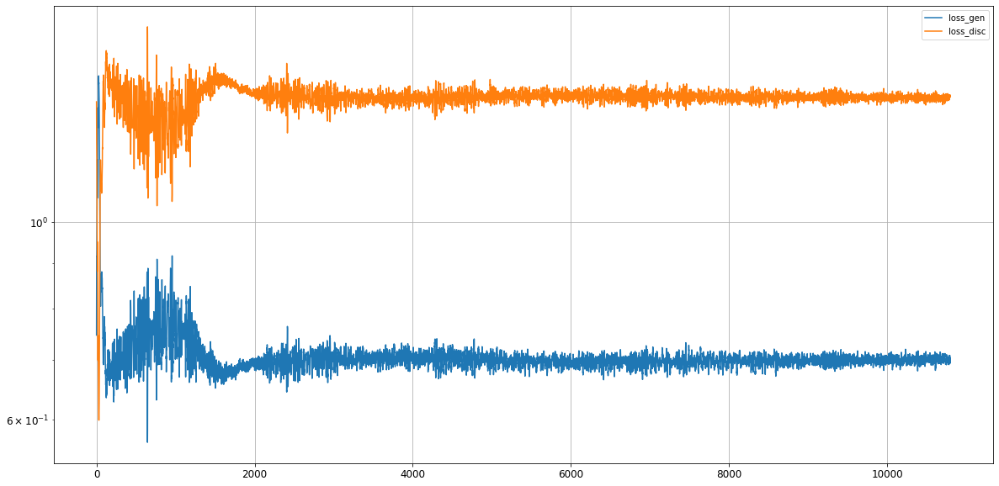

Epoch 10802/15000
0s
Epoch 10803/15000
0s
Epoch 10804/15000
0s
Epoch 10805/15000
0s
Epoch 10806/15000
0s
Epoch 10807/15000
0s
Epoch 10808/15000
0s
Epoch 10809/15000
0s
Epoch 10810/15000
0s
Epoch 10811/15000
0s
Epoch 10812/15000
0s
Epoch 10813/15000
0s
Epoch 10814/15000
0s
Epoch 10815/15000
0s
Epoch 10816/15000
0s
Epoch 10817/15000
0s
Epoch 10818/15000
0s
Epoch 10819/15000
0s
Epoch 10820/15000
0s
Epoch 10821/15000
0s
Epoch 10822/15000
0s
Epoch 10823/15000
0s
Epoch 10824/15000
0s
Epoch 10825/15000
0s
Epoch 10826/15000
0s
Epoch 10827/15000
0s
Epoch 10828/15000
0s
Epoch 10829/15000
0s
Epoch 10830/15000
0s
Epoch 10831/15000
0s
Epoch 10832/15000
0s
Epoch 10833/15000
0s
Epoch 10834/15000
0s
Epoch 10835/15000
0s
Epoch 10836/15000
0s
Epoch 10837/15000
0s
Epoch 10838/15000
0s
Epoch 10839/15000
0s
Epoch 10840/15000
0s
Epoch 10841/15000
0s
Epoch 10842/15000
0s
Epoch 10843/15000
0s
Epoch 10844/15000
0s
Epoch 10845/15000
0s
Epoch 10846/15000
0s
Epoch 10847/15000
0s
Epoch 10848/15000
0s
Epoch 10849/1

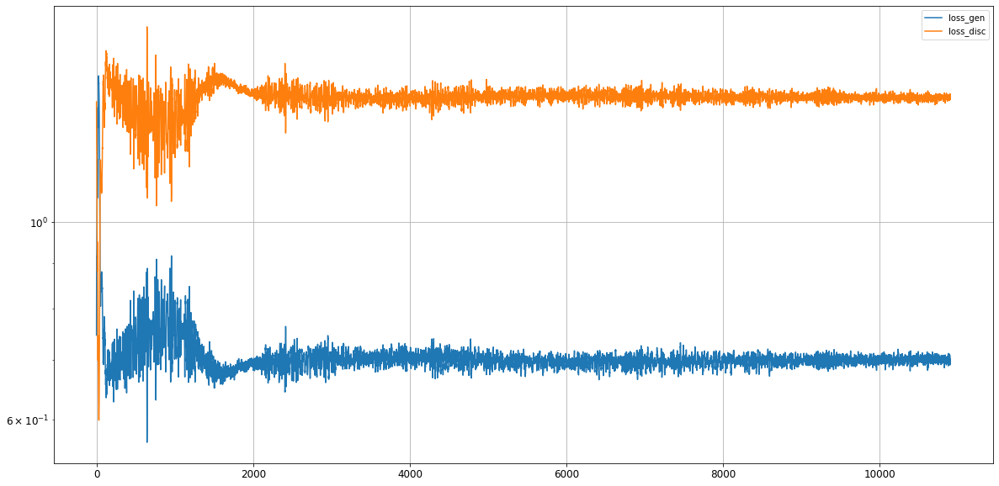

Epoch 10902/15000
0s
Epoch 10903/15000
0s
Epoch 10904/15000
0s
Epoch 10905/15000
0s
Epoch 10906/15000
0s
Epoch 10907/15000
0s
Epoch 10908/15000
0s
Epoch 10909/15000
0s
Epoch 10910/15000
0s
Epoch 10911/15000
0s
Epoch 10912/15000
0s
Epoch 10913/15000
0s
Epoch 10914/15000
0s
Epoch 10915/15000
0s
Epoch 10916/15000
0s
Epoch 10917/15000
0s
Epoch 10918/15000
0s
Epoch 10919/15000
0s
Epoch 10920/15000
0s
Epoch 10921/15000
0s
Epoch 10922/15000
0s
Epoch 10923/15000
0s
Epoch 10924/15000
0s
Epoch 10925/15000
0s
Epoch 10926/15000
0s
Epoch 10927/15000
0s
Epoch 10928/15000
0s
Epoch 10929/15000
0s
Epoch 10930/15000
0s
Epoch 10931/15000
0s
Epoch 10932/15000
0s
Epoch 10933/15000
0s
Epoch 10934/15000
0s
Epoch 10935/15000
0s
Epoch 10936/15000
0s
Epoch 10937/15000
0s
Epoch 10938/15000
0s
Epoch 10939/15000
0s
Epoch 10940/15000
0s
Epoch 10941/15000
0s
Epoch 10942/15000
0s
Epoch 10943/15000
0s
Epoch 10944/15000
0s
Epoch 10945/15000
0s
Epoch 10946/15000
0s
Epoch 10947/15000
0s
Epoch 10948/15000
0s
Epoch 10949/1

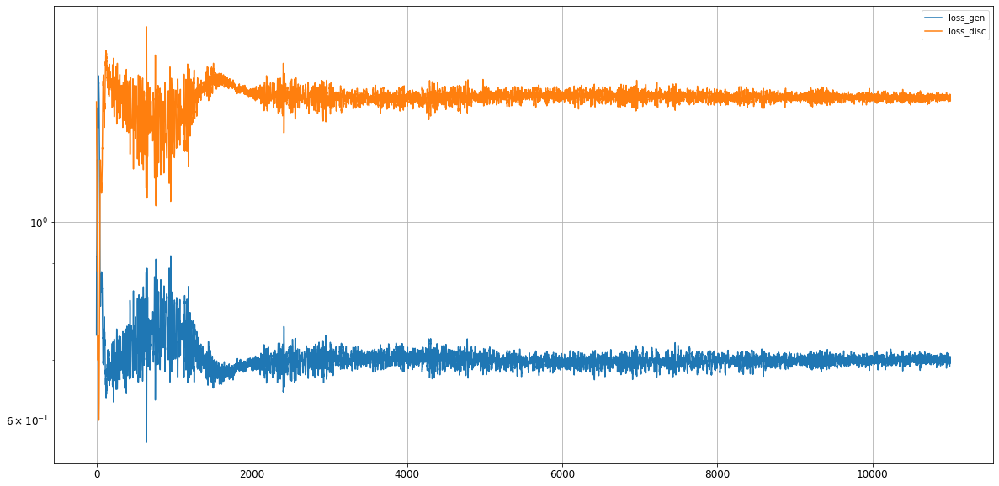

Epoch 11002/15000
0s
Epoch 11003/15000
0s
Epoch 11004/15000
0s
Epoch 11005/15000
0s
Epoch 11006/15000
0s
Epoch 11007/15000
0s
Epoch 11008/15000
0s
Epoch 11009/15000
0s
Epoch 11010/15000
0s
Epoch 11011/15000
0s
Epoch 11012/15000
0s
Epoch 11013/15000
0s
Epoch 11014/15000
0s
Epoch 11015/15000
0s
Epoch 11016/15000
0s
Epoch 11017/15000
0s
Epoch 11018/15000
0s
Epoch 11019/15000
0s
Epoch 11020/15000
0s
Epoch 11021/15000
0s
Epoch 11022/15000
0s
Epoch 11023/15000
0s
Epoch 11024/15000
0s
Epoch 11025/15000
0s
Epoch 11026/15000
0s
Epoch 11027/15000
0s
Epoch 11028/15000
0s
Epoch 11029/15000
0s
Epoch 11030/15000
0s
Epoch 11031/15000
0s
Epoch 11032/15000
0s
Epoch 11033/15000
0s
Epoch 11034/15000
0s
Epoch 11035/15000
0s
Epoch 11036/15000
0s
Epoch 11037/15000
0s
Epoch 11038/15000
0s
Epoch 11039/15000
0s
Epoch 11040/15000
0s
Epoch 11041/15000
0s
Epoch 11042/15000
0s
Epoch 11043/15000
0s
Epoch 11044/15000
0s
Epoch 11045/15000
0s
Epoch 11046/15000
0s
Epoch 11047/15000
0s
Epoch 11048/15000
0s
Epoch 11049/1

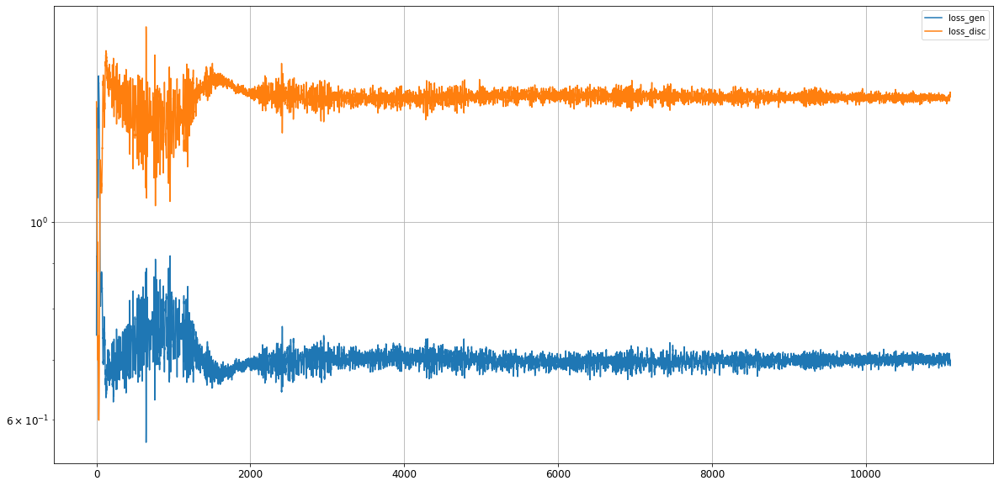

Epoch 11102/15000
0s
Epoch 11103/15000
0s
Epoch 11104/15000
0s
Epoch 11105/15000
0s
Epoch 11106/15000
0s
Epoch 11107/15000
0s
Epoch 11108/15000
0s
Epoch 11109/15000
0s
Epoch 11110/15000
0s
Epoch 11111/15000
0s
Epoch 11112/15000
0s
Epoch 11113/15000
0s
Epoch 11114/15000
0s
Epoch 11115/15000
0s
Epoch 11116/15000
0s
Epoch 11117/15000
0s
Epoch 11118/15000
0s
Epoch 11119/15000
0s
Epoch 11120/15000
0s
Epoch 11121/15000
0s
Epoch 11122/15000
0s
Epoch 11123/15000
0s
Epoch 11124/15000
0s
Epoch 11125/15000
0s
Epoch 11126/15000
0s
Epoch 11127/15000
0s
Epoch 11128/15000
0s
Epoch 11129/15000
0s
Epoch 11130/15000
0s
Epoch 11131/15000
0s
Epoch 11132/15000
0s
Epoch 11133/15000
0s
Epoch 11134/15000
0s
Epoch 11135/15000
0s
Epoch 11136/15000
0s
Epoch 11137/15000
0s
Epoch 11138/15000
0s
Epoch 11139/15000
0s
Epoch 11140/15000
0s
Epoch 11141/15000
0s
Epoch 11142/15000
0s
Epoch 11143/15000
0s
Epoch 11144/15000
0s
Epoch 11145/15000
0s
Epoch 11146/15000
0s
Epoch 11147/15000
0s
Epoch 11148/15000
0s
Epoch 11149/1

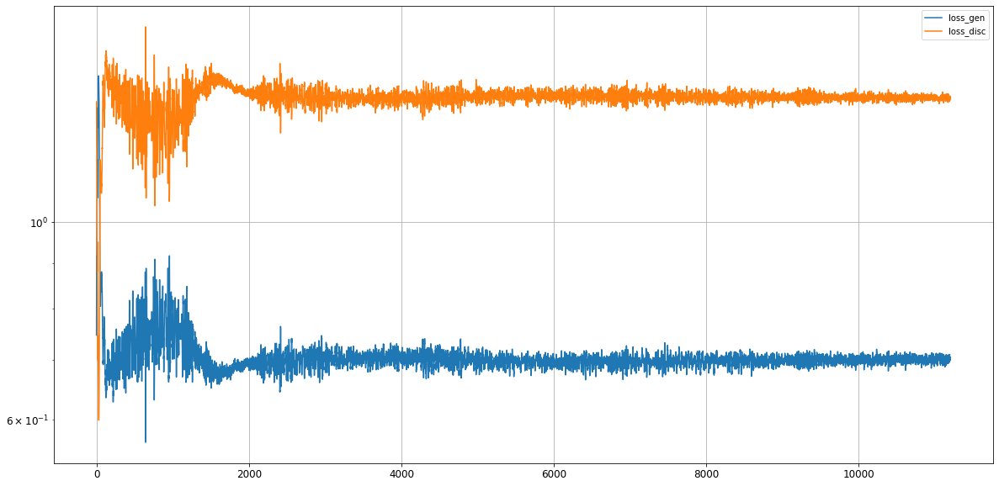

Epoch 11202/15000
0s
Epoch 11203/15000
0s
Epoch 11204/15000
0s
Epoch 11205/15000
0s
Epoch 11206/15000
0s
Epoch 11207/15000
0s
Epoch 11208/15000
0s
Epoch 11209/15000
0s
Epoch 11210/15000
0s
Epoch 11211/15000
0s
Epoch 11212/15000
0s
Epoch 11213/15000
0s
Epoch 11214/15000
0s
Epoch 11215/15000
0s
Epoch 11216/15000
0s
Epoch 11217/15000
0s
Epoch 11218/15000
0s
Epoch 11219/15000
0s
Epoch 11220/15000
0s
Epoch 11221/15000
0s
Epoch 11222/15000
0s
Epoch 11223/15000
0s
Epoch 11224/15000
0s
Epoch 11225/15000
0s
Epoch 11226/15000
0s
Epoch 11227/15000
0s
Epoch 11228/15000
0s
Epoch 11229/15000
0s
Epoch 11230/15000
0s
Epoch 11231/15000
0s
Epoch 11232/15000
0s
Epoch 11233/15000
0s
Epoch 11234/15000
0s
Epoch 11235/15000
0s
Epoch 11236/15000
0s
Epoch 11237/15000
0s
Epoch 11238/15000
0s
Epoch 11239/15000
0s
Epoch 11240/15000
0s
Epoch 11241/15000
0s
Epoch 11242/15000
0s
Epoch 11243/15000
0s
Epoch 11244/15000
0s
Epoch 11245/15000
0s
Epoch 11246/15000
0s
Epoch 11247/15000
0s
Epoch 11248/15000
0s
Epoch 11249/1

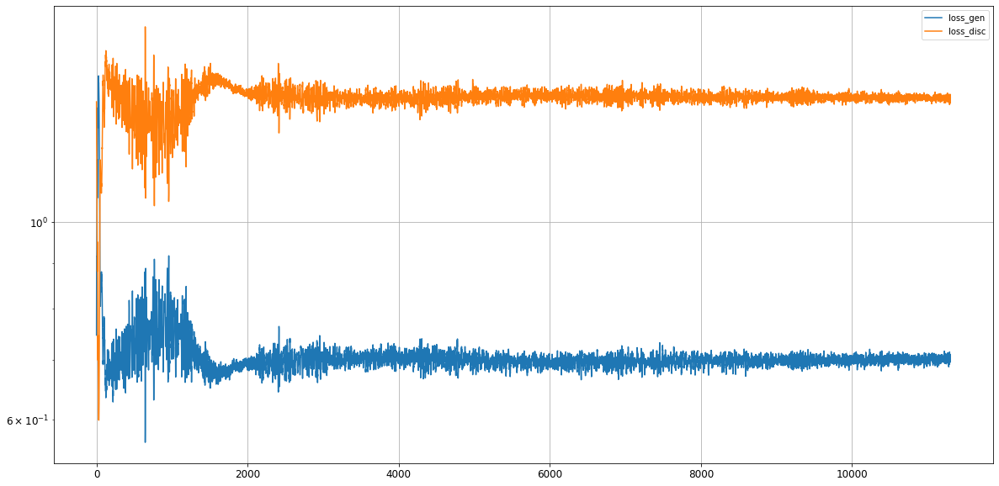

Epoch 11302/15000
0s
Epoch 11303/15000
0s
Epoch 11304/15000
0s
Epoch 11305/15000
0s
Epoch 11306/15000
0s
Epoch 11307/15000
0s
Epoch 11308/15000
0s
Epoch 11309/15000
0s
Epoch 11310/15000
0s
Epoch 11311/15000
0s
Epoch 11312/15000
0s
Epoch 11313/15000
0s
Epoch 11314/15000
0s
Epoch 11315/15000
0s
Epoch 11316/15000
0s
Epoch 11317/15000
0s
Epoch 11318/15000
0s
Epoch 11319/15000
0s
Epoch 11320/15000
0s
Epoch 11321/15000
0s
Epoch 11322/15000
0s
Epoch 11323/15000
0s
Epoch 11324/15000
0s
Epoch 11325/15000
0s
Epoch 11326/15000
0s
Epoch 11327/15000
0s
Epoch 11328/15000
0s
Epoch 11329/15000
0s
Epoch 11330/15000
0s
Epoch 11331/15000
0s
Epoch 11332/15000
0s
Epoch 11333/15000
0s
Epoch 11334/15000
0s
Epoch 11335/15000
0s
Epoch 11336/15000
0s
Epoch 11337/15000
0s
Epoch 11338/15000
0s
Epoch 11339/15000
0s
Epoch 11340/15000
0s
Epoch 11341/15000
0s
Epoch 11342/15000
0s
Epoch 11343/15000
0s
Epoch 11344/15000
0s
Epoch 11345/15000
0s
Epoch 11346/15000
0s
Epoch 11347/15000
0s
Epoch 11348/15000
0s
Epoch 11349/1

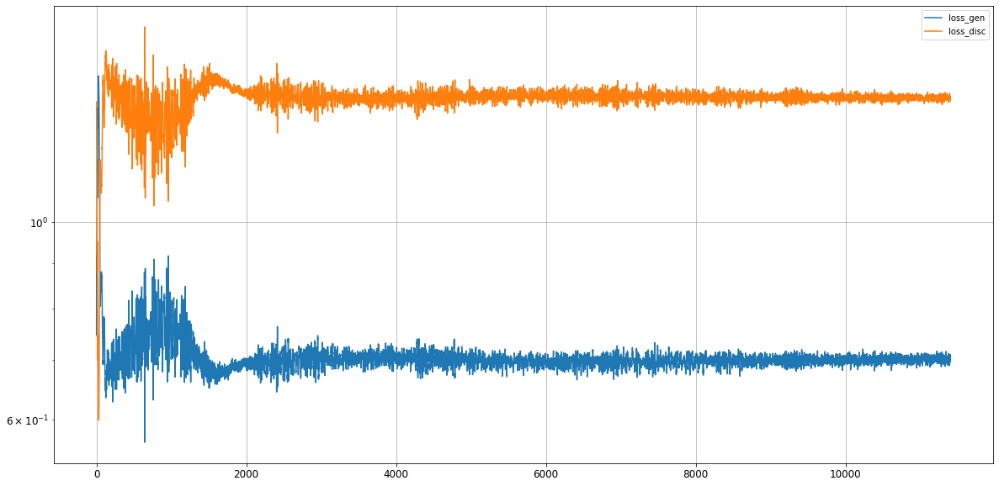

Epoch 11402/15000
0s
Epoch 11403/15000
0s
Epoch 11404/15000
0s
Epoch 11405/15000
0s
Epoch 11406/15000
0s
Epoch 11407/15000
0s
Epoch 11408/15000
0s
Epoch 11409/15000
0s
Epoch 11410/15000
0s
Epoch 11411/15000
0s
Epoch 11412/15000
0s
Epoch 11413/15000
0s
Epoch 11414/15000
0s
Epoch 11415/15000
0s
Epoch 11416/15000
0s
Epoch 11417/15000
0s
Epoch 11418/15000
0s
Epoch 11419/15000
0s
Epoch 11420/15000
0s
Epoch 11421/15000
0s
Epoch 11422/15000
0s
Epoch 11423/15000
0s
Epoch 11424/15000
0s
Epoch 11425/15000
0s
Epoch 11426/15000
0s
Epoch 11427/15000
0s
Epoch 11428/15000
0s
Epoch 11429/15000
0s
Epoch 11430/15000
0s
Epoch 11431/15000
0s
Epoch 11432/15000
0s
Epoch 11433/15000
0s
Epoch 11434/15000
0s
Epoch 11435/15000
0s
Epoch 11436/15000
0s
Epoch 11437/15000
0s
Epoch 11438/15000
0s
Epoch 11439/15000
0s
Epoch 11440/15000
0s
Epoch 11441/15000
0s
Epoch 11442/15000
0s
Epoch 11443/15000
0s
Epoch 11444/15000
0s
Epoch 11445/15000
0s
Epoch 11446/15000
0s
Epoch 11447/15000
0s
Epoch 11448/15000
0s
Epoch 11449/1

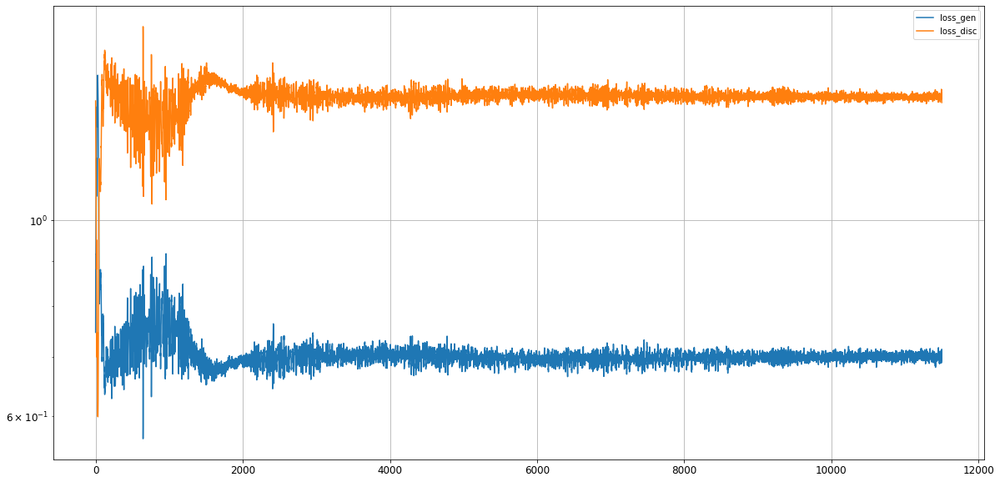

Epoch 11502/15000
0s
Epoch 11503/15000
0s
Epoch 11504/15000
0s
Epoch 11505/15000
0s
Epoch 11506/15000
0s
Epoch 11507/15000
0s
Epoch 11508/15000
0s
Epoch 11509/15000
0s
Epoch 11510/15000
0s
Epoch 11511/15000
0s
Epoch 11512/15000
0s
Epoch 11513/15000
0s
Epoch 11514/15000
0s
Epoch 11515/15000
0s
Epoch 11516/15000
0s
Epoch 11517/15000
0s
Epoch 11518/15000
0s
Epoch 11519/15000
0s
Epoch 11520/15000
0s
Epoch 11521/15000
0s
Epoch 11522/15000
0s
Epoch 11523/15000
0s
Epoch 11524/15000
0s
Epoch 11525/15000
0s
Epoch 11526/15000
0s
Epoch 11527/15000
0s
Epoch 11528/15000
0s
Epoch 11529/15000
0s
Epoch 11530/15000
0s
Epoch 11531/15000
0s
Epoch 11532/15000
0s
Epoch 11533/15000
0s
Epoch 11534/15000
0s
Epoch 11535/15000
0s
Epoch 11536/15000
0s
Epoch 11537/15000
0s
Epoch 11538/15000
0s
Epoch 11539/15000
0s
Epoch 11540/15000
0s
Epoch 11541/15000
0s
Epoch 11542/15000
0s
Epoch 11543/15000
0s
Epoch 11544/15000
0s
Epoch 11545/15000
0s
Epoch 11546/15000
0s
Epoch 11547/15000
0s
Epoch 11548/15000
0s
Epoch 11549/1

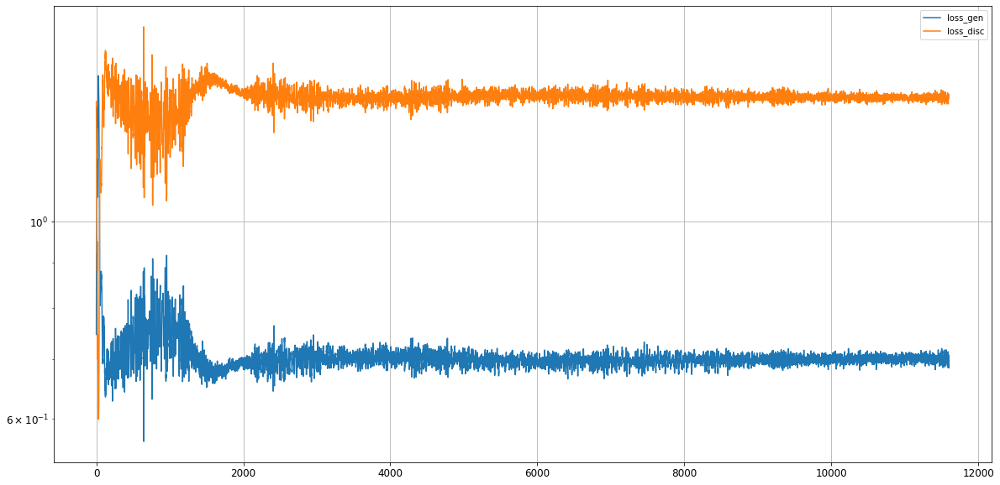

Epoch 11602/15000
0s
Epoch 11603/15000
0s
Epoch 11604/15000
0s
Epoch 11605/15000
0s
Epoch 11606/15000
0s
Epoch 11607/15000
0s
Epoch 11608/15000
0s
Epoch 11609/15000
0s
Epoch 11610/15000
0s
Epoch 11611/15000
0s
Epoch 11612/15000
0s
Epoch 11613/15000
0s
Epoch 11614/15000
0s
Epoch 11615/15000
0s
Epoch 11616/15000
0s
Epoch 11617/15000
0s
Epoch 11618/15000
0s
Epoch 11619/15000
0s
Epoch 11620/15000
0s
Epoch 11621/15000
0s
Epoch 11622/15000
0s
Epoch 11623/15000
0s
Epoch 11624/15000
0s
Epoch 11625/15000
0s
Epoch 11626/15000
0s
Epoch 11627/15000
0s
Epoch 11628/15000
0s
Epoch 11629/15000
0s
Epoch 11630/15000
0s
Epoch 11631/15000
0s
Epoch 11632/15000
0s
Epoch 11633/15000
0s
Epoch 11634/15000
0s
Epoch 11635/15000
0s
Epoch 11636/15000
0s
Epoch 11637/15000
0s
Epoch 11638/15000
0s
Epoch 11639/15000
0s
Epoch 11640/15000
0s
Epoch 11641/15000
0s
Epoch 11642/15000
0s
Epoch 11643/15000
0s
Epoch 11644/15000
0s
Epoch 11645/15000
0s
Epoch 11646/15000
0s
Epoch 11647/15000
0s
Epoch 11648/15000
0s
Epoch 11649/1

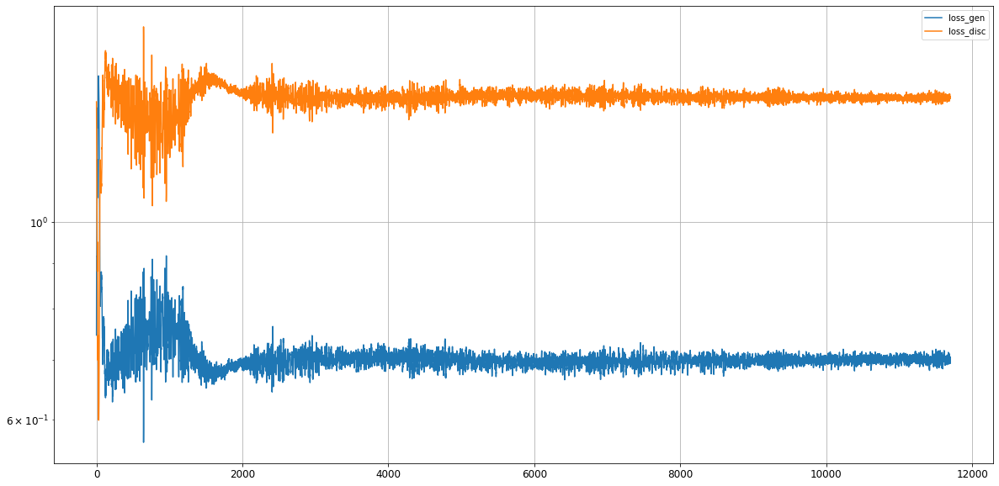

Epoch 11702/15000
0s
Epoch 11703/15000
0s
Epoch 11704/15000
0s
Epoch 11705/15000
0s
Epoch 11706/15000
0s
Epoch 11707/15000
0s
Epoch 11708/15000
0s
Epoch 11709/15000
0s
Epoch 11710/15000
0s
Epoch 11711/15000
0s
Epoch 11712/15000
0s
Epoch 11713/15000
0s
Epoch 11714/15000
0s
Epoch 11715/15000
0s
Epoch 11716/15000
0s
Epoch 11717/15000
0s
Epoch 11718/15000
0s
Epoch 11719/15000
0s
Epoch 11720/15000
0s
Epoch 11721/15000
0s
Epoch 11722/15000
0s
Epoch 11723/15000
0s
Epoch 11724/15000
0s
Epoch 11725/15000
0s
Epoch 11726/15000
0s
Epoch 11727/15000
0s
Epoch 11728/15000
0s
Epoch 11729/15000
0s
Epoch 11730/15000
0s
Epoch 11731/15000
0s
Epoch 11732/15000
0s
Epoch 11733/15000
0s
Epoch 11734/15000
0s
Epoch 11735/15000
0s
Epoch 11736/15000
0s
Epoch 11737/15000
0s
Epoch 11738/15000
0s
Epoch 11739/15000
0s
Epoch 11740/15000
0s
Epoch 11741/15000
0s
Epoch 11742/15000
0s
Epoch 11743/15000
0s
Epoch 11744/15000
0s
Epoch 11745/15000
0s
Epoch 11746/15000
0s
Epoch 11747/15000
0s
Epoch 11748/15000
0s
Epoch 11749/1

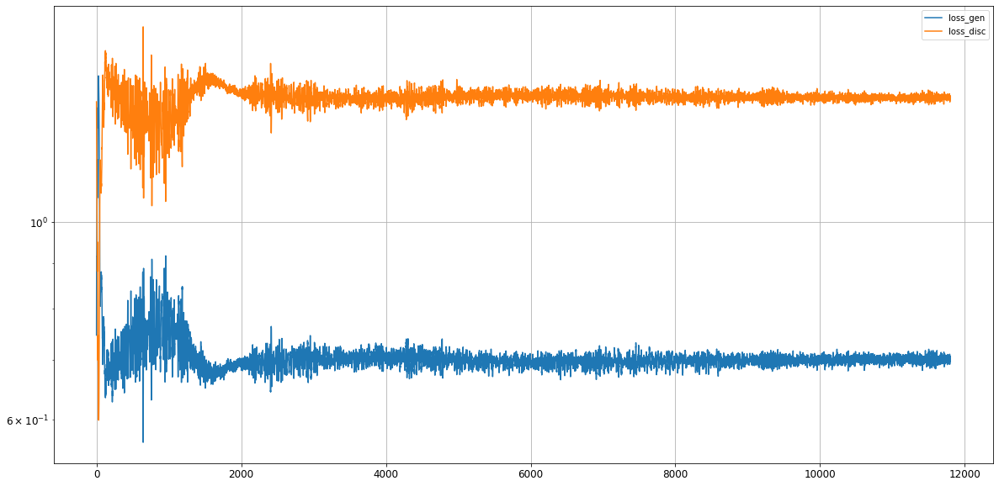

Epoch 11802/15000
0s
Epoch 11803/15000
0s
Epoch 11804/15000
0s
Epoch 11805/15000
0s
Epoch 11806/15000
0s
Epoch 11807/15000
0s
Epoch 11808/15000
0s
Epoch 11809/15000
0s
Epoch 11810/15000
0s
Epoch 11811/15000
0s
Epoch 11812/15000
0s
Epoch 11813/15000
0s
Epoch 11814/15000
0s
Epoch 11815/15000
0s
Epoch 11816/15000
0s
Epoch 11817/15000
0s
Epoch 11818/15000
0s
Epoch 11819/15000
0s
Epoch 11820/15000
0s
Epoch 11821/15000
0s
Epoch 11822/15000
0s
Epoch 11823/15000
0s
Epoch 11824/15000
0s
Epoch 11825/15000
0s
Epoch 11826/15000
0s
Epoch 11827/15000
0s
Epoch 11828/15000
0s
Epoch 11829/15000
0s
Epoch 11830/15000
0s
Epoch 11831/15000
0s
Epoch 11832/15000
0s
Epoch 11833/15000
0s
Epoch 11834/15000
0s
Epoch 11835/15000
0s
Epoch 11836/15000
0s
Epoch 11837/15000
0s
Epoch 11838/15000
0s
Epoch 11839/15000
0s
Epoch 11840/15000
0s
Epoch 11841/15000
0s
Epoch 11842/15000
0s
Epoch 11843/15000
0s
Epoch 11844/15000
0s
Epoch 11845/15000
0s
Epoch 11846/15000
0s
Epoch 11847/15000
0s
Epoch 11848/15000
0s
Epoch 11849/1

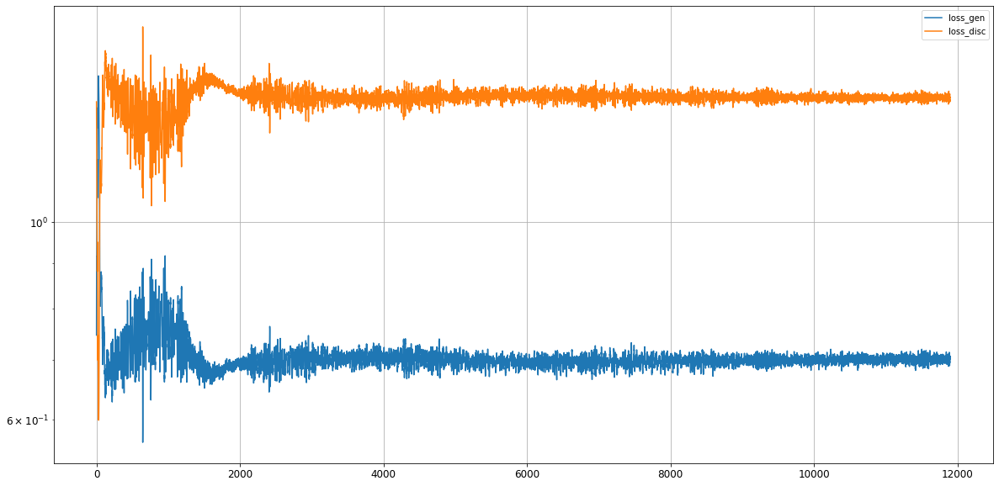

Epoch 11902/15000
0s
Epoch 11903/15000
0s
Epoch 11904/15000
0s
Epoch 11905/15000
0s
Epoch 11906/15000
0s
Epoch 11907/15000
0s
Epoch 11908/15000
0s
Epoch 11909/15000
0s
Epoch 11910/15000
0s
Epoch 11911/15000
0s
Epoch 11912/15000
0s
Epoch 11913/15000
0s
Epoch 11914/15000
0s
Epoch 11915/15000
0s
Epoch 11916/15000
0s
Epoch 11917/15000
0s
Epoch 11918/15000
0s
Epoch 11919/15000
0s
Epoch 11920/15000
0s
Epoch 11921/15000
0s
Epoch 11922/15000
0s
Epoch 11923/15000
0s
Epoch 11924/15000
0s
Epoch 11925/15000
0s
Epoch 11926/15000
0s
Epoch 11927/15000
0s
Epoch 11928/15000
0s
Epoch 11929/15000
0s
Epoch 11930/15000
0s
Epoch 11931/15000
0s
Epoch 11932/15000
0s
Epoch 11933/15000
0s
Epoch 11934/15000
0s
Epoch 11935/15000
0s
Epoch 11936/15000
0s
Epoch 11937/15000
0s
Epoch 11938/15000
0s
Epoch 11939/15000
0s
Epoch 11940/15000
0s
Epoch 11941/15000
0s
Epoch 11942/15000
0s
Epoch 11943/15000
0s
Epoch 11944/15000
0s
Epoch 11945/15000
0s
Epoch 11946/15000
0s
Epoch 11947/15000
0s
Epoch 11948/15000
0s
Epoch 11949/1

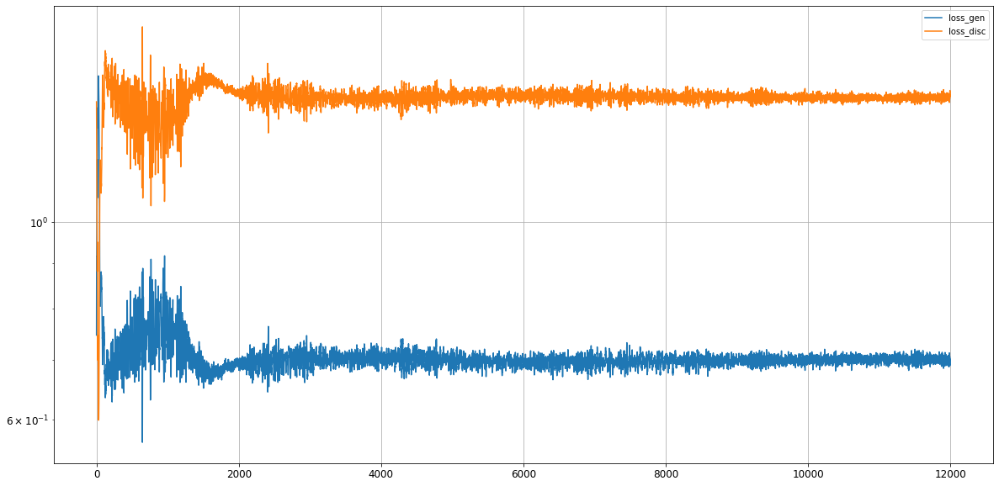

Epoch 12002/15000
0s
Epoch 12003/15000
0s
Epoch 12004/15000
0s
Epoch 12005/15000
0s
Epoch 12006/15000
0s
Epoch 12007/15000
0s
Epoch 12008/15000
0s
Epoch 12009/15000
0s
Epoch 12010/15000
0s
Epoch 12011/15000
0s
Epoch 12012/15000
0s
Epoch 12013/15000
0s
Epoch 12014/15000
0s
Epoch 12015/15000
0s
Epoch 12016/15000
0s
Epoch 12017/15000
0s
Epoch 12018/15000
0s
Epoch 12019/15000
0s
Epoch 12020/15000
0s
Epoch 12021/15000
0s
Epoch 12022/15000
0s
Epoch 12023/15000
0s
Epoch 12024/15000
0s
Epoch 12025/15000
0s
Epoch 12026/15000
0s
Epoch 12027/15000
0s
Epoch 12028/15000
0s
Epoch 12029/15000
0s
Epoch 12030/15000
0s
Epoch 12031/15000
0s
Epoch 12032/15000
0s
Epoch 12033/15000
0s
Epoch 12034/15000
0s
Epoch 12035/15000
0s
Epoch 12036/15000
0s
Epoch 12037/15000
0s
Epoch 12038/15000
0s
Epoch 12039/15000
0s
Epoch 12040/15000
0s
Epoch 12041/15000
0s
Epoch 12042/15000
0s
Epoch 12043/15000
0s
Epoch 12044/15000
0s
Epoch 12045/15000
0s
Epoch 12046/15000
0s
Epoch 12047/15000
0s
Epoch 12048/15000
0s
Epoch 12049/1

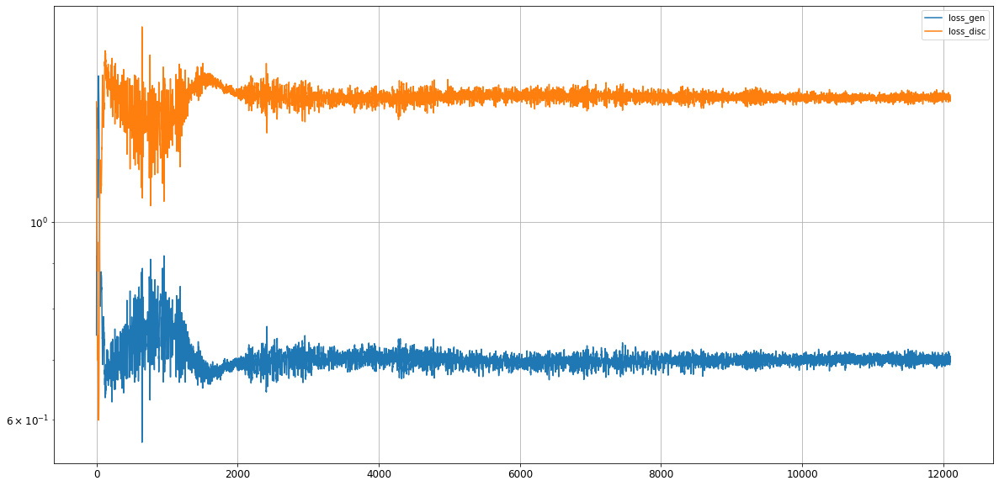

Epoch 12102/15000
0s
Epoch 12103/15000
0s
Epoch 12104/15000
0s
Epoch 12105/15000
0s
Epoch 12106/15000
0s
Epoch 12107/15000
0s
Epoch 12108/15000
0s
Epoch 12109/15000
0s
Epoch 12110/15000
0s
Epoch 12111/15000
0s
Epoch 12112/15000
0s
Epoch 12113/15000
0s
Epoch 12114/15000
0s
Epoch 12115/15000
0s
Epoch 12116/15000
0s
Epoch 12117/15000
0s
Epoch 12118/15000
0s
Epoch 12119/15000
0s
Epoch 12120/15000
0s
Epoch 12121/15000
0s
Epoch 12122/15000
0s
Epoch 12123/15000
0s
Epoch 12124/15000
0s
Epoch 12125/15000
0s
Epoch 12126/15000
0s
Epoch 12127/15000
0s
Epoch 12128/15000
0s
Epoch 12129/15000
0s
Epoch 12130/15000
0s
Epoch 12131/15000
0s
Epoch 12132/15000
0s
Epoch 12133/15000
0s
Epoch 12134/15000
0s
Epoch 12135/15000
0s
Epoch 12136/15000
0s
Epoch 12137/15000
0s
Epoch 12138/15000
0s
Epoch 12139/15000
0s
Epoch 12140/15000
0s
Epoch 12141/15000
0s
Epoch 12142/15000
0s
Epoch 12143/15000
0s
Epoch 12144/15000
0s
Epoch 12145/15000
0s
Epoch 12146/15000
0s
Epoch 12147/15000
0s
Epoch 12148/15000
0s
Epoch 12149/1

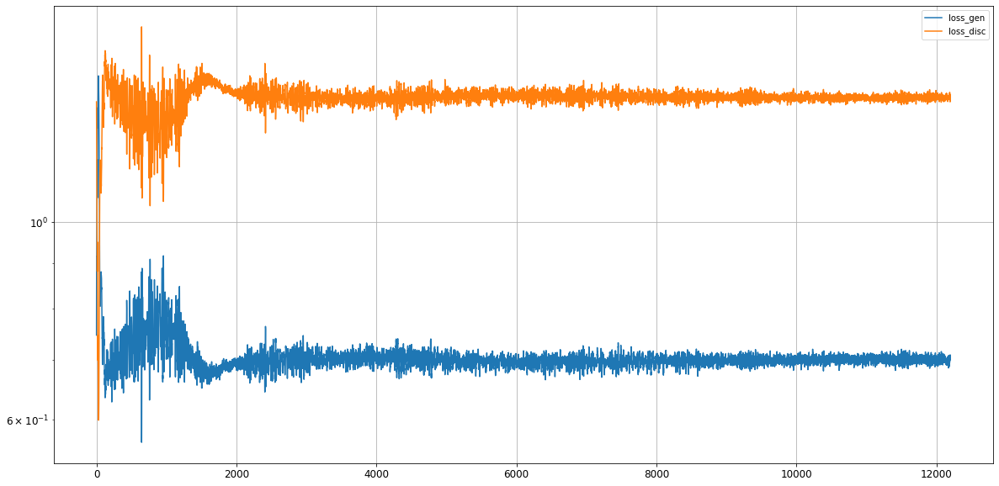

Epoch 12202/15000
0s
Epoch 12203/15000
0s
Epoch 12204/15000
0s
Epoch 12205/15000
0s
Epoch 12206/15000
0s
Epoch 12207/15000
0s
Epoch 12208/15000
0s
Epoch 12209/15000
0s
Epoch 12210/15000
0s
Epoch 12211/15000
0s
Epoch 12212/15000
0s
Epoch 12213/15000
0s
Epoch 12214/15000
0s
Epoch 12215/15000
0s
Epoch 12216/15000
0s
Epoch 12217/15000
0s
Epoch 12218/15000
0s
Epoch 12219/15000
0s
Epoch 12220/15000
0s
Epoch 12221/15000
0s
Epoch 12222/15000
0s
Epoch 12223/15000
0s
Epoch 12224/15000
0s
Epoch 12225/15000
0s
Epoch 12226/15000
0s
Epoch 12227/15000
0s
Epoch 12228/15000
0s
Epoch 12229/15000
0s
Epoch 12230/15000
0s
Epoch 12231/15000
0s
Epoch 12232/15000
0s
Epoch 12233/15000
0s
Epoch 12234/15000
0s
Epoch 12235/15000
0s
Epoch 12236/15000
0s
Epoch 12237/15000
0s
Epoch 12238/15000
0s
Epoch 12239/15000
0s
Epoch 12240/15000
0s
Epoch 12241/15000
0s
Epoch 12242/15000
0s
Epoch 12243/15000
0s
Epoch 12244/15000
0s
Epoch 12245/15000
0s
Epoch 12246/15000
0s
Epoch 12247/15000
0s
Epoch 12248/15000
0s
Epoch 12249/1

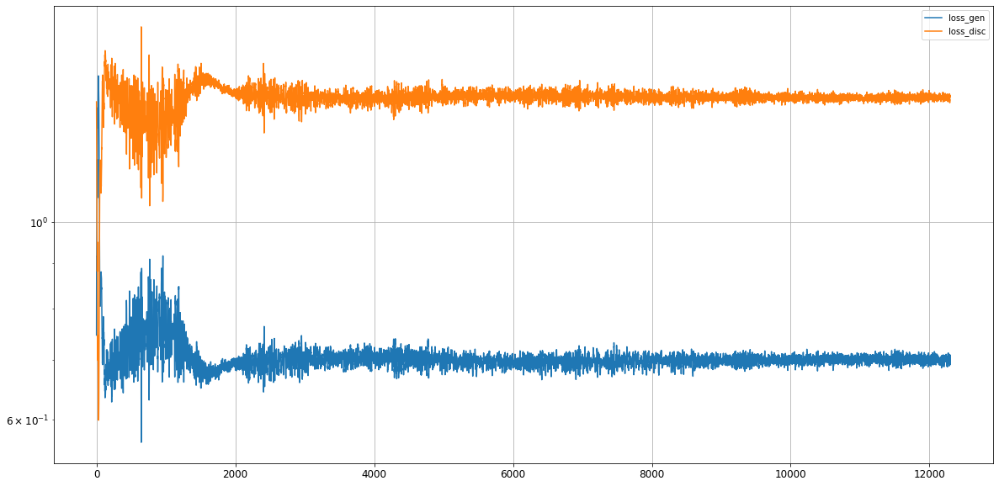

Epoch 12302/15000
0s
Epoch 12303/15000
0s
Epoch 12304/15000
0s
Epoch 12305/15000
0s
Epoch 12306/15000
0s
Epoch 12307/15000
0s
Epoch 12308/15000
0s
Epoch 12309/15000
0s
Epoch 12310/15000
0s
Epoch 12311/15000
0s
Epoch 12312/15000
0s
Epoch 12313/15000
0s
Epoch 12314/15000
0s
Epoch 12315/15000
0s
Epoch 12316/15000
0s
Epoch 12317/15000
0s
Epoch 12318/15000
0s
Epoch 12319/15000
0s
Epoch 12320/15000
0s
Epoch 12321/15000
0s
Epoch 12322/15000
0s
Epoch 12323/15000
0s
Epoch 12324/15000
0s
Epoch 12325/15000
0s
Epoch 12326/15000
0s
Epoch 12327/15000
0s
Epoch 12328/15000
0s
Epoch 12329/15000
0s
Epoch 12330/15000
0s
Epoch 12331/15000
0s
Epoch 12332/15000
0s
Epoch 12333/15000
0s
Epoch 12334/15000
0s
Epoch 12335/15000
0s
Epoch 12336/15000
0s
Epoch 12337/15000
0s
Epoch 12338/15000
0s
Epoch 12339/15000
0s
Epoch 12340/15000
0s
Epoch 12341/15000
0s
Epoch 12342/15000
0s
Epoch 12343/15000
0s
Epoch 12344/15000
0s
Epoch 12345/15000
0s
Epoch 12346/15000
0s
Epoch 12347/15000
0s
Epoch 12348/15000
0s
Epoch 12349/1

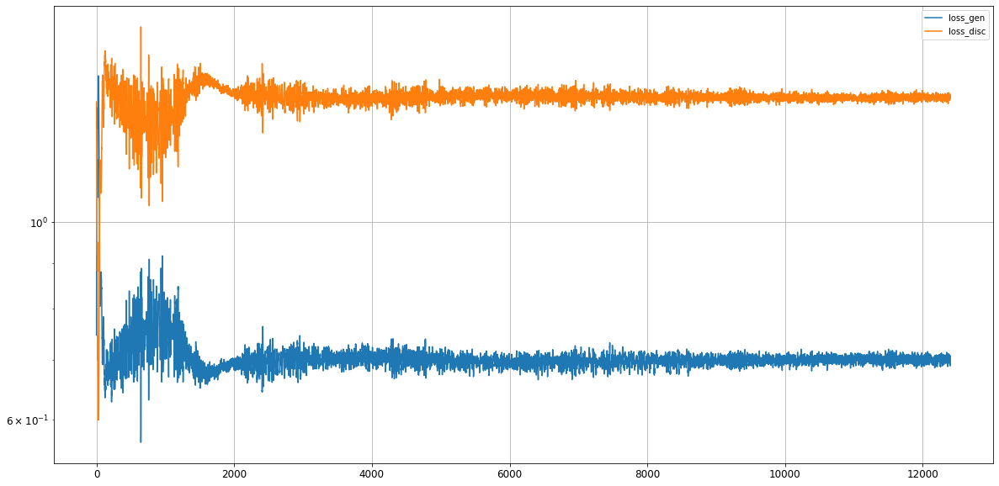

Epoch 12402/15000
0s
Epoch 12403/15000
0s
Epoch 12404/15000
0s
Epoch 12405/15000
0s
Epoch 12406/15000
0s
Epoch 12407/15000
0s
Epoch 12408/15000
0s
Epoch 12409/15000
0s
Epoch 12410/15000
0s
Epoch 12411/15000
0s
Epoch 12412/15000
0s
Epoch 12413/15000
0s
Epoch 12414/15000
0s
Epoch 12415/15000
0s
Epoch 12416/15000
0s
Epoch 12417/15000
0s
Epoch 12418/15000
0s
Epoch 12419/15000
0s
Epoch 12420/15000
0s
Epoch 12421/15000
0s
Epoch 12422/15000
0s
Epoch 12423/15000
0s
Epoch 12424/15000
0s
Epoch 12425/15000
0s
Epoch 12426/15000
0s
Epoch 12427/15000
0s
Epoch 12428/15000
0s
Epoch 12429/15000
0s
Epoch 12430/15000
0s
Epoch 12431/15000
0s
Epoch 12432/15000
0s
Epoch 12433/15000
0s
Epoch 12434/15000
0s
Epoch 12435/15000
0s
Epoch 12436/15000
0s
Epoch 12437/15000
0s
Epoch 12438/15000
0s
Epoch 12439/15000
0s
Epoch 12440/15000
0s
Epoch 12441/15000
0s
Epoch 12442/15000
0s
Epoch 12443/15000
0s
Epoch 12444/15000
0s
Epoch 12445/15000
0s
Epoch 12446/15000
0s
Epoch 12447/15000
0s
Epoch 12448/15000
0s
Epoch 12449/1

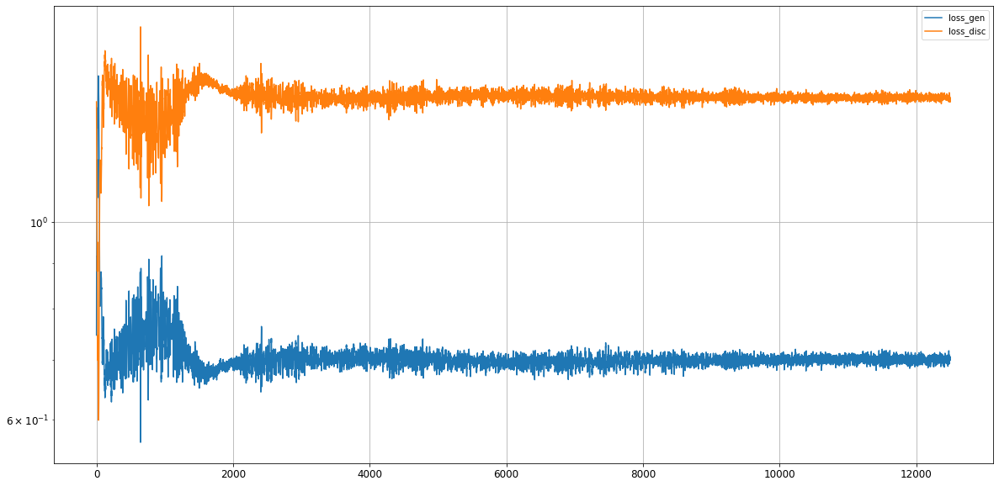

Epoch 12502/15000
0s
Epoch 12503/15000
0s
Epoch 12504/15000
0s
Epoch 12505/15000
0s
Epoch 12506/15000
0s
Epoch 12507/15000
0s
Epoch 12508/15000
0s
Epoch 12509/15000
0s
Epoch 12510/15000
0s
Epoch 12511/15000
0s
Epoch 12512/15000
0s
Epoch 12513/15000
0s
Epoch 12514/15000
0s
Epoch 12515/15000
0s
Epoch 12516/15000
0s
Epoch 12517/15000
0s
Epoch 12518/15000
0s
Epoch 12519/15000
0s
Epoch 12520/15000
0s
Epoch 12521/15000
0s
Epoch 12522/15000
0s
Epoch 12523/15000
0s
Epoch 12524/15000
0s
Epoch 12525/15000
0s
Epoch 12526/15000
0s
Epoch 12527/15000
0s
Epoch 12528/15000
0s
Epoch 12529/15000
0s
Epoch 12530/15000
0s
Epoch 12531/15000
0s
Epoch 12532/15000
0s
Epoch 12533/15000
0s
Epoch 12534/15000
0s
Epoch 12535/15000
0s
Epoch 12536/15000
0s
Epoch 12537/15000
0s
Epoch 12538/15000
0s
Epoch 12539/15000
0s
Epoch 12540/15000
0s
Epoch 12541/15000
0s
Epoch 12542/15000
0s
Epoch 12543/15000
0s
Epoch 12544/15000
0s
Epoch 12545/15000
0s
Epoch 12546/15000
0s
Epoch 12547/15000
0s
Epoch 12548/15000
0s
Epoch 12549/1

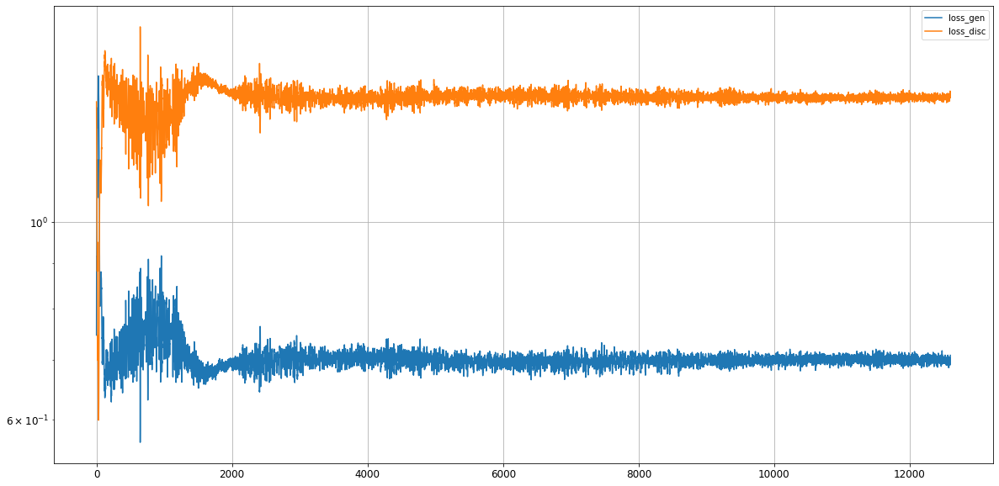

Epoch 12602/15000
0s
Epoch 12603/15000
0s
Epoch 12604/15000
0s
Epoch 12605/15000
0s
Epoch 12606/15000
0s
Epoch 12607/15000
0s
Epoch 12608/15000
0s
Epoch 12609/15000
0s
Epoch 12610/15000
0s
Epoch 12611/15000
0s
Epoch 12612/15000
0s
Epoch 12613/15000
0s
Epoch 12614/15000
0s
Epoch 12615/15000
0s
Epoch 12616/15000
0s
Epoch 12617/15000
0s
Epoch 12618/15000
0s
Epoch 12619/15000
0s
Epoch 12620/15000
0s
Epoch 12621/15000
0s
Epoch 12622/15000
0s
Epoch 12623/15000
0s
Epoch 12624/15000
0s
Epoch 12625/15000
0s
Epoch 12626/15000
0s
Epoch 12627/15000
0s
Epoch 12628/15000
0s
Epoch 12629/15000
0s
Epoch 12630/15000
0s
Epoch 12631/15000
0s
Epoch 12632/15000
0s
Epoch 12633/15000
0s
Epoch 12634/15000
0s
Epoch 12635/15000
0s
Epoch 12636/15000
0s
Epoch 12637/15000
0s
Epoch 12638/15000
0s
Epoch 12639/15000
0s
Epoch 12640/15000
0s
Epoch 12641/15000
0s
Epoch 12642/15000
0s
Epoch 12643/15000
0s
Epoch 12644/15000
0s
Epoch 12645/15000
0s
Epoch 12646/15000
0s
Epoch 12647/15000
0s
Epoch 12648/15000
0s
Epoch 12649/1

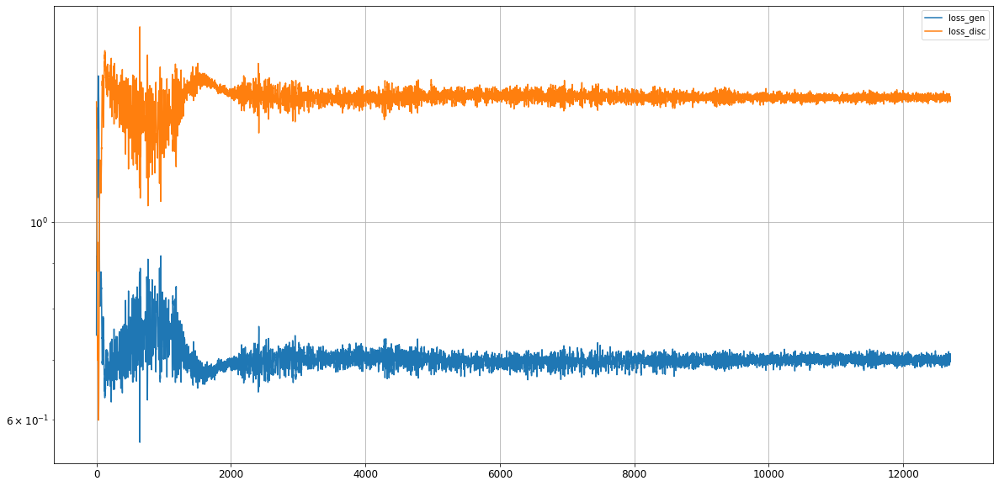

Epoch 12702/15000
0s
Epoch 12703/15000
0s
Epoch 12704/15000
0s
Epoch 12705/15000
0s
Epoch 12706/15000
0s
Epoch 12707/15000
0s
Epoch 12708/15000
0s
Epoch 12709/15000
0s
Epoch 12710/15000
0s
Epoch 12711/15000
0s
Epoch 12712/15000
0s
Epoch 12713/15000
0s
Epoch 12714/15000
0s
Epoch 12715/15000
0s
Epoch 12716/15000
0s
Epoch 12717/15000
0s
Epoch 12718/15000
0s
Epoch 12719/15000
0s
Epoch 12720/15000
0s
Epoch 12721/15000
0s
Epoch 12722/15000
0s
Epoch 12723/15000
0s
Epoch 12724/15000
0s
Epoch 12725/15000
0s
Epoch 12726/15000
0s
Epoch 12727/15000
0s
Epoch 12728/15000
0s
Epoch 12729/15000
0s
Epoch 12730/15000
0s
Epoch 12731/15000
0s
Epoch 12732/15000
0s
Epoch 12733/15000
0s
Epoch 12734/15000
0s
Epoch 12735/15000
0s
Epoch 12736/15000
0s
Epoch 12737/15000
0s
Epoch 12738/15000
0s
Epoch 12739/15000
0s
Epoch 12740/15000
0s
Epoch 12741/15000
0s
Epoch 12742/15000
0s
Epoch 12743/15000
0s
Epoch 12744/15000
0s
Epoch 12745/15000
0s
Epoch 12746/15000
0s
Epoch 12747/15000
0s
Epoch 12748/15000
0s
Epoch 12749/1

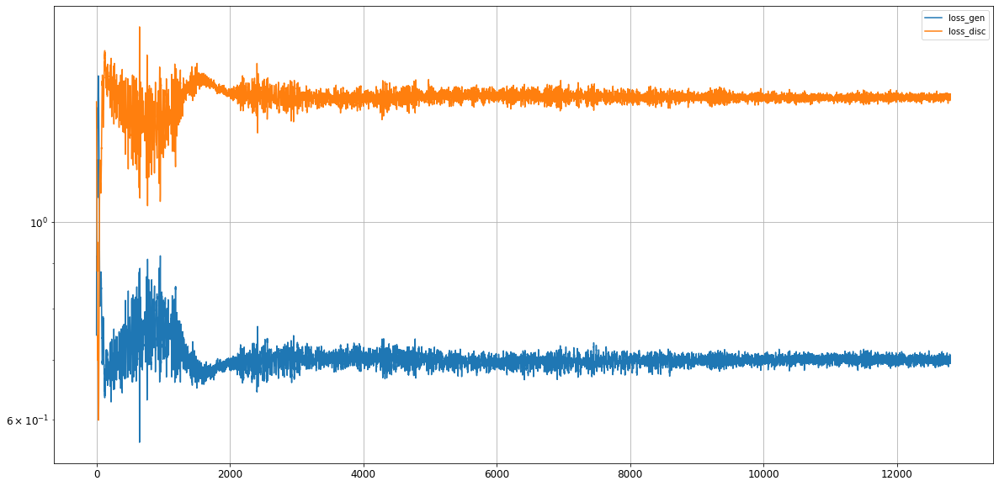

Epoch 12802/15000
0s
Epoch 12803/15000
0s
Epoch 12804/15000
0s
Epoch 12805/15000
0s
Epoch 12806/15000
0s
Epoch 12807/15000
0s
Epoch 12808/15000
0s
Epoch 12809/15000
0s
Epoch 12810/15000
0s
Epoch 12811/15000
0s
Epoch 12812/15000
0s
Epoch 12813/15000
0s
Epoch 12814/15000
0s
Epoch 12815/15000
0s
Epoch 12816/15000
0s
Epoch 12817/15000
0s
Epoch 12818/15000
0s
Epoch 12819/15000
0s
Epoch 12820/15000
0s
Epoch 12821/15000
0s
Epoch 12822/15000
0s
Epoch 12823/15000
0s
Epoch 12824/15000
0s
Epoch 12825/15000
0s
Epoch 12826/15000
0s
Epoch 12827/15000
0s
Epoch 12828/15000
0s
Epoch 12829/15000
0s
Epoch 12830/15000
0s
Epoch 12831/15000
0s
Epoch 12832/15000
0s
Epoch 12833/15000
0s
Epoch 12834/15000
0s
Epoch 12835/15000
0s
Epoch 12836/15000
0s
Epoch 12837/15000
0s
Epoch 12838/15000
0s
Epoch 12839/15000
0s
Epoch 12840/15000
0s
Epoch 12841/15000
0s
Epoch 12842/15000
0s
Epoch 12843/15000
0s
Epoch 12844/15000
0s
Epoch 12845/15000
0s
Epoch 12846/15000
0s
Epoch 12847/15000
0s
Epoch 12848/15000
0s
Epoch 12849/1

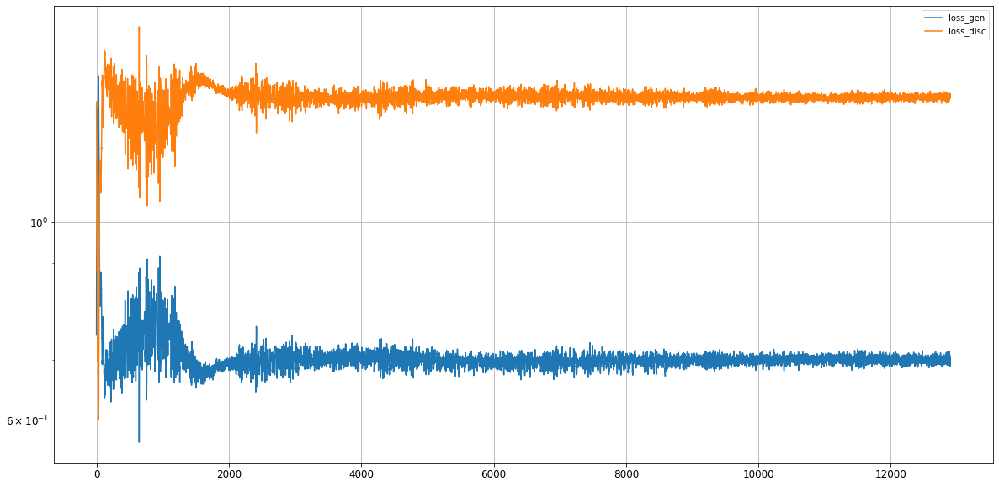

Epoch 12902/15000
0s
Epoch 12903/15000
0s
Epoch 12904/15000
0s
Epoch 12905/15000
0s
Epoch 12906/15000
0s
Epoch 12907/15000
0s
Epoch 12908/15000
0s
Epoch 12909/15000
0s
Epoch 12910/15000
0s
Epoch 12911/15000
0s
Epoch 12912/15000
0s
Epoch 12913/15000
0s
Epoch 12914/15000
0s
Epoch 12915/15000
0s
Epoch 12916/15000
0s
Epoch 12917/15000
0s
Epoch 12918/15000
0s
Epoch 12919/15000
0s
Epoch 12920/15000
0s
Epoch 12921/15000
0s
Epoch 12922/15000
0s
Epoch 12923/15000
0s
Epoch 12924/15000
0s
Epoch 12925/15000
0s
Epoch 12926/15000
0s
Epoch 12927/15000
0s
Epoch 12928/15000
0s
Epoch 12929/15000
0s
Epoch 12930/15000
0s
Epoch 12931/15000
0s
Epoch 12932/15000
0s
Epoch 12933/15000
0s
Epoch 12934/15000
0s
Epoch 12935/15000
0s
Epoch 12936/15000
0s
Epoch 12937/15000
0s
Epoch 12938/15000
0s
Epoch 12939/15000
0s
Epoch 12940/15000
0s
Epoch 12941/15000
0s
Epoch 12942/15000
0s
Epoch 12943/15000
0s
Epoch 12944/15000
0s
Epoch 12945/15000
0s
Epoch 12946/15000
0s
Epoch 12947/15000
0s
Epoch 12948/15000
0s
Epoch 12949/1

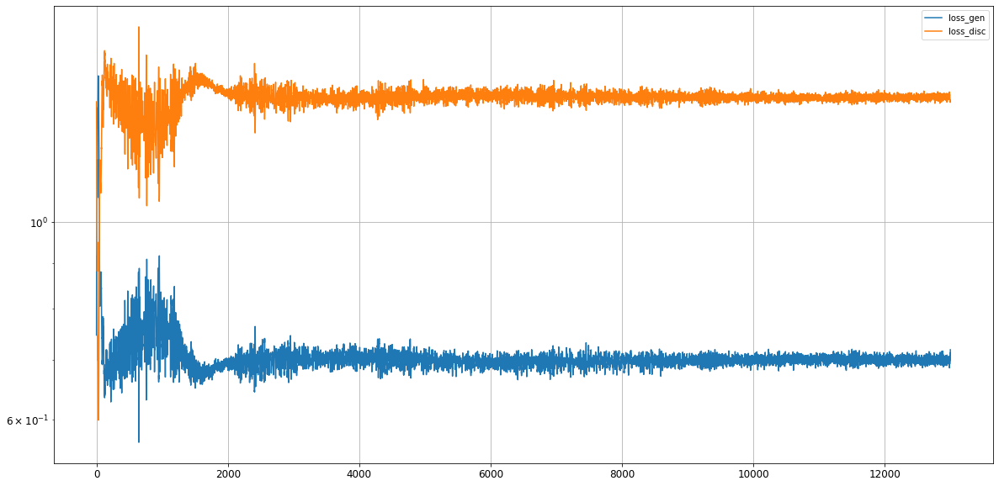

Epoch 13002/15000
0s
Epoch 13003/15000
0s
Epoch 13004/15000
0s
Epoch 13005/15000
0s
Epoch 13006/15000
0s
Epoch 13007/15000
0s
Epoch 13008/15000
0s
Epoch 13009/15000
0s
Epoch 13010/15000
0s
Epoch 13011/15000
0s
Epoch 13012/15000
0s
Epoch 13013/15000
0s
Epoch 13014/15000
0s
Epoch 13015/15000
0s
Epoch 13016/15000
0s
Epoch 13017/15000
0s
Epoch 13018/15000
0s
Epoch 13019/15000
0s
Epoch 13020/15000
0s
Epoch 13021/15000
0s
Epoch 13022/15000
0s
Epoch 13023/15000
0s
Epoch 13024/15000
0s
Epoch 13025/15000
0s
Epoch 13026/15000
0s
Epoch 13027/15000
0s
Epoch 13028/15000
0s
Epoch 13029/15000
0s
Epoch 13030/15000
0s
Epoch 13031/15000
0s
Epoch 13032/15000
0s
Epoch 13033/15000
0s
Epoch 13034/15000
0s
Epoch 13035/15000
0s
Epoch 13036/15000
0s
Epoch 13037/15000
0s
Epoch 13038/15000
0s
Epoch 13039/15000
0s
Epoch 13040/15000
0s
Epoch 13041/15000
0s
Epoch 13042/15000
0s
Epoch 13043/15000
0s
Epoch 13044/15000
0s
Epoch 13045/15000
0s
Epoch 13046/15000
0s
Epoch 13047/15000
0s
Epoch 13048/15000
0s
Epoch 13049/1

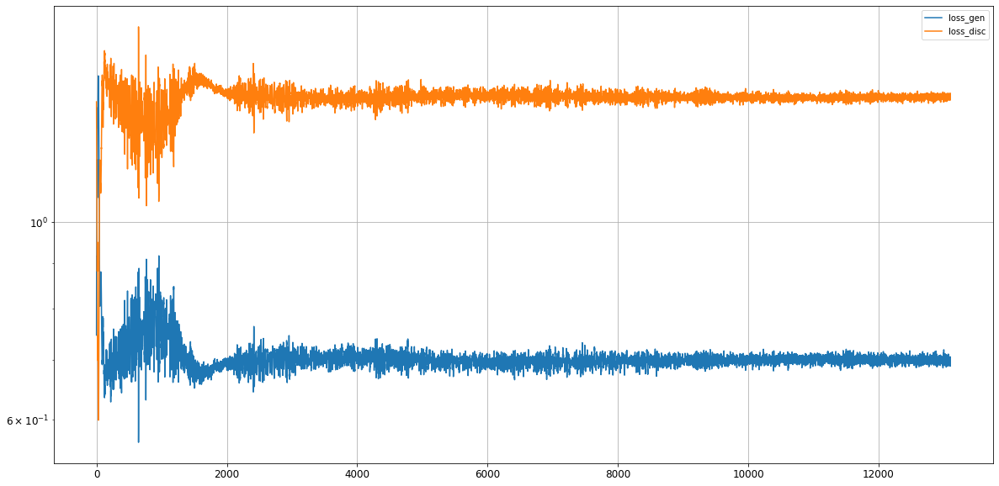

Epoch 13102/15000
0s
Epoch 13103/15000
0s
Epoch 13104/15000
0s
Epoch 13105/15000
0s
Epoch 13106/15000
0s
Epoch 13107/15000
0s
Epoch 13108/15000
0s
Epoch 13109/15000
0s
Epoch 13110/15000
0s
Epoch 13111/15000
0s
Epoch 13112/15000
0s
Epoch 13113/15000
0s
Epoch 13114/15000
0s
Epoch 13115/15000
0s
Epoch 13116/15000
0s
Epoch 13117/15000
0s
Epoch 13118/15000
0s
Epoch 13119/15000
0s
Epoch 13120/15000
0s
Epoch 13121/15000
0s
Epoch 13122/15000
0s
Epoch 13123/15000
0s
Epoch 13124/15000
0s
Epoch 13125/15000
0s
Epoch 13126/15000
0s
Epoch 13127/15000
0s
Epoch 13128/15000
0s
Epoch 13129/15000
0s
Epoch 13130/15000
0s
Epoch 13131/15000
0s
Epoch 13132/15000
0s
Epoch 13133/15000
0s
Epoch 13134/15000
0s
Epoch 13135/15000
0s
Epoch 13136/15000
0s
Epoch 13137/15000
0s
Epoch 13138/15000
0s
Epoch 13139/15000
0s
Epoch 13140/15000
0s
Epoch 13141/15000
0s
Epoch 13142/15000
0s
Epoch 13143/15000
0s
Epoch 13144/15000
0s
Epoch 13145/15000
0s
Epoch 13146/15000
0s
Epoch 13147/15000
0s
Epoch 13148/15000
0s
Epoch 13149/1

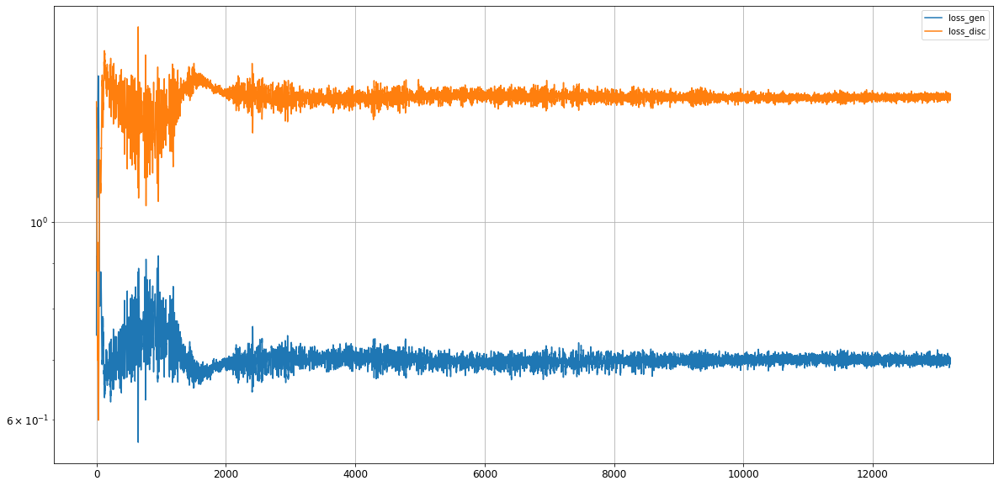

Epoch 13202/15000
0s
Epoch 13203/15000
0s
Epoch 13204/15000
0s
Epoch 13205/15000
0s
Epoch 13206/15000
0s
Epoch 13207/15000
0s
Epoch 13208/15000
0s
Epoch 13209/15000
0s
Epoch 13210/15000
0s
Epoch 13211/15000
0s
Epoch 13212/15000
0s
Epoch 13213/15000
0s
Epoch 13214/15000
0s
Epoch 13215/15000
0s
Epoch 13216/15000
0s
Epoch 13217/15000
0s
Epoch 13218/15000
0s
Epoch 13219/15000
0s
Epoch 13220/15000
0s
Epoch 13221/15000
0s
Epoch 13222/15000
0s
Epoch 13223/15000
0s
Epoch 13224/15000
0s
Epoch 13225/15000
0s
Epoch 13226/15000
0s
Epoch 13227/15000
0s
Epoch 13228/15000
0s
Epoch 13229/15000
0s
Epoch 13230/15000
0s
Epoch 13231/15000
0s
Epoch 13232/15000
0s
Epoch 13233/15000
0s
Epoch 13234/15000
0s
Epoch 13235/15000
0s
Epoch 13236/15000
0s
Epoch 13237/15000
0s
Epoch 13238/15000
0s
Epoch 13239/15000
0s
Epoch 13240/15000
0s
Epoch 13241/15000
0s
Epoch 13242/15000
0s
Epoch 13243/15000
0s
Epoch 13244/15000
0s
Epoch 13245/15000
0s
Epoch 13246/15000
0s
Epoch 13247/15000
0s
Epoch 13248/15000
0s
Epoch 13249/1

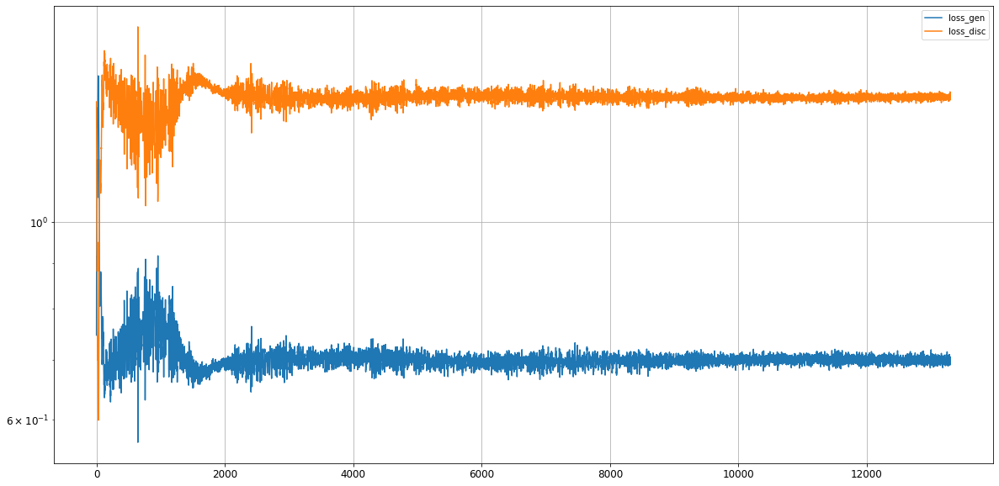

Epoch 13302/15000
0s
Epoch 13303/15000
0s
Epoch 13304/15000
0s
Epoch 13305/15000
0s
Epoch 13306/15000
0s
Epoch 13307/15000
0s
Epoch 13308/15000
0s
Epoch 13309/15000
0s
Epoch 13310/15000
0s
Epoch 13311/15000
0s
Epoch 13312/15000
0s
Epoch 13313/15000
0s
Epoch 13314/15000
0s
Epoch 13315/15000
0s
Epoch 13316/15000
0s
Epoch 13317/15000
0s
Epoch 13318/15000
0s
Epoch 13319/15000
0s
Epoch 13320/15000
0s
Epoch 13321/15000
0s
Epoch 13322/15000
0s
Epoch 13323/15000
0s
Epoch 13324/15000
0s
Epoch 13325/15000
0s
Epoch 13326/15000
0s
Epoch 13327/15000
0s
Epoch 13328/15000
0s
Epoch 13329/15000
0s
Epoch 13330/15000
0s
Epoch 13331/15000
0s
Epoch 13332/15000
0s
Epoch 13333/15000
0s
Epoch 13334/15000
0s
Epoch 13335/15000
0s
Epoch 13336/15000
0s
Epoch 13337/15000
0s
Epoch 13338/15000
0s
Epoch 13339/15000
0s
Epoch 13340/15000
0s
Epoch 13341/15000
0s
Epoch 13342/15000
0s
Epoch 13343/15000
0s
Epoch 13344/15000
0s
Epoch 13345/15000
0s
Epoch 13346/15000
0s
Epoch 13347/15000
0s
Epoch 13348/15000
0s
Epoch 13349/1

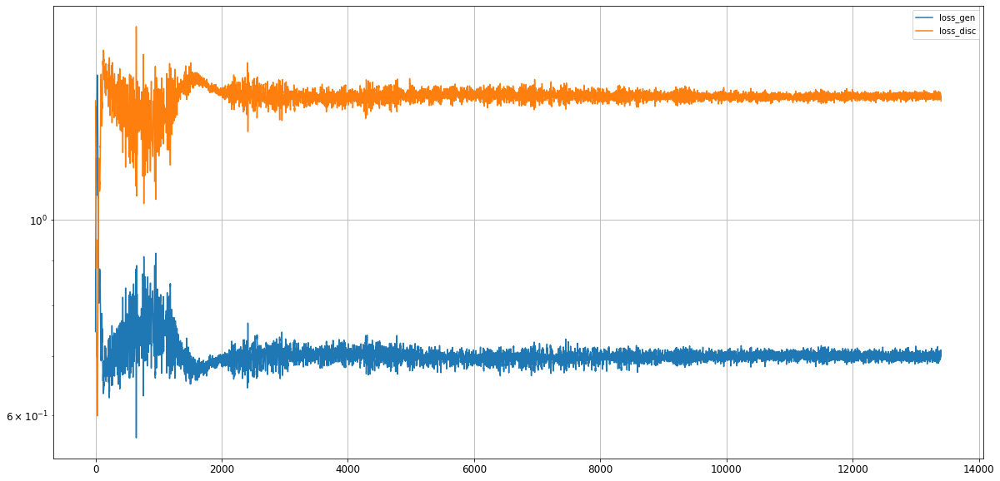

Epoch 13402/15000
0s
Epoch 13403/15000
0s
Epoch 13404/15000
0s
Epoch 13405/15000
0s
Epoch 13406/15000
0s
Epoch 13407/15000
0s
Epoch 13408/15000
0s
Epoch 13409/15000
0s
Epoch 13410/15000
0s
Epoch 13411/15000
0s
Epoch 13412/15000
0s
Epoch 13413/15000
0s
Epoch 13414/15000
0s
Epoch 13415/15000
0s
Epoch 13416/15000
0s
Epoch 13417/15000
0s
Epoch 13418/15000
0s
Epoch 13419/15000
0s
Epoch 13420/15000
0s
Epoch 13421/15000
0s
Epoch 13422/15000
0s
Epoch 13423/15000
0s
Epoch 13424/15000
0s
Epoch 13425/15000
0s
Epoch 13426/15000
0s
Epoch 13427/15000
0s
Epoch 13428/15000
0s
Epoch 13429/15000
0s
Epoch 13430/15000
0s
Epoch 13431/15000
0s
Epoch 13432/15000
0s
Epoch 13433/15000
0s
Epoch 13434/15000
0s
Epoch 13435/15000
0s
Epoch 13436/15000
0s
Epoch 13437/15000
0s
Epoch 13438/15000
0s
Epoch 13439/15000
0s
Epoch 13440/15000
0s
Epoch 13441/15000
0s
Epoch 13442/15000
0s
Epoch 13443/15000
0s
Epoch 13444/15000
0s
Epoch 13445/15000
0s
Epoch 13446/15000
0s
Epoch 13447/15000
0s
Epoch 13448/15000
0s
Epoch 13449/1

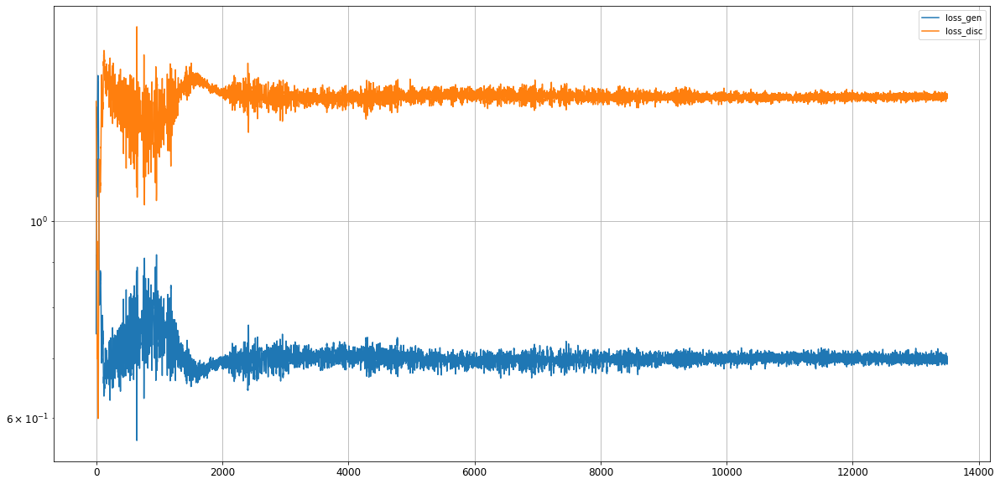

Epoch 13502/15000
0s
Epoch 13503/15000
0s
Epoch 13504/15000
0s
Epoch 13505/15000
0s
Epoch 13506/15000
0s
Epoch 13507/15000
0s
Epoch 13508/15000
0s
Epoch 13509/15000
0s
Epoch 13510/15000
0s
Epoch 13511/15000
0s
Epoch 13512/15000
0s
Epoch 13513/15000
0s
Epoch 13514/15000
0s
Epoch 13515/15000
0s
Epoch 13516/15000
0s
Epoch 13517/15000
0s
Epoch 13518/15000
0s
Epoch 13519/15000
0s
Epoch 13520/15000
0s
Epoch 13521/15000
0s
Epoch 13522/15000
0s
Epoch 13523/15000
0s
Epoch 13524/15000
0s
Epoch 13525/15000
0s
Epoch 13526/15000
0s
Epoch 13527/15000
0s
Epoch 13528/15000
0s
Epoch 13529/15000
0s
Epoch 13530/15000
0s
Epoch 13531/15000
0s
Epoch 13532/15000
0s
Epoch 13533/15000
0s
Epoch 13534/15000
0s
Epoch 13535/15000
0s
Epoch 13536/15000
0s
Epoch 13537/15000
0s
Epoch 13538/15000
0s
Epoch 13539/15000
0s
Epoch 13540/15000
0s
Epoch 13541/15000
0s
Epoch 13542/15000
0s
Epoch 13543/15000
0s
Epoch 13544/15000
0s
Epoch 13545/15000
0s
Epoch 13546/15000
0s
Epoch 13547/15000
0s
Epoch 13548/15000
0s
Epoch 13549/1

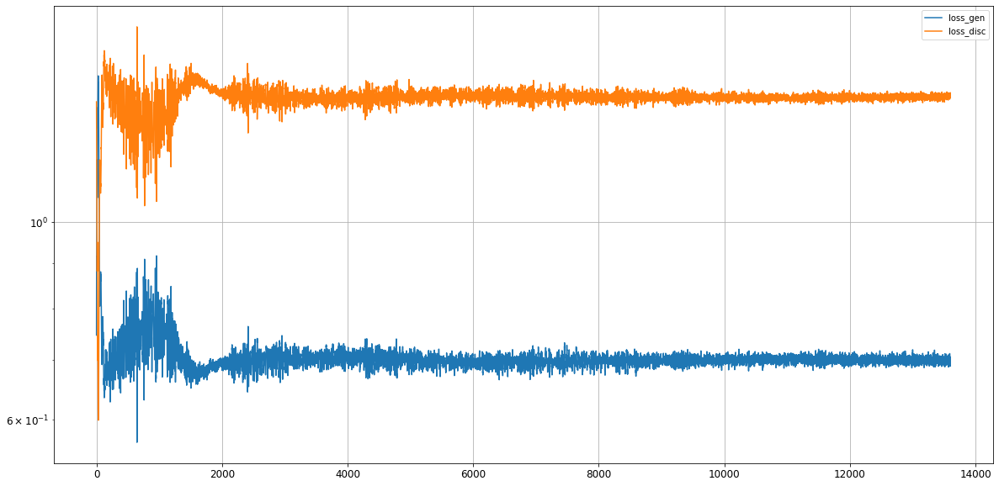

Epoch 13602/15000
0s
Epoch 13603/15000
0s
Epoch 13604/15000
0s
Epoch 13605/15000
0s
Epoch 13606/15000
0s
Epoch 13607/15000
0s
Epoch 13608/15000
0s
Epoch 13609/15000
0s
Epoch 13610/15000
0s
Epoch 13611/15000
0s
Epoch 13612/15000
0s
Epoch 13613/15000
0s
Epoch 13614/15000
0s
Epoch 13615/15000
0s
Epoch 13616/15000
0s
Epoch 13617/15000
0s
Epoch 13618/15000
0s
Epoch 13619/15000
0s
Epoch 13620/15000
0s
Epoch 13621/15000
0s
Epoch 13622/15000
0s
Epoch 13623/15000
0s
Epoch 13624/15000
0s
Epoch 13625/15000
0s
Epoch 13626/15000
0s
Epoch 13627/15000
0s
Epoch 13628/15000
0s
Epoch 13629/15000
0s
Epoch 13630/15000
0s
Epoch 13631/15000
0s
Epoch 13632/15000
0s
Epoch 13633/15000
0s
Epoch 13634/15000
0s
Epoch 13635/15000
0s
Epoch 13636/15000
0s
Epoch 13637/15000
0s
Epoch 13638/15000
0s
Epoch 13639/15000
0s
Epoch 13640/15000
0s
Epoch 13641/15000
0s
Epoch 13642/15000
0s
Epoch 13643/15000
0s
Epoch 13644/15000
0s
Epoch 13645/15000
0s
Epoch 13646/15000
0s
Epoch 13647/15000
0s
Epoch 13648/15000
0s
Epoch 13649/1

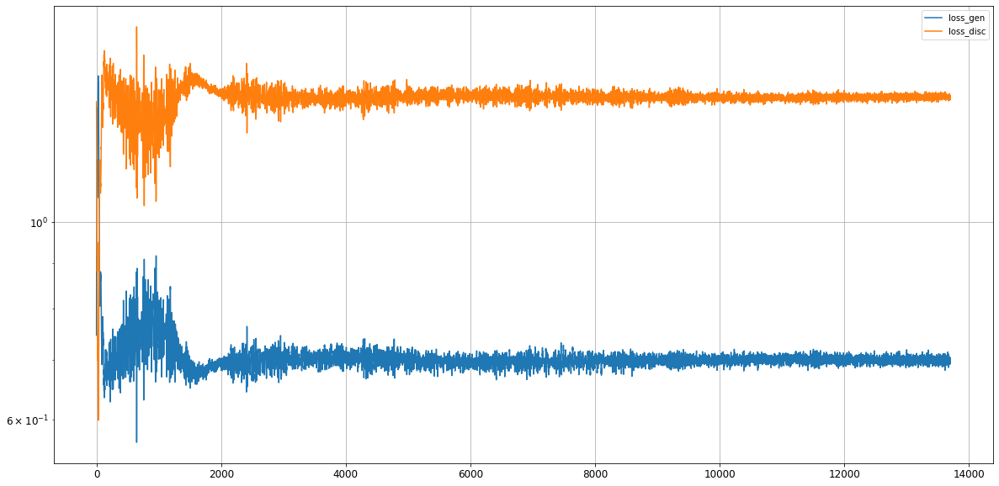

Epoch 13702/15000
0s
Epoch 13703/15000
0s
Epoch 13704/15000
0s
Epoch 13705/15000
0s
Epoch 13706/15000
0s
Epoch 13707/15000
0s
Epoch 13708/15000
0s
Epoch 13709/15000
0s
Epoch 13710/15000
0s
Epoch 13711/15000
0s
Epoch 13712/15000
0s
Epoch 13713/15000
0s
Epoch 13714/15000
0s
Epoch 13715/15000
0s
Epoch 13716/15000
0s
Epoch 13717/15000
0s
Epoch 13718/15000
0s
Epoch 13719/15000
0s
Epoch 13720/15000
0s
Epoch 13721/15000
0s
Epoch 13722/15000
0s
Epoch 13723/15000
0s
Epoch 13724/15000
0s
Epoch 13725/15000
0s
Epoch 13726/15000
0s
Epoch 13727/15000
0s
Epoch 13728/15000
0s
Epoch 13729/15000
0s
Epoch 13730/15000
0s
Epoch 13731/15000
0s
Epoch 13732/15000
0s
Epoch 13733/15000
0s
Epoch 13734/15000
0s
Epoch 13735/15000
0s
Epoch 13736/15000
0s
Epoch 13737/15000
0s
Epoch 13738/15000
0s
Epoch 13739/15000
0s
Epoch 13740/15000
0s
Epoch 13741/15000
0s
Epoch 13742/15000
0s
Epoch 13743/15000
0s
Epoch 13744/15000
0s
Epoch 13745/15000
0s
Epoch 13746/15000
0s
Epoch 13747/15000
0s
Epoch 13748/15000
0s
Epoch 13749/1

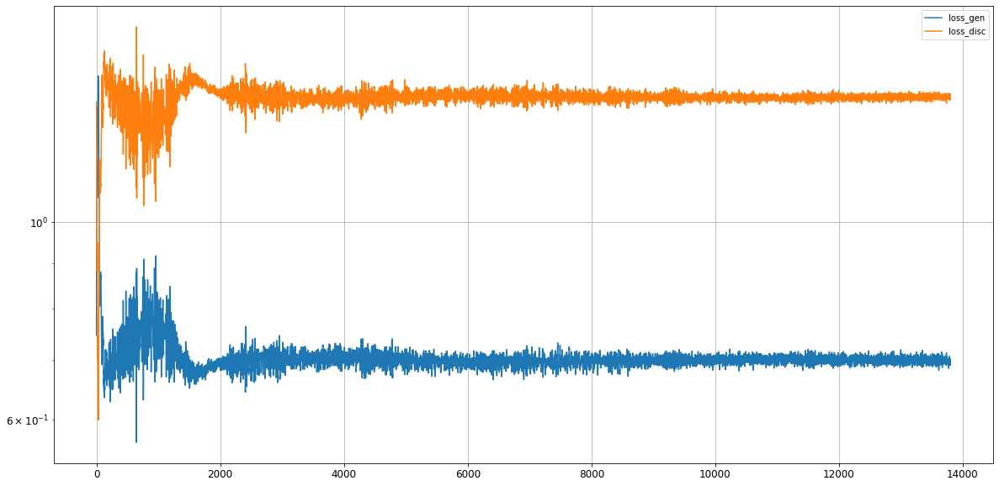

Epoch 13802/15000
0s
Epoch 13803/15000
0s
Epoch 13804/15000
0s
Epoch 13805/15000
0s
Epoch 13806/15000
0s
Epoch 13807/15000
0s
Epoch 13808/15000
0s
Epoch 13809/15000
0s
Epoch 13810/15000
0s
Epoch 13811/15000
0s
Epoch 13812/15000
0s
Epoch 13813/15000
0s
Epoch 13814/15000
0s
Epoch 13815/15000
0s
Epoch 13816/15000
0s
Epoch 13817/15000
0s
Epoch 13818/15000
0s
Epoch 13819/15000
0s
Epoch 13820/15000
0s
Epoch 13821/15000
0s
Epoch 13822/15000
0s
Epoch 13823/15000
0s
Epoch 13824/15000
0s
Epoch 13825/15000
0s
Epoch 13826/15000
0s
Epoch 13827/15000
0s
Epoch 13828/15000
0s
Epoch 13829/15000
0s
Epoch 13830/15000
0s
Epoch 13831/15000
0s
Epoch 13832/15000
0s
Epoch 13833/15000
0s
Epoch 13834/15000
0s
Epoch 13835/15000
0s
Epoch 13836/15000
0s
Epoch 13837/15000
0s
Epoch 13838/15000
0s
Epoch 13839/15000
0s
Epoch 13840/15000
0s
Epoch 13841/15000
0s
Epoch 13842/15000
0s
Epoch 13843/15000
0s
Epoch 13844/15000
0s
Epoch 13845/15000
0s
Epoch 13846/15000
0s
Epoch 13847/15000
0s
Epoch 13848/15000
0s
Epoch 13849/1

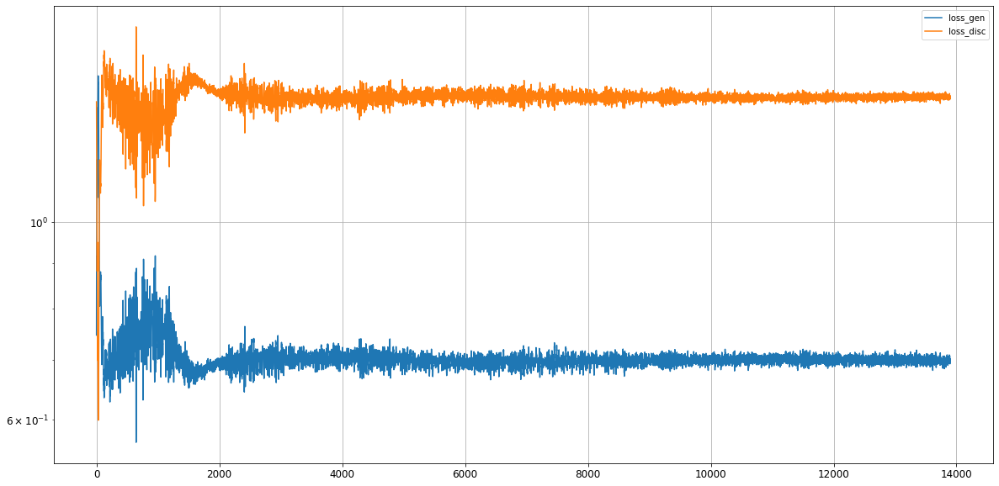

Epoch 13902/15000
0s
Epoch 13903/15000
0s
Epoch 13904/15000
0s
Epoch 13905/15000
0s
Epoch 13906/15000
0s
Epoch 13907/15000
0s
Epoch 13908/15000
0s
Epoch 13909/15000
0s
Epoch 13910/15000
0s
Epoch 13911/15000
0s
Epoch 13912/15000
0s
Epoch 13913/15000
0s
Epoch 13914/15000
0s
Epoch 13915/15000
0s
Epoch 13916/15000
0s
Epoch 13917/15000
0s
Epoch 13918/15000
0s
Epoch 13919/15000
0s
Epoch 13920/15000
0s
Epoch 13921/15000
0s
Epoch 13922/15000
0s
Epoch 13923/15000
0s
Epoch 13924/15000
0s
Epoch 13925/15000
0s
Epoch 13926/15000
0s
Epoch 13927/15000
0s
Epoch 13928/15000
0s
Epoch 13929/15000
0s
Epoch 13930/15000
0s
Epoch 13931/15000
0s
Epoch 13932/15000
0s
Epoch 13933/15000
0s
Epoch 13934/15000
0s
Epoch 13935/15000
0s
Epoch 13936/15000
0s
Epoch 13937/15000
0s
Epoch 13938/15000
0s
Epoch 13939/15000
0s
Epoch 13940/15000
0s
Epoch 13941/15000
0s
Epoch 13942/15000
0s
Epoch 13943/15000
0s
Epoch 13944/15000
0s
Epoch 13945/15000
0s
Epoch 13946/15000
0s
Epoch 13947/15000
0s
Epoch 13948/15000
0s
Epoch 13949/1

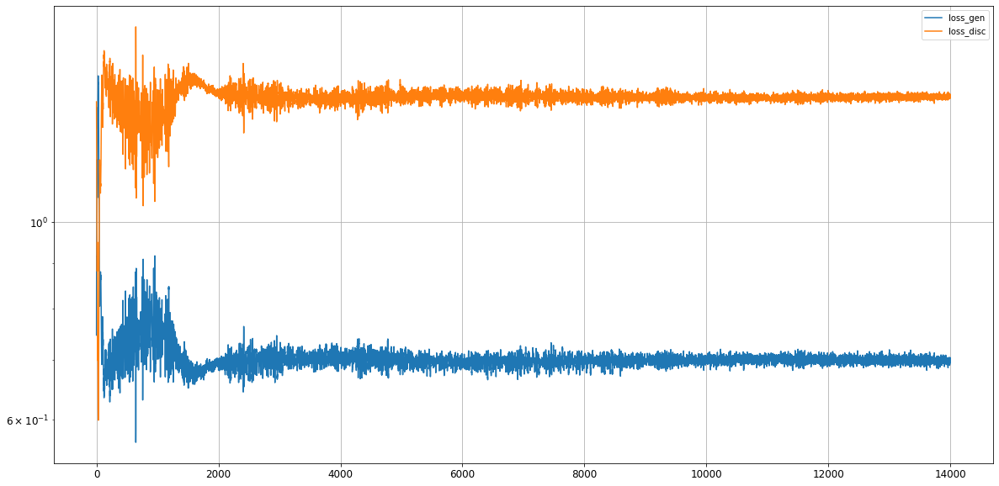

Epoch 14002/15000
0s
Epoch 14003/15000
0s
Epoch 14004/15000
0s
Epoch 14005/15000
0s
Epoch 14006/15000
0s
Epoch 14007/15000
0s
Epoch 14008/15000
0s
Epoch 14009/15000
0s
Epoch 14010/15000
0s
Epoch 14011/15000
0s
Epoch 14012/15000
0s
Epoch 14013/15000
0s
Epoch 14014/15000
0s
Epoch 14015/15000
0s
Epoch 14016/15000
0s
Epoch 14017/15000
0s
Epoch 14018/15000
0s
Epoch 14019/15000
0s
Epoch 14020/15000
0s
Epoch 14021/15000
0s
Epoch 14022/15000
0s
Epoch 14023/15000
0s
Epoch 14024/15000
0s
Epoch 14025/15000
0s
Epoch 14026/15000
0s
Epoch 14027/15000
0s
Epoch 14028/15000
0s
Epoch 14029/15000
0s
Epoch 14030/15000
0s
Epoch 14031/15000
0s
Epoch 14032/15000
0s
Epoch 14033/15000
0s
Epoch 14034/15000
0s
Epoch 14035/15000
0s
Epoch 14036/15000
0s
Epoch 14037/15000
0s
Epoch 14038/15000
0s
Epoch 14039/15000
0s
Epoch 14040/15000
0s
Epoch 14041/15000
0s
Epoch 14042/15000
0s
Epoch 14043/15000
0s
Epoch 14044/15000
0s
Epoch 14045/15000
0s
Epoch 14046/15000
0s
Epoch 14047/15000
0s
Epoch 14048/15000
0s
Epoch 14049/1

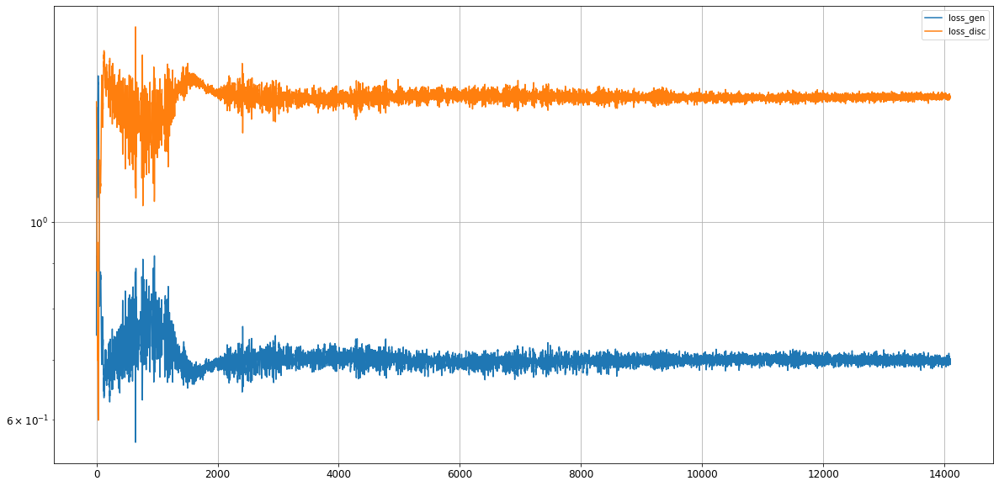

Epoch 14102/15000
0s
Epoch 14103/15000
0s
Epoch 14104/15000
0s
Epoch 14105/15000
0s
Epoch 14106/15000
0s
Epoch 14107/15000
0s
Epoch 14108/15000
0s
Epoch 14109/15000
0s
Epoch 14110/15000
0s
Epoch 14111/15000
0s
Epoch 14112/15000
0s
Epoch 14113/15000
0s
Epoch 14114/15000
0s
Epoch 14115/15000
0s
Epoch 14116/15000
0s
Epoch 14117/15000
0s
Epoch 14118/15000
0s
Epoch 14119/15000
0s
Epoch 14120/15000
0s
Epoch 14121/15000
0s
Epoch 14122/15000
0s
Epoch 14123/15000
0s
Epoch 14124/15000
0s
Epoch 14125/15000
0s
Epoch 14126/15000
0s
Epoch 14127/15000
0s
Epoch 14128/15000
0s
Epoch 14129/15000
0s
Epoch 14130/15000
0s
Epoch 14131/15000
0s
Epoch 14132/15000
0s
Epoch 14133/15000
0s
Epoch 14134/15000
0s
Epoch 14135/15000
0s
Epoch 14136/15000
0s
Epoch 14137/15000
0s
Epoch 14138/15000
0s
Epoch 14139/15000
0s
Epoch 14140/15000
0s
Epoch 14141/15000
0s
Epoch 14142/15000
0s
Epoch 14143/15000
0s
Epoch 14144/15000
0s
Epoch 14145/15000
0s
Epoch 14146/15000
0s
Epoch 14147/15000
0s
Epoch 14148/15000
0s
Epoch 14149/1

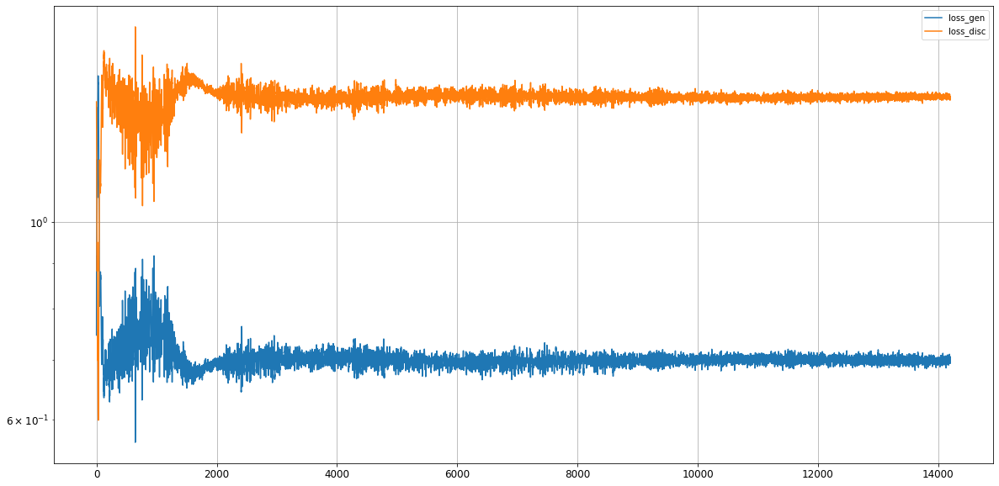

Epoch 14202/15000
0s
Epoch 14203/15000
0s
Epoch 14204/15000
0s
Epoch 14205/15000
0s
Epoch 14206/15000
0s
Epoch 14207/15000
0s
Epoch 14208/15000
0s
Epoch 14209/15000
0s
Epoch 14210/15000
0s
Epoch 14211/15000
0s
Epoch 14212/15000
0s
Epoch 14213/15000
0s
Epoch 14214/15000
0s
Epoch 14215/15000
0s
Epoch 14216/15000
0s
Epoch 14217/15000
0s
Epoch 14218/15000
0s
Epoch 14219/15000
0s
Epoch 14220/15000
0s
Epoch 14221/15000
0s
Epoch 14222/15000
0s
Epoch 14223/15000
0s
Epoch 14224/15000
0s
Epoch 14225/15000
0s
Epoch 14226/15000
0s
Epoch 14227/15000
0s
Epoch 14228/15000
0s
Epoch 14229/15000
0s
Epoch 14230/15000
0s
Epoch 14231/15000
0s
Epoch 14232/15000
0s
Epoch 14233/15000
0s
Epoch 14234/15000
0s
Epoch 14235/15000
0s
Epoch 14236/15000
0s
Epoch 14237/15000
0s
Epoch 14238/15000
0s
Epoch 14239/15000
0s
Epoch 14240/15000
0s
Epoch 14241/15000
0s
Epoch 14242/15000
0s
Epoch 14243/15000
0s
Epoch 14244/15000
0s
Epoch 14245/15000
0s
Epoch 14246/15000
0s
Epoch 14247/15000
0s
Epoch 14248/15000
0s
Epoch 14249/1

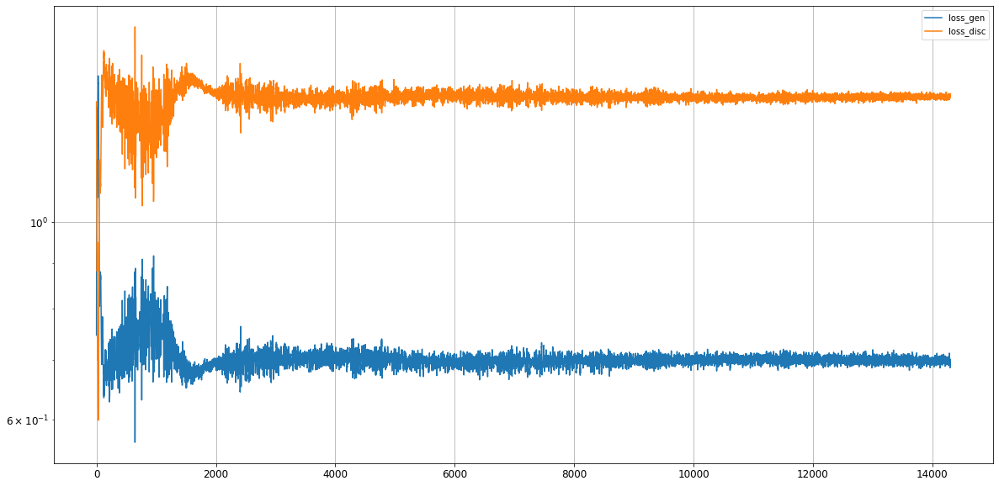

Epoch 14302/15000
0s
Epoch 14303/15000
0s
Epoch 14304/15000
0s
Epoch 14305/15000
0s
Epoch 14306/15000
0s
Epoch 14307/15000
0s
Epoch 14308/15000
0s
Epoch 14309/15000
0s
Epoch 14310/15000
0s
Epoch 14311/15000
0s
Epoch 14312/15000
0s
Epoch 14313/15000
0s
Epoch 14314/15000
0s
Epoch 14315/15000
0s
Epoch 14316/15000
0s
Epoch 14317/15000
0s
Epoch 14318/15000
0s
Epoch 14319/15000
0s
Epoch 14320/15000
0s
Epoch 14321/15000
0s
Epoch 14322/15000
0s
Epoch 14323/15000
0s
Epoch 14324/15000
0s
Epoch 14325/15000
0s
Epoch 14326/15000
0s
Epoch 14327/15000
0s
Epoch 14328/15000
0s
Epoch 14329/15000
0s
Epoch 14330/15000
0s
Epoch 14331/15000
0s
Epoch 14332/15000
0s
Epoch 14333/15000
0s
Epoch 14334/15000
0s
Epoch 14335/15000
0s
Epoch 14336/15000
0s
Epoch 14337/15000
0s
Epoch 14338/15000
0s
Epoch 14339/15000
0s
Epoch 14340/15000
0s
Epoch 14341/15000
0s
Epoch 14342/15000
0s
Epoch 14343/15000
0s
Epoch 14344/15000
0s
Epoch 14345/15000
0s
Epoch 14346/15000
0s
Epoch 14347/15000
0s
Epoch 14348/15000
0s
Epoch 14349/1

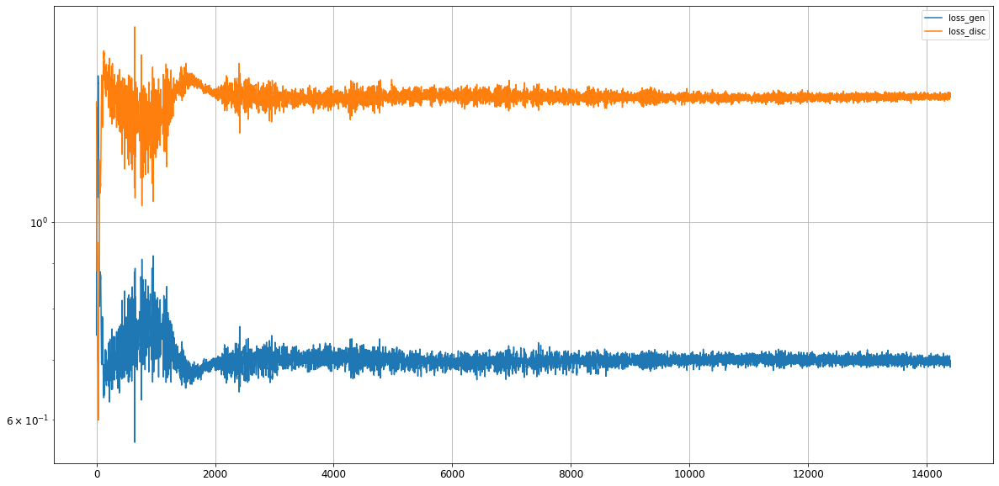

Epoch 14402/15000
0s
Epoch 14403/15000
0s
Epoch 14404/15000
0s
Epoch 14405/15000
0s
Epoch 14406/15000
0s
Epoch 14407/15000
0s
Epoch 14408/15000
0s
Epoch 14409/15000
0s
Epoch 14410/15000
0s
Epoch 14411/15000
0s
Epoch 14412/15000
0s
Epoch 14413/15000
0s
Epoch 14414/15000
0s
Epoch 14415/15000
0s
Epoch 14416/15000
0s
Epoch 14417/15000
0s
Epoch 14418/15000
0s
Epoch 14419/15000
0s
Epoch 14420/15000
0s
Epoch 14421/15000
0s
Epoch 14422/15000
0s
Epoch 14423/15000
0s
Epoch 14424/15000
0s
Epoch 14425/15000
0s
Epoch 14426/15000
0s
Epoch 14427/15000
0s
Epoch 14428/15000
0s
Epoch 14429/15000
0s
Epoch 14430/15000
0s
Epoch 14431/15000
0s
Epoch 14432/15000
0s
Epoch 14433/15000
0s
Epoch 14434/15000
0s
Epoch 14435/15000
0s
Epoch 14436/15000
0s
Epoch 14437/15000
0s
Epoch 14438/15000
0s
Epoch 14439/15000
0s
Epoch 14440/15000
0s
Epoch 14441/15000
0s
Epoch 14442/15000
0s
Epoch 14443/15000
0s
Epoch 14444/15000
0s
Epoch 14445/15000
0s
Epoch 14446/15000
0s
Epoch 14447/15000
0s
Epoch 14448/15000
0s
Epoch 14449/1

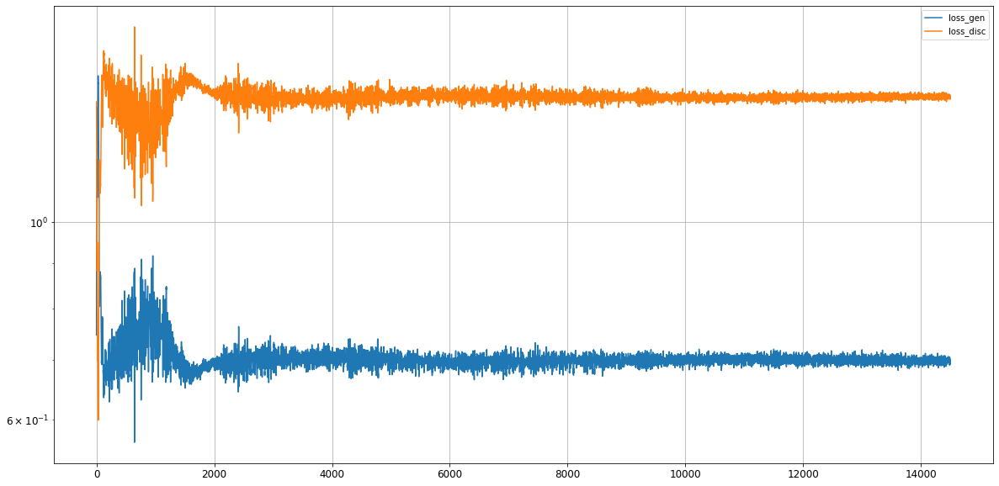

Epoch 14502/15000
0s
Epoch 14503/15000
0s
Epoch 14504/15000
0s
Epoch 14505/15000
0s
Epoch 14506/15000
0s
Epoch 14507/15000
0s
Epoch 14508/15000
0s
Epoch 14509/15000
0s
Epoch 14510/15000
0s
Epoch 14511/15000
0s
Epoch 14512/15000
0s
Epoch 14513/15000
0s
Epoch 14514/15000
0s
Epoch 14515/15000
0s
Epoch 14516/15000
0s
Epoch 14517/15000
0s
Epoch 14518/15000
0s
Epoch 14519/15000
0s
Epoch 14520/15000
0s
Epoch 14521/15000
0s
Epoch 14522/15000
0s
Epoch 14523/15000
0s
Epoch 14524/15000
0s
Epoch 14525/15000
0s
Epoch 14526/15000
0s
Epoch 14527/15000
0s
Epoch 14528/15000
0s
Epoch 14529/15000
0s
Epoch 14530/15000
0s
Epoch 14531/15000
0s
Epoch 14532/15000
0s
Epoch 14533/15000
0s
Epoch 14534/15000
0s
Epoch 14535/15000
0s
Epoch 14536/15000
0s
Epoch 14537/15000
0s
Epoch 14538/15000
0s
Epoch 14539/15000
0s
Epoch 14540/15000
0s
Epoch 14541/15000
0s
Epoch 14542/15000
0s
Epoch 14543/15000
0s
Epoch 14544/15000
0s
Epoch 14545/15000
0s
Epoch 14546/15000
0s
Epoch 14547/15000
0s
Epoch 14548/15000
0s
Epoch 14549/1

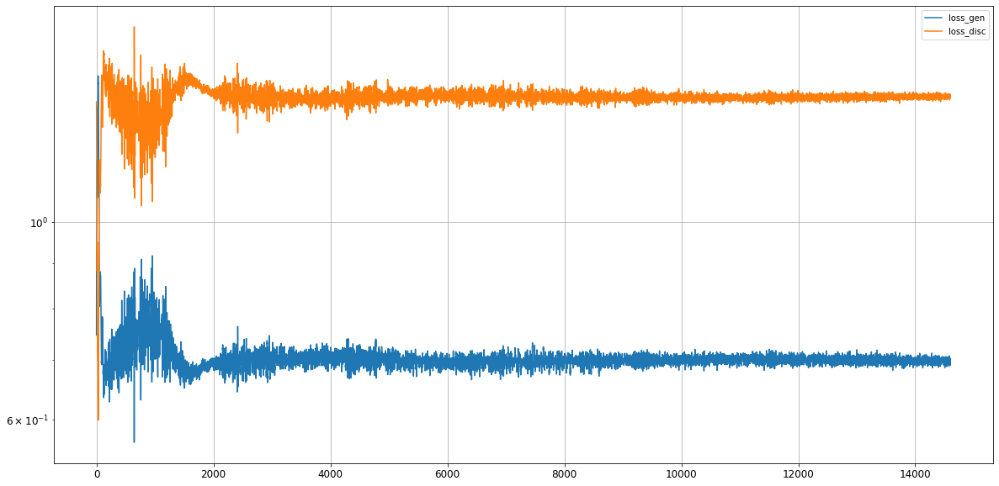

Epoch 14602/15000
0s
Epoch 14603/15000
0s
Epoch 14604/15000
0s
Epoch 14605/15000
0s
Epoch 14606/15000
0s
Epoch 14607/15000
0s
Epoch 14608/15000
0s
Epoch 14609/15000
0s
Epoch 14610/15000
0s
Epoch 14611/15000
0s
Epoch 14612/15000
0s
Epoch 14613/15000
0s
Epoch 14614/15000
0s
Epoch 14615/15000
0s
Epoch 14616/15000
0s
Epoch 14617/15000
0s
Epoch 14618/15000
0s
Epoch 14619/15000
0s
Epoch 14620/15000
0s
Epoch 14621/15000
0s
Epoch 14622/15000
0s
Epoch 14623/15000
0s
Epoch 14624/15000
0s
Epoch 14625/15000
0s
Epoch 14626/15000
0s
Epoch 14627/15000
0s
Epoch 14628/15000
0s
Epoch 14629/15000
0s
Epoch 14630/15000
0s
Epoch 14631/15000
0s
Epoch 14632/15000
0s
Epoch 14633/15000
0s
Epoch 14634/15000
0s
Epoch 14635/15000
0s
Epoch 14636/15000
0s
Epoch 14637/15000
0s
Epoch 14638/15000
0s
Epoch 14639/15000
0s
Epoch 14640/15000
0s
Epoch 14641/15000
0s
Epoch 14642/15000
0s
Epoch 14643/15000
0s
Epoch 14644/15000
0s
Epoch 14645/15000
0s
Epoch 14646/15000
0s
Epoch 14647/15000
0s
Epoch 14648/15000
0s
Epoch 14649/1

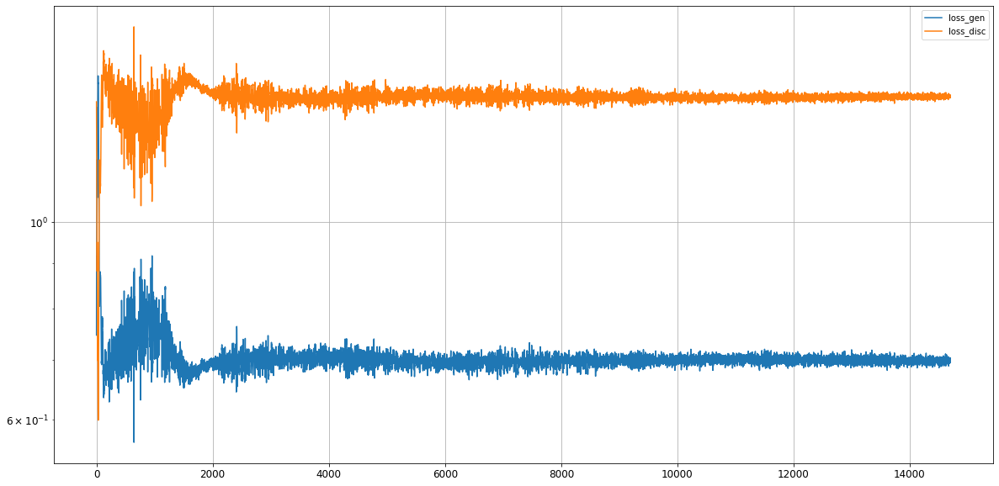

Epoch 14702/15000
0s
Epoch 14703/15000
0s
Epoch 14704/15000
0s
Epoch 14705/15000
0s
Epoch 14706/15000
0s
Epoch 14707/15000
0s
Epoch 14708/15000
0s
Epoch 14709/15000
0s
Epoch 14710/15000
0s
Epoch 14711/15000
0s
Epoch 14712/15000
0s
Epoch 14713/15000
0s
Epoch 14714/15000
0s
Epoch 14715/15000
0s
Epoch 14716/15000
0s
Epoch 14717/15000
0s
Epoch 14718/15000
0s
Epoch 14719/15000
0s
Epoch 14720/15000
0s
Epoch 14721/15000
0s
Epoch 14722/15000
0s
Epoch 14723/15000
0s
Epoch 14724/15000
0s
Epoch 14725/15000
0s
Epoch 14726/15000
0s
Epoch 14727/15000
0s
Epoch 14728/15000
0s
Epoch 14729/15000
0s
Epoch 14730/15000
0s
Epoch 14731/15000
0s
Epoch 14732/15000
0s
Epoch 14733/15000
0s
Epoch 14734/15000
0s
Epoch 14735/15000
0s
Epoch 14736/15000
0s
Epoch 14737/15000
0s
Epoch 14738/15000
0s
Epoch 14739/15000
0s
Epoch 14740/15000
0s
Epoch 14741/15000
0s
Epoch 14742/15000
0s
Epoch 14743/15000
0s
Epoch 14744/15000
0s
Epoch 14745/15000
0s
Epoch 14746/15000
0s
Epoch 14747/15000
0s
Epoch 14748/15000
0s
Epoch 14749/1

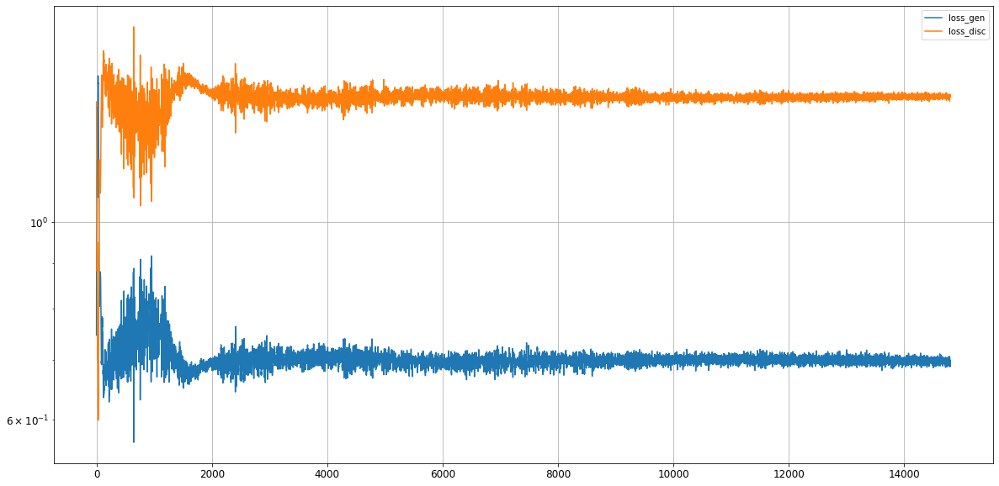

Epoch 14802/15000
0s
Epoch 14803/15000
0s
Epoch 14804/15000
0s
Epoch 14805/15000
0s
Epoch 14806/15000
0s
Epoch 14807/15000
0s
Epoch 14808/15000
0s
Epoch 14809/15000
0s
Epoch 14810/15000
0s
Epoch 14811/15000
0s
Epoch 14812/15000
0s
Epoch 14813/15000
0s
Epoch 14814/15000
0s
Epoch 14815/15000
0s
Epoch 14816/15000
0s
Epoch 14817/15000
0s
Epoch 14818/15000
0s
Epoch 14819/15000
0s
Epoch 14820/15000
0s
Epoch 14821/15000
0s
Epoch 14822/15000
0s
Epoch 14823/15000
0s
Epoch 14824/15000
0s
Epoch 14825/15000
0s
Epoch 14826/15000
0s
Epoch 14827/15000
0s
Epoch 14828/15000
0s
Epoch 14829/15000
0s
Epoch 14830/15000
0s
Epoch 14831/15000
0s
Epoch 14832/15000
0s
Epoch 14833/15000
0s
Epoch 14834/15000
0s
Epoch 14835/15000
0s
Epoch 14836/15000
0s
Epoch 14837/15000
0s
Epoch 14838/15000
0s
Epoch 14839/15000
0s
Epoch 14840/15000
0s
Epoch 14841/15000
0s
Epoch 14842/15000
0s
Epoch 14843/15000
0s
Epoch 14844/15000
0s
Epoch 14845/15000
0s
Epoch 14846/15000
0s
Epoch 14847/15000
0s
Epoch 14848/15000
0s
Epoch 14849/1

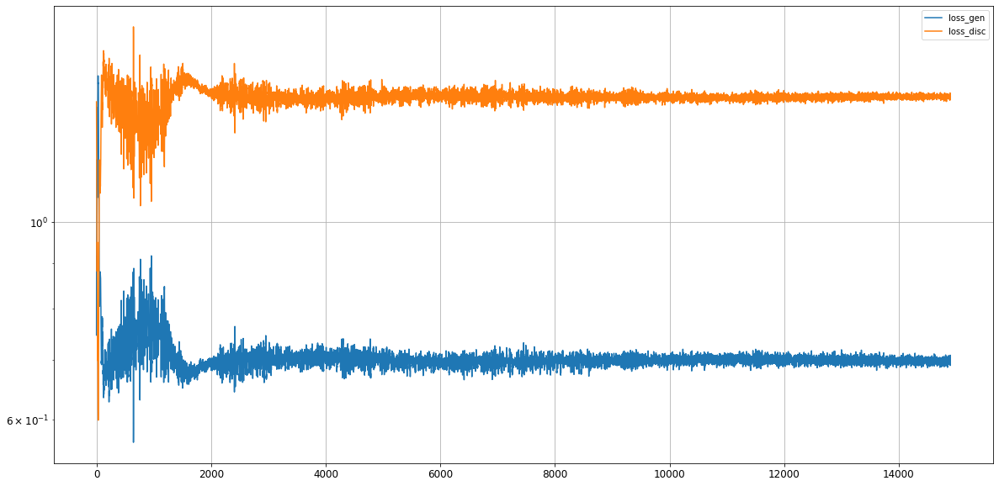

Epoch 14902/15000
0s
Epoch 14903/15000
0s
Epoch 14904/15000
0s
Epoch 14905/15000
0s
Epoch 14906/15000
0s
Epoch 14907/15000
0s
Epoch 14908/15000
0s
Epoch 14909/15000
0s
Epoch 14910/15000
0s
Epoch 14911/15000
0s
Epoch 14912/15000
0s
Epoch 14913/15000
0s
Epoch 14914/15000
0s
Epoch 14915/15000
0s
Epoch 14916/15000
0s
Epoch 14917/15000
0s
Epoch 14918/15000
0s
Epoch 14919/15000
0s
Epoch 14920/15000
0s
Epoch 14921/15000
0s
Epoch 14922/15000
0s
Epoch 14923/15000
0s
Epoch 14924/15000
0s
Epoch 14925/15000
0s
Epoch 14926/15000
0s
Epoch 14927/15000
0s
Epoch 14928/15000
0s
Epoch 14929/15000
0s
Epoch 14930/15000
0s
Epoch 14931/15000
0s
Epoch 14932/15000
0s
Epoch 14933/15000
0s
Epoch 14934/15000
0s
Epoch 14935/15000
0s
Epoch 14936/15000
0s
Epoch 14937/15000
0s
Epoch 14938/15000
0s
Epoch 14939/15000
0s
Epoch 14940/15000
0s
Epoch 14941/15000
0s
Epoch 14942/15000
0s
Epoch 14943/15000
0s
Epoch 14944/15000
0s
Epoch 14945/15000
0s
Epoch 14946/15000
0s
Epoch 14947/15000
0s
Epoch 14948/15000
0s
Epoch 14949/1

In [28]:
tic = time.time()

#hist = train(train_dataset, epochs=2000)
hist = train(train_dataset, epochs=15000)
#hist = train(train_dataset, epochs=250)
#hist = train(train_dataset, epochs=1000)
#hist = train(train_dataset, epochs=30000)

toc = time.time()
print ('\n\nTime : ', toc - tic, 'sec')

In [33]:
hist

[[0.7467868, 1.3657659],
 [0.8890731, 1.2726537],
 [0.91526175, 1.2302084],
 [0.91510034, 1.2071129],
 [0.9307092, 1.1713668],
 [0.9669133, 1.1229262],
 [1.003845, 1.0723678],
 [1.0343994, 1.0311675],
 [1.0661284, 0.9943595],
 [1.1358767, 0.9414771],
 [1.1652045, 0.9067251],
 [1.1762503, 0.88084483],
 [1.1305574, 0.89159983],
 [1.1069278, 0.9143353],
 [1.0653099, 0.9500906],
 [1.1156658, 0.91869545],
 [1.2235237, 0.8557763],
 [1.3101387, 0.75713557],
 [1.3453528, 0.69952315],
 [1.3168389, 0.6996531],
 [1.2763938, 0.7292437],
 [1.2803458, 0.74632627],
 [1.3114673, 0.73948103],
 [1.3516403, 0.70523816],
 [1.3588171, 0.6884332],
 [1.3912426, 0.663699],
 [1.4110317, 0.6449],
 [1.4441055, 0.6160134],
 [1.4607376, 0.6016522],
 [1.4302593, 0.6004649],
 [1.4350691, 0.59952193],
 [1.4223198, 0.5991995],
 [1.4211512, 0.6026407],
 [1.3885107, 0.6110614],
 [1.3717057, 0.6262682],
 [1.311868, 0.65595],
 [1.2679187, 0.6976881],
 [1.2313244, 0.7171057],
 [1.1995784, 0.7477913],
 [1.1677514, 0.7850942

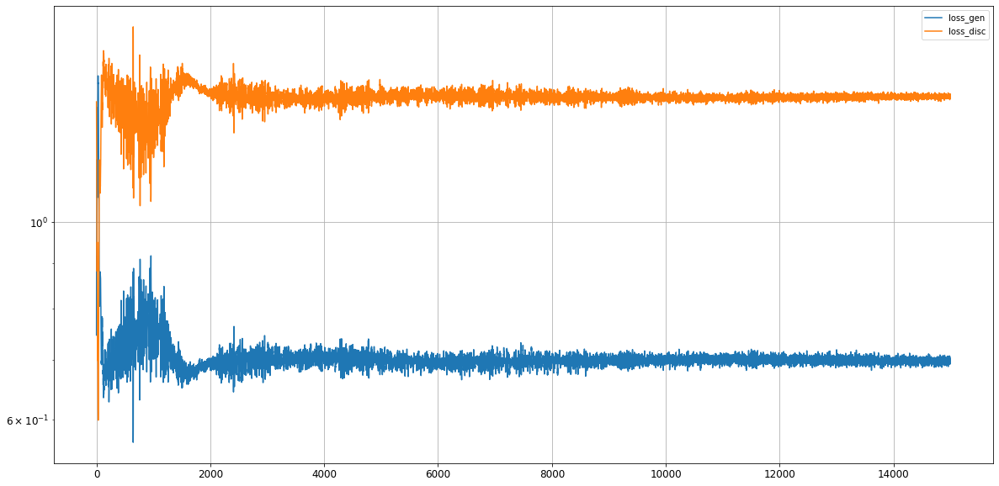

In [34]:
fig, ax = plt.subplots(1,1, figsize=[20,10])
ax.plot(hist)
ax.legend(['loss_gen', 'loss_disc'])
ax.set_yscale('log')
ax.grid()

#### Quick mode collapse check

In [35]:
noise_check1 = tf.random.normal([1, latent_space])
noise_check2 = tf.random.normal([1, latent_space])
generated_image1 = generator(noise_check1, training=False)
generated_image2 = generator(noise_check2, training=False)

#print(np.allclose(generated_image1, generated_image2))

assert(np.allclose(generated_image1, generated_image2) == False)

This save function saves:
- Architecture of the model, allowing to re-create the model
- Weights of the model
- Training configuration (loss, optimizer)
- The state of the optimizer, allowing to resume trainign exactly where left off

In [36]:
# checks to see if the file exists already.
# if not, the model is saved to disk

#if os.path.isfile('/content/gdrive/MyDrive/ACSE-9/models/GAN_arch_test2_model.h5') is False:
joblib.dump(scaler, '/content/gdrive/MyDrive/ACSE-9/models/scaler-gan_model1.pkl')
gan.save('/content/gdrive/MyDrive/ACSE-9/models/GAN_model1.h5')